<center>
    <h1><b>PaleoPredictive Modelling: Leveraging Machine Learning for Fossil Classification</b></h1>
</center>

![Alt text](PaleoPred.png)

### Executive Summary for PaleoPredictive Modelling: Leveraging Machine Learning for Fossil Species Classification

- **Project Overview**:
  - This study investigates the use of machine learning for the classification of dinosaur species based on fossil attributes.
  - The primary goal is to assess the feasibility and effectiveness of these models in palaeontological research, complementing traditional methods with advanced computational tools.

- **Research Question**:
  - **Key Question**: How can machine learning models be optimized to accurately predict dinosaur species based on fossil attributes, and what role do various features play in enhancing classification accuracy?

- **Dataset and Methodology**:
  - Data was sourced from the Measurement, Specimen, and Occurrence categories of the Palaeobiology Database.
  - A methodical approach was used for dataset integration, utilizing common identifiers such as `occurrence_no` and `specimen_no`.
  - Discrepancies were managed carefully to maintain data completeness and coherence due to the hierarchical nature of the data.
  - Univariate and multivariate analyses were conducted to explore the dataset’s characteristics, revealing significant skewness and complex hierarchical relationships.

- **Algorithm Development and Challenges**:
  - **Naive Bayes**:
    - Initial attempts to use a Naive Bayes algorithm failed due to the violation of the assumption of independence among features.
    - Despite applying Box-Cox and logarithmic transformations, the data remained skewed and non-normal.
  - **Decision Tree**:
    - Developed a Decision Tree model with feature selection and grid search, showing promising metrics but clear signs of overfitting in the learning curve.
    - Attempts to prune the tree in a second model led to a significant drop in performance metrics across the board.
  - **Random Forest**:
    - A Random Forest model was then attempted, which also showed promise but continued to display signs of overfitting.
  
- **Addressing Data Imbalance**:
  - Significant data imbalance was addressed using a hybrid approach of SMOTE and Undersampling, along with bootstrapping, to create a synthetically enhanced dataset.

- **Model Development with Enhanced Data**:
  - **K-Nearest Neighbors (KNN) Ensemble with Bagging**:
    - Developed a KNN ensemble with Bagging, showing perfect training and test results on the enhanced dataset.
  - **Second Decision Tree**:
    - Built a second Decision Tree model using the enhanced data, also showing perfect results during training and testing.
  
- **External Validation**:
  - All models were tested against previously unseen external data.
  - Despite promising results during training and testing, when compared to paleontologist performance, all models fell short.

- **Conclusion and Implications**:
  - The study highlights the potential of machine learning in palaeontology, but also underscores the challenges in achieving generalizable models.
  - The inability of the models to outperform paleontologists on unseen data suggests that further refinement, including more sophisticated techniques or better feature engineering, is necessary.
  - This research sets the stage for future work, emphasizing the need for continued exploration of how machine learning can be effectively integrated into palaeontological research to complement expert analysis.

## Foreword: Integrating Machine Learning into Palaeontology: Addressing Fossil Data Challenges

Palaeontology encounters significant uncertainties and challenges, extending beyond the mere discovery and identification of ancient fossils to the preservation and study of these invaluable specimens. Fossils often consist solely of skeletal remains, with soft tissues, organs, and other biological components of the original organism typically absent due to the processes of fossilisation (Dodson, 1990; Owen, 1840). This incomplete representation presents inherent difficulties in reconstructing the full biological and ecological profiles of ancient species (Carroll, 2001).

The limitations of fossil data are compounded by the challenge of extracting detailed information from these remains. While the external morphology of bones and teeth can be observed and analysed, gaining insights into internal structures requires methods that are often destructive. Techniques such as sectioning or CT scanning, although revealing, can be restricted to preserve the integrity of the fossil, as the only known specimen of a particular species might be damaged or destroyed in the process (Sander et al., 2008; Schur et al., 2014). Such restrictions are underscored by the potential risk of compromising the sole example of a species, which could impede future research and the discovery of additional specimens.

Moreover, the fossil record is inherently incomplete and biased. Fossilisation is a rare occurrence, with only a fraction of organisms becoming preserved and even fewer being discovered. Environmental factors, biological processes, and geological activities contribute to the uneven distribution and preservation of fossils (Smith, 2003; Peters & Foote, 2001). As a result, the available data often represents only a partial view of the ancient biosphere, with significant gaps in information about the behaviour, physiology, and interactions of extinct species (Gould, 1989).

In light of these challenges, the integration of machine learning into palaeontology presents a transformative opportunity. Machine learning techniques have the potential to revolutionise the field by uncovering patterns and relationships within fossil data that might be overlooked using traditional methods. By analysing extensive datasets, including skeletal measurements, geographical contexts, and other relevant variables, machine learning algorithms can identify complex patterns and correlations that enhance the understanding of species identity and characteristics. These techniques can aid in filling gaps in the fossil record, suggest new hypotheses, and provide insights that were previously inaccessible due to the limitations of conventional analysis methods (Hone, 2018; Falkingham et al., 2018). Machine learning not only augments traditional palaeontological methods but also offers innovative approaches to solving longstanding questions about extinct life forms.

To explore and harness these possibilities, the project titled PaleoPredictive Modelling: Leveraging Machine Learning for Fossil Species Classification seeks to evaluate the application of machine learning in palaeontological research. By developing predictive models based on available data, such as skeletal measurements and discovery characteristics, this study aims to demonstrate how advanced computational tools can complement traditional methods. The primary objective is to assess the feasibility and effectiveness of using machine learning to enhance the understanding of fossils, offering new insights into the ancient past despite the inherent limitations and uncertainties associated with fossil data.


## Step 1: Define the Problem or Question

Identify the Subject Matter:
The subject matter of the current project revolves around leveraging machine learning techniques to predict dinosaur species from fossil data. The dataset includes various features such as fossil measurements, taxonomic classifications, and geographical information, which are essential for building accurate predictive models.

Potential Questions:

1.	What are the most significant features influencing the prediction of dinosaur species from fossil data?
2.	How effective are different machine learning models in classifying dinosaur species based on the available features?
3.	How does the inclusion of additional attributes, such as preservation quality and geographic location, impact the accuracy of species classification?
4.	What are the patterns and distributions of overall age estimates across different dinosaur species in the dataset?

Actual Question:
The primary question that should be addressed in this project is:

- How can machine learning models be optimised to accurately predict dinosaur species based on fossil attributes, and what role do various features play in enhancing classification accuracy?

This question focuses on applying machine learning to the dataset to improve species classification. It also seeks to understand the impact of different features on model performance, guiding the development of robust predictive tools for palaeontological research.

# Step 2: Find the Data

### Dinosaur Fossil Dataset

- **Abstract:** Data collected from the Paleobiology Database, detailing the characteristics and classifications of dinosaur fossils.
- Date Collected: 3rd July 2024
- Data Source: Paleobiology Database
- Curator/Researcher: David J. Bottjer, Carole J. Lee
- Institution: University of Chicago, University of California, Berkeley, University of Southern California
- Location: United States
- Citation Request:
NOTE: Reuse of this dataset is permitted with proper attribution to the Paleobiology Database. When citing the database, you may use the following reference:
Paleobiology Database - The Paleobiology Database: A scientific database for the study of the history of life on Earth.
https://paleobiodb.org/#/

# Step 3: Read the Data
- Read the data
- Perform some basic structural cleaning to facilitate the work

## Import the relevant libraries

In [1]:
# Data Manipulation
import numpy as np  # Fundamental package for scientific computing with Python
import pandas as pd  # Data manipulation and analysis

# Data Visualisation
import matplotlib.pyplot as plt  # Plotting library for creating static, animated, and interactive visualizations
import seaborn as sns  # Statistical data visualization library based on matplotlib
import plotly.express as px  # High-level interface for Plotly to create interactive visualizations
from sklearn.tree import plot_tree  # Plot visualization of decision tree models
import os  # Module for interacting with the operating system, used here for creating directories and handling file paths

# Location Data
from geopy.exc import GeocoderTimedOut, GeocoderServiceError  # Exception handling for geocoding operations
from geopy.geocoders import Nominatim  # Geocoder for imputing missing location data using coordinate data
import geopandas as gpd  # Extends pandas to allow spatial operations on geometric types

# Statistical Analysis
from scipy.stats import kurtosis, skew, shapiro, norm  # Statistical functions for assessing the distribution of data
from scipy.stats import chi2_contingency  # For evaluating independence in contingency tables
from scipy.stats import boxcox  # For Box-Cox transformation to stabilize variance and make data more normal

# Categorical Data Analysis
from sklearn.preprocessing import LabelEncoder  # Encoding categorical variables as numerical labels
from sklearn.preprocessing import OneHotEncoder  # One-hot encoding of categorical features to create binary vectors

# Numeric Data Analysis
from sklearn.preprocessing import MinMaxScaler  # Standardize feature scores to a range [0, 1] for comparison
from sklearn.preprocessing import StandardScaler  # Standardize numeric features to have mean 0 and standard deviation 1
from scipy.stats import zscore  # For calculating z-scores to detect outliers

# Machine Learning
from sklearn.neighbors import KNeighborsClassifier  # k-Nearest Neighbours classifier for classification tasks
from sklearn.tree import DecisionTreeClassifier  # Decision Tree classifier for classification and regression tasks
from sklearn.model_selection import cross_val_score  # Evaluate model performance using cross-validation
from sklearn.model_selection import train_test_split, learning_curve  # Split data into training and testing sets, and plot learning curves
from sklearn.metrics import (accuracy_score, classification_report, precision_score, mean_squared_error, confusion_matrix, recall_score, f1_score, auc, roc_auc_score, roc_curve)  # Metrics for evaluating model performance
from sklearn.ensemble import RandomForestClassifier  # Random Forest classifier for robust ensemble learning
from sklearn.model_selection import LeaveOneOut  # Leave-One-Out Cross-Validation (LOOCV) for model evaluation
from sklearn.ensemble import BaggingClassifier # Implements Bagging for ensemble learning.
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV # for hyper parameter tuning

# Imbalanced Data Handling
from imblearn.over_sampling import SMOTE  # Synthetic Minority Over-sampling Technique to balance class distribution
from imblearn.under_sampling import RandomUnderSampler  # Random undersampling to reduce the size of the majority class
import statsmodels.api as sm # Power analysis for sample sizes

# Feature Selection
from sklearn.feature_selection import SelectFromModel  # Feature selection based on the importance of features in a model
from sklearn.feature_selection import chi2, SelectKBest  # Feature selection using chi-squared test and top k features

# Misc
from collections import Counter #a specialized dictionary designed to count hashable objects in an iterable.

from sklearn.preprocessing import label_binarize


/Users/james_smith/Library/Python/3.9/lib/python/site-packages/urllib3/__init__.py:35: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


#### Import Data

In [2]:
dino_occur = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/Dino_Occur.csv'
dino_measure = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/Dino_Measure.csv'
dino_specimens = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/Dino_specimen.csv'

# Load data with low_memory=False
df_occur = pd.read_csv(dino_occur, low_memory=False)
df_measure = pd.read_csv(dino_measure, low_memory=False)
df_specimens = pd.read_csv(dino_specimens, low_memory=False)


### Data Acquisition and Methodology: Building a Foundation for Predictive Modelling

The data for this study were sourced from the Palaeobiology Database, a comprehensive and widely utilised repository providing extensive records of global fossil occurrences and associated metadata (Palaeobiology Database, 2024). This database is a crucial resource for palaeontological research, offering detailed information on fossil specimens, their geographic locations, and temporal contexts, which supports a wide range of palaeobiological analyses.

Data were collected from three primary categories within the Palaeobiology Database. The first category, Specimens, includes detailed records of individual fossil specimens, encompassing specimen identifiers, taxonomic classifications, and associated measurements. This information is essential for understanding the specific attributes and classifications of each fossil.

The second category, Occurrences, documents fossil occurrences at specific geographic locations and stratigraphic intervals, detailing the places and times where fossils were discovered. This data is critical for analysing the spatial and temporal distribution of fossils.

The third category, Measurements, comprises quantitative data related to each specimen, including metrics such as size, weight, and other morphological characteristics. These measurements are fundamental for analysing variations in fossil morphology and for developing predictive models.

Each of these categories provides valuable insights into the fossil record, supporting analyses of species distribution, morphological variation, and palaeoecological trends.

Following data collection, a thorough process of data inspection, merging, and refinement was conducted. This process involved reconciling inconsistencies, addressing missing values, and ensuring the integrity of the dataset across all sources. The goal was to produce a cleaned and cohesive dataset tailored to the study’s requirements. This refined dataset serves as a robust foundation for subsequent analyses and interpretations concerning species distributions, evolutionary trends, and ecological dynamics derived from the fossil record.

In [3]:
# Setting global display options for readability of wide outputs
pd.set_option('display.max_columns', None)

Setting low_memory=False in the pd.read_csv() function tells pandas to process the CSV file in one go instead of in chunks. By default, pandas tries to infer data types by loading the file in chunks to optimize memory usage, but this can lead to warnings about mixed types if some chunks contain inconsistent data types. 

#### Data Load Check

In [4]:
# Set Display options for readability 
pd.set_option('display.expand_frame_repr', False)

# Display the first few rows of each DataFrame to confirm successful loading
print("Occurrences DataFrame:")
print(df_occur.head())

print("\nMeasurements DataFrame:")
print(df_measure.head())

print("\nSpecimens DataFrame:")
print(df_specimens.head())

Occurrences DataFrame:
   occurrence_no record_type  reid_no flags  collection_no                             identified_name identified_rank  identified_no   difference              accepted_name  accepted_attr   accepted_rank  accepted_no     early_interval   late_interval  max_ma  min_ma         ref_author  ref_pubyr  reference_no    phylum         class               order               family              genus  plant_organ  plant_organ2  abund_value abund_unit         lng        lat occurrence_comments                                  collection_name  collection_subset                                     collection_aka  cc     state    county             latlng_basis latlng_precision         geogscale                                       geogcomments paleomodel geoplate paleoage  paleolng  paleolat paleomodel2 geoplate2 paleoage2  paleolng2  paleolat2 paleomodel3 geoplate3 paleoage3  paleolng3  paleolat3 cc.1 protected    formation stratgroup       member     stratscale zone loc

#### Inspect Variables contained within each data set

In [5]:
# List columns to identify potential common columns for merging
print("Dinosaur Occurrences columns:", df_occur.columns)
print("Dinosaur Measurements columns:", df_measure.columns)
print("Dinosaur Specimens columns:", df_specimens.columns)

Dinosaur Occurrences columns: Index(['occurrence_no', 'record_type', 'reid_no', 'flags', 'collection_no',
       'identified_name', 'identified_rank', 'identified_no', 'difference',
       'accepted_name',
       ...
       'vision', 'diet', 'reproduction', 'ontogeny', 'ecospace_comments',
       'composition', 'architecture', 'thickness', 'reinforcement', 'genus.1'],
      dtype='object', length=132)
Dinosaur Measurements columns: Index(['measurement_no', 'specimen_no', 'record_type', 'n_measured',
       'position', 'measurement_type', 'average', 'min', 'max'],
      dtype='object')
Dinosaur Specimens columns: Index(['specimen_no', 'record_type', 'flags', 'occurrence_no', 'reid_no',
       'collection_no', 'specimen_id', 'is_type', 'specelt_no',
       'specimen_side', 'specimen_part', 'specimen_sex', 'n_measured',
       'measurement_source', 'magnification', 'comments', 'identified_name',
       'identified_rank', 'identified_no', 'difference', 'accepted_name',
       'accepted_ran

# Data wrangling and cleaning

### Data Preparation: Strategies for Wrangling and Refining Palaeontological Datasets

Following the acquisition of data from the Palaeobiology Database, the next critical phase was data preparation. This process was essential for transforming the data into a structured format that facilitates accurate analysis. For the current analysis data preparation encompassed several key activities, data wrangling, and data cleaning. Data Wrangling is a process which involves the transformation and integration of data from various sources into a consistent format. This includes converting data types, merging datasets, and restructuring information to align with analytical needs. Effective data wrangling ensures that the data is standardized and ready for further analysis (Kandel et al., 2011). On the other hand, data cleaning focuses on rectifying errors and inconsistencies within the data. This includes addressing missing values, correcting inaccuracies, and removing duplicates. Proper data cleaning is crucial for enhancing the quality and reliability of the dataset, ensuring that the analysis yields accurate and meaningful results (Cheng et al., 2017). Together, these steps—data wrangling, profiling, and cleaning—prepare the dataset for robust analysis. This comprehensive approach supports the development of predictive models and enhances the understanding of patterns within palaeontological data.

For the current dataset initially, data from the Measurement, Specimen, and Occurrence categories were sourced and integrated. This step involved defining and downloading the relevant data from the Palaeobiology Database. Upon examination, it became evident that direct merging of these datasets was not feasible. Instead, a methodical approach was adopted, utilising common identifiers such as ‘occurrence_no’ and ‘specimen_no’ to achieve a coherent integration of the datasets.

The merging process revealed substantial discrepancies between the original and merged datasets. These disparities were attributed to the hierarchical nature of the data, which includes complex one-to-many relationships among occurrences, specimens, and measurements. Careful merging was essential to maintain data completeness and coherence, with built-in checks ensuring that no entries were omitted.

Due to the merging of data, it was identified that certain occurrences lacked associated measurements, rendering them irrelevant to the current objective. These occurrences, which did not include fossil measurements, were excluded from further analysis to focus exclusively on specimens for which species identification could be inferred from measurable fossil data. This exclusion was crucial for ensuring that the analysis remained focused on valid data directly related to fossils.




#### Data Merge

Upon careful examination, it was determined that merging the data from three distinct files into a unified dataset was achievable by leveraging ‘occurrence_no’ and subsequently ‘specimen_no’.

In [6]:
# Merge Occurrences and Specimens DataFrames on 'occurrence_no'
merged_occur_specimens = pd.merge(df_occur, df_specimens, on='occurrence_no', how='outer')

# Merge the resulting DataFrame with Measurements DataFrame on 'specimen_no'
final_merged_df = pd.merge(merged_occur_specimens, df_measure, on='specimen_no', how='outer')

In [7]:
# Check the number of unique occurrences and specimens in the original DataFrames
unique_occurrences_occur = df_occur['occurrence_no'].nunique()
unique_specimens_specimens = df_specimens['specimen_no'].nunique()
unique_measurements_measure = df_measure['specimen_no'].nunique()

print(f"Number of unique occurrences in df_occur: {unique_occurrences_occur}")
print(f"Number of unique specimens in df_specimens: {unique_specimens_specimens}")
print(f"Number of unique measurements in df_measure: {unique_measurements_measure}")

# Validate merging by checking unique counts post merge
unique_occurrences_final = final_merged_df['occurrence_no'].nunique()
unique_specimens_final = final_merged_df['specimen_no'].nunique()

print(f"Number of unique occurrences in final_merged_df: {unique_occurrences_final}")
print(f"Number of unique specimens in final_merged_df: {unique_specimens_final}")

# Identify potential missing occurrences or specimens
missing_occurrences = set(df_occur['occurrence_no']) - set(final_merged_df['occurrence_no'])
missing_specimens = set(df_specimens['specimen_no']) - set(final_merged_df['specimen_no'])

print(f"Number of missing occurrences in final_merged_df: {len(missing_occurrences)}")
print(f"Number of missing specimens in final_merged_df: {len(missing_specimens)}")

# Display missing occurrences and specimens if any
if missing_occurrences:
    print(f"Missing occurrences: {missing_occurrences}")
else:
    print("No missing occurrences in final_merged_df.")

if missing_specimens:
    print(f"Missing specimens: {missing_specimens}")
else:
    print("No missing specimens in final_merged_df.")

Number of unique occurrences in df_occur: 21016
Number of unique specimens in df_specimens: 2110
Number of unique measurements in df_measure: 2110
Number of unique occurrences in final_merged_df: 21016
Number of unique specimens in final_merged_df: 2110
Number of missing occurrences in final_merged_df: 0
Number of missing specimens in final_merged_df: 0
No missing occurrences in final_merged_df.
No missing specimens in final_merged_df.


#### Inspect the newly created data

In [8]:
final_merged_df.columns.tolist()

['occurrence_no',
 'record_type_x',
 'reid_no_x',
 'flags_x',
 'collection_no_x',
 'identified_name_x',
 'identified_rank_x',
 'identified_no_x',
 'difference_x',
 'accepted_name_x',
 'accepted_attr',
 'accepted_rank_x',
 'accepted_no_x',
 'early_interval',
 'late_interval',
 'max_ma_x',
 'min_ma_x',
 'ref_author',
 'ref_pubyr',
 'reference_no_x',
 'phylum',
 'class',
 'order',
 'family',
 'genus',
 'plant_organ',
 'plant_organ2',
 'abund_value',
 'abund_unit',
 'lng_x',
 'lat_x',
 'occurrence_comments',
 'collection_name',
 'collection_subset',
 'collection_aka',
 'cc_x',
 'state_x',
 'county_x',
 'latlng_basis_x',
 'latlng_precision_x',
 'geogscale_x',
 'geogcomments_x',
 'paleomodel',
 'geoplate',
 'paleoage',
 'paleolng',
 'paleolat',
 'paleomodel2',
 'geoplate2',
 'paleoage2',
 'paleolng2',
 'paleolat2',
 'paleomodel3',
 'geoplate3',
 'paleoage3',
 'paleolng3',
 'paleolat3',
 'cc.1',
 'protected',
 'formation',
 'stratgroup',
 'member',
 'stratscale',
 'zone',
 'localsection',
 'l

#### Retain Variables with relevance to our overall objective
Selecting a subset of variables from the dataset, excluding those containing comments and references, to focus specifically on variables pertinent to our research objectives

Following the merging process, a meticulous inspection was conducted to retain only those variables pertinent to the research objectives. This involved excluding variables with non-essential information, such as comments and references. Additionally, duplicate variables across datasets were identified and resolved. For instance, coordinate data (latitude and longitude) were consolidated into single variables following consistency checks, while exceptions were made for columns with shorthand notations essential for preserving detailed information.

In [9]:
columns_to_retain = [
    'occurrence_no', 'specimen_no', 'identified_name_x', 'identified_rank_x', 'accepted_name_x', 'accepted_rank_x', 
    'early_interval', 'late_interval', 'max_ma_x', 'min_ma_x', 'phylum','class','order', 'family', 'genus', 'lng_x',
    'lat_x', 'cc_x','state_x', 'county_x', 'paleoage', 'paleolng', 'paleolat', 'paleoage2', 'paleolng2', 'paleolat2', 
    'paleoage3', 'paleolng3', 'paleolat3','cc.1', 'formation', 'stratscale', 'lithology1', 'lithology2', 'environment', 
    'assembl_comps', 'pres_mode', 'preservation_quality','fragmentation','taxon_environment', 'motility', 'life_habit',
    'vision', 'diet', 'reproduction', 'composition', 'genus.1', 'specimen_id', 'is_type', 'specimen_part', 'n_measured_x',
    'identified_name_y', 'identified_rank_y', 'accepted_name_y', 'accepted_rank_y', 'max_ma_y', 'min_ma_y', 'lng_y', 'lat_y',
    'cc_y', 'state_y', 'county_y', 'n_measured_y', 'measurement_type', 'average'
    ]

In [10]:
# Create DataFrame with selected columns
df = final_merged_df[columns_to_retain].copy()

# Display the head of the new DataFrame
print("Head of the Dinosaur DataFrame:")
print(df.head())
print(type(df))

Head of the Dinosaur DataFrame:
   occurrence_no  specimen_no                      identified_name_x identified_rank_x         accepted_name_x accepted_rank_x     early_interval    late_interval  max_ma_x  min_ma_x    phylum       class               order               family             genus      lng_x      lat_x cc_x  state_x county_x paleoage  paleolng  paleolat paleoage2  paleolng2  paleolat2 paleoage3  paleolng3  paleolat3 cc.1   formation stratscale    lithology1 lithology2  environment             assembl_comps pres_mode preservation_quality fragmentation taxon_environment              motility                 life_habit  vision       diet                                 reproduction     composition           genus.1 specimen_id   is_type specimen_part  n_measured_x       identified_name_y identified_rank_y         accepted_name_y accepted_rank_y  max_ma_y  min_ma_y      lng_y      lat_y cc_y  state_y county_y  n_measured_y measurement_type  average
0         489976      13134

#### Check duplicate variables from merge 

In [11]:
# Check if max_ma_x equals max_ma_y
max_ma_equal = df['max_ma_x'].equals(df['max_ma_y'])
print(f"max_ma_x equals max_ma_y: {max_ma_equal}")

# Check if min_ma_x equals min_ma_y
min_ma_equal = df['min_ma_x'].equals(df['min_ma_y'])
print(f"min_ma_x equals min_ma_y: {min_ma_equal}")

# Check if cc_x equals cc_y and cc.1
cc_equal = df['cc_x'].equals(df['cc_y']) and df['cc_x'].equals(df['cc.1'])
print(f"cc_x equals cc_y and cc.1: {cc_equal}")

# Check if state_x equals state_y
state_equal = df['state_x'].equals(df['state_y'])
print(f"state_x equals state_y: {state_equal}")

# Check if n_measured_x equals n_measured_y
n_measured_equal = df['n_measured_x'].equals(df['n_measured_y'])
print(f"n_measured_x equals n_measured_y: {n_measured_equal}")

# Check if identified_name_x equals identified_name_y
identified_name_equal = df['identified_name_x'].equals(df['identified_name_y'])
print(f"identified_name_x equals identified_name_y: {identified_name_equal}")

# Check if identified_rank_x equals identified_rank_y
identified_rank_equal = df['identified_rank_x'].equals(df['identified_rank_y'])
print(f"identified_rank_x equals identified_rank_y: {identified_rank_equal}")

# Check if accepted_name_x equals accepted_name_y
accepted_name_equal = df['accepted_name_x'].equals(df['accepted_name_y'])
print(f"accepted_name_x equals accepted_name_y: {accepted_name_equal}")

# Check if accepted_rank_x equals accepted_rank_y
accepted_rank_equal = df['accepted_rank_x'].equals(df['accepted_rank_y'])
print(f"accepted_rank_x equals accepted_rank_y: {accepted_rank_equal}")

# Check if lng_x equals lng_y
lng_equal = df['lng_x'].equals(df['lng_y'])
print(f"lng_x equals lng_y: {lng_equal}")

# Check if lat_x equals lat_y
lat_equal = df['lat_x'].equals(df['lat_y'])
print(f"lat_x equals lat_y: {lat_equal}")

max_ma_x equals max_ma_y: False
min_ma_x equals min_ma_y: False
cc_x equals cc_y and cc.1: False
state_x equals state_y: False
n_measured_x equals n_measured_y: True
identified_name_x equals identified_name_y: False
identified_rank_x equals identified_rank_y: False
accepted_name_x equals accepted_name_y: False
accepted_rank_x equals accepted_rank_y: False
lng_x equals lng_y: False
lat_x equals lat_y: False


In [12]:
# max_ma_x vs max_ma_y
mismatch_max_ma = df[df['max_ma_x'] != df['max_ma_y']]
print(mismatch_max_ma[['occurrence_no', 'max_ma_x', 'max_ma_y']])

# min_ma_x vs min_ma_y
mismatch_min_ma = df[df['min_ma_x'] != df['min_ma_y']]
print(mismatch_min_ma[['occurrence_no', 'min_ma_x', 'min_ma_y']])

# cc_x vs cc_y and cc.1
mismatch_cc = df[(df['cc_x'] != df['cc_y']) & 
                 (df['cc_x'] != df['cc.1'])]
print(mismatch_cc[['occurrence_no', 'cc_x', 'cc_y', 'cc.1']])

# state_x vs state_y
mismatch_state = df[df['state_x'] != df['state_y']]
print(mismatch_state[['occurrence_no', 'state_x', 'state_y']])

# identified_name_x vs identified_name_y
mismatch_identified_name = df[df['identified_name_x'] != df['identified_name_y']]
print(mismatch_identified_name[['occurrence_no', 'identified_name_x', 'identified_name_y']])

# identified_rank_x vs identified_rank_y
mismatch_identified_rank = df[df['identified_rank_x'] != df['identified_rank_y']]
print(mismatch_identified_rank[['occurrence_no', 'identified_rank_x', 'identified_rank_y']])

# accepted_name_x vs accepted_name_y
mismatch_accepted_name = df[df['accepted_name_x'] != df['accepted_name_y']]
print(mismatch_accepted_name[['occurrence_no', 'accepted_name_x', 'accepted_name_y']])

# accepted_rank_x vs accepted_rank_y
mismatch_accepted_rank = df[df['accepted_rank_x'] != df['accepted_rank_y']]
print(mismatch_accepted_rank[['occurrence_no', 'accepted_rank_x', 'accepted_rank_y']])

# lng_x vs lng_y
mismatch_lng = df[df['lng_x'] != df['lng_y']]
print(mismatch_lng[['occurrence_no', 'lng_x', 'lng_y']])

# lat_x vs lat_y
mismatch_lat = df[df['lat_x'] != df['lat_y']]
print(mismatch_lat[['occurrence_no', 'lat_x', 'lat_y']])

       occurrence_no  max_ma_x  max_ma_y
2747          137486     83.60       NaN
2748          138867    145.00       NaN
2749          139249     83.60       NaN
2750          139250     83.60       NaN
2751          139251     83.60       NaN
...              ...       ...       ...
23256        1657972    125.77       NaN
23257        1658308     83.60       NaN
23258        1658575    100.50       NaN
23259        1658578     86.30       NaN
23260        1659346    161.50       NaN

[20514 rows x 3 columns]
       occurrence_no  min_ma_x  min_ma_y
2747          137486      72.1       NaN
2748          138867     113.0       NaN
2749          139249      72.1       NaN
2750          139250      72.1       NaN
2751          139251      72.1       NaN
...              ...       ...       ...
23256        1657972     119.5       NaN
23257        1658308      72.1       NaN
23258        1658575      89.8       NaN
23259        1658578      83.6       NaN
23260        1659346     145.0 

The observed discrepancies arise from pairs of variables that were intended to represent the same information but show differences between columns originating from distinct original data files. In most cases, one variable was defined in one file but was null in the other, despite referring to the same entry. Consequently, we opted to improve data consistency and completeness by replacing missing values (NaN) in one column with corresponding valid entries from its counterpart. This approach aims to harmonize dataset integrity across these specific column pairs

In [13]:
# Replace NaN values in max_ma_y with values from max_ma_x where max_ma_y is NaN
df['max_ma_y'].fillna(df['max_ma_x'])

# Replace NaN values in min_ma_y with values from min_ma_x where min_ma_y is NaN
df['min_ma_y'].fillna(df['min_ma_x'])

# Replace NaN values in cc_y with values from cc_x where cc_y is NaN
df['cc_y'].fillna(df['cc_x'])

# Replace NaN values in cc.1 with values from cc_x where cc.1 is NaN
df['cc.1'].fillna(df['cc_x'])

# Replace NaN values in state_y with values from state_x where state_y is NaN
df['state_y'].fillna(df['state_x'])

# Replace NaN values in identified_name_y with values from identified_name_x where identified_name_y is NaN
df['identified_name_y'].fillna(df['identified_name_x'])

# Replace NaN values in identified_rank_y with values from identified_rank_x where identified_rank_y is NaN
df['identified_rank_y'].fillna(df['identified_rank_x'])

# Replace NaN values in accepted_name_y with values from accepted_name_x where accepted_name_y is NaN
df['accepted_name_y'].fillna(df['accepted_name_x'])

# Replace NaN values in accepted_rank_y with values from accepted_rank_x where accepted_rank_y is NaN
df['accepted_rank_y'].fillna(df['accepted_rank_x'])

# Replace NaN values in lng_y with values from lng_x where lng_y is NaN
df['lng_y'].fillna(df['lng_x'])

# Replace NaN values in lat_y with values from lat_x where lat_y is NaN
df['lat_y'].fillna(df['lat_x'])

# Replace NaN values in preservation_quality with values from fragmentation where preservation_quality is NaN
df['preservation_quality'].fillna(df['fragmentation'])

0             good
1             good
2             good
3             good
4             good
           ...    
23256    excellent
23257         good
23258         good
23259         good
23260         good
Name: preservation_quality, Length: 23261, dtype: object

In [14]:
# Check if max_ma_x equals max_ma_y
max_ma_equal = df['max_ma_x'].equals(df['max_ma_y'])
print(f"max_ma_x equals max_ma_y: {max_ma_equal}")

# Check if min_ma_x equals min_ma_y
min_ma_equal = df['min_ma_x'].equals(df['min_ma_y'])
print(f"min_ma_x equals min_ma_y: {min_ma_equal}")

# Check if cc_x equals cc_y and cc.1
cc_equal = df['cc_x'].equals(df['cc_y']) and \
           df['cc_x'].equals(df['cc.1'])
print(f"cc_x equals cc_y and cc.1: {cc_equal}")

# Check if state_x equals state_y
state_equal = df['state_x'].equals(df['state_y'])
print(f"state_x equals state_y: {state_equal}")

# Check if n_measured_x equals n_measured_y
n_measured_equal = df['n_measured_x'].equals(df['n_measured_y'])
print(f"n_measured_x equals n_measured_y: {n_measured_equal}")

# Check if identified_name_x equals identified_name_y
identified_name_equal = df['identified_name_x'].equals(df['identified_name_y'])
print(f"identified_name_x equals identified_name_y: {identified_name_equal}")

# Check if identified_rank_x equals identified_rank_y
identified_rank_equal = df['identified_rank_x'].equals(df['identified_rank_y'])
print(f"identified_rank_x equals identified_rank_y: {identified_rank_equal}")

# Check if accepted_name_x equals accepted_name_y
accepted_name_equal = df['accepted_name_x'].equals(df['accepted_name_y'])
print(f"accepted_name_x equals accepted_name_y: {accepted_name_equal}")

# Check if accepted_rank_x equals accepted_rank_y
accepted_rank_equal = df['accepted_rank_x'].equals(df['accepted_rank_y'])
print(f"accepted_rank_x equals accepted_rank_y: {accepted_rank_equal}")

# Check if lng_x equals lng_y
lng_equal = df['lng_x'].equals(df['lng_y'])
print(f"lng_x equals lng_y: {lng_equal}")

# Check if lat_x equals lat_y
lat_equal = df['lat_x'].equals(df['lat_y'])
print(f"lat_x equals lat_y: {lat_equal}")

max_ma_x equals max_ma_y: False
min_ma_x equals min_ma_y: False
cc_x equals cc_y and cc.1: False
state_x equals state_y: False
n_measured_x equals n_measured_y: True
identified_name_x equals identified_name_y: False
identified_rank_x equals identified_rank_y: False
accepted_name_x equals accepted_name_y: False
accepted_rank_x equals accepted_rank_y: False
lng_x equals lng_y: False
lat_x equals lat_y: False


In [15]:
# identified_name_x vs identified_name_y
mismatch_identified_name = df[df['identified_name_x'] != df['identified_name_y']]
print(mismatch_identified_name[['occurrence_no', 'identified_name_x', 'identified_name_y']])

       occurrence_no                        identified_name_x       identified_name_y
0             489976    n. gen. Futalognkosaurus n. sp. dukei  Futalognkosaurus dukei
1             475222    n. gen. Elaphrosaurus n. sp. bambergi  Elaphrosaurus bambergi
2             475222    n. gen. Elaphrosaurus n. sp. bambergi  Elaphrosaurus bambergi
3             475222    n. gen. Elaphrosaurus n. sp. bambergi  Elaphrosaurus bambergi
4             475222    n. gen. Elaphrosaurus n. sp. bambergi  Elaphrosaurus bambergi
...              ...                                      ...                     ...
23256        1657972                       Jeholosaurus ? sp.                     NaN
23257        1658308  n. gen. Lokiceratops n. sp. rangiformis                     NaN
23258        1658575         n. gen. Chakisaurus n. sp. nekul                     NaN
23259        1658578                         Sauropoda indet.                     NaN
23260        1659346         Dromaeosauridae NGMC-91 i

The persisting discrepancies primarily concern the utilisation of scientific shorthand in the identified name variables within a dataset. Addressing these discrepancies necessitates an alternative strategy for resolution. Currently, our priority remains centred on establishing a singular authoritative source of data for this project.

#### Condensing Duplicate Variables
After verifying that the data in the identified duplicate variable pairs is consistent and matches, the dataset’s dimensionality can be reduced by removing one variable from each duplicate pair.

In [16]:
# Rename variables and drop redundant columns
df.rename(columns={
    'max_ma_x': 'max_ma',
    'min_ma_x': 'min_ma',
    'cc_x': 'Country',
    'state_x': 'state',
    'n_measured_x': 'n_measurements',
    'identified_rank_x': 'identified_rank',
    'accepted_name_x': 'accepted_name',
    'accepted_rank_x': 'accepted_rank',
    'lng_x': 'longitude',
    'lat_x': 'latitude'
}, inplace=True)

# Drop redundant columns
df.drop(columns=[
    'max_ma_y', 'min_ma_y', 'cc_y', 'cc.1', 'state_y', 'n_measured_y',
    'identified_rank_y', 'accepted_name_y', 'accepted_rank_y',
    'lng_y', 'lat_y'
], inplace=True)

# Verify the changes
print(df.columns)

Index(['occurrence_no', 'specimen_no', 'identified_name_x', 'identified_rank',
       'accepted_name', 'accepted_rank', 'early_interval', 'late_interval',
       'max_ma', 'min_ma', 'phylum', 'class', 'order', 'family', 'genus',
       'longitude', 'latitude', 'Country', 'state', 'county_x', 'paleoage',
       'paleolng', 'paleolat', 'paleoage2', 'paleolng2', 'paleolat2',
       'paleoage3', 'paleolng3', 'paleolat3', 'formation', 'stratscale',
       'lithology1', 'lithology2', 'environment', 'assembl_comps', 'pres_mode',
       'preservation_quality', 'fragmentation', 'taxon_environment',
       'motility', 'life_habit', 'vision', 'diet', 'reproduction',
       'composition', 'genus.1', 'specimen_id', 'is_type', 'specimen_part',
       'n_measurements', 'identified_name_y', 'county_y', 'measurement_type',
       'average'],
      dtype='object')


Investigation of variables such as ‘paleoage’, ‘paleolng’, ‘paleolat’, ‘paleoage2’, ‘paleolng2’, ‘paleolat2’, ‘paleoage3’, ‘paleolng3’, ‘paleolat3’, along with ‘lithology1’ and ‘lithology2’, is essential given their potential significance in contributing to the understanding of geological context and temporal distribution within the dataset. These variables, pertaining to age estimates, geographic coordinates, and lithological descriptions, are critical for contextualizing fossil records and inferring environmental conditions across different geological epochs. Exploratory analysis and interpretation of these variables aim to elucidate their relevance and impact on the dataset’s scientific interpretations and findings.

- also missed 'genus' and 'genus.1' from the first round of duplicate variable comparisons

In [17]:
# Check if genus equals genus.1
genus_equal = df['genus'].equals(df['genus.1'])
print(f"genus equals genus.1: {genus_equal}")

# Check if lithology1 equals lithology2
lithology_equal = df['lithology1'].equals(df['lithology2'])
print(f"lithology1 equals lithology2: {lithology_equal}")

# Check if paleoage equals paleoage2 and paleoage3
paleoage_equal = df['paleoage'].equals(df['paleoage2']) and df['paleoage'].equals(df['paleoage3'])
print(f"paleoage equals paleoage2 and paleoage3: {paleoage_equal}")

# Check if paleolng equals paleolng2 and paleolng3
paleolng_equal = df['paleolng'].equals(df['paleolng2']) and df['paleolng'].equals(df['paleolng3'])
print(f"paleolng equals paleolng2 and paleolng3: {paleolng_equal}")

# Check if paleolat equals paleolat2 and paleolat3
paleolat_equal = df['paleolat'].equals(df['paleolat2']) and df['paleolat'].equals(df['paleolat3'])
print(f"paleolat equals paleolat2 and paleolat3: {paleolat_equal}")

# Compare 'county_x' and 'county_y'
county_comparison = df['county_x'] == df['county_y']
print("\nComparison result for 'county_x' and 'county_y':")
print(county_comparison.value_counts()) 

genus equals genus.1: True
lithology1 equals lithology2: False
paleoage equals paleoage2 and paleoage3: False
paleolng equals paleolng2 and paleolng3: False
paleolat equals paleolat2 and paleolat3: False

Comparison result for 'county_x' and 'county_y':
False    21883
True      1378
Name: count, dtype: int64


In [18]:
# Drop 'genus.1' column
df.drop(columns=['genus.1'], inplace=True)

# Isolate rows where 'paleoage', 'paleolng', and 'paleolat' columns differ
# paleoage vs paleoage2 and paleoage3
mismatch_paleoage = df[(df['paleoage'] != df['paleoage2']) | (df['paleoage'] != df['paleoage3'])]
print("Mismatch in 'paleoage', 'paleoage2', and 'paleoage3':")
print(mismatch_paleoage[['occurrence_no', 'paleoage', 'paleoage2', 'paleoage3']])

# paleolng vs paleolng2 and paleolng3
mismatch_paleolng = df[(df['paleolng'] != df['paleolng2']) | (df['paleolng'] != df['paleolng3'])]
print("\nMismatch in 'paleolng', 'paleolng2', and 'paleolng3':")
print(mismatch_paleolng[['occurrence_no', 'paleolng', 'paleolng2', 'paleolng3']])

# paleolat vs paleolat2 and paleolat3
mismatch_paleolat = df[(df['paleolat'] != df['paleolat2']) | (df['paleolat'] != df['paleolat3'])]
print("\nMismatch in 'paleolat', 'paleolat2', and 'paleolat3':")
print(mismatch_paleolat[['occurrence_no', 'paleolat', 'paleolat2', 'paleolat3']])

# lithology1 vs lithology2
mismatch_lithology = df[df['lithology1'] != df['lithology2']]
print("\nMismatch in 'lithology1' and 'lithology2':")
print(mismatch_lithology[['occurrence_no', 'lithology1', 'lithology2']])

# 'county_x' and 'county_y'
mismatch_county = df[df['county_x'] != df['county_y']]
print("\nMismatch in 'county_x' and 'county_y':")
print(mismatch_county[['occurrence_no', 'county_x', 'county_y']])

Mismatch in 'paleoage', 'paleoage2', and 'paleoage3':
       occurrence_no paleoage paleoage2 paleoage3
201           277109      mid       mid       NaN
202           277109      mid       mid       NaN
203           277109      mid       mid       NaN
204           277109      mid       mid       NaN
679           220082      mid       mid       NaN
...              ...      ...       ...       ...
22885        1634780      mid       mid       NaN
22931        1637389      mid       mid       NaN
23104        1639681      mid       mid       NaN
23105        1639683      mid       mid       NaN
23243        1655999      mid       mid       NaN

[1024 rows x 4 columns]

Mismatch in 'paleolng', 'paleolng2', and 'paleolng3':
       occurrence_no  paleolng  paleolng2  paleolng3
0             489976    -39.15     -47.17     -38.82
1             475222     31.29      16.71      22.29
2             475222     31.29      16.71      22.29
3             475222     31.29      16.71      22.29
4

- paleoage and paleoage2 contain identical values, but paleoage3 contains only null values, which causes the above mismatch when compared with paleoage and paleoage2. Since paleoage already contains the necessary information and paleoage2 is redundant due to being identical to paleoage, and paleoage3 being entirely null, we can safely drop paleoage2 and paleoage3.
- Additionally, to enhance the completeness and consistency of the dataset, null values in either lithology1 or lithology2 were replaced with corresponding non-null values. This ensures consistent data integrity across both columns, addressing multiple nulls to maintain a comprehensive dataset

In [19]:
# Drop 'paleoage2' and 'paleoage3'
df.drop(columns=['paleoage2', 'paleoage3'], inplace=True)

# Fill missing values in 'lithology2' with values from 'lithology1'
df['lithology2'].fillna(df['lithology1'], inplace=True)
# Fill missing values in 'lithology1' with values from 'lithology2'
df['lithology1'].fillna(df['lithology2'], inplace=True)

# Fill missing values in 'county_x' with values from 'county_y'
df['county_x'].fillna(df['county_y'], inplace=True)
# Fill missing values in 'county_y' with values from 'county_x'
df['county_y'].fillna(df['county_x'], inplace=True)

# Confirm the columns have been dropped
print("Columns after dropping 'paleoage2' and 'paleoage3':")
print(df.columns)

Columns after dropping 'paleoage2' and 'paleoage3':
Index(['occurrence_no', 'specimen_no', 'identified_name_x', 'identified_rank',
       'accepted_name', 'accepted_rank', 'early_interval', 'late_interval',
       'max_ma', 'min_ma', 'phylum', 'class', 'order', 'family', 'genus',
       'longitude', 'latitude', 'Country', 'state', 'county_x', 'paleoage',
       'paleolng', 'paleolat', 'paleolng2', 'paleolat2', 'paleolng3',
       'paleolat3', 'formation', 'stratscale', 'lithology1', 'lithology2',
       'environment', 'assembl_comps', 'pres_mode', 'preservation_quality',
       'fragmentation', 'taxon_environment', 'motility', 'life_habit',
       'vision', 'diet', 'reproduction', 'composition', 'specimen_id',
       'is_type', 'specimen_part', 'n_measurements', 'identified_name_y',
       'county_y', 'measurement_type', 'average'],
      dtype='object')


/var/folders/n7/94bnmfqd6dv3s73zb4zp6c140000gn/T/ipykernel_12404/196036877.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['lithology2'].fillna(df['lithology1'], inplace=True)
/var/folders/n7/94bnmfqd6dv3s73zb4zp6c140000gn/T/ipykernel_12404/196036877.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values

In [20]:
# Check if county_x equals county_y
county_match = df['county_x'] == df['county_y']

# Count True and False values
print("Comparison result for 'county_x' and 'county_y':")
print(county_match.value_counts())

# Count null values in county_x and county_y
null_count_county_x = df['county_x'].isnull().sum()
null_count_county_y = df['county_y'].isnull().sum()

print(f"\nNull counts in 'county_x': {null_count_county_x}")
print(f"Null counts in 'county_y': {null_count_county_y}")

# Fill null values in county_x and county_y
df['county_x'].fillna(df['county_y'], inplace=True)
df['county_y'].fillna(df['county_x'], inplace=True)

Comparison result for 'county_x' and 'county_y':
True     12955
False    10306
Name: count, dtype: int64

Null counts in 'county_x': 10306
Null counts in 'county_y': 10306


In [21]:
# For county_x and county_y 
# Check if null values in county_x are also null in county_y
null_in_both_counties = df[df['county_x'].isnull() & df['county_y'].isnull()]

# Count the number of rows where both county_x and county_y are null
num_null_both = null_in_both_counties.shape[0]

print(f"Number of rows where both 'county_x' and 'county_y' are null: {num_null_both}")
#All nulls in county_x are also null in county_y 
# Filter rows where county_x and county_y are not NaN and differ
differing_counties = df[(df['county_x'].notnull()) & (df['county_y'].notnull()) & (df['county_x'] != df['county_y'])]

# Count the number of rows where county_x and county_y differ
num_differing_counties = differing_counties.shape[0]

print(f"Number of rows where 'county_x' and 'county_y' differ: {num_differing_counties}")

# Display the rows where county_x and county_y differ
if num_differing_counties > 0:
    print("\nRows where 'county_x' and 'county_y' differ:")
    print(differing_counties[['occurrence_no', 'county_x', 'county_y']])
else:
    print("No differences found between 'county_x' and 'county_y'.")


Number of rows where both 'county_x' and 'county_y' are null: 10306
Number of rows where 'county_x' and 'county_y' differ: 0
No differences found between 'county_x' and 'county_y'.


In [22]:
# Rename county_x to county
df.rename(columns={'county_x': 'county'}, inplace=True)

# Drop county_y
df.drop(columns=['county_y'], inplace=True)

In [23]:
# Check if lithology1 equals lithology2
lithology_match = df['lithology1'] == df['lithology2']

# Count True and False values
print("Comparison result for 'lithology1' and 'lithology2':")
print(lithology_match.value_counts())

# Count null values in lithology1 and lithology2
null_count_lithology1 = df['lithology1'].isnull().sum()
null_count_lithology2 = df['lithology2'].isnull().sum()

print(f"\nNull counts in 'lithology1': {null_count_lithology1}")
print(f"Null counts in 'lithology2': {null_count_lithology2}")

Comparison result for 'lithology1' and 'lithology2':
True     17519
False     5742
Name: count, dtype: int64

Null counts in 'lithology1': 313
Null counts in 'lithology2': 313


In [24]:
# Check if null values in lithology1 are also null in lithology2
null_in_both_lithologies = df[df['lithology1'].isnull() & df['lithology2'].isnull()]

# Count the number of rows where both lithology1 and lithology2 are null
num_null_both_lithologies = null_in_both_lithologies.shape[0]

print(f"Number of rows where both 'lithology1' and 'lithology2' are null: {num_null_both_lithologies}")

# Filter rows where lithology1 and lithology2 are not NaN and differ
differing_lithologies = df[(df['lithology1'].notnull()) & (df['lithology2'].notnull()) & (df['lithology1'] != df['lithology2'])]

# Count the number of rows where lithology1 and lithology2 differ
num_differing_lithologies = differing_lithologies.shape[0]

print(f"Number of rows where 'lithology1' and 'lithology2' differ: {num_differing_lithologies}")

# Display the rows where lithology1 and lithology2 differ
if num_differing_lithologies > 0:
    print("\nRows where 'lithology1' and 'lithology2' differ:")
    print(differing_lithologies[['occurrence_no', 'lithology1', 'lithology2']])
else:
    print("No differences found between 'lithology1' and 'lithology2'.")

Number of rows where both 'lithology1' and 'lithology2' are null: 313
Number of rows where 'lithology1' and 'lithology2' differ: 5429

Rows where 'lithology1' and 'lithology2' differ:
       occurrence_no    lithology1 lithology2
0             489976  conglomerate  sandstone
5             485130     sandstone       marl
6             485130     sandstone       marl
7             485130     sandstone       marl
8             485130     sandstone       marl
...              ...           ...        ...
23253        1657967      mudstone       tuff
23254        1657968      mudstone       tuff
23255        1657971      mudstone       tuff
23256        1657972      mudstone       tuff
23257        1658308     sandstone  siltstone

[5429 rows x 3 columns]


After handling null values between lithology1 and lithology2, they still do not match. However, they appear to contain complementary information, with the same observations containing nulls. Further investigation is needed for paleolat and paleolng to understand their discrepancies.

**Differences explained** 
The difference between “Paleolng” and “Paleolat” compared to other latitude and longitude variables typically lie in their contexts. That is, Paleolng and Paleolat differ from modern latitude and longitude by focusing on past geographic positions. The existence of multiple sets reflects different reconstructions or interpretations of ancient geography, helping scientists piece together Earth’s historical landscapes and environments.

Paleolng and Paleolat:
- **Context:** These variables refer to paleogeographic coordinates, which denote the geographic position of a location in ancient times relative to the present-day coordinate system.
- **Purpose:** They are used in paleontological and geological studies to understand the past distribution and movement of continents, geological features, and fossil occurrences. They help reconstruct ancient environments and understand how landscapes have changed over geological time.

Modern Latitude and Longitude:
**Context:** These variables refer to the current geographic coordinates of a location on Earth’s surface.
**Purpose:** They are used in contemporary geography, navigation, mapping, and various applications requiring current geographic positioning.

So the palaeogeographic coordinates (Paleolng and Paleolat) refer to where the dinosaur or fossilised remains were located millions of years ago, during the geological era being studied. These coordinates are reconstructed based on geological evidence and models that simulate ancient Earth’s geography.

On the other hand, the modern coordinates (Lng and Lat) refer to where the fossil or specimen was found in present-day geographic terms. These are the actual latitude and longitude of the excavation or discovery site on Earth’s surface today.

In addition, the reason there are multiple sets of Paleolng and Paleolat variables which often appear different is due to various factors:
- **Different Sources or Studies:** Each set of Paleolng and Paleolat coordinates might come from different geological studies, data sources, or reconstructions, reflecting varying methodologies or interpretations.
**Temporal Differences:** Palaeogeographic coordinates can vary over time due to continental drift, plate tectonics, and other geological processes. Different sets may represent coordinates at different points in geological history.
**Accuracy and Uncertainty:** Palaeogeographic reconstructions involve some degree of uncertainty and interpretation, depending on available data and modelling techniques. Different sets might represent alternative reconstructions or refinements based on new evidence or methodologies.

The approach to handling multiple Paleolat and Paleolng variables should prioritise understanding their context and ensuring consistency and reliability in scientific interpretation. As at this stage of the project we are only wrangling the data all Paleolat and Paleolng variables shall be retained until further notice. This approach ensures the preservation of data integrity and provides flexibility for analysis. Each variable may represent different time periods or sources, offering insights into temporal changes or methodological variations. Keeping these variables allows for further consultation with experts and facilitates thorough analysis to determine their relevance and reliability in addressing specific research questions or hypotheses. Subsequent decisions can then be made based on comprehensive insights gained during this exploratory phase, ensuring that the chosen variables align with the scientific rigour necessary for robust research outcomes.


In [25]:
# Inspect the final data frame
print(df.columns)
print(df.head(5))

Index(['occurrence_no', 'specimen_no', 'identified_name_x', 'identified_rank',
       'accepted_name', 'accepted_rank', 'early_interval', 'late_interval',
       'max_ma', 'min_ma', 'phylum', 'class', 'order', 'family', 'genus',
       'longitude', 'latitude', 'Country', 'state', 'county', 'paleoage',
       'paleolng', 'paleolat', 'paleolng2', 'paleolat2', 'paleolng3',
       'paleolat3', 'formation', 'stratscale', 'lithology1', 'lithology2',
       'environment', 'assembl_comps', 'pres_mode', 'preservation_quality',
       'fragmentation', 'taxon_environment', 'motility', 'life_habit',
       'vision', 'diet', 'reproduction', 'composition', 'specimen_id',
       'is_type', 'specimen_part', 'n_measurements', 'identified_name_y',
       'measurement_type', 'average'],
      dtype='object')
   occurrence_no  specimen_no                      identified_name_x identified_rank           accepted_name accepted_rank     early_interval    late_interval  max_ma  min_ma    phylum       class   

Due to the merging of data, certain occurrences in the dataset lack associated measurements, rendering them irrelevant to the current objective. These occurrences, lacking fossil measurements, do not contribute to the inference of dinosaur species from fossil data. Therefore, it is necessary to exclude these occurrences from further analysis to focus exclusively on dinosaurs for which species identification can be inferred from measurable fossil data.

In [26]:
# Drop rows with null values in 'average' column
df.dropna(subset=['average'], inplace=True)

Entries from the Occurrences dataset that lacked associated measurements were identified and subsequently excluded. These entries did not pertain to fossil records and therefore were deemed irrelevant to the project's objectives. The focus of the project was to utilize the Paleobiology Database's Occurrence and Specimens data to develop and expand the measurement dataset directly related to fossils. By excluding non-fossil related data, the project ensured a focused and relevant dataset for analysis, supporting the investigation into palaeoecological dynamics derived from the fossil record.

In [27]:
print(df.columns)

Index(['occurrence_no', 'specimen_no', 'identified_name_x', 'identified_rank',
       'accepted_name', 'accepted_rank', 'early_interval', 'late_interval',
       'max_ma', 'min_ma', 'phylum', 'class', 'order', 'family', 'genus',
       'longitude', 'latitude', 'Country', 'state', 'county', 'paleoage',
       'paleolng', 'paleolat', 'paleolng2', 'paleolat2', 'paleolng3',
       'paleolat3', 'formation', 'stratscale', 'lithology1', 'lithology2',
       'environment', 'assembl_comps', 'pres_mode', 'preservation_quality',
       'fragmentation', 'taxon_environment', 'motility', 'life_habit',
       'vision', 'diet', 'reproduction', 'composition', 'specimen_id',
       'is_type', 'specimen_part', 'n_measurements', 'identified_name_y',
       'measurement_type', 'average'],
      dtype='object')


### 'Not-Specified Values'

A critical aspect of data preparation involved addressing issues of poor data quality and ensuring accuracy. Numerous placeholders, such as “not specified” values in taxonomic columns, were identified. To rectify these issues, a reference dictionary was created to replace placeholders with accurate taxonomic information. Additionally, spell checking and minor error corrections were systematically applied to ensure consistency and eliminate typographical errors. The effectiveness of these cleaning processes was validated through comprehensive checks. Once the dataset was cleaned and corrected, it was exported as a CSV file to ensure preservation and facilitate further analysis.

In [28]:
# Filter rows with 'NO_FAMILY_SPECIFIED' or 'NO_ORDER_SPECIFIED'
filtered_data = df[(df['family'] == 'NO_FAMILY_SPECIFIED') | 
                     (df['order'] == 'NO_ORDER_SPECIFIED')]

# Extract unique accepted names
accepted_names = filtered_data['accepted_name'].unique()

# Print the list of accepted names
print("Accepted Names with Missing Family or Order:")
for name in accepted_names:
    print(name)

Accepted Names with Missing Family or Order:
Futalognkosaurus dukei
Dryptosaurus aquilunguis
Tanycolagreus topwilsoni
Alectrosaurus olseni
Hadrosauridae
Hadrosaurus foulkii
Edmontosaurus annectens
Thescelosaurus edmontonensis
Giraffatitan brancai
Antarctosaurus
Apatosaurus louisae
Thescelosaurus neglectus
Parksosaurus warreni
Iguanodon
Leptoceratops gracilis
Montanoceratops cerorhynchus
Hypacrosaurus altispinus
Lambeosaurinae
Stegosaurus stenops
Avaceratops lammersi
Centrosaurinae
Agujaceratops mariscalensis
Bistahieversor sealeyi
Pisanosaurus mertii
Afrovenator abakensis
Allosaurus fragilis
Diplodocus longus
Diplodocus carnegii
Parasaurolophus walkeri
Parasaurolophus
Camarasaurus
Brontosaurus excelsus
Edmontosaurus
Saurolophus osborni
Titanoceratops ouranos
Stegopelta landerensis
Sonorasaurus thompsoni
Cerasinops hodgskissi
Triceratops horridus
Camarasaurus grandis
Camarasaurus supremus
Apatosaurinae
Camptosaurus dispar
Stegosaurus ungulatus
Dryosaurus altus
Styracosaurus albertensis


In [29]:
# Define the dictionary of accepted names with correct taxonomic structure for order and family as recorded on paleobiology database
impute_dict = {
    'Futalognkosaurus dukei': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Dryptosaurus aquilunguis': {'order': 'Theropoda', 'family': 'Dryptosauridae'},
    'Tanycolagreus topwilsoni': {'order': 'Theropoda', 'family': 'Tanycolagreidae'},
    'Alectrosaurus olseni': {'order': 'Theropoda', 'family': 'Troodontidae'},
    'Hadrosauridae': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Hadrosaurus foulkii': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Edmontosaurus annectens': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Thescelosaurus edmontonensis': {'order': 'Ornithopoda', 'family': 'Thescelosauridae'},
    'Giraffatitan brancai': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Antarctosaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Apatosaurus louisae': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Thescelosaurus neglectus': {'order': 'Ornithopoda', 'family': 'Thescelosauridae'},
    'Parksosaurus warreni': {'order': 'Ornithopoda', 'family': 'Parksosauridae'},
    'Iguanodon': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Leptoceratops gracilis': {'order': 'Ornithopoda', 'family': 'Leptoceratopsidae'},
    'Montanoceratops cerorhynchus': {'order': 'Ornithopoda', 'family': 'Leptoceratopsidae'},
    'Hypacrosaurus altispinus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Lambeosaurinae': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Stegosaurus stenops': {'order': 'Stegosauria', 'family': 'Stegosauridae'},
    'Avaceratops lammersi': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Centrosaurinae': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Agujaceratops mariscalensis': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Bistahieversor sealeyi': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Pisanosaurus mertii': {'order': 'Ornithischia', 'family': 'Pisanosauridae'},
    'Afrovenator abakensis': {'order': 'Theropoda', 'family': 'Carcharodontosauridae'},
    'Allosaurus fragilis': {'order': 'Theropoda', 'family': 'Allosauridae'},
    'Diplodocus longus': {'order': 'Sauropod', 'family': 'Diplodocidae'},
    'Diplodocus carnegii': {'order': 'Sauropod', 'family': 'Diplodocidae'},
    'Parasaurolophus walkeri': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Parasaurolophus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Camarasaurus': {'order': 'Sauropod', 'family': 'Camarasauridae'},
    'Brontosaurus excelsus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Edmontosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Saurolophus osborni': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Titanoceratops ouranos': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Stegopelta landerensis': {'order': 'Ornithischia', 'family': 'Stegosauridae'},
    'Sonorasaurus thompsoni': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Cerasinops hodgskissi': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Triceratops horridus': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Camarasaurus grandis': {'order': 'Sauropod', 'family': 'Camarasauridae'},
    'Camarasaurus supremus': {'order': 'Sauropod', 'family': 'Camarasauridae'},
    'Apatosaurinae': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Camptosaurus dispar': {'order': 'Ornithopoda', 'family': 'Camptosauridae'},
    'Stegosaurus ungulatus': {'order': 'Stegosauria', 'family': 'Stegosauridae'},
    'Dryosaurus altus': {'order': 'Ornithopoda', 'family': 'Dryosauridae'},
    'Styracosaurus albertensis': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Centrosaurus apertus': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Brontosaurus parvus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Gryposaurus notabilis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Chasmosaurus belli': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Chasmosaurus russelli': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Ankylosaurus magniventris': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Torosaurus utahensis': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Parasaurolophus cyrtocristatus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Avisaurus archibaldi': {'order': 'Ornithischia', 'family': 'Avisauridae'},
    'Alamosaurus sanjuanensis': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Orodromeus makelai': {'order': 'Ornithopoda', 'family': 'Orodromidae'},
    'Dysalotosaurus lettowvorbecki': {'order': 'Ornithopoda', 'family': 'Dysalotosauridae'},
    'Nanosaurus agilis': {'order': 'Ornithopoda', 'family': 'Nanosauridae'},
    'Hexinlusaurus multidens': {'order': 'Ornithopoda', 'family': 'Hexinlusauridae'},
    'Ceratosaurus nasicornis': {'order': 'Theropoda', 'family': 'Ceratosauridae'},
    'Brachiosaurus altithorax': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Lusotitan atalaiensis': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Rebbachisaurus garasbae': {'order': 'Sauropod', 'family': 'Rebbachisauridae'},
    'Animantarx ramaljonesi': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Dyoplosaurus acutosquameus': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Dystrophaeus viaemalae': {'order': 'Sauropod', 'family': 'Dystrophaeidae'},
    'Gryposaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Lambeosaurus magnicristatus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Eotrachodon orientalis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Edmontonia longiceps': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Hypsilophodon foxii': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Tyrannotitan choyapi': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Dromaeosaurus albertensis': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Zalmoxes robustus': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Matheronodon provincialis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Matheronodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Fukuisaurus tetoriensis': {'order': 'Ornithopoda', 'family': 'Fukuisauridae'},
    'Matheronodon provincialis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Archaeoceratops oshimai': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Rhabdodon priscus': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Uteodon aphanoecetes': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Tsintaosaurus spinorhinus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Proceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Hypsilophodon': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Atherzoolithus': {'order': 'Ornithischia', 'family': 'Hadrosauridae'},
    'Eotrachodon orientalis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Secernosaurus koeneni': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Brachiosaurus brancai': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Amphicoelias fragillimus': {'order': 'Sauropod', 'family': 'Diplodocidae'},
    'Huabeisaurus allocotus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Polacanthus foxii': {'order': 'Ornithischia', 'family': 'Polacanthidae'},
    'Amargasaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Nanshiungosaurus brevis': {'order': 'Ornithopoda', 'family': 'Nanshiungosauridae'},
    'Erketu': {'order': 'Ornithopoda', 'family': 'Erketuidae'},
    'Jaxartosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Shunosaurus': {'order': 'Sauropod', 'family': 'Shunosauridae'},
    'Nodosaurus textilis': {'order': 'Ornithischia', 'family': 'Nodosaurs'},
    'Nodosaurus': {'order': 'Ornithischia', 'family': 'Nodosaurs'},
    'Corythosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Hadrosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Troodon formosus': {'order': 'Theropoda', 'family': 'Troodontidae'},
    'Therizinosaurus cheloniformis': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Velociraptor mongoliensis': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Oviraptor': {'order': 'Theropoda', 'family': 'Oviraptoridae'},
    'Lufengosaurus': {'order': 'Ornithopoda', 'family': 'Lufengosauridae'},
    'Hypsilophodon': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Hypsilophodon foxii': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Falcarius utahensis': {'order': 'Theropoda', 'family': 'Falcariidae'},
    'Mononykus olecranus': {'order': 'Theropoda', 'family': 'Alvarezsauridae'},
    'Therizinosaurus': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Ceratopsidae': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Choydospinosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Pelorosaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Pachycephalosaurus wyomingensis': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Dromaeosaurus': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Brachiosaurus brancai': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Plateosaurus': {'order': 'Sauropodomorpha', 'family': 'Plateosauridae'},
    'Ornithomimus': {'order': 'Theropoda', 'family': 'Ornithomimidae'},
    'Falcarius': {'order': 'Theropoda', 'family': 'Falcariidae'},
    'Micropachycephalosaurus': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Troodon': {'order': 'Theropoda', 'family': 'Troodontidae'},
    'Ceratosaurus': {'order': 'Theropoda', 'family': 'Ceratosauridae'},
    'Metriacanthosaurus': {'order': 'Theropoda', 'family': 'Metriacanthosauridae'},
    'Matheronodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Dryosaurus': {'order': 'Ornithopoda', 'family': 'Dryosauridae'},
    'Pachycephalosaurus': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Hypsilophodon': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Scelidosaurus': {'order': 'Ornithischia', 'family': 'Scelidosauridae'},
    'Lambeosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Gorgosaurus': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Therizinosaurus': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Ceratopsidae': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Sauropelta': {'order': 'Ornithischia', 'family': 'Sauropeltidae'},
    'Brachyceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Rhabdodon': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Fukuisaurus': {'order': 'Ornithopoda', 'family': 'Fukuisauridae'},
    'Hadrosaurus foulkii': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Saurornitholestes': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Pachyrhinosaurus perotorum': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Hesperornis': {'order': 'Ornithurae', 'family': 'Hesperornithidae'},
    'Troodon': {'order': 'Theropoda', 'family': 'Troodontidae'},
    'Achelousaurus horneri': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Therizinosaurus': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Sauropelta': {'order': 'Ornithischia', 'family': 'Sauropeltidae'},
    'Choydospinosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Eotrachodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Tyrannotitan': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Dysalotosaurus': {'order': 'Ornithopoda', 'family': 'Dysalotosauridae'},
    'Pelorosaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Apatosaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Giraffatitan': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Dromaeosaurus': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Therizinosaurus': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Choydospinosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Nodosaurus': {'order': 'Ornithischia', 'family': 'Nodosaurs'},
    'Falcarius': {'order': 'Theropoda', 'family': 'Falcariidae'},
    'Secernosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Tsintaosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Corythosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Eotrachodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Nanosaurus': {'order': 'Ornithopoda', 'family': 'Nanosauridae'},
    'Hexinlusaurus': {'order': 'Ornithopoda', 'family': 'Hexinlusauridae'},
    'Matheronodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Rhabdodon': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Iguanodon': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Stegosaurus': {'order': 'Ornithischia', 'family': 'Stegosauridae'},
    'Ankylosaurus': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Triceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Ceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Dryosaurus': {'order': 'Ornithopoda', 'family': 'Dryosauridae'},
    'Hypsilophodon': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Apatosaurus': {'order': 'Sauropod', 'family': 'Sauropodidae'},
    'Brachiosaurus': {'order': 'Sauropod', 'family': 'Brachiosauridae'},
    'Diplodocus': {'order': 'Sauropod', 'family': 'Diplodocidae'},
    'Camarasaurus': {'order': 'Sauropod', 'family': 'Camarasauridae'},
    'Nodosaurus': {'order': 'Ornithischia', 'family': 'Nodosaurs'},
    'Polacanthus': {'order': 'Ornithischia', 'family': 'Polacanthidae'},
    'Matheronodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Hadrosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Tyrannosaurus': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Velociraptor': {'order': 'Theropoda', 'family': 'Dromaeosauridae'},
    'Allosaurus': {'order': 'Theropoda', 'family': 'Allosauridae'},
    'Coelophysis': {'order': 'Theropoda', 'family': 'Coelophysoidea'},
    'Therizinosaurus': {'order': 'Theropoda', 'family': 'Therizinosauridae'},
    'Protoceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Pachycephalosaurus': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Eotrachodon': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Thescelosaurus': {'order': 'Ornithopoda', 'family': 'Thescelosauridae'},
    'Nipponosaurus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Archaeoceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Shunosaurus': {'order': 'Sauropod', 'family': 'Shunosauridae'},
    'Tuojiangosaurus': {'order': 'Ornithischia', 'family': 'Stegosauridae'},
    'Hypsilophodon': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Rhabdodon': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Proceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Iguanodon bernissartensis': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Mantellisaurus atherfieldensis': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Probactrosaurus gobiensis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Iguanodontidae': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Lambeosaurus lambei': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Corythosaurus casuarius': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Valdosaurus canaliculatus': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Callovosaurus leedsi': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Amphicoelias brontodiplodocus': {'order': 'Sauropodiformes', 'family': 'Diplodocidae'},
    'Psittacosaurus lujiatunensis': {'order': 'Psittacosauridae', 'family': 'Psittacosauridae'},
    'Saurolophinae': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Atacamatitan chilensis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Protarchaeopteryx robusta': {'order': 'Theropoda', 'family': 'Archaeopterygidae'},
    'Caudipteryx zoui': {'order': 'Theropoda', 'family': 'Oviraptoridae'},
    'Tugulusaurus faciles': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Europasaurus holgeri': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Plateosaurus trossingensis': {'order': 'Sauropodomorpha', 'family': 'Plateosauridae'},
    'Antetonitrus ingenipes': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Vulcanodon karibaensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Omeisaurus tianfuensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Angolatitan adamastor': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Telmatosaurus transsylvanicus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Hungarosaurus tormai': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Hypacrosaurus stebingeri': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Kazaklambia convincens': {'order': 'Ornithopoda', 'family': 'Iguanodontidae'},
    'Olorotitan arharensis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Tenontosaurus dossi': {'order': 'Ornithopoda', 'family': 'Thyreophoridae'},
    'Tethyshadros insularis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Eodromaeus murphi': {'order': 'Theropoda', 'family': 'Eodromaeidae'},
    'Eoraptor lunensis': {'order': 'Theropoda', 'family': 'Eoraptoridae'},
    'Heterodontosaurus tucki': {'order': 'Ornithopoda', 'family': 'Heterodontosauridae'},
    'Ferganasaurus verzilini': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Epachthosaurus sciuttoi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Kotasaurus yamanpalliensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Thecodontosaurus antiquus': {'order': 'Sauropodomorpha', 'family': 'Thecodontosauridae'},
    'Isisaurus colberti': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Nqwebasaurus thwazi': {'order': 'Theropoda', 'family': 'Theropodidae'},
    'Alxasaurus elesitaiensis': {'order': 'Theropoda', 'family': 'Theropodidae'},
    'Raptorex kriegsteini': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Scolosaurus cutleri': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Ankylosauridae': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Pinacosaurus grangeri': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Sauropelta edwardsorum': {'order': 'Ornithischia', 'family': 'Sauropeltidae'},
    'Aletopelta coombsi': {'order': 'Ornithischia', 'family': 'Ankylosauridae'},
    'Eocursor parvus': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Agilisaurus louderbacki': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Lesothosaurus diagnosticus': {'order': 'Ornithopoda', 'family': 'Lesothosauridae'},
    'Stormbergia': {'order': 'Ornithischia', 'family': 'Theropodidae'},
    'Goyocephale lattimorei': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Homalocephale calathocercos': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Pachycephalosauridae': {'order': 'Ornithischia', 'family': 'Pachycephalosauridae'},
    'Wannanosaurus yansiensis': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Monoclonius crassus': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Pentaceratops': {'order': 'Ornithischia', 'family': 'Ceratopsidae'},
    'Psittacosaurus sibiricus': {'order': 'Psittacosauridae', 'family': 'Psittacosauridae'},
    'Psittacosaurus mongoliensis': {'order': 'Psittacosauridae', 'family': 'Psittacosauridae'},
    'Amargasaurus cazaui': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Cathartesaura anaerobica': {'order': 'Theropoda', 'family': 'Cathartosauridae'},
    'Zapalasaurus bonapartei': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Barosaurus lentus': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Galeamopus hayi': {'order': 'Sauropodiformes', 'family': 'Diplodocidae'},
    'Sauroposeidon proteles': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Abydosaurus mcintoshi': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Opisthocoelicaudia skarzynskii': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Ligabuesaurus leanzai': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Patagosaurus fariasi': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Suuwassea emilieae': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Miragaia longicollum': {'order': 'Ornithischia', 'family': 'Stegosauridae'},
    'Avimimus portentosus': {'order': 'Theropoda', 'family': 'Avimimidae'},
    'Ovoraptor djadochtari': {'order': 'Theropoda', 'family': 'Oviraptoridae'},
    'Shunosaurus lii': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Omeisaurus junghsiensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Tuojiangosaurus multispinus': {'order': 'Theropoda', 'family': 'Ceratopsidae'},
    'Chungkingosaurus jiangbeiensis': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Megalosaurus bucklandii': {'order': 'Theropoda', 'family': 'Megalosauridae'},
    'Tawa hallae': {'order': 'Theropoda', 'family': 'Theropodidae'},
    'Sarcosaurus woodi': {'order': 'Theropoda', 'family': 'Allosauridae'},
    'Gojirasaurus quayi': {'order': 'Theropoda', 'family': 'Gojirasauridae'},
    'Dilophosaurus sinensis': {'order': 'Theropoda', 'family': 'Dilophosauridae'},
    'Liliensternus liliensterni': {'order': 'Theropoda', 'family': 'Dilophosauridae'},
    'Zupaysaurus rougieri': {'order': 'Theropoda', 'family': 'Zupaysauridae'},
    'Berberosaurus liassicus': {'order': 'Theropoda', 'family': 'Berberosauridae'},
    'Yandusaurus hongheensis': {'order': 'Ornithopoda', 'family': 'Hypsilophodontidae'},
    'Monolophosaurus jiangi': {'order': 'Theropoda', 'family': 'Monolophosauridae'},
    'Leshansaurus qianweiensis': {'order': 'Theropoda', 'family': 'Leshansauridae'},
    'Poekilopleuron bucklandii': {'order': 'Theropoda', 'family': 'Poekilopleuridae'},
    'Dubreuillosaurus valesdunensis': {'order': 'Theropoda', 'family': 'Dubreuillosauridae'},
    'Eustreptospondylus oxoniensis': {'order': 'Theropoda', 'family': 'Eustreptospondylidae'},
    'Lourinhanosaurus antunesi': {'order': 'Theropoda', 'family': 'Lourinhanosauridae'},
    'Gasosaurus constructus': {'order': 'Theropoda', 'family': 'Gasosauridae'},
    'Xinjiangovenator parvus': {'order': 'Theropoda', 'family': 'Xinjiangovenatoridae'},
    'Coelurus fragilis': {'order': 'Theropoda', 'family': 'Coeluridae'},
    'Eotyrannus lengi': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Dilong paradoxus': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Juratyrant langhami': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Xiongguanlong baimoensis': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Dryptosaurus': {'order': 'Theropoda', 'family': 'Dryptosauridae'},
    'Appalachiosaurus montgomeriensis': {'order': 'Theropoda', 'family': 'Tyrannosauridae'},
    'Sinosauropteryx prima': {'order': 'Theropoda', 'family': 'Sinosauropteryxidae'},
    'Sinosauropteryx': {'order': 'Theropoda', 'family': 'Sinosauropteryxidae'},
    'Juravenator starki': {'order': 'Theropoda', 'family': 'Juravenatoridae'},
    'Yixianosaurus longimanus': {'order': 'Theropoda', 'family': 'Theropodidae'},
    'Patagonykus puertai': {'order': 'Theropoda', 'family': 'Alvarezsauridae'},
    'Pelecanimimus polyodon': {'order': 'Ornithopoda', 'family': 'Pelecanimimidae'},
    'Shenzhousaurus orientalis': {'order': 'Theropoda', 'family': 'Shenzhousauridae'},
    'Beishanlong grandis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Erlikosaurus andrewsi': {'order': 'Ornithopoda', 'family': 'Therizinosauridae'},
    'Incisivosaurus gauthieri': {'order': 'Theropoda', 'family': 'Oviraptoridae'},
    'Caudipteryx dongi': {'order': 'Theropoda', 'family': 'Oviraptoridae'},
    'Fenestrosaurus philoceratops': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Timimus hermani': {'order': 'Theropoda', 'family': 'Timimidae'},
    'Ornithoides oshiensis': {'order': 'Theropoda', 'family': 'Ornithoidae'},
    'Sciurumimus albersdoerferi': {'order': 'Theropoda', 'family': 'Sciurumimidae'},
    'Paralititan stromeri': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Pitekunsaurus macayai': {'order': 'Theropoda', 'family': 'Pitekunsauridae'},
    'Rinconsaurus caudamirus': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Narambuenatitan palomoi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Uberabatitan ribeiroi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Drusilasaura deseadensis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Panamericansaurus schroederi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Petrobrasaurus puestohernandezi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Rapetosaurus krausei': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Jiangshanosaurus lixianensis': {'order': 'Theropoda', 'family': 'Jiangshanosauridae'},
    'Saltasauridae': {'order': 'Sauropodiformes', 'family': 'Saltasauridae'},
    'Argentinosaurus huinculensis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Andesaurus delgadoi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Abrosaurus dongpoensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Bellusaurus sui': {'order': 'Ornithopoda', 'family': 'Bellusauridae'},
    'Brontomerus mcintoshi': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Wintonotitan wattsi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Erketu ellisoni': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Huanghetitan liujiaxiaensis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Tastavinsaurus sanzi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Venenosaurus dicrocei': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Chubutisaurus insignis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Ruyangosaurus giganteus': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Jobaria tiguidensis': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Euhelopus zdanskyi': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Supersaurus vivianae': {'order': 'Sauropodiformes', 'family': 'Diplodocidae'},
    'Aragosaurus ischiaticus': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Atlasaurus imelakei': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Cetiosaurus oxoniensis': {'order': 'Sauropodiformes', 'family': 'Cetiosauridae'},
    'Losillasaurus giganteus': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Demandasaurus darwini': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Rayososaurus agrioensis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Mamenchisaurus hochuanensis': {'order': 'Sauropodiformes', 'family': 'Mamenchisauridae'},
    'Mamenchisaurus youngi': {'order': 'Sauropodiformes', 'family': 'Mamenchisauridae'},
    'Dicraeosaurus sattleri': {'order': 'Sauropodiformes', 'family': 'Dicraeosauridae'},
    'Haplocanthosaurus priscus': {'order': 'Sauropodiformes', 'family': 'Haplocanthosauridae'},
    'Haplocanthosaurus delfsi': {'order': 'Sauropodiformes', 'family': 'Haplocanthosauridae'},
    'Apatosaurus ajax': {'order': 'Sauropodiformes', 'family': 'Diplodocidae'},
    'Brontosaurus yahnahpin': {'order': 'Sauropodiformes', 'family': 'Diplodocidae'},
    'Mamenchisaurus constructus': {'order': 'Sauropodiformes', 'family': 'Mamenchisauridae'},
    'Tornieria africana': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Jingshanosaurus xinwaensis': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Barapasaurus tagorei': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Blikanasaurus cromptoni': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Aardonyx celestae': {'order': 'Sauropodiformes', 'family': 'Sauropodidae'},
    'Chromogisaurus novasi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'},
    'Isanosaurus attavipachi': {'order': 'Sauropodiformes', 'family': 'Isanosauridae'},
    'Lamplughsaura dharmaramensis': {'order': 'Sauropodiformes', 'family': 'Lamplughsauridae'},
    'Ohmdenosaurus liasicus': {'order': 'Sauropodiformes', 'family': 'Ohmdenosauridae'},
    'Agnosphitys cromhallensis': {'order': 'Sauropodiformes', 'family': 'Agnosphytidae'},
    'Efraasia minor': {'order': 'Sauropodiformes', 'family': 'Efraasiidae'},
    'Guaibasaurus candelariensis': {'order': 'Theropoda', 'family': 'Guaibasauridae'},
    'Diabloceratops eatoni': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Bagaceratops rozhdestvenskyi': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Liaoceratops yanzigouensis': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Koreaceratops hwaseongensis': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Auroraceratops rugosus': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Chaoyangsaurus youngi': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Yinlong downsi': {'order': 'Ornithopoda', 'family': 'Ceratopsidae'},
    'Stenopelix valdensis': {'order': 'Ornithopoda', 'family': 'Stenopelidae'},
    'Cedarpelta bilbeyhallorum': {'order': 'Ornithopoda', 'family': 'Cedarpeltidae'},
    'Gobisaurus domoculus': {'order': 'Ornithopoda', 'family': 'Gobisauridae'},
    'Talarurus plicatospineus': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Gastonia burgei': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Hylaeosaurus armatus': {'order': 'Ornithopoda', 'family': 'Hylaeosauridae'},
    'Niobrarasaurus coleii': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Propanoplosaurus marylandicus': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Peloroplites cedrimontanus': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Pawpawsaurus campbelli': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Silvisaurus condrayi': {'order': 'Ornithopoda', 'family': 'Nodosauridae'},
    'Rhabdodon suessi': {'order': 'Ornithopoda', 'family': 'Rhabdodontidae'},
    'Dryosaurus elderae': {'order': 'Ornithopoda', 'family': 'Dryosauridae'},
    'Changchunsaurus parvus': {'order': 'Ornithopoda', 'family': 'Changchunsauridae'},
    'Haya griva': {'order': 'Ornithopoda', 'family': 'Hyaeosauridae'},
    'Jeholosaurus shangyuanensis': {'order': 'Ornithopoda', 'family': 'Jeholosauridae'},
    'Oryctodromeus cubicularis': {'order': 'Ornithopoda', 'family': 'Oryctodromidae'},
    'Hippodraco scutodens': {'order': 'Ornithopoda', 'family': 'Hippodracidae'},
    'Iguanacolossus fortis': {'order': 'Ornithopoda', 'family': 'Iguanacolossidae'},
    'Draconyx loureiroi': {'order': 'Ornithopoda', 'family': 'Draconyxidae'},
    'Planicoxa venenica': {'order': 'Ornithopoda', 'family': 'Planicoxidae'},
    'Lurdusaurus arenatus': {'order': 'Ornithopoda', 'family': 'Lurdusauridae'},
    'Muttaburrasaurus langdoni': {'order': 'Ornithopoda', 'family': 'Muttaburrasauridae'},
    'Equijubus normani': {'order': 'Ornithopoda', 'family': 'Equijubidae'},
    'Eolambia caroljonesa': {'order': 'Ornithopoda', 'family': 'Eolambidae'},
    'Jinzhousaurus yangi': {'order': 'Ornithopoda', 'family': 'Jinzhousauridae'},
    'Nanyangosaurus zhugeii': {'order': 'Ornithopoda', 'family': 'Nanyangosauridae'},
    'Protohadros byrdi': {'order': 'Ornithopoda', 'family': 'Protohadrosidae'},
    'Brachylophosaurus canadensis': {'order': 'Ornithopoda', 'family': 'Brachylophosauridae'},
    'Kerberosaurus manakini': {'order': 'Ornithopoda', 'family': 'Kerberosauridae'},
    'Shantungosaurus giganteus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Gryposaurus monumentensis': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Gryposaurus latidens': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Prosaurolophus maximus': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Arenysaurus ardevoli': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'},
    'Notocolossus gonzalezparejasi': {'order': 'Sauropodiformes', 'family': 'Titanosauridae'}
}

In [30]:
# Print a sample of the impute_dict to verify its contents
print("Sample of impute_dict:")

# Create a dictionary comprehension to extract the first 5 items from impute_dict
# k: Key from the dictionary
# v: Value corresponding to the key
# list(impute_dict.items())[:5]: Slice the first 5 items of the dictionary's key-value pairs
print({k: v for k, v in list(impute_dict.items())[:5]})  # Print first 5 items

Sample of impute_dict:
{'Futalognkosaurus dukei': {'order': 'Sauropod', 'family': 'Sauropodidae'}, 'Dryptosaurus aquilunguis': {'order': 'Theropoda', 'family': 'Dryptosauridae'}, 'Tanycolagreus topwilsoni': {'order': 'Theropoda', 'family': 'Tanycolagreidae'}, 'Alectrosaurus olseni': {'order': 'Theropoda', 'family': 'Troodontidae'}, 'Hadrosauridae': {'order': 'Ornithopoda', 'family': 'Hadrosauridae'}}


In [31]:
# Function to update values based on impute_dict
def update_values(df, impute_dict):
    count_before_order = df[df['order'] == 'NO_ORDER_SPECIFIED'].shape[0]
    count_before_family = df[df['family'] == 'NO_FAMILY_SPECIFIED'].shape[0]
    
    for index, row in df.iterrows():
        accepted_name = row['accepted_name']
        
        # Update 'order' if it's NO_ORDER_SPECIFIED
        if row['order'] == 'NO_ORDER_SPECIFIED':
            if accepted_name in impute_dict and 'order' in impute_dict[accepted_name]:
                df.at[index, 'order'] = impute_dict[accepted_name]['order']
        
        # Update 'family' if it's NO_FAMILY_SPECIFIED
        if row['family'] == 'NO_FAMILY_SPECIFIED':
            if accepted_name in impute_dict and 'family' in impute_dict[accepted_name]:
                df.at[index, 'family'] = impute_dict[accepted_name]['family']
    
    count_after_order = df[df['order'] == 'NO_ORDER_SPECIFIED'].shape[0]
    count_after_family = df[df['family'] == 'NO_FAMILY_SPECIFIED'].shape[0]
    
    return df, count_before_order, count_after_order, count_before_family, count_after_family

# Example usage:
updated_df, count_before_order, count_after_order, count_before_family, count_after_family = update_values(df, impute_dict)

# Print counts before and after
print("Counts of 'NO_ORDER_SPECIFIED' before running the function:", count_before_order)
print("Counts of 'NO_ORDER_SPECIFIED' after running the function:", count_after_order)
print()
print("Counts of 'NO_FAMILY_SPECIFIED' before running the function:", count_before_family)
print("Counts of 'NO_FAMILY_SPECIFIED' after running the function:", count_after_family)


Counts of 'NO_ORDER_SPECIFIED' before running the function: 1562
Counts of 'NO_ORDER_SPECIFIED' after running the function: 0

Counts of 'NO_FAMILY_SPECIFIED' before running the function: 980
Counts of 'NO_FAMILY_SPECIFIED' after running the function: 0


#### Export as New Data File

In [32]:
df.to_csv('/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/dino_dataframe.csv', index=False)

#### Reload new copy of data to work with

To preserve the integrity of the original data the newly developed datafile will be used from this point onwards. 


In [33]:
# Define the file path and columns to include
file_path = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/dino_dataframe.csv'
cols_to_include = [
    'occurrence_no', 'specimen_id', 'accepted_name', 'accepted_rank', 
    'max_ma', 'min_ma', 'order', 'family', 'genus', 'identified_name_y', 'identified_rank',
    'specimen_part', 'measurement_type', 'average', 
    'longitude', 'latitude', 'Country', 'state', 'county', 
    'formation', 'lithology1', 'lithology2', 
    'pres_mode', 'preservation_quality' ,'assembl_comps', 'fragmentation'
]

# Load the data into a DataFrame
dino = pd.read_csv(file_path, usecols=cols_to_include)

The current objective involves constructing a dinosaur classification model based on fossil data, prioritising variables delineated in the new df 'dino', to ensure analytical focus and methodological precision. Variables outside this subset, though intriguing, are presumed to be aligned with distinct research endeavours or prospective investigations. This targeted strategy aims to optimise efforts directed towards model development and classification efficacy, while the exploration of supplementary variables is earmarked for subsequent scholarly pursuits to foster comprehensive insights and broader scholarly inquiries.

The refined dataset, now free from inaccuracies and inconsistencies, served as a robust foundation for exploratory data analysis (EDA) and model development. This preparation allowed for meaningful exploration and interpretation of the palaeontological data, advancing the understanding of species distributions, evolutionary trends, and ecological dynamics.

# Step 4: Explore and Clean the Data

### Exploratory Data Analysis: Unveiling Patterns in Palaeontological Datasets

Exploratory Data Analysis (EDA) is a critical initial step in the data analysis process that involves summarising and visualising datasets to uncover underlying patterns, identify anomalies, and gain insights into the data’s structure and relationships. The primary goal of EDA is to develop a deeper understanding of the dataset, which informs subsequent analytical approaches and model development (Tukey, 1977; Cleveland, 1993).

In the context of palaeontological research, EDA serves to explore various dimensions of the fossil data, including distributions, correlations, and potential biases. By systematically examining the data, researchers can identify key variables, assess their distributions, and detect any inconsistencies or data quality issues. This preliminary analysis provides a foundation for more advanced statistical modelling and hypothesis testing, facilitating a comprehensive understanding of the dataset’s characteristics (Chambers et al., 1983; Hadley, 2021). By engaging in EDA, researchers can effectively prepare the data for detailed analysis, ensuring that subsequent findings are based on a well-understood and accurately represented dataset. This approach not only enhances the reliability of the analysis but also contributes to more robust and insightful conclusions in the study of palaeontological data.


Checking for:

**Number of Features:**
- Objective: Determine the total number of features in the dataset and assess their relevance to the classification task.
- Actions:
    - Use dino.shape to get the dimensions of the DataFrame.
    - Review the feature list using dino.columns.
**Data Types:**
- Objective: Verify that each feature has the appropriate data type for analysis and model training.
- Actions:
    - Use dino.dtypes to inspect the data types of each column.
    - Convert data types if necessary (e.g., categorical features should be encoded, dates should be converted to datetime objects).
**Domains and Intervals:**
- Objective: Ensure that numerical features fall within expected ranges and intervals, and that categorical variables contain valid categories.
- Actions:
   - For numerical features, use summary statistics (dino.describe()) to identify expected ranges.
  - For categorical features, use dino['feature_name'].unique() to check valid categories.
**Outliers:**
- Objective: Detect and address outliers that may skew the results or affect model performance.
- Actions:
  - Visualise distributions using histograms or box plots where appropriate.
**Null Values:**
- Objective: Identify and handle missing values to prevent issues during model training.
- Actions:
  - Use dino.isnull().sum() to get a count of missing values for each feature.
  - Decide on an appropriate imputation method or strategy (e.g., mean imputation, forward-fill).
**Errors and Illogical Values:**
- Objective: Detect and correct data entry errors or values that do not make sense in context.
- Actions:
  - Conduct visual inspections and cross-check with known data characteristics.
  - Apply logical checks (e.g., negative values for measurements that should be positive).
**Coded Content:**
- Objective: Decode or map categorical codes to their meaningful representations for better interpretability.
- Actions:
  - Review coded variables and use mapping techniques (e.g., creating a dictionary to map codes to names).
  - Ensure that categorical variables are properly encoded for model compatibility (e.g., one-hot encoding).

##### Inspect the number of variables included in the data

In [34]:
# Inspect columns/ variables in the data frame and collect information on these 
variables_list = str(dino.columns)[7:-26]  #[7:-26] Extract only the column names
num_var = len(dino.columns)
print(f'The dino data frame contains {num_var} variables, which are {variables_list}')

The dino data frame contains 26 variables, which are 'occurrence_no', 'identified_rank', 'accepted_name', 'accepted_rank',
       'max_ma', 'min_ma', 'order', 'family', 'genus', 'longitude', 'latitude',
       'Country', 'state', 'county', 'formation', 'lithology1', 'lithology2',
       'assembl_comps', 'pres_mode', 'preservation_quality', 'fragmentation',
       'specimen_id', 'specimen_part', 'identified_name_y', 'measurement_type',
       'averag


##### Check the number of observations

In [35]:
num_observations = dino.shape[0]
print(num_observations)

2747


##### Inspect the data types within the dino dataframe

In [36]:
dino.dtypes

occurrence_no             int64
identified_rank          object
accepted_name            object
accepted_rank            object
max_ma                  float64
min_ma                  float64
order                    object
family                   object
genus                    object
longitude               float64
latitude                float64
Country                  object
state                    object
county                   object
formation                object
lithology1               object
lithology2               object
assembl_comps            object
pres_mode                object
preservation_quality     object
fragmentation            object
specimen_id              object
specimen_part            object
identified_name_y        object
measurement_type         object
average                 float64
dtype: object

The dataset comprises various variables representing different aspects of fossil specimens. Numeric variables include occurrence_no, max_ma, min_ma, longitude, latitude, and average, which are appropriately stored as integers or floats to capture continuous measurements and identifiers. Categorical variables include identified_rank, accepted_name, accepted_rank, order, family, genus, Country, state, county, formation, lithology1, lithology2, assembl_comps, pres_mode, preservation_quality, specimen_id, specimen_part, identified_name_y, measurement_type, state_country, and age_bin, all stored as strings (object type) to represent categorical data. The choice of data types aligns with the nature of the variables, ensuring appropriate handling for both numeric and categorical information within the dataset.

##### Inspect the number of distinct or unique values within each variable

In [37]:
# Count the number of unique values in each column of the DataFrame
unique_values_per_column = dino.nunique()
print(unique_values_per_column)

occurrence_no            502
identified_rank            5
accepted_name            420
accepted_rank              6
max_ma                    35
min_ma                    32
order                      9
family                   114
genus                    364
longitude                401
latitude                 400
Country                   37
state                    101
county                   128
formation                164
lithology1                15
lithology2                21
assembl_comps              4
pres_mode                 22
preservation_quality       5
fragmentation              4
specimen_id              749
specimen_part             36
identified_name_y        460
measurement_type           5
average                 1001
dtype: int64


##### The number of unique occurrences by taxonomic rank

In [38]:
# Group by 'accepted_rank' and count unique occurrence numbers for each rank
unique_occurrences_per_rank = dino.groupby('accepted_rank')['occurrence_no'].nunique()

# Display the result
print(unique_occurrences_per_rank)

accepted_rank
family             10
genus              14
order               4
species           461
subfamily           4
unranked clade      9
Name: occurrence_no, dtype: int64


##### Check the Shape of the Data

In [39]:
print(dino.shape)

(2747, 26)


#### Summary of columns 

In [40]:
print(dino.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2747 entries, 0 to 2746
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   occurrence_no         2747 non-null   int64  
 1   identified_rank       2747 non-null   object 
 2   accepted_name         2747 non-null   object 
 3   accepted_rank         2747 non-null   object 
 4   max_ma                2747 non-null   float64
 5   min_ma                2747 non-null   float64
 6   order                 2708 non-null   object 
 7   family                2695 non-null   object 
 8   genus                 2655 non-null   object 
 9   longitude             2747 non-null   float64
 10  latitude              2747 non-null   float64
 11  Country               2747 non-null   object 
 12  state                 2747 non-null   object 
 13  county                1378 non-null   object 
 14  formation             2700 non-null   object 
 15  lithology1           

### Investigating and processing null values 

The first stage of Exploratory Data Analysis (EDA) typically involves processing null values and fixing errors to ensure dataset integrity and accuracy. Addressing missing data is crucial for refining the dataset and ensuring the reliability of subsequent analyses. In this context, a rigorous approach was employed to ensure dataset integrity and accuracy. The ‘order’ column, initially containing 39 null values, was imputed by leveraging ‘accepted_name’ and ‘accepted_rank’ from the Palaeobiology Database, supported by domain expertise. Similar imputation strategies were applied to the ‘family’ column, which had 52 null values, and to the ‘genus’ column, with 92 null values, ensuring consistency across these categories. In cases where direct identification was challenging, broader classification categories were assigned to maintain dataset integrity.

The ‘county’ column presented a significant challenge with 1396 null values. These were addressed through reverse geocoding using the Nominatim geolocator, which utilized fossil discovery coordinates to derive specific location information. However, a discrepancy arising from Python’s floating-point arithmetic compared to the original dataset led to the omission of several rows containing null values in the ‘formation’ and ‘county’ variables during geocoding. This computational difference necessitated manual adjustments to mitigate the impact and ensure completeness in geographical data imputation.

For the ‘formation’ column, initially containing 47 null values, similar reverse geocoding techniques were employed, incorporating geological age and lithology to enhance accuracy. The ‘preservation quality’ column, which had 297 null values, was addressed according to project-specific constraints. In the ‘specimen ID’ column, with 101 null values, partial resolution was achieved by matching with occurrence IDs, though consideration is being given to dropping this column due to redundancy with ‘occurrence_no.’

Finally, the solitary null value in the ‘specimen part’ column was inferred as likely corresponding to a scapula, based on patterns observed in similar occurrences of ‘Anchiornis huxleyi.’ Throughout the process, methodological considerations were applied to ensure data accuracy, including addressing discrepancies and performing manual adjustments where necessary. This systematic handling of null values ensured the dataset’s completeness and reliability, underpinning the accuracy and robustness of subsequent analyses.


In [41]:
# Identify columns with null values in the DataFrame
null_columns = dino.columns[dino.isnull().any()]

# Iterate over each column that contains null values
for col in null_columns:
    # Calculate the number of null values in the current column
    num_nulls = dino[col].isnull().sum()
    
    # Print the column name and the number of null values
    print(f"Column '{col}' has {num_nulls} null values.")


Column 'order' has 39 null values.
Column 'family' has 52 null values.
Column 'genus' has 92 null values.
Column 'county' has 1369 null values.
Column 'formation' has 47 null values.
Column 'preservation_quality' has 297 null values.
Column 'fragmentation' has 547 null values.
Column 'specimen_id' has 101 null values.
Column 'specimen_part' has 1 null values.


#### Processing the nulls

##### Specimen Part

In [42]:
# Find rows where 'specimen_part' is null
null_specimen_part = dino[dino['specimen_part'].isnull()]

# Display the entire row where 'specimen_part' is null
print(null_specimen_part)

      occurrence_no identified_rank       accepted_name accepted_rank  max_ma  min_ma      order        family       genus   longitude   latitude Country     state     county   formation       lithology1       lithology2 assembl_comps                   pres_mode preservation_quality fragmentation specimen_id specimen_part   identified_name_y measurement_type  average
1976         929493         species  Anchiornis huxleyi       species   168.2   152.2  Theropoda  Troodontidae  Anchiornis  119.434402  40.586391      CN  Liaoning  Jianchang  Tiaojishan  "siliciclastic"  "siliciclastic"  macrofossils  body,adpression,soft parts            excellent           NaN         NaN           NaN  Anchiornis huxleyi           length     25.8


Lets compare this specimen to other Anchiornis huxleyi (accepted name) to see if we can impute what part of the organism this fossil was

In [43]:
# Filter rows where 'accepted_name' is 'Anchiornis huxleyi'
anchiornis_rows = dino[dino['accepted_name'] == 'Anchiornis huxleyi']

# Display the filtered rows
print(anchiornis_rows)

      occurrence_no identified_rank       accepted_name accepted_rank  max_ma  min_ma      order        family       genus   longitude   latitude Country     state     county   formation       lithology1       lithology2 assembl_comps                   pres_mode preservation_quality fragmentation  specimen_id specimen_part   identified_name_y measurement_type  average
1976         929493         species  Anchiornis huxleyi       species   168.2   152.2  Theropoda  Troodontidae  Anchiornis  119.434402  40.586391      CN  Liaoning  Jianchang  Tiaojishan  "siliciclastic"  "siliciclastic"  macrofossils  body,adpression,soft parts            excellent           NaN          NaN           NaN  Anchiornis huxleyi           length     25.8
1977         929493         species  Anchiornis huxleyi       species   168.2   152.2  Theropoda  Troodontidae  Anchiornis  119.434402  40.586391      CN  Liaoning  Jianchang  Tiaojishan  "siliciclastic"  "siliciclastic"  macrofossils  body,adpression,soft p

Given the consistent pattern observed across multiple occurrences of ‘Anchiornis huxleyi,’ where skeletal parts such as humerus, ulna, femur, and tibia are consistently identified, and considering that other measurements taken are consistent with another occurrence of this animal of the same size, it is reasonable to infer that other instances where specimen_part is null could likely fit a similar pattern. Therefore, it is plausible to impute that specimen parts of a similar size to these measurements correspond to a scapula

In [44]:
# Reassign the null in specimen part to scapula
dino.loc[1976, 'specimen_part'] = 'scapula'

##### Specimen ID

In [45]:
# Filter rows where 'specimen_id' column has null values
null_specimen_id_rows = dino[dino['specimen_id'].isnull()]

# Print the rows with null values in the 'specimen_id' column
print(null_specimen_id_rows)

      occurrence_no identified_rank              accepted_name accepted_rank  max_ma  min_ma        order         family            genus   longitude   latitude Country     state       county       formation lithology1 lithology2             assembl_comps                                          pres_mode preservation_quality fragmentation specimen_id specimen_part          identified_name_y measurement_type  average
90           508088         species             Antarctosaurus         genus    89.8    83.6     Sauropod   Sauropodidae   Antarctosaurus  -70.283333 -36.936199      AR   Neuquén  Confluencia        Plottier  sandstone  sandstone              macrofossils                                               body                  NaN      frequent         NaN         femur   Antarctosaurus giganteus           length   2310.0
91           508088         species             Antarctosaurus         genus    89.8    83.6     Sauropod   Sauropodidae   Antarctosaurus  -70.283333 -36.9361

This next approach aims to evaluate if occurrence numbers with missing specimen_id can potentially be imputed based on their presence in rows with recorded specimen identifiers. Identifying overlap provides insight into whether missing specimen IDs can be inferred from existing data.

In [46]:
# Extract occurrence numbers from rows with null specimen_id
null_occurrence_numbers = null_specimen_id_rows['occurrence_no'].unique()

# Filter rows with non-null specimen_id
non_null_specimen_id_rows = dino[dino['specimen_id'].notnull()]

# Extract occurrence numbers from rows with non-null specimen_id
non_null_occurrence_numbers = non_null_specimen_id_rows['occurrence_no'].unique()

# Find common occurrence numbers
common_occurrence_numbers = set(null_occurrence_numbers).intersection(non_null_occurrence_numbers)

# Print results
print(f"Occurrence numbers with null specimen_id that also appear in non-null specimen_id rows: {common_occurrence_numbers}")

Occurrence numbers with null specimen_id that also appear in non-null specimen_id rows: {297562}


Occurrence number 297562 is identified as the only occurrence number that appears in both rows with missing specimen_id and rows with non-null specimen_id

In [47]:
# Filter rows where 'occurrence_no' column has the value 297562
filtered_rows = dino[dino['occurrence_no'] == 297562]

# Print the filtered rows to inspect data with 'occurrence_no' equal to 297562
print(filtered_rows)

      occurrence_no identified_rank         accepted_name accepted_rank  max_ma  min_ma            order        family         genus  longitude   latitude Country   state county        formation lithology1 lithology2 assembl_comps pres_mode preservation_quality fragmentation specimen_id specimen_part     identified_name_y measurement_type  average
1255         297562         species  Patagosaurus fariasi       species   182.9   180.4  Sauropodiformes  Sauropodidae  Patagosaurus -69.187279 -43.358639      AR  Chubut    NaN  Cañadón Asfalto       tuff  sandstone  macrofossils      body                 good    occasional    PVL 4170       scapula  Patagosaurus fariasi            width    205.0
1256         297562         species  Patagosaurus fariasi       species   182.9   180.4  Sauropodiformes  Sauropodidae  Patagosaurus -69.187279 -43.358639      AR  Chubut    NaN  Cañadón Asfalto       tuff  sandstone  macrofossils      body                 good    occasional    PVL 4170       scapul

The examination of the data related to occurrence number 297562 reveals that multiple specimens are associated with distinct specimen IDs. Specifically, PVL 4170 is identified as a holotype, which is a single specimen designated as the definitive reference for the species description. In contrast, PVL 4076 and the rows with missing specimen IDs (NaN) are not classified as holotypes. These entries likely represent additional specimens or anatomical parts from the same occurrence, but they do not serve as the primary reference specimen. The recorded specimen IDs, including PVL 4170 and PVL 4076, correspond to different parts of the same species, such as scapula, coracoid, and femur. While the holotype is documented in detail, other specimens provide supplementary information. The missing specimen ID is presumably the result of incomplete data entry or recording issues. Consequently, imputing the missing specimen ID with PVL 4076 is justified, as it aligns with the existing data patterns and supports the completeness of the dataset.

In [48]:
# Impute the missing specimen ID for the row with index 1257
dino.loc[1257, 'specimen_id'] = 'PVL 4076'
# Verify the imputation
print(dino.loc[1257])

occurrence_no                         297562
identified_rank                      species
accepted_name           Patagosaurus fariasi
accepted_rank                        species
max_ma                                 182.9
min_ma                                 180.4
order                        Sauropodiformes
family                          Sauropodidae
genus                           Patagosaurus
longitude                         -69.187279
latitude                          -43.358639
Country                                   AR
state                                 Chubut
county                                   NaN
formation                    Cañadón Asfalto
lithology1                              tuff
lithology2                         sandstone
assembl_comps                   macrofossils
pres_mode                               body
preservation_quality                    good
fragmentation                     occasional
specimen_id                         PVL 4076
specimen_p

### Order, Family and Genus Nulls


In [49]:
# Find rows where 'order' is null
null_order_rows = dino[dino['order'].isnull()]

# Select 'accepted_name' and 'accepted_rank' for these rows and get unique combinations
accepted_names_and_ranks_order_null = null_order_rows[['accepted_name', 'accepted_rank']].drop_duplicates()

print("Unique Accepted Name and Rank for rows with null 'order':")
print(accepted_names_and_ranks_order_null)

Unique Accepted Name and Rank for rows with null 'order':
          accepted_name   accepted_rank
2151  Titanosauriformes  unranked clade
2422         Ceratopsia  unranked clade
2446       Ankylosauria  unranked clade
2722          Sauropoda  unranked clade
2723    Sauropodomorpha  unranked clade


Given the unique accepted_name and accepted_rank values for rows with a null order, the appropriate order for each is:

- Titanosauriformes: This is a clade within the Sauropodomorpha, generally classified under Sauropod.
- Ceratopsia: This group is part of the Ornithischia order, specifically the Ceratopsidae family.
- Ankylosauria: This group falls within the Ornithischia order, specifically the Ankylosauridae family.
- Sauropoda: This group is part of the Sauropodomorpha order.
- Sauropodomorpha: This group is within the Sauropodomorpha order, including Sauropoda.


In [50]:
# Define a dictionary for imputing 'order'
order_imputation_dict = {
    'Titanosauriformes': 'Sauropoda',
    'Ceratopsia': 'Ornithischia',
    'Ankylosauria': 'Ornithischia',
    'Sauropoda': 'Sauropoda',
    'Sauropodomorpha': 'Sauropodomorpha'
}

# Count the number of null 'order' values before imputation
count_before_order = dino[dino['order'].isnull()].shape[0]

# Update the 'order' column based on the imputation dictionary
for index, row in dino.iterrows():
    # Get the value of 'accepted_name' for the current row
    accepted_name = row['accepted_name']
    
    # Check if the 'order' value is null for the current row
    if pd.isnull(row['order']):
        # If 'accepted_name' exists in the order_imputation_dict
        if accepted_name in order_imputation_dict:
            # Update 'order' with the corresponding value from the imputation dictionary
            dino.at[index, 'order'] = order_imputation_dict[accepted_name]

# Count the number of null 'order' values after imputation
count_after_order = dino[dino['order'].isnull()].shape[0]

# Print counts before and after imputation
print("Counts of null 'order' before imputation:", count_before_order)
print("Counts of null 'order' after imputation:", count_after_order)

Counts of null 'order' before imputation: 39
Counts of null 'order' after imputation: 0


In [51]:
# Find rows where 'family' is null
null_family_rows = dino[dino['family'].isnull()]

# Select 'accepted_name' and 'accepted_rank' for these rows
accepted_names_and_ranks_family_null = null_family_rows[['accepted_name', 'accepted_rank']].drop_duplicates()

print("Accepted Name and Rank for rows with null 'family':")
print(accepted_names_and_ranks_family_null)

Accepted Name and Rank for rows with null 'family':
          accepted_name   accepted_rank
1343          Theropoda           order
1471          Tetanurae  unranked clade
2008            Avialae  unranked clade
2151  Titanosauriformes  unranked clade
2422         Ceratopsia  unranked clade
2446       Ankylosauria  unranked clade
2722          Sauropoda  unranked clade
2723    Sauropodomorpha  unranked clade


1.	Theropoda: This is a major clade within the Theropoda order, typically associated with various families such as Tyrannosauridae or Velociraptoridae. The specific family may depend on additional context, but generally, it refers to the broader group.
2.	Tetanurae: This clade is part of the Theropoda order, often associated with families like Coelurosauria.
3.	Avialae: This clade is associated with the Aves order (birds), so the family could be broadly referred to as Aves.
4.	Titanosauriformes: This is within the Sauropodomorpha order, typically associated with families like Titanosauridae.
5.	Ceratopsia: This group falls under the Ornithischia order, associated with families such as Ceratopsidae.
6.	Ankylosauria: This group is within the Ornithischia order, often associated with families like Ankylosauridae.
7.	Sauropoda: This is part of the Sauropodomorpha order, with families such as Sauropodidae.
8.	Sauropodomorpha: This is a broader clade including families like Sauropodidae and Prosauropodidae.


In [52]:
# Count rows where 'accepted_name' is 'Theropoda'
theropoda_count = dino[dino['accepted_name'] == 'Theropoda'].shape[0]

# Count rows where 'accepted_name' is 'Sauropodomorpha'
sauropodomorpha_count = dino[dino['accepted_name'] == 'Sauropodomorpha'].shape[0]

print(f"Number of rows with 'accepted_name' as 'Theropoda': {theropoda_count}")
print(f"Number of rows with 'accepted_name' as 'Sauropodomorpha': {sauropodomorpha_count}")

Number of rows with 'accepted_name' as 'Theropoda': 11
Number of rows with 'accepted_name' as 'Sauropodomorpha': 1


In [53]:
# Filter rows where 'accepted_name' is either 'Theropoda' or 'Sauropodomorpha'
filtered_rows = dino[dino['accepted_name'].isin(['Theropoda', 'Sauropodomorpha'])]

# Display the filtered rows
print(filtered_rows)

      occurrence_no identified_rank    accepted_name   accepted_rank  max_ma  min_ma            order family genus   longitude   latitude Country              state county                 formation    lithology1    lithology2             assembl_comps pres_mode preservation_quality fragmentation   specimen_id specimen_part          identified_name_y measurement_type  average
1343         474627         species        Theropoda           order   149.2   145.0        Theropoda    NaN   NaN  105.805908  32.403481      CN            Sichuan    NaN                       NaN  not reported  not reported  macrofossils,mesofossils      body                  NaN      frequent       CV00214       humerus      Szechuanosaurus campi            width     30.0
1344         474627         species        Theropoda           order   149.2   145.0        Theropoda    NaN   NaN  105.805908  32.403481      CN            Sichuan    NaN                       NaN  not reported  not reported  macrofossils,meso

The data indicates that fossils associated with the accepted_name ‘Theropoda’ and ‘Sauropodomorpha’ may have undergone a revisionary process. Initially, these specimens were potentially identified as specific species or families. However, subsequent peer review and further examination may have led to a reclassification or a more cautious approach due to insufficient evidence. Consequently, these fossils have been categorized under broader clades—‘Theropoda’ and ‘Sauropodomorpha’—where the exact family or genus remains indeterminate. This reclassification reflects a common practice in paleontology where initial specific identifications are revised to broader categories when the evidence is not robust enough to support precise taxonomic placement.This practice aligns with common paleontological procedures where specific identifications are revised to broader taxonomic categories when evidence is inadequate for precise classification.

The approach for handling imputation in the case of Theropoda and Sauropodomorpha involves assigning general, widely accepted classifications to these entries, due to the lack of specific order and family information.

For Theropoda, we will:

- Order: Use Theropoda, as it represents the broader classification in the absence of more specific data.
- Family: Use Theropodidae as a commonly associated family.

For Sauropodomorpha, we will:

- Order: Use Sauropodiformes or a similar general term.
- Family: Use Sauropodidae, which is a family commonly associated with this classification.

This approach ensures that the dataset remains useful and maintains coherence, while explicitly acknowledging the limitations and general nature of these classifications. This methodology is documented to ensure clarity and transparency, allowing for future updates as more specific information becomes available.

In [54]:
# Define the imputation dictionary for 'family'
family_imputation_dict = {
    'Theropoda': 'Theropoda',
    'Tetanurae': 'Coelurosauria',
    'Avialae': 'Aves',
    'Titanosauriformes': 'Titanosauridae',
    'Ceratopsia': 'Ceratopsidae',
    'Ankylosauria': 'Ankylosauridae',
    'Sauropoda': 'Sauropodidae',
    'Sauropodomorpha': 'Sauropodidae' 
}


# Update the 'family' column based on the imputation dictionary
for index, row in dino.iterrows():
    # Retrieve the 'accepted_name' value for the current row
    accepted_name = row['accepted_name']
    
    # Check if the 'family' value is null for the current row
    if pd.isnull(row['family']):
        # If 'accepted_name' exists in the family_imputation_dict
        if accepted_name in family_imputation_dict:
            # Update 'family' with the corresponding value from the imputation dictionary
            dino.at[index, 'family'] = family_imputation_dict[accepted_name]
            
# Count the number of null 'family' values after imputation
count_after_family = dino[dino['family'].isnull()].shape[0]

# Print counts before and after imputation
print("Counts of null 'family' after imputation:", count_after_family)

Counts of null 'family' after imputation: 0


In [55]:
# Find rows where 'genus' is null
null_genus_rows = dino[dino['genus'].isnull()]

# Select 'accepted_name' and 'accepted_rank' for these rows
accepted_names_and_ranks_genus_null = null_genus_rows[['accepted_name', 'accepted_rank']].drop_duplicates()

print("Accepted Name and Rank for rows with null 'genus':")
print(accepted_names_and_ranks_genus_null)

Accepted Name and Rank for rows with null 'genus':
             accepted_name   accepted_rank
64           Hadrosauridae          family
145         Lambeosaurinae       subfamily
168         Centrosaurinae       subfamily
359          Apatosaurinae       subfamily
583         Iguanodontidae          family
624          Saurolophinae       subfamily
959         Ankylosauridae          family
1086  Pachycephalosauridae          family
1343             Theropoda           order
1459         Coelophysidae          family
1471             Tetanurae  unranked clade
1720            Coeluridae          family
1811          Troodontidae          family
2008               Avialae  unranked clade
2151     Titanosauriformes  unranked clade
2179         Saltasauridae          family
2422            Ceratopsia  unranked clade
2446          Ankylosauria  unranked clade
2722             Sauropoda  unranked clade
2723       Sauropodomorpha  unranked clade


Upon examining the data, particularly the accepted rank, it becomes apparent that similar issues to those previously encountered exist. Specifically, due to the limitations imposed by the fossil evidence, a more specific taxonomic identification, such as at the genus or species level, cannot be determined. Consequently, the current dataset represents the most accurate identification possible given the available information.

For fossils where specific taxonomic levels such as genus or species cannot be reliably identified, the most accurate classification possible at the higher taxonomic levels should be used. This includes imputing general terms such as families or broader clades when detailed information is not available.

In [56]:
# Define the imputation dictionary for 'genus'
genus_imputation_dict = {
    'Hadrosauridae': 'Hadrosauridae',
    'Lambeosaurinae': 'Lambeosaurinae',
    'Centrosaurinae': 'Centrosaurinae',
    'Apatosaurinae': 'Apatosaurinae',
    'Iguanodontidae': 'Iguanodontidae',
    'Saurolophinae': 'Saurolophinae',
    'Ankylosauridae': 'Ankylosauridae',
    'Pachycephalosauridae': 'Pachycephalosauridae',
    'Coelophysidae': 'Coelophysidae',
    'Coeluridae': 'Coeluridae',
    'Troodontidae': 'Troodontidae',
    'Saltasauridae': 'Saltasauridae',
    'Ceratosauridae': 'Ceratosauridae',
    'Sauropoda': 'Sauropodidae',
    'Sauropodomorpha': 'Sauropodidae',
    'Theropoda': 'Theropoda', 
    'Tetanurae': 'Tetanurae',  
    'Avialae': 'Avialae',      
    'Titanosauriformes': 'Titanosauriformes',  
    'Ceratopsia': 'Ceratopsidae',
    'Ankylosauria': 'Ankylosauridae'
}

# Impute missing values in the 'genus' column based on the imputation dictionary
for index, row in dino.iterrows():
    # Retrieve the 'accepted_name' value for the current row
    accepted_name = row['accepted_name']
    
    # Check if the 'genus' value is null for the current row
    if pd.isnull(row['genus']):
        # If 'accepted_name' exists in the genus_imputation_dict
        if accepted_name in genus_imputation_dict:
            # Update 'genus' with the corresponding value from the imputation dictionary
            dino.at[index, 'genus'] = genus_imputation_dict[accepted_name]

# Count the number of null 'genus' values after imputation
count_null_genus_after = dino['genus'].isnull().sum()

# Print counts before and after imputation
print("Counts of null 'genus' after imputation:", count_null_genus_after)

Counts of null 'genus' after imputation: 0


#### Nulls in County

In [57]:
# Find rows where 'county' is null
null_county = dino[dino['county'].isnull()]

# Select 'Country', 'state', 'longitude', and 'latitude' for these rows
location_null_county = null_county[['Country', 'state']]

print(location_null_county)

     Country    state
0         AR  Neuquén
1         TZ    Lindi
2         TZ    Lindi
3         TZ    Lindi
4         TZ    Lindi
...      ...      ...
2723      ZA  Limpopo
2729      CA  Alberta
2730      CA  Alberta
2731      CA  Alberta
2732      CA  Alberta

[1369 rows x 2 columns]


Because the co-ordinates for each specimen discovery form part of the data this can be use to calculate gather the information to fill in the nulls in any location data. The objective of this next task was to fill in missing county information for the dataset by utilising coordinates (latitude and longitude) defining the location of discovery for each fossil (when county was null). 

The Nominatim geocoding service was utilised to perform reverse geocoding (converting geographic coordinates into human-readable addresses). 

Initially, the Nominatim geolocator was initialized with a user agent to identify the application during requests. The latitude and longitude columns were extracted from the coordinates_null_county DataFrame, and a list of unique coordinate pairs was created to minimize the number of geocoding requests, considering the time-consuming nature and rate limitations of reverse geocoding. For each unique coordinate pair, the geolocator’s reverse method was employed to obtain the corresponding address, and the county or equivalent information was extracted. In cases where the county was unavailable, the state was used as a fallback. The results, including latitude, longitude, and county, were stored in a list of dictionaries and subsequently converted into a new DataFrame named county_df. The county_df DataFrame was then saved to a CSV file at the specified path, providing a comprehensive dataset with the original coordinates and corresponding county information. This enriched dataset supports more detailed geographic analyses and visualizations, enhancing the overall data quality and utility.

In [58]:
# Extract indexes from 'location_null_county'
indexes_null_county = location_null_county.index.tolist()
# Extract rows from 'dino' that correspond to these indexes
coordinates_null_county = dino.loc[indexes_null_county, ['latitude', 'longitude']]
# Display or process the coordinates
print(coordinates_null_county)

       latitude   longitude
0    -38.453194  -68.724556
1     -9.681635   39.228348
2     -9.681635   39.228348
3     -9.681635   39.228348
4     -9.681635   39.228348
...         ...         ...
2723 -22.493889   31.061111
2729  50.599998 -111.620003
2730  50.599998 -111.620003
2731  50.599998 -111.620003
2732  50.599998 -111.620003

[1369 rows x 2 columns]


The code provided below for reverse geocoding using the Nominatim geolocator can no longer be executed due to limitations associated with the geolocator’s usage. However, as previously discussed with Lake, the external data file generated from the original execution has been saved and submitted.

In [59]:
# Initialise geolocator
#geolocator = Nominatim(user_agent="geoapiExercises")

# Initialize list to store results
#county_data = []

# The coordinates_null_county DataFrame contains the columns 'latitude' and 'longitude', which are used for reverse geocoding.
#lat_lng_null_df = coordinates_null_county[['latitude', 'longitude']]

# Convert to a list of tuples for deduplication
#locations_null = list(set([(loc['latitude'], loc['longitude']) for loc in lat_lng_null_df.to_dict('records') if loc]))

# Print the unique coordinates from coordinates_null_county
#print(locations_null)

# Perform reverse geocoding for each unique coordinate
#for lat, lng in locations_null:
   #try:
       #location = geolocator.reverse((lat, lng), timeout=10)
       #if location:
            # Extract the county or equivalent from the address
            #address = location.raw['address']
            #county = address.get('county', address.get('state', ''))
            # Append the latitude, longitude, and county to the list as a dictionary
            #county_data.append({'latitude': lat, 'longitude': lng, 'county': county})
   #except GeocoderTimedOut:
       #print(f"Geocoding timed out for coordinates: ({lat}, {lng})")

# Convert the list of dictionaries into a DataFrame
#county_df = pd.DataFrame(county_data)

# Print the DataFrame to verify the results
#print(county_df.head(10))

In [60]:
# Define the path to save the DataFrame
#output_path = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/counties.csv'

# Save the DataFrame to a CSV file
#county_df.to_csv(output_path, index=False)


To address the issue of the geolocator service frequently crashing when invoked multiple times within a short period, and due to the extended execution time associated with geocoding operations, we have opted to save the county data locally. This approach will facilitate repeated data cleaning and exploratory data analysis (EDA) processes without the need to repeatedly invoke the geolocator, thereby improving efficiency and stability in our workflow.

In [61]:
# Define the path where the CSV file is located
input_path = '/Users/james_smith/Library/Mobile Documents/com~apple~CloudDocs/James/Data/AUT:IOD/Course Work/Mini Project 2/All Dinos/counties.csv'

# Load the CSV file into the same DataFrame name
county_df = pd.read_csv(input_path)

# Display the first few rows to verify the data has been loaded correctly
print(county_df.head())

    latitude   longitude                                       county
0  45.147804   88.900627                         富蕴县 كوكتوعاي اۋدانى‎
1  51.615398 -112.865601                               Division No. 5
2  19.106924   79.845581                            Vemanpalle mandal
3  41.166668  106.083336  内蒙古自治区 ᠦᠪᠦᠷ ᠮᠣᠩᠭᠤᠯ ᠤᠨ ᠥᠪᠡᠷᠲᠡᠭᠡᠨ ᠵᠠᠰᠠᠬᠣ ᠣᠷᠣᠨ
4  44.393677  109.353180                   Улаанбадрах ᠤᠯᠠᠭᠠᠨᠪᠠᠳᠠᠷᠠᠬᠤ


In [62]:
# Merge dataframes based on longitude and latitude
merged_df = pd.merge(dino, county_df, on=['longitude', 'latitude'], how='left', suffixes=('_dino', '_county'))

# Fill null values in 'county' column of dino with corresponding values from county_df
dino['county'] = dino['county'].fillna(merged_df['county_county'])

# Count null values after imputation
count_after_county = dino['county'].isnull().sum()

# Print counts after imputation
print("Counts of null 'county' after imputation:", count_after_county)

Counts of null 'county' after imputation: 3


In [63]:
# Print rows with null 'county'
print(dino[dino['county'].isnull()][['latitude', 'longitude', 'occurrence_no']])

       latitude   longitude  occurrence_no
2370  16.333300  101.983299         487267
2435  37.177914  126.656410         915089
2436  37.177914  126.656410         915089


In [64]:
# Filter rows for occurrence numbers 487267 and 915089
filtered_rows = dino[dino['occurrence_no'].isin([487267, 915089])]

# Select relevant columns including location data
location_data = filtered_rows[['occurrence_no', 'latitude', 'longitude', 'Country', 'state', 'county']]

# Display the location data
print(location_data)

      occurrence_no   latitude   longitude Country        state county
2370         487267  16.333300  101.983299      TH   Chaiyaphum    NaN
2435         915089  37.177914  126.656410      KR  Gyeonggi-do    NaN
2436         915089  37.177914  126.656410      KR  Gyeonggi-do    NaN


The discrepancy between the coordinates in the original dataset and those processed by the geocoding service can be attributed to rounding issues inherent in Python’s floating-point arithmetic. These discrepancies led to the omission of certain entries from the geocoding results.

Due to performance constraints and the potential for system crashes with continuous geocoding, a manual adjustment is warranted for the affected entries.

In [65]:
# Manually update county information
dino.loc[dino['occurrence_no'] == 487267, 'county'] = 'Kaset Sombun District'
dino.loc[dino['occurrence_no'] == 915089, 'county'] = 'Gyeonggi Province'

#### Nulls in Formation

The variable formations pertains to geological formations linked to specific geographic coordinates. A geological formation represents a distinct layer of rock or sediment that has developed over a given period, characterised by its physical attributes and stratigraphic context. By analysing the geographic coordinates in the dataset, one can infer the geological formations associated with these locations. This inference is based on the principle that geological processes influence the landscape, resulting in the presence of distinct formations within particular regions. Consequently, the correlation between geographical locations and their respective formations reflects the underlying geological history and processes shaping those areas.

In [66]:
# Find rows where 'formation' is null
null_formation = dino[dino['formation'].isnull()]

# Select 'location data' for these rows
location_null_formation = null_formation[['occurrence_no','Country', 'state','county', 'longitude', 'latitude', 'lithology1', 'lithology2', 'max_ma', 'min_ma']].drop_duplicates()
print(location_null_formation)


      occurrence_no Country                       state               county   longitude   latitude    lithology1    lithology2  max_ma  min_ma
119          280868      UK                     England        Isle of Wight   -1.383333  50.633331     claystone     claystone  132.60   119.5
917          829104      CN                  Nei Mongol                  辽宁省  119.666664  41.333332     sandstone     sandstone  125.77    66.0
1076         149987      MN                     Omnogov     Хайрхан ᠬᠠᠶᠢᠷᠬᠠᠨ  102.066666  48.583332     sandstone     sandstone   86.30    66.0
1343         474627      CN                     Sichuan                  四川省  105.805908  32.403481  not reported  not reported  149.20   145.0
1434         662962      UK                     England         Warwickshire   -1.750000  52.216702  not reported  not reported  199.50   192.9
1436         662963      UK                     England       Leicestershire   -1.148400  52.750000  not reported  not reported  199.50 

Given the geographical spread of missing formation data, addressing these gaps involves leveraging geological databases and regional knowledge to impute or infer the missing values. The goal is to provide the most accurate and contextually appropriate formation information based on available data and expert resources.

In [67]:
# Define the geographical_formations dictionary
geographical_formations = {
    (50.633331, -1.383333): {"formation": "Wessex Formation", "occurrence_no": 280868},
    (41.333332, 119.666664): {"formation": "Yixian Formation", "occurrence_no": 829104},
    (48.583332, 102.066666): {"formation": "Barun Goyot Formation", "occurrence_no": 149987},
    (32.403481, 105.805908): {"formation": "Shaximiao Formation", "occurrence_no": 474627},
    (52.216702, -1.750000): {"formation": "Marlstone Rock Formation", "occurrence_no": 662962},
    (52.750000, -1.148400): {"formation": "Marlstone Rock Formation", "occurrence_no": 662963},
    (31.264700, -6.590800): {"formation": "Aoufous Formation", "occurrence_no": 539056},
    (41.347778, 14.548056): {"formation": "Scaglia Bianca Formation", "occurrence_no": 639671},
    (25.816668, 114.933334): {"formation": "Fanchang Formation", "occurrence_no": 883310},
    (43.606697, 6.106141): {"formation": "Calcaire de la Crau Formation", "occurrence_no": 297282},
    (51.623055, -2.428333): {"formation": "Great Oolite Group", "occurrence_no": 261810},
    (50.748653, 1.620082): {"formation": "Sénonien Formation", "occurrence_no": 487286}
}

# Extract latitude and longitude as a separate DataFrame to make matching easier
coords_df = pd.DataFrame(list(geographical_formations.keys()), columns=['latitude', 'longitude'])

# Map coordinates to formation and occurrence_no in a separate DataFrame
formations_df = pd.DataFrame(geographical_formations.values())
formations_df[['latitude', 'longitude']] = coords_df

# Merge the `dino` DataFrame with the `formations_df` based on latitude, longitude, and occurrence_no
dino = dino.merge(formations_df[['latitude', 'longitude', 'formation', 'occurrence_no']], 
                  on=['latitude', 'longitude', 'occurrence_no'], 
                  how='left', 
                  suffixes=('', '_imputed'))

# Impute formation where it's missing
dino['formation'] = dino['formation'].fillna(dino['formation_imputed'])

# Drop the temporary column used for imputation
dino.drop(columns=['formation_imputed'], inplace=True)

# Count the number of null 'formation' values before and after imputation
count_after_formation = dino[dino['formation'].isnull()].shape[0]

# Print counts before and after imputation
print("Counts of null 'formation' after imputation:", count_after_formation)

Counts of null 'formation' after imputation: 2


The discrepancy observed between the coordinates in the original dataset and those processed by the geocoding service can be attributed to rounding issues inherent in Python’s floating-point arithmetic. These discrepancies have resulted in the omission of specific entries from the geocoding results.

Given the performance constraints and the risk of system crashes associated with continuous geocoding, manual adjustments are necessary for the affected entries. The updated formation data for the specified occurrence numbers will be manually reviewed and corrected to ensure completeness and accuracy in the dataset.

In [68]:
# Identify rows with null 'formation'
null_formation_rows = dino[dino['formation'].isnull()]

# Print the relevant columns for these rows
print(null_formation_rows[['occurrence_no', 'latitude', 'longitude', 'formation']])

      occurrence_no   latitude   longitude formation
1471         474626  32.403481  105.805908       NaN
2179         297286  43.606697    6.106141       NaN


In [69]:
# Update the formation for occurrence number 474626
dino.loc[dino['occurrence_no'] == 474626, 'formation'] = 'Kuangyuan Series (Chongqing Group/Guangyuan Group)'

# Update the formation for occurrence number 297286
dino.loc[dino['occurrence_no'] == 297286, 'formation'] = 'Velaux-La Bastide Neuve'

### Nulls in Preservation Quality

In [70]:
# Check if there are any null values in the 'preservation_quality' column
preservation_quality_nulls = dino['preservation_quality'].isnull().any()

# Proceed if there are null values in the 'preservation_quality' column
if preservation_quality_nulls:
    # Filter rows where 'preservation_quality' is null and select specific columns
    # Columns selected: 'occurrence_no', 'lithology1', 'lithology2', 'specimen_part', 'assembl_comps'
    pres_nulls = dino[dino['preservation_quality'].isnull()][['occurrence_no', 'lithology1', 'lithology2', 'specimen_part', 'assembl_comps']]
    
    # Drop duplicate rows based on 'occurrence_no'
    pres_nulls = pres_nulls.drop_duplicates(subset='occurrence_no')
    
    # Print the result showing rows with null 'preservation_quality'
    print("Rows with null 'preservation_quality':")
    print(pres_nulls)
    
    # Identify unique occurrence numbers with null 'preservation_quality'
    null_occurrence_numbers = pres_nulls['occurrence_no'].unique()
    
    # Check if these occurrence numbers appear in rows where 'preservation_quality' is not null
    non_null_occurrences = dino[dino['preservation_quality'].notnull() & dino['occurrence_no'].isin(null_occurrence_numbers)]
    
    # Print occurrences where 'preservation_quality' is null but also present in non-null rows
    if not non_null_occurrences.empty:
        print("\nOccurrence numbers with null 'preservation_quality' that also appear in rows with non-null 'preservation_quality':")
        print(non_null_occurrences[['occurrence_no', 'preservation_quality']])
    else:
        # Print if no such occurrence numbers are found
        print("\nNo occurrence numbers with null 'preservation_quality' appear in rows with non-null 'preservation_quality'.")
else:
    # Print if there are no null values in 'preservation_quality' column
    print("No null values in 'preservation_quality' column.")

Rows with null 'preservation_quality':
      occurrence_no    lithology1    lithology2 specimen_part             assembl_comps
33           517533     sandstone     sandstone         femur              macrofossils
42           517539  not reported  not reported         femur              macrofossils
46           489802  not reported  not reported         femur              macrofossils
56           517548  not reported  not reported         femur              macrofossils
64           520508     sandstone     sandstone         femur  macrofossils,mesofossils
...             ...           ...           ...           ...                       ...
2534         486474          coal     sandstone        radius  macrofossils,mesofossils
2703         546026     sandstone     sandstone         skull              macrofossils
2705         564551     sandstone     sandstone         skull              macrofossils
2729        1200168  not reported  not reported       humerus              macrof

In [71]:
# Replace all NaN values in the 'preservation_quality' column with 'unknown'
dino['preservation_quality'] = dino['preservation_quality'].fillna('not reported')

In [72]:
# Print the count of unique values in the 'preservation_quality' column
# Drop duplicate counts to display each unique value's occurrence only once
print(dino['preservation_quality'].value_counts().drop_duplicates())

# Print the total number of null values in the 'preservation_quality' column
print(dino['preservation_quality'].isnull().sum())

preservation_quality
good            1453
excellent        633
not reported     297
medium           253
poor              74
variable          37
Name: count, dtype: int64
0


In the context of handling missing data in the ‘preservation_quality’ column, the decision was made to categorise these missing values as ‘unknown’. This approach is chosen to prevent the introduction of unnecessary bias into the dataset, as there is no effective method available for imputing these missing values accurately. The proportion of missing data in this column is relatively small, constituting a maximum of 10% of the overall dataset. By designating these entries as ‘unknown’, we ensure that the integrity of the analysis remains intact while avoiding skewed interpretations that could arise from imputed values.

#### Nulls in Fragmentation

In [73]:
# Filter rows in the dino DataFrame where 'fragmentation' is null
null_fragmentation_dino = dino[dino['fragmentation'].isnull()]

# Extract the corresponding 'preservation_quality' values for these rows
preservation_quality_for_null_fragmentation_dino = null_fragmentation_dino[['occurrence_no', 'fragmentation', 'preservation_quality']]

# Display the preservation quality values for rows with null fragmentation
print(preservation_quality_for_null_fragmentation_dino)

      occurrence_no fragmentation preservation_quality
46           489802           NaN         not reported
47           489802           NaN         not reported
48           489802           NaN         not reported
49           489802           NaN         not reported
56           517548           NaN         not reported
...             ...           ...                  ...
2742        1310625           NaN               medium
2743        1310625           NaN               medium
2744        1310625           NaN               medium
2745        1310625           NaN               medium
2746        1310625           NaN               medium

[547 rows x 3 columns]


The Paleobiology Database (PBDB) serves as a critical resource for fossil data, encompassing fields related to the condition and preservation of specimens, such as fragmentation, preservation quality, and preservation mode. Despite the extensive data provided by the PBDB, explicit guidelines for addressing missing values in these fields are often lacking. In practice, when explicit information on fragmentation is absent, it is typically inferred to be “None,” based on the assumption that missing data indicates that no fragmentation was documented or observed. Thus, in the absence of fragmentation data, it is standard to assume that the specimen is whole or unfragmented.
It will be essential to compare the corresponding preservation quality values to provide broader contextual information. This analysis will help determine the appropriate imputation for null entries in the fragmentation field. By examining the preservation quality associated with these missing fragmentation values, a more informed decision can be made regarding the most suitable approach to address the gaps in the fragmentation data.

In [74]:
# Define preservation qualities that justify imputing None
acceptable_preservation_qualities_to_impute_none = ["good", "excellent", "medium"]

# Iterate through rows and print those with null 'fragmentation' and 'preservation_quality' not in the list
for index, row in dino.iterrows():
    if pd.isnull(row['fragmentation']) and row['preservation_quality'] not in acceptable_preservation_qualities_to_impute_none:
        print(f"Index: {index}")
        print(f"Occurrence No: {row['occurrence_no']}")
        print(f"Preservation Quality: {row['preservation_quality']}")
        print(f"Fragmentation: {row['fragmentation']}")
        print("---") # Adding lines to the output to enhance readability and clarity

Index: 46
Occurrence No: 489802
Preservation Quality: not reported
Fragmentation: nan
---
Index: 47
Occurrence No: 489802
Preservation Quality: not reported
Fragmentation: nan
---
Index: 48
Occurrence No: 489802
Preservation Quality: not reported
Fragmentation: nan
---
Index: 49
Occurrence No: 489802
Preservation Quality: not reported
Fragmentation: nan
---
Index: 56
Occurrence No: 517548
Preservation Quality: not reported
Fragmentation: nan
---
Index: 57
Occurrence No: 517548
Preservation Quality: not reported
Fragmentation: nan
---
Index: 58
Occurrence No: 517548
Preservation Quality: not reported
Fragmentation: nan
---
Index: 59
Occurrence No: 517548
Preservation Quality: not reported
Fragmentation: nan
---
Index: 160
Occurrence No: 248075
Preservation Quality: not reported
Fragmentation: nan
---
Index: 161
Occurrence No: 248075
Preservation Quality: not reported
Fragmentation: nan
---
Index: 162
Occurrence No: 248075
Preservation Quality: not reported
Fragmentation: nan
---
Index: 

In [75]:
# Define preservation quality lists for imputation
qualities_to_impute_none = ["good", "excellent", "medium"]
qualities_to_impute_unknown = ["not reported", "poor", "variable"]

# Print unique preservation quality values
print("Unique values in 'preservation_quality':")
print(dino['preservation_quality'].unique())

# Impute 'fragmentation' as 'None' where preservation quality is good, excellent, or medium
dino.loc[
    (dino['fragmentation'].isnull()) &
    (dino['preservation_quality'].str.lower().isin(qualities_to_impute_none)),
    'fragmentation'
] = 'none'

# Impute 'fragmentation' as 'Unknown' where preservation quality is unknown or poor
dino.loc[
    (dino['fragmentation'].isnull()) &
    (dino['preservation_quality'].str.lower().isin(qualities_to_impute_unknown)),
    'fragmentation'
] = 'not reported'

# Check and display the final number of nulls in 'fragmentation'
final_nulls_in_fragmentation = dino['fragmentation'].isnull().sum()
print(f"Final number of nulls in 'fragmentation': {final_nulls_in_fragmentation}")

# Display rows with any remaining null values in 'fragmentation'
final_nulls_details = dino[dino['fragmentation'].isnull()]
print("Rows with remaining nulls in 'fragmentation':")
print(final_nulls_details[['occurrence_no', 'preservation_quality', 'fragmentation']])

Unique values in 'preservation_quality':
['good' 'medium' 'not reported' 'excellent' 'poor' 'variable']
Final number of nulls in 'fragmentation': 0
Rows with remaining nulls in 'fragmentation':
Empty DataFrame
Columns: [occurrence_no, preservation_quality, fragmentation]
Index: []


In subsequent phases of EDA, the focus shifted to interpreting the data and identifying underlying patterns, particularly within categorical variables. Since most variables in this dataset are categorical, traditional numerical EDA methods may be less applicable. Instead, the analysis relies on categorical data techniques and visualisation tools to reveal insights.

To gain an initial understanding of the dataset, various methods were employed. Descriptive statistics, such as frequency counts and mode, provided an overview of the distribution of categorical variables. Visualisation techniques, including bar charts and heatmaps, were used to illustrate the distribution and relationships among different categories. This approach aligns with best practices outlined by Cleveland (1993) in Visualizing Data, which emphasises the importance of visual representation in understanding data distributions and patterns.

Categorical data analysis often involves examining the relationships and interactions between variables. Contingency tables and chi-squared tests were employed to assess associations between categorical variables, providing insights into potential dependencies and patterns. This method is supported by the comprehensive techniques described by Hastie, Tibshirani, and Friedman (2009) in The Elements of Statistical Learning, which detail various approaches for exploring relationships in categorical data.

Additionally, data visualisation techniques, as advocated by Tukey (1977) in Exploratory Data Analysis, played a crucial role in this process. Visual tools were used to detect anomalies, patterns, and trends that might not be immediately apparent from raw data alone.

Understanding these patterns and relationships is essential for guiding subsequent analyses and developing predictive models. By integrating insights from categorical data analysis with visual and statistical techniques, a more nuanced understanding of the dataset was achieved, setting the stage for further exploration and model development.


#### Visualising the frequencies and distributions within the dataset variables
The univariate analysis presented below reveals notable skewness within the dataset, with a significant concentration of data in a few dominant categories across various variables. This observation underscores a common characteristic of palaeontological data, reflecting inherent biases and distribution patterns typical in the field.

In palaeontology, data skewness often arises due to several factors. First, fossil discoveries are not uniformly distributed across time and space. Certain periods, geographical regions, or specific formations are more extensively studied or better preserved, leading to an over-representation of data from these sources. For instance, well-preserved fossils from prominent sites or formations might account for a disproportionate amount of the data, while less accessible or less studied areas contribute less (Dodson et al., 2004; Mannion et al., 2014).

Second, the variability in fossil preservation and recovery methods introduces additional bias. Fossilization processes and geological conditions affect the likelihood of preservation, with some fossils being more readily available or easier to extract than others. This variability can lead to uneven datasets, where certain species or formations are more prevalent simply due to better preservation conditions or more frequent discoveries (Smith et al., 2007).

These characteristics highlight the challenges associated with working with palaeontological data. The uneven distribution of data necessitates careful consideration in analysis and modelling to account for potential biases and ensure that conclusions are not skewed by overrepresented categories. It also emphasizes the importance of striving for a comprehensive and balanced dataset to enhance the robustness and generalisability of palaeontological research (Wilson et al., 2012).

Understanding these skewness patterns and their causes allows researchers to better interpret the data and make informed decisions about data preprocessing and modelling strategies. Notably, this skewness also reflects significant class imbalances among the species included in the dataset. These imbalances are crucial to acknowledge, as they can impact the robustness of subsequent analyses and model performance. Addressing these biases through appropriate analytical methods and strategies is essential for refining the analysis to produce more accurate and representative insights into the palaeontological record. This issue of class imbalance will be explored further in the report, where specific techniques will be employed to ensure balanced representation within the predictive models.



##### Numeric Variables

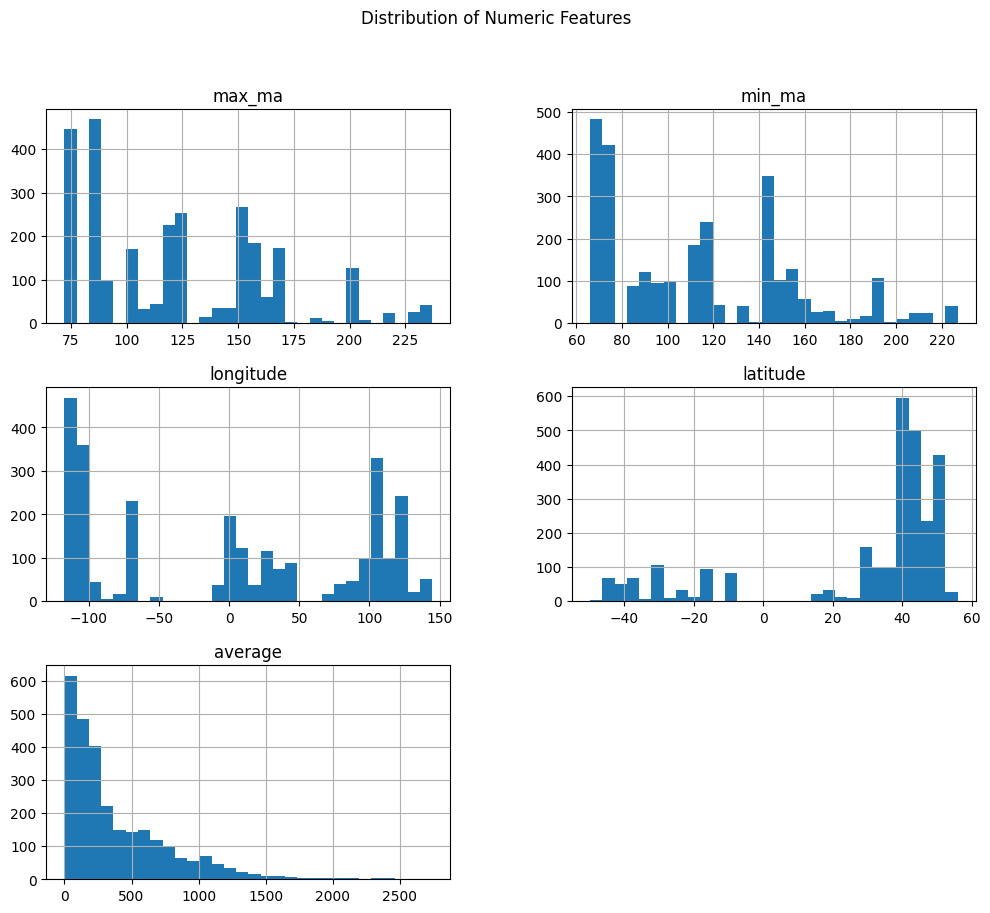

In [76]:
# Visualise the general distribution of data within the categorical variables
dino[['max_ma', 'min_ma', 'longitude', 'latitude', 'average']].hist(bins=30, figsize=(12, 10))
plt.suptitle('Distribution of Numeric Features')
plt.show()

#### Average (which relates to the measurements taken for each fossil)

In [77]:
print("The overall number of measurements is, " + str(dino['measurement_type'].count()))
print('-' * 200)
print(dino['measurement_type'].value_counts())

The overall number of measurements is, 2747
--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
measurement_type
length           2055
width             497
circumference     149
diameter           41
height              5
Name: count, dtype: int64


#### Recode the measurements into their respective types  

In [78]:
# Initialize new columns with NaN values
measurement_types = ['circumference', 'diameter', 'height', 'length', 'width']
for measurement in measurement_types:
    dino[measurement] = np.nan

# Populate the new columns based on measurement_type
for measurement in measurement_types:
    mask = dino['measurement_type'] == measurement
    dino.loc[mask, measurement] = dino.loc[mask, 'average']

# Replace NaN values to 0 indicating that that row has 0 measurement of that type
dino[measurement_types] = dino[measurement_types].fillna(0)

# Show the updated DataFrame
print(dino.head(10))

   occurrence_no identified_rank             accepted_name accepted_rank  max_ma  min_ma      order           family             genus   longitude   latitude Country       state           county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_id specimen_part         identified_name_y measurement_type  average  circumference  diameter  height   length  width
0         489976         species    Futalognkosaurus dukei       species    93.9    86.3   Sauropod     Sauropodidae  Futalognkosaurus  -68.724556 -38.453194      AR     Neuquén          Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional   MUCPv 323         pubis    Futalognkosaurus dukei           length    0.137            0.0       0.0     0.0    0.137    0.0
1         475222         species    Elaphrosaurus bambergi       species   152.2   149.2  Theropoda      Noasauridae     Elaphrosaurus   39.

Length:
- Definition: The distance from one end of a specimen to the other, measured along its longest axis.
- Application: Often used to determine the overall size of the fossil, particularly when assessing the size of long bones or entire specimens.
- Example: For a dinosaur femur, the length would be the distance from the top to the bottom of the bone.

Height:
- Definition: The vertical distance from the base to the top of a specimen when it is oriented in a specific manner (typically with the base on the ground).
- Application: Useful in cases where the vertical dimension is of interest, such as assessing the height of a specimen or parts of it when reconstructed or displayed.
- Example: For a standing dinosaur, height would be the measurement from the ground to the top of its head.


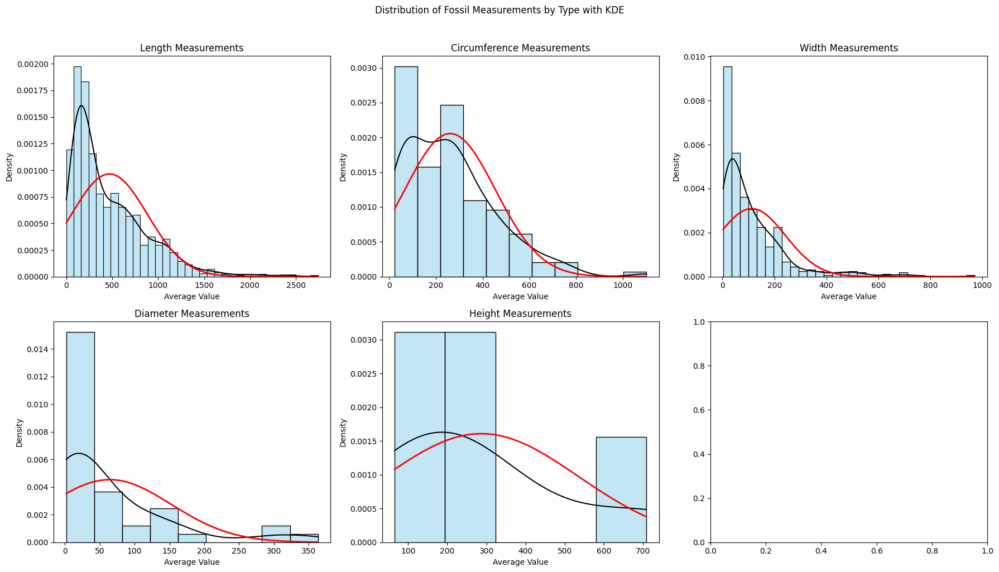

In [79]:
# Define measurement types by extracting unique values from the 'measurement_type' column
measurement_types = dino['measurement_type'].unique()

# Create a figure and a grid of subplots
# Calculate the number of rows needed based on the number of measurement types
# Ensure there are no more than 3 columns
num_types = len(measurement_types)
num_rows = (num_types - 1) // 3 + 1  # Number of rows needed
num_cols = min(num_types, 3)          # Number of columns

fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 5*num_rows), sharey=False)

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Iterate through each measurement type
for i, m_type in enumerate(measurement_types):
    # Filter the data for the current measurement type and drop null values
    subset = dino[dino['measurement_type'] == m_type]['average'].dropna()

    # Plot histogram with Kernel Density Estimate (KDE)
    sns.histplot(subset, kde=True, ax=axes[i], stat='density', color='skyblue', edgecolor='black')

    # Overlay a normal distribution on the histogram
    mu, sigma = subset.mean(), subset.std()  # Calculate mean and standard deviation
    x = np.linspace(subset.min(), subset.max(), 100)  # Create a range of x values
    normal_dist = norm.pdf(x, mu, sigma)  # Calculate normal distribution values
    axes[i].plot(x, normal_dist, 'r-', linewidth=2)  # Plot the normal distribution

    # Change the color of the KDE line to black for better visibility
    kde_line = axes[i].get_lines()[0]  # Get the KDE line
    kde_line.set_color('black')

    # Set the title and labels for each subplot
    axes[i].set_title(f'{m_type.capitalize()} Measurements')
    axes[i].set_xlabel('Average Value')
    axes[i].set_ylabel('Density')

# Adjust the layout and add a main title
fig.suptitle('Distribution of Fossil Measurements by Type with KDE', y=1.02)
plt.tight_layout()  # Automatically adjust subplot parameters to give specified padding

# Display the plot
plt.show()

The above figures are a series of histograms generate to graphically represent the distribution of each individual variable within this dataset. 
In each sub plot the red line overlaying the distribution represents the ideal normal distribution for each variable where as, the black line in each subplot represents the Kernel Density Estimation (KDE) for each plot. The KDE smooths out the histogram bars, giving you a continuous estimate of the underlying distribution. If a variable was normally distributed, the KDE line (black) would therefore, closely match the normal distribution curve (red). That is, the KDE line would align with the shape defined by the normal distribution curve.

In [80]:
# List of measurement types to iterate over
measurement_types = dino['measurement_type'].unique()

# Iterate through each measurement type
for measurement_type in measurement_types:
    # Filter the DataFrame by measurement type
    subset = dino[dino['measurement_type'] == measurement_type]
    
    # Extract the average values for the current measurement type
    avg_values = subset['average'].dropna()  # Drop NaN values if any
    
    # Calculate skewness
    skewness = skew(avg_values) if len(avg_values) > 0 else float('nan')
    print(f'Skewness of average for {measurement_type}: {skewness}')
    
    # Calculate kurtosis
    kurt = kurtosis(avg_values) if len(avg_values) > 0 else float('nan')
    print(f'Kurtosis of average for {measurement_type}: {kurt}')
    
    # Perform Shapiro-Wilk test for normality
    if len(avg_values) > 0 and len(avg_values) >= 3:  # Shapiro-Wilk requires at least 3 observations
        shapiro_test = shapiro(avg_values)
        shapiro_statistic = shapiro_test.statistic
        shapiro_p_value = shapiro_test.pvalue
    else:
        shapiro_statistic = shapiro_p_value = float('nan')
    
    print(f'Shapiro-Wilk test statistic for average ({measurement_type}): {shapiro_statistic}')
    print(f'Shapiro-Wilk test p-value for average ({measurement_type}): {shapiro_p_value}')
    print("-" * 150)  # Print line between outputs for better readability

Skewness of average for length: 1.546603751680619
Kurtosis of average for length: 3.0973481209335807
Shapiro-Wilk test statistic for average (length): 0.855982034275044
Shapiro-Wilk test p-value for average (length): 8.279418301781943e-40
------------------------------------------------------------------------------------------------------------------------------------------------------
Skewness of average for circumference: 1.1073702153127494
Kurtosis of average for circumference: 1.6312505388599554
Shapiro-Wilk test statistic for average (circumference): 0.9123934969376942
Shapiro-Wilk test p-value for average (circumference): 7.658721509947749e-08
------------------------------------------------------------------------------------------------------------------------------------------------------
Skewness of average for width: 2.551331303223577
Kurtosis of average for width: 8.64132409696792
Shapiro-Wilk test statistic for average (width): 0.7347361962041258
Shapiro-Wilk test p-value

The analysis of average values across different measurement types reveals varying degrees of positive skewness and kurtosis. The skewness values, ranging from approximately 1.1 to 2.6, indicate that the data is positively skewed for all measurement types, with a concentration of lower values and a tail extending towards higher values. The kurtosis values show considerable variation, from platykurtic (lighter tails) for height to highly leptokurtic (heavy tails) for width.

#### Overall measurement variable ("Average")

In [81]:
# Overall description of the 'average' column
overall_description = dino['average'].describe()
print("Overall Description of 'average':")
print(overall_description)

print('-'*250) # Printing a line for readability and clarity
# Description of 'average' by measurement type
description_by_type = dino.groupby('measurement_type')['average'].describe()
print("Description of 'average' by Measurement Type:")
print(description_by_type)

Overall Description of 'average':
count    2747.000000
mean      387.356151
std       392.713170
min         0.137000
25%       104.000000
50%       240.000000
75%       565.000000
max      2740.000000
Name: average, dtype: float64
----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Description of 'average' by Measurement Type:
                   count        mean         std     min    25%    50%    75%     max
measurement_type                                                                     
circumference      149.0  260.818289  194.145515  24.000  100.0  244.0  362.0  1100.0
diameter            41.0   64.410976   88.077285   2.100   10.0   18.2   80.0   363.0
height               5.0  286.740000  247.932124  65.700  170.0  210.0  280.0   708.0
length            2055.0  469.619042  413

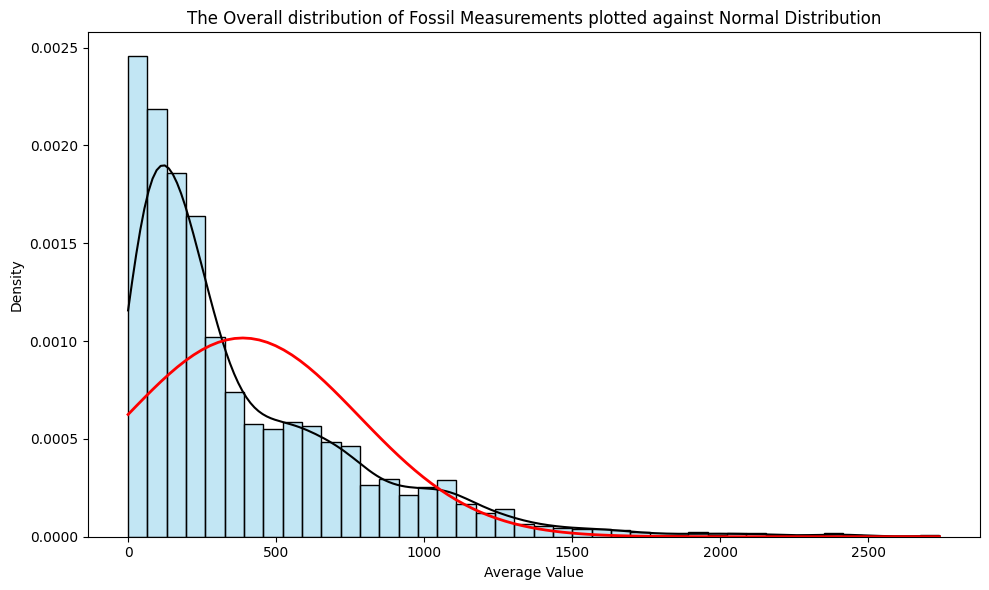

In [82]:
# Create a figure
plt.figure(figsize=(10, 6))

# Plot histogram with KDE for the 'average' column
sns.histplot(x=dino['average'], kde=True, stat='density', color='skyblue', edgecolor='black')

# Overlay normal distribution
mu, sigma = dino['average'].mean(), dino['average'].std()
x = np.linspace(dino['average'].min(), dino['average'].max(), 100)
normal_dist = norm.pdf(x, mu, sigma)
plt.plot(x, normal_dist, 'r-', linewidth=2)

# Get the KDE line and change its color for better visibility
kde_line = plt.gca().get_lines()[0]  # Get the KDE line
kde_line.set_color('black')

# Set the labels and title
plt.xlabel('Average Value')
plt.ylabel('Density')
plt.title('The Overall distribution of Fossil Measurements plotted against Normal Distribution')

# Show the plot
plt.tight_layout()
plt.show()

In [83]:
# Check the normality of the 'average' column in the dino DataFrame
variable = 'average'

# Calculate skewness
skewness = skew(dino[variable].dropna())
print(f'Skewness of {variable}: {skewness}')

# Calculate kurtosis
kurt = kurtosis(dino[variable].dropna())
print(f'Kurtosis of {variable}: {kurt}')

# Perform Shapiro-Wilk test for normality
shapiro_test = shapiro(dino[variable].dropna())
print(f'Shapiro-Wilk test statistic for {variable}: {shapiro_test.statistic}')
print(f'Shapiro-Wilk test p-value for {variable}: {shapiro_test.pvalue}')
print("-" * 150)  # Print line between outputs for better readability

Skewness of average: 1.7733952347944921
Kurtosis of average: 4.052640510283548
Shapiro-Wilk test statistic for average: 0.8198672893371027
Shapiro-Wilk test p-value for average: 3.29623729881087e-48
------------------------------------------------------------------------------------------------------------------------------------------------------


The analysis of the average measurement variable reveals a distribution with notable characteristics deviating from normality. The skewness of 1.77 indicates a right-skewed distribution, suggesting the presence of relatively few high values that extend the right tail. The kurtosis value of 4.053 denotes a leptokurtic distribution, characterized by heavier tails and a sharper peak compared to a normal distribution, highlighting an increased frequency of extreme values. The Shapiro-Wilk test further confirms non-normality with a p-value significantly less than 0.05. These findings collectively suggest that the average measurements exhibit a distribution with substantial asymmetry and pronounced outliers, which may influence subsequent statistical analyses and interpretations.

#### Summary of Measurements

The dataset includes 2,747 measurements ($\bar{x}$ = 387.36, $s$ = 392.71), illustrating considerable variability. The values range from 0.14 to 2,740.00, with a median of 240.00 and an interquartile range of 104.00 to 565.00, reflecting a broad spread.

Examining the measurements by type:

- Length is the most prevalent with 2,055 records ($\bar{x}$ = 469.62, $s$ = 413.39), spanning from 0.14 to 2,740.00, and a median of 325.00.
- Width has 497 records ($\bar{x}$ = 112.80, $s$ = 129.14), ranging from 2.60 to 970.00, with a median of 70.00.
- Circumference features 149 records ($\bar{x}$ = 260.82, $s$ = 194.15), with values from 24.00 to 1,100.00, and a median of 244.00.
- Diameter is represented by 41 records ($\bar{x}$ = 64.41, $s$ = 88.08), with a range of 2.10 to 363.00 and a median of 18.20.
- Height is the least common, with 5 records ($\bar{x}$ = 286.74, $s$ = 247.93), ranging from 65.70 to 708.00, and a median of 210.00.

The overall distribution of measurements is positively skewed ($\text{skewness}$ = 1.77) with heavy tails ($\text{kurtosis}$ = 4.05), as confirmed by the Shapiro-Wilk test ($\text{statistic}$ = 0.82, $p$-value < 0.05), indicating deviations from normality. These characteristics are consistently observed across measurement types.

#### Age Estimates

In [84]:
# Calculate the range of the 'max_ma' column in the dino DataFrame
max_ma_range = dino['max_ma'].max() - dino['max_ma'].min()
print(f"Range of max_ma:, {max_ma_range} million years")

# Calculate the range of the 'min_ma' column in the dino DataFrame
min_ma_range = dino['min_ma'].max() - dino['min_ma'].min()
print(f"Range of min_ma:, {min_ma_range} million years")

# Find the overall maximum and minimum values from both columns
overall_max = max(dino['max_ma'].max(), dino['min_ma'].max())
overall_min = min(dino['max_ma'].min(), dino['min_ma'].min())

# Calculate the overall range
overall_range = overall_max - overall_min
print(f'Overall range between max and min estimates:, {overall_range} million years')

Range of max_ma:, 164.9 million years
Range of min_ma:, 161.0 million years
Overall range between max and min estimates:, 171.0 million years


#### Visualise the distribution of the maximum and minimum age estimate

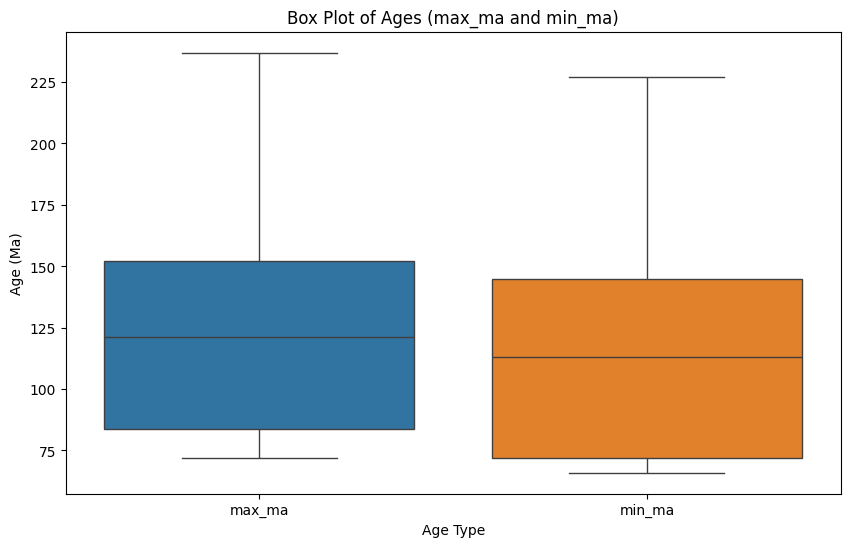

In [85]:
# Visualise the distribution of maximum and minimum age estimates
plt.figure(figsize=(10, 6))
sns.boxplot(data=dino[['max_ma', 'min_ma']])
plt.xlabel('Age Type')
plt.ylabel('Age (Ma)')
plt.title('Box Plot of Ages (max_ma and min_ma)')
plt.show()

The analysis of the paleobiology dinosaur dataset reveals that the temporal range covered extends approximately 171 million years. This range is derived from the difference between the earliest minimum age estimate and the latest maximum age estimate, indicating a broad span of geological time represented in the dataset.

#### Compute a single age estimate

In [86]:
# Create the 'overall_ma' column based on the values of 'max_ma' and 'min_ma'
dino['overall_ma'] = np.where(
    # Check if both 'max_ma' and 'min_ma' are not null
    dino['max_ma'].notnull() & dino['min_ma'].notnull(),
    (dino['max_ma'] + dino['min_ma']) / 2,  # Compute the average of 'max_ma' and 'min_ma' if both are present
    np.where(
        # Check if only 'max_ma' is not null
        dino['max_ma'].notnull(),
        dino['max_ma'],  # Use 'max_ma' if 'min_ma' is null
        dino['min_ma']   # Use 'min_ma' if 'max_ma' is null
    )
)

#### Visualise the overall age estimate

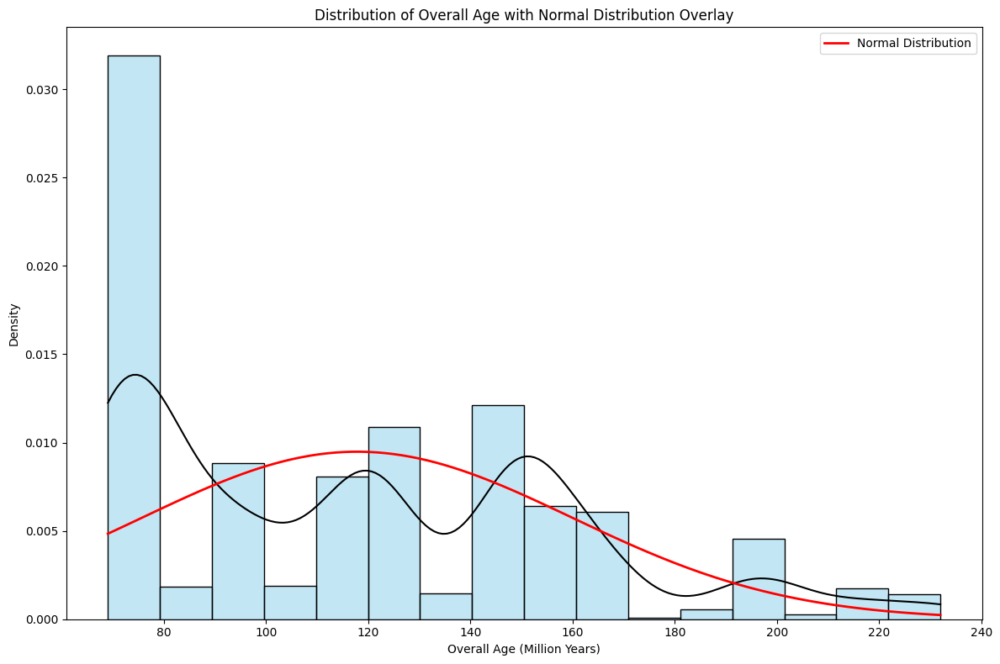

In [87]:
#Visualise the distribution of the overall age estimate (the distribution of 'overall_ma')
# Create a figure
plt.figure(figsize=(12, 8))

# Plot histogram with KDE for the 'overall_ma' column
sns.histplot(x=dino['overall_ma'].dropna(), kde=True, stat='density', color='skyblue', edgecolor='black')

# Overlay normal distribution
mu, sigma = dino['overall_ma'].mean(), dino['overall_ma'].std()
x = np.linspace(dino['overall_ma'].min(), dino['overall_ma'].max(), 100)
normal_dist = norm.pdf(x, mu, sigma)
plt.plot(x, normal_dist, 'r-', linewidth=2, label='Normal Distribution')

# Get the KDE line and change its color for better visibility
kde_line = plt.gca().get_lines()[0]  # Get the KDE line
kde_line.set_color('black')

# Set the labels and title
plt.xlabel('Overall Age (Million Years)')
plt.ylabel('Density')
plt.title('Distribution of Overall Age with Normal Distribution Overlay')
plt.legend()

# Show the plot
plt.tight_layout()
plt.show()

#### Categorical Variables
Quantifying and visualising the distribution of frequencies for the categorical variables

### Specimen parts

In [88]:
fossil_types = dino['specimen_part'].value_counts()
print(fossil_types)

specimen_part
femur                605
tibia                446
humerus              385
scapula              253
ulna                 249
radius               244
fibula               183
skull                165
coracoid             112
tibiotarsus           26
ilium                 14
fibual                 9
pubis                  8
scapulocoracoid        8
scapulacoracoid        5
femora                 5
ischium                5
metatarsal III         4
juvenile skull         2
juvenile humerus       2
metacarpal III         2
metatarsal II          1
redius                 1
metatarsal I           1
proximal femur         1
metatarsal IV          1
? ulna                 1
juvenile coracoid      1
ZPAL MgD-I/95          1
radi                   1
scapulocodacoid        1
fibula                 1
juvenile radius        1
juvenile scapula       1
metatarsus             1
metatarsal V           1
Name: count, dtype: int64


The dataset reveals a diverse range of fossil specimen parts, with the most frequently encountered being femur (605 specimens), tibia (446 specimens), and humerus (385 specimens). These three specimen parts constitute the majority of the dataset, reflecting their common occurrence in fossil records. Other notable parts include scapula (253 specimens), ulna (249 specimens), and radius (244 specimens), indicating their relative abundance. Less common specimen parts such as tibiotarsus (26 specimens) and ilium (14 specimens) are also present, although in smaller quantities. Additionally, there are several rare specimen parts with only one or two occurrences, including juvenile skulls and various metatarsals. The presence of ambiguous entries, such as “? ulna” and misspelled terms like “fibual,” suggests potential issues with data quality or recording inconsistencies.

### Error corrections

- ? ulna” should be corrected to “ulna,” and “fibual” should be corrected to “fibula"
- “scapulocoracoid” and “scapulacoracoid,” are generally considered to be the same bone, but the spelling inconsistency indicates different terminologies. This was changed to scapulocoracoid for consistency.
- “ZPAL MgD-I/95” appears to be a specimen identifier rather than a specific bone name. This identifier refers to a particular specimen catalogued by the Polish Academy of Sciences’ Institute of Paleobiology (ZPAL). This identifier is used to uniquely label and track specimens in their collection and does not correspond to a specific bone name or type. 
- redius is likely a misspelling of radius
- Proximal Femur refers to a specific part of the femur (so this will be reclassified as femur)
- Juvenile terminology to be reduced for consistency (also because it is very difficult to verify and does not add to the identification of species etc)

In [89]:
# Directly display the record corresponding to 'ZPAL MgD-I/95'
print(dino[dino['specimen_part'] == 'ZPAL MgD-I/95'])

      occurrence_no identified_rank          accepted_name accepted_rank  max_ma  min_ma      order         family         genus  longitude  latitude Country    state               county    formation lithology1 lithology2 assembl_comps pres_mode preservation_quality fragmentation specimen_id  specimen_part      identified_name_y measurement_type  average  circumference  diameter  height  length  width  overall_ma
1959         404802         species  Conchoraptor gracilis       species    83.6    72.1  Theropoda  Oviraptoridae  Conchoraptor      99.75     43.25      MN  Omnogov  Гурвантэс ᠭᠤᠷᠪᠠᠨᠲᠡᠰ  Baruungoyot  sandstone  sandstone  macrofossils      body                 good          none  IGM 100/20  ZPAL MgD-I/95  Conchoraptor gracilis           length     98.0            0.0       0.0     0.0    98.0    0.0       77.85


In [90]:
print(dino[dino['occurrence_no'] == 404802])

      occurrence_no identified_rank          accepted_name accepted_rank  max_ma  min_ma      order         family         genus  longitude  latitude Country    state               county    formation lithology1 lithology2 assembl_comps pres_mode preservation_quality fragmentation specimen_id  specimen_part      identified_name_y measurement_type  average  circumference  diameter  height  length  width  overall_ma
1958         404802         species  Conchoraptor gracilis       species    83.6    72.1  Theropoda  Oviraptoridae  Conchoraptor      99.75     43.25      MN  Omnogov  Гурвантэс ᠭᠤᠷᠪᠠᠨᠲᠡᠰ  Baruungoyot  sandstone  sandstone  macrofossils      body                 good          none  IGM 100/20          skull  Conchoraptor gracilis           length     99.0            0.0       0.0     0.0    99.0    0.0       77.85
1959         404802         species  Conchoraptor gracilis       species    83.6    72.1  Theropoda  Oviraptoridae  Conchoraptor      99.75     43.25      MN  Omnog

In the context of the specimen with occurrence number 404802, as detailed in Osmólska (1976), the discovery involved a juvenile skull and mandible. Given that the skull is already documented in the dataset, it is reasonable to infer that any additional records associated with this specimen likely pertain to the mandible. This assumption aligns with the comprehensive description provided in the referenced article, which sheds light on the skull anatomy and systematic position of Oviraptor.
- Osmólska, H. 1976. New light on skull anatomy and systematic position of Oviraptor. Nature 262:683–684.

In [91]:
#Correct “fibual” to “fibula”
dino['specimen_part'] = dino['specimen_part'].replace('fibual', 'fibula')

#Correct “? ulna” to “ulna”
dino['specimen_part'] = dino['specimen_part'].replace('? ulna', 'ulna')

#Standardise “scapulocoracoid” as the consistent term
dino['specimen_part'] = dino['specimen_part'].replace(['scapulocoracoid', 'scapulacoracoid'], 'scapulocoracoid')

# Change 'redius' to 'radius'
dino['specimen_part'] = dino['specimen_part'].replace('redius', 'radius')

# Change 'proximal femur' to 'femur'
dino['specimen_part'] = dino['specimen_part'].replace('proximal femur', 'femur')

# Remove 'juvenile' from specimen_part entries
dino['specimen_part'] = dino['specimen_part'].str.replace(r'\bjuvenile\b\s*', '', regex=True)

# Verify the changes
print(dino['specimen_part'].value_counts())


specimen_part
femur              606
tibia              446
humerus            387
scapula            254
ulna               250
radius             246
fibula             192
skull              167
coracoid           113
tibiotarsus         26
ilium               14
scapulocoracoid     13
pubis                8
ischium              5
femora               5
metatarsal III       4
metacarpal III       2
fibula               1
metatarsus           1
scapulocodacoid      1
radi                 1
ZPAL MgD-I/95        1
metatarsal I         1
metatarsal II        1
metatarsal IV        1
metatarsal V         1
Name: count, dtype: int64


In [92]:
# Update the specimen_part for the record at index 1959 to 'mandible'
dino.at[1959, 'specimen_part'] = 'mandible'

# Verify the update
print(dino.loc[1959])

occurrence_no                          404802
identified_rank                       species
accepted_name           Conchoraptor gracilis
accepted_rank                         species
max_ma                                   83.6
min_ma                                   72.1
order                               Theropoda
family                          Oviraptoridae
genus                            Conchoraptor
longitude                               99.75
latitude                                43.25
Country                                    MN
state                                 Omnogov
county                    Гурвантэс ᠭᠤᠷᠪᠠᠨᠲᠡᠰ
formation                         Baruungoyot
lithology1                          sandstone
lithology2                          sandstone
assembl_comps                    macrofossils
pres_mode                                body
preservation_quality                     good
fragmentation                            none
specimen_id                       

### Visualising the Frequency distribution for specimen Parts

/var/folders/n7/94bnmfqd6dv3s73zb4zp6c140000gn/T/ipykernel_12404/2259034411.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=part_counts.index, y=part_counts.values, palette='plasma_r')


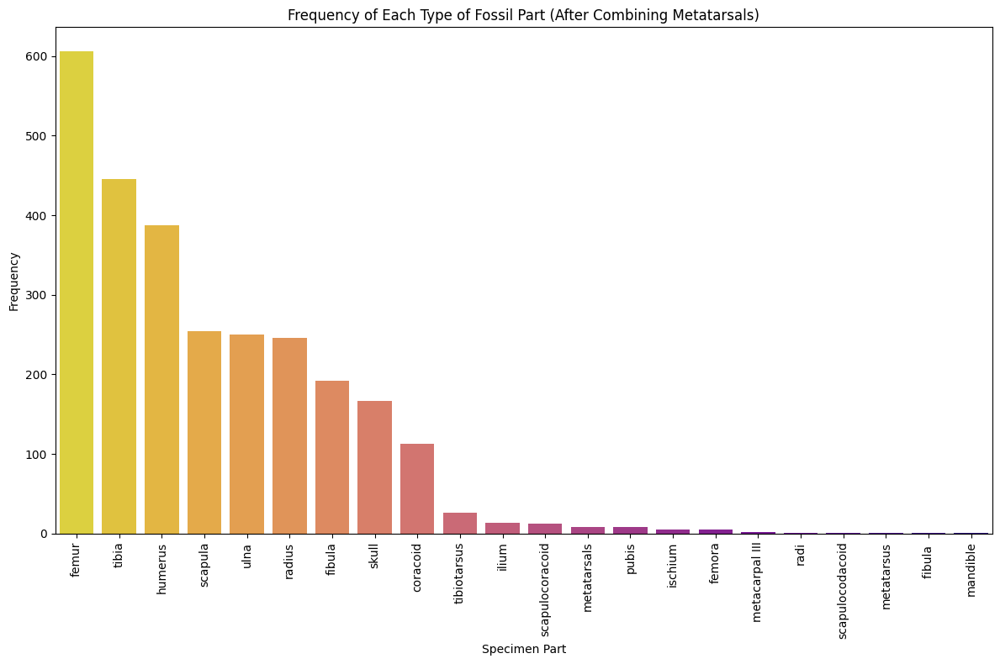

In [93]:
# Map specific metatarsal parts to 'metatarsals' (basically combining Metatarsals for ease of visualisation)
dino['specimen_part'] = dino['specimen_part'].replace({
    'metatarsal I': 'metatarsals',
    'metatarsal II': 'metatarsals',
    'metatarsal III': 'metatarsals',
    'metatarsal IV': 'metatarsals',
    'metatarsal V': 'metatarsals'
})

# Calculate the frequency of each specimen part type after combining
part_counts = dino['specimen_part'].value_counts()

# Plotting
plt.figure(figsize=(12, 8))

# Create a bar plot
sns.barplot(x=part_counts.index, y=part_counts.values, palette='plasma_r')

# Set the labels and title
plt.xlabel('Specimen Part')
plt.ylabel('Frequency')
plt.title('Frequency of Each Type of Fossil Part (After Combining Metatarsals)')

# Rotate x-axis labels if needed for readability
plt.xticks(rotation=90, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

In [94]:
# Sauropodiformes which is a broader category within Sauropodomorpha
print("Sauropodiformes:") 
print(dino[dino['order'] == 'Sauropodiformes'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates())
print("\n")  # New line for separation

# Sauropoda, a specific group within Sauropodomorpha
print("Sauropoda:") 
print(dino[dino['order'] == 'Sauropoda'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates())
print("\n")  # New line for separation

# Sauropodomorpha which includes Sauropodiformes and Sauropoda
print("Sauropodomorpha:") 
print(dino[dino['order'] == 'Sauropodomorpha'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates())
print("\n")  # New line for separation

# Stegosauria which is a group within the order Ornithischia
print("Stegosauria:") 
print(dino[dino['order'] == 'Stegosauria'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates())
print("\n")  # New line for separation

Sauropodiformes:
                order            family          genus                  accepted_name
608   Sauropodiformes      Diplodocidae   Amphicoelias  Amphicoelias brontodiplodocus
635   Sauropodiformes    Titanosauridae   Atacamatitan         Atacamatitan chilensis
664   Sauropodiformes      Sauropodidae   Europasaurus           Europasaurus holgeri
684   Sauropodiformes    Lessemsauridae   Antetonitrus         Antetonitrus ingenipes
689   Sauropodiformes      Sauropodidae     Vulcanodon         Vulcanodon karibaensis
...               ...               ...            ...                            ...
2371  Sauropodiformes  Lamplughsauridae  Lamplughsaura   Lamplughsaura dharmaramensis
2390  Sauropodiformes   Ohmdenosauridae  Ohmdenosaurus         Ohmdenosaurus liasicus
2391  Sauropodiformes    Guaibasauridae    Agnosphitys      Agnosphitys cromhallensis
2393  Sauropodiformes       Efraasiidae       Efraasia                 Efraasia minor
2741  Sauropodiformes    Titanosaurid

#### Checking the correct classification of taxonomic ranks

In [95]:
# Get the count of unique values in the 'order' column and print the results
order_sample_sizes = dino['order'].value_counts()
print(order_sample_sizes)  # Print the frequency of each unique value in 'order'
print('-'*150)  # Print a separator line for clarity

# Get the count of unique values in the 'family' column and print the results
order_sample_sizes = dino['family'].value_counts()
print(order_sample_sizes)  # Print the frequency of each unique value in 'family'
print('-'*150)  # Print a separator line for clarity

order
Theropoda           1151
Ornithopoda          634
Sauropodiformes      468
Ornithischia         241
Sauropod             163
Psittacosauridae      32
Megalosauridae        30
Sauropodomorpha       14
Stegosauria           11
Sauropoda              3
Name: count, dtype: int64
------------------------------------------------------------------------------------------------------------------------------------------------------
family
Titanosauridae     165
Diplodocidae       162
Hadrosauridae      161
Dromaeosauridae    151
Ornithomimidae     131
                  ... 
Ornithoidae          1
Gojirasauridae       1
Avisauridae          1
Ohmdenosauridae      1
Protohadrosidae      1
Name: count, Length: 117, dtype: int64
------------------------------------------------------------------------------------------------------------------------------------------------------


In [96]:
# List of taxonomic columns
taxonomic_columns = ['order', 'family', 'genus']

# Extract unique combinations
unique_combinations = dino[taxonomic_columns].drop_duplicates()
pd.set_option('display.max_rows', None)
# Print the unique combinations
print(unique_combinations)

                 order                 family                          genus
0             Sauropod           Sauropodidae               Futalognkosaurus
1            Theropoda            Noasauridae                  Elaphrosaurus
5            Theropoda         Dryptosauridae                   Dryptosaurus
9            Theropoda        Tanycolagreidae                  Tanycolagreus
15           Theropoda         Ornithomimidae                    Anserimimus
21           Theropoda         Ornithomimidae             Archaeornithomimus
33           Theropoda         Ornithomimidae                 Dromiceiomimus
37           Theropoda         Ornithomimidae                  Struthiomimus
46           Theropoda           Troodontidae                  Alectrosaurus
50           Theropoda        Tyrannosauridae                  Tyrannosaurus
56           Theropoda        Tyrannosauridae                 Daspletosaurus
60           Theropoda         Caenagnathidae                   Microvenator

This shows the unique combinations of taxonomic hierarchy for sense/ fact checking

There are some classification issues within order

In [97]:
# Ornithopoda which is a sub order of order Ornithischia
print("Ornithopoda:") 
print(dino[dino['order'] == 'Ornithopoda'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates())
print("\n")  # New line for separation

Ornithopoda:
            order               family              genus                   accepted_name
64    Ornithopoda        Hadrosauridae      Hadrosauridae                   Hadrosauridae
66    Ornithopoda        Hadrosauridae        Hadrosaurus             Hadrosaurus foulkii
68    Ornithopoda        Hadrosauridae      Edmontosaurus         Edmontosaurus annectens
70    Ornithopoda     Thescelosauridae     Thescelosaurus    Thescelosaurus edmontonensis
99    Ornithopoda     Thescelosauridae     Thescelosaurus        Thescelosaurus neglectus
112   Ornithopoda     Thescelosauridae       Parksosaurus            Parksosaurus warreni
119   Ornithopoda       Iguanodontidae          Iguanodon                       Iguanodon
127   Ornithopoda    Leptoceratopsidae      Leptoceratops          Leptoceratops gracilis
138   Ornithopoda    Leptoceratopsidae    Montanoceratops    Montanoceratops cerorhynchus
141   Ornithopoda        Hadrosauridae      Hypacrosaurus        Hypacrosaurus altispin

In [98]:
# Filtering rows based on the specific orders
psittacosauridae_df = df[df['order'] == 'Psittacosauridae']
megalosauridae_df = df[df['order'] == 'Megalosauridae']
sauropodomorpha_df = df[df['order'] == 'Sauropodomorpha']

# Displaying relevant columns for each classification
psittacosauridae_relevant = psittacosauridae_df[['order', 'family', 'genus', 'accepted_name']]
megalosauridae_relevant = megalosauridae_df[['order', 'family', 'genus', 'accepted_name']]
sauropodomorpha_relevant = sauropodomorpha_df[['order', 'family', 'genus', 'accepted_name']]

# Display the DataFrames for review
print("Psittacosauridae Data:")
print(psittacosauridae_relevant)

print("\nMegalosauridae Data:")
print(megalosauridae_relevant)

print("\nSauropodomorpha Data:")
print(sauropodomorpha_relevant)

Psittacosauridae Data:
                 order            family           genus                 accepted_name
620   Psittacosauridae  Psittacosauridae  Psittacosaurus  Psittacosaurus lujiatunensis
621   Psittacosauridae  Psittacosauridae  Psittacosaurus  Psittacosaurus lujiatunensis
622   Psittacosauridae  Psittacosauridae  Psittacosaurus  Psittacosaurus lujiatunensis
623   Psittacosauridae  Psittacosauridae  Psittacosaurus  Psittacosaurus lujiatunensis
1107  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1108  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1109  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1110  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1111  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1112  Psittacosauridae  Psittacosauridae  Psittacosaurus      Psittacosaurus sibiricus
1113  Psittacosaurid

In [99]:
# Correct the family and order for Afrovenator abakensis
dino.loc[dino['accepted_name'] == 'Afrovenator abakensis', 'order'] = 'Theropoda'
dino.loc[dino['accepted_name'] == 'Afrovenator abakensis', 'family'] = 'Megalosauridae'

# Correct the family and order for Poekilopleuron bucklandii
dino.loc[dino['accepted_name'] == 'Poekilopleuron bucklandii', 'order'] = 'Theropoda'
dino.loc[dino['accepted_name'] == 'Poekilopleuron bucklandii', 'family'] = 'Poekilopleuridae'

# Update the order for all rows where the current order is 'Megalosauridae' (Megalosauridae is a family under Theropoda)
dino.loc[dino['order'] == 'Megalosauridae', 'order'] = 'Theropoda'

# Update the order column for all rows with Psittacosauridae to Ceratopsida (again Psittacosauridae is family, Ceratopsida is the order)
dino.loc[dino['family'] == 'Psittacosauridae', 'order'] = 'Ceratopsida'

In [100]:
#update the subclade Ornithopoda to the order of Ornithischia
dino['order'] = dino['order'].replace('Ornithopoda', 'Ornithischia')

In [101]:
# Pull up rows related to Mamenchisauridae
mamenchisauridae_rows = dino[dino['family'] == 'Mamenchisauridae']
print("Rows related to Mamenchisauridae:")
print(mamenchisauridae_rows)

Rows related to Mamenchisauridae:
      occurrence_no identified_rank                accepted_name accepted_rank  max_ma  min_ma            order            family           genus   longitude   latitude Country     state                  county  formation       lithology1       lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_id specimen_part            identified_name_y measurement_type  average  circumference  diameter  height  length  width  overall_ma
694          739555         species       Omeisaurus tianfuensis       species   170.9   154.8  Sauropodiformes  Mamenchisauridae      Omeisaurus  104.852501  29.411388      CN   Sichuan                  Zigong  Shaximiao        sandstone         mudstone  macrofossils,mesofossils      body                 good    occasional   ZDM T7501       humerus       Omeisaurus tianfuensis           length   1080.0            0.0       0.0     0.0  1080.0    0.0      162.85
695          739555         sp

The Bellusaurus sui occurrence_no 522076 has been incorrectly classified as Ornithopoda but should be a Sauropodiformes

In [102]:
# Update the order for the specific occurrence_no
dino.loc[dino['occurrence_no'] == 522076, 'order'] = 'Sauropodiformes'

The family Hadrosauridae is incorrectly listed with Ornithopoda, and the genus Hadrosauridae is incorrectly listed.

In [103]:
# Filter for Hadrosauridae family and review genus and accepted names
hadrosauridae_names = dino[dino['family'] == 'Hadrosauridae'][['order','family','genus','accepted_name']].drop_duplicates()
print(hadrosauridae_names)

             order         family              genus                   accepted_name
64    Ornithischia  Hadrosauridae      Hadrosauridae                   Hadrosauridae
66    Ornithischia  Hadrosauridae        Hadrosaurus             Hadrosaurus foulkii
68    Ornithischia  Hadrosauridae      Edmontosaurus         Edmontosaurus annectens
141   Ornithischia  Hadrosauridae      Hypacrosaurus        Hypacrosaurus altispinus
145   Ornithischia  Hadrosauridae     Lambeosaurinae                  Lambeosaurinae
243   Ornithischia  Hadrosauridae    Parasaurolophus         Parasaurolophus walkeri
244   Ornithischia  Hadrosauridae    Parasaurolophus                 Parasaurolophus
274   Ornithischia  Hadrosauridae      Edmontosaurus                   Edmontosaurus
296   Ornithischia  Hadrosauridae        Saurolophus             Saurolophus osborni
396   Ornithischia  Hadrosauridae        Gryposaurus           Gryposaurus notabilis
430   Ornithischia  Hadrosauridae    Parasaurolophus  Parasaurolo

In [104]:
#Fix Incorrect Genus for Hadrosauridae:
dino.loc[dino['genus'] == 'Hadrosauridae', 'genus'] = 'Hadrosaurus'
#Ensure Correct Family and Order:
dino.loc[dino['family'] == 'Hadrosauridae', 'order'] = 'Ornithischia'

Ceratopsidae is listed as an order in some cases, but Agujaceratops should be correctly associated with the family Ceratopsidae.

In [105]:
# Filter for Ceratopsidae family and review genus and accepted names
ceratopsidae_names = dino[dino['family'] == 'Ceratopsidae'][['order', 'family', 'genus', 'accepted_name']].drop_duplicates()
print(ceratopsidae_names)

             order        family            genus                accepted_name
160   Ornithischia  Ceratopsidae      Avaceratops         Avaceratops lammersi
168   Ornithischia  Ceratopsidae   Centrosaurinae               Centrosaurinae
171   Ornithischia  Ceratopsidae    Agujaceratops  Agujaceratops mariscalensis
302   Ornithischia  Ceratopsidae   Titanoceratops       Titanoceratops ouranos
338   Ornithischia  Ceratopsidae      Triceratops         Triceratops horridus
374   Ornithischia  Ceratopsidae    Styracosaurus    Styracosaurus albertensis
380   Ornithischia  Ceratopsidae     Centrosaurus         Centrosaurus apertus
407   Ornithischia  Ceratopsidae     Chasmosaurus           Chasmosaurus belli
413   Ornithischia  Ceratopsidae     Chasmosaurus        Chasmosaurus russelli
425   Ornithischia  Ceratopsidae       Torosaurus         Torosaurus utahensis
1095  Ornithischia  Ceratopsidae      Monoclonius          Monoclonius crassus
1106  Ornithischia  Ceratopsidae    Pentaceratops   

In [106]:
# Correct the order and family for Tuojiangosaurus multispinus
dino.loc[dino['genus'] == 'Tuojiangosaurus', 'order'] = 'Stegosauria'
dino.loc[dino['genus'] == 'Tuojiangosaurus', 'family'] = 'Stegosauridae'
# Correct the order for Ceratopsidae family
dino.loc[dino['family'] == 'Ceratopsidae', 'order'] = 'Ornithischia'
# Correct the subfamily for Centrosaurinae
dino.loc[dino['genus'] == 'Centrosaurinae', 'family'] = 'Centrosauridae'
# Correct the family for Ceratosidae to Ceratopsidae
dino.loc[dino['family'] == 'Ceratosidae', 'family'] = 'Ceratopsidae'
# Update incorrect genus entries for Iguanodontidae
dino.loc[dino['genus'] == 'Iguanodontidae', 'genus'] = 'Iguanodon'

Filter the Data by Order to see if there are any further crossover between 'Sauropoda', 'Sauropodiformes' or 'Sauropodomorpha'

In [107]:
# Define the orders of interest
orders_of_interest = ['Sauropoda', 'Sauropodiformes', 'Sauropodomorpha']

# Filter the DataFrame based on the 'order' column
filtered_df = dino[dino['order'].isin(orders_of_interest)]

# Define columns related to the taxonomic hierarchy
taxonomic_columns = ['order', 'family', 'genus', 'accepted_name']

# Select these columns from the filtered DataFrame
taxonomic_data = filtered_df[taxonomic_columns]

# Remove duplicate rows based on the selected columns
unique_taxonomic_data = taxonomic_data.drop_duplicates()

# Display the unique taxonomic data
pd.set_option('display.max_rows', None)  # Ensure all rows are displayed if the dataset is large
print(unique_taxonomic_data)


                order               family               genus                    accepted_name
608   Sauropodiformes         Diplodocidae        Amphicoelias    Amphicoelias brontodiplodocus
635   Sauropodiformes       Titanosauridae        Atacamatitan           Atacamatitan chilensis
664   Sauropodiformes         Sauropodidae        Europasaurus             Europasaurus holgeri
679   Sauropodomorpha       Plateosauridae        Plateosaurus       Plateosaurus trossingensis
684   Sauropodiformes       Lessemsauridae        Antetonitrus           Antetonitrus ingenipes
689   Sauropodiformes         Sauropodidae          Vulcanodon           Vulcanodon karibaensis
694   Sauropodiformes     Mamenchisauridae          Omeisaurus           Omeisaurus tianfuensis
758   Sauropodiformes       Titanosauridae         Angolatitan            Angolatitan adamastor
840   Sauropodiformes       Titanosauridae      Epachthosaurus          Epachthosaurus sciuttoi
857   Sauropodiformes         Sauropodid

In [108]:
# Update the 'order' column for specific indices
df.loc[679, 'order'] = 'Sauropoda'
df.loc[2723, 'order'] = 'Sauropoda'

# Display the relevant indices to confirm changes
print("\nUpdated rows for indices 679 and 2723:")
print(df.loc[[679, 2723], ['order']])


Updated rows for indices 679 and 2723:
          order
679   Sauropoda
2723  Sauropoda


In [109]:
# Correcting the order for specific families and missing classifications
# Updating 'Sauropodomorpha' to 'Sauropodiformes' where appropriate
dino.loc[(dino['order'] == 'Sauropodomorpha') & (dino['family'] == 'Titanosauridae'), 'order'] = 'Sauropodiformes'
dino.loc[(dino['order'] == 'Sauropodomorpha') & (dino['family'] == 'Sauropodidae'), 'order'] = 'Sauropodiformes'

# Reclassifying specific entries where the family is not matching the order
dino.loc[dino['family'] == 'Thecodontosauridae', 'order'] = 'Sauropodiformes'
dino.loc[dino['family'] == 'Sauropodidae', 'order'] = 'Sauropodiformes'

# Verifying corrections
print(dino[dino['order'] == 'Sauropodomorpha'][['order','family', 'genus']].drop_duplicates())
print(dino[dino['order'] == 'Sauropodiformes'][['order','family', 'genus']].drop_duplicates())
print(dino[dino['family'].isna()][['order', 'genus']])

               order          family         genus
679  Sauropodomorpha  Plateosauridae  Plateosaurus
                order               family               genus
0     Sauropodiformes         Sauropodidae    Futalognkosaurus
90    Sauropodiformes         Sauropodidae      Antarctosaurus
608   Sauropodiformes         Diplodocidae        Amphicoelias
635   Sauropodiformes       Titanosauridae        Atacamatitan
664   Sauropodiformes         Sauropodidae        Europasaurus
684   Sauropodiformes       Lessemsauridae        Antetonitrus
689   Sauropodiformes         Sauropodidae          Vulcanodon
694   Sauropodiformes     Mamenchisauridae          Omeisaurus
758   Sauropodiformes       Titanosauridae         Angolatitan
840   Sauropodiformes       Titanosauridae      Epachthosaurus
857   Sauropodiformes         Sauropodidae          Kotasaurus
866   Sauropodiformes   Thecodontosauridae    Thecodontosaurus
874   Sauropodiformes       Titanosauridae           Isisaurus
1135  Sauropodif

#### Filter by accepted rank, and create new variable for species
If the accepted_name can be filtered according to taxonomic rank, it becomes possible to isolate specimens that could only be identified at broader taxonomic levels. This filtering process allows for the creation of a variable specifically for species-level identifications. By focusing on specimens identified at the species level, this approach facilitates a more precise and cleaner analysis. It ensures that comparisons and interpretations are made exclusively within the context of species-specific data, thereby enhancing the clarity and accuracy of the resulting analyses.

In [110]:
dino['accepted_rank'].value_counts()

accepted_rank
species           2608
genus               47
unranked clade      41
family              27
subfamily           13
order               11
Name: count, dtype: int64

In [111]:
# Create a new column 'species' where 'accepted_name' is assigned if 'accepted_rank' is 'species'
dino['species'] = dino.apply(lambda row: row['accepted_name'] if row['accepted_rank'] == 'species' else None, axis=1)

order
Theropoda          1159
Ornithischia        873
Sauropodiformes     488
Sauropod            160
Ceratopsida          32
Stegosauria          28
Sauropodomorpha       5
Sauropoda             2
Name: count, dtype: int64


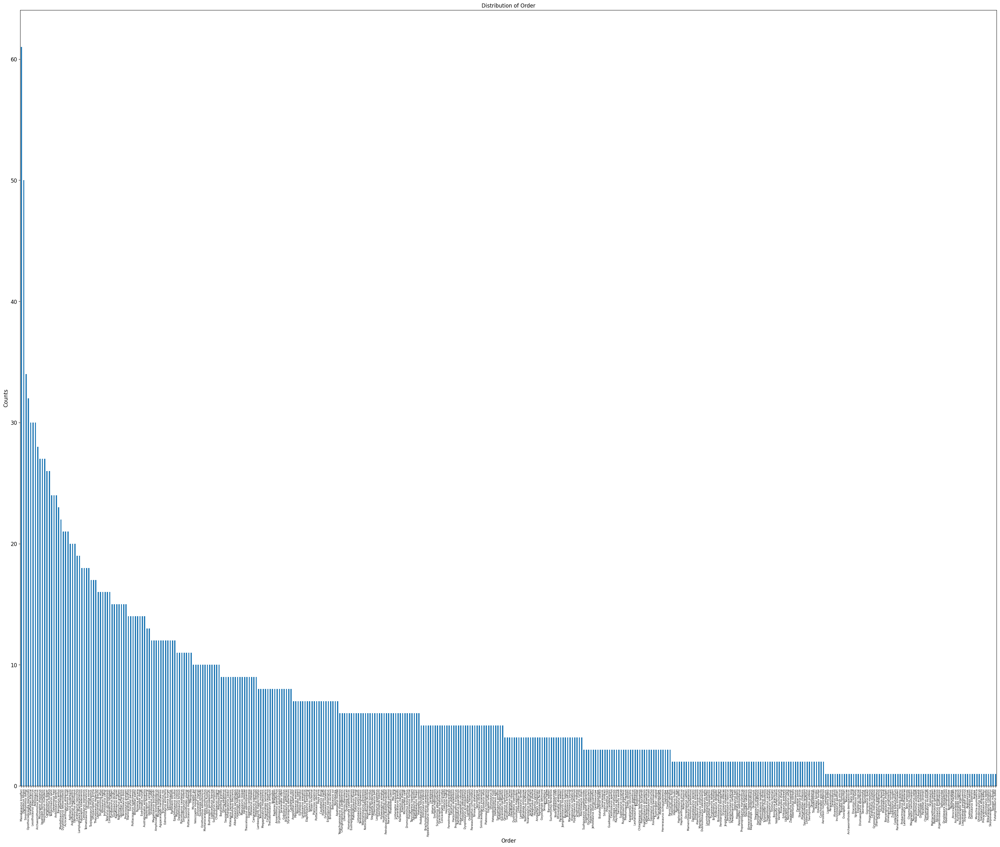

In [112]:
# Print value counts
print(dino['order'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['accepted_name'].value_counts().plot(kind='bar', title='Distribution of Order')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Order', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Order', fontsize=12)
plt.show()

### The frequency distribution for Family

family
Titanosauridae           165
Diplodocidae             162
Hadrosauridae            161
Dromaeosauridae          151
Ornithomimidae           131
Ankylosauridae           123
Tyrannosauridae           88
Ceratopsidae              84
Noasauridae               81
Sauropodidae              74
Iguanodontidae            74
Troodontidae              66
Brachiosauridae           60
Compsognathidae           59
Nodosauridae              59
Hypsilophodontidae        58
Stegosauridae             46
Thescelosauridae          40
Carcharodontosauridae     39
Leptoceratopsidae         37
Oviraptoridae             36
Saltasauridae             35
Therizinosauridae         33
Psittacosauridae          32
Dryosauridae              31
Lesothosauridae           30
Neovenatoridae            28
Proceratosauridae         28
Hexinlusauridae           27
Theropodidae              26
Alvarezsauridae           26
Metriacanthosauridae      26
Abelisauridae             26
Camptosauridae            26
Coeloph

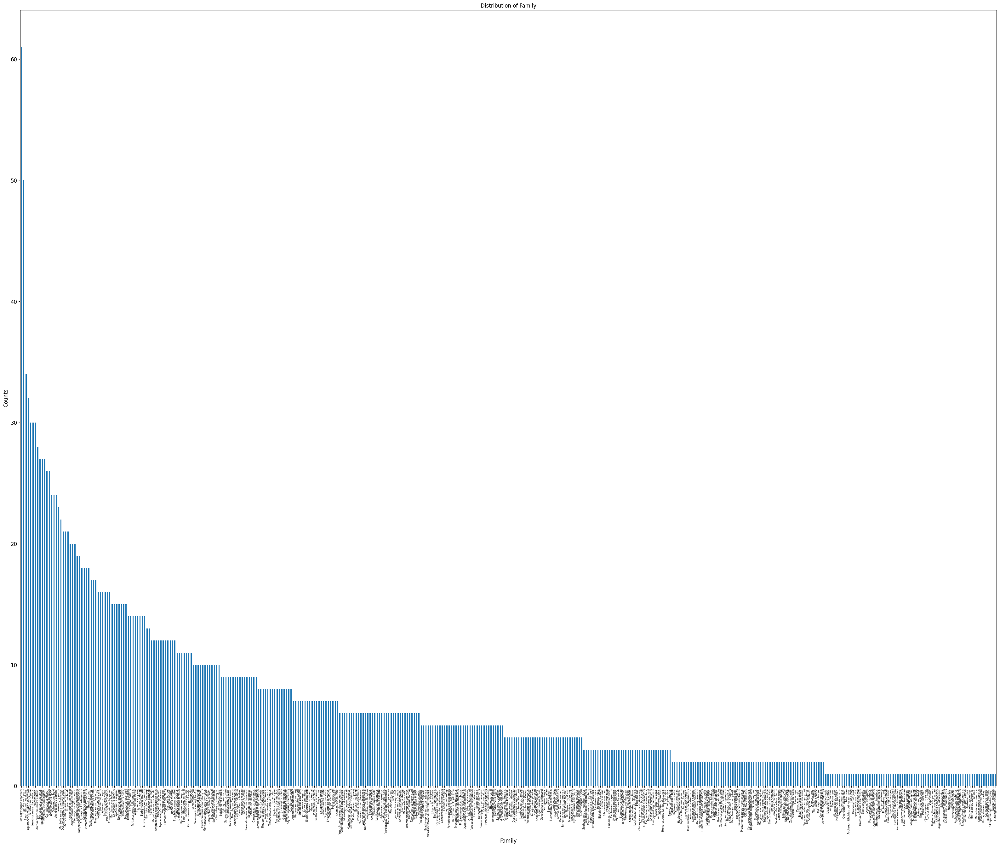

In [113]:
# Print value counts
print(dino['family'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['accepted_name'].value_counts().plot(kind='bar', title='Distribution of Family')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Family', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Family', fontsize=12)
plt.show()

### The frequency distribution for Genera

genus
Diplodocus                       63
Masiakasaurus                    61
Ankylosauridae                   40
Microraptor                      37
Iguanodon                        36
Sinornithomimus                  34
Opisthocoelicaudia               32
Psittacosaurus                   32
Giraffatitan                     30
Lesothosaurus                    30
Archaeornithomimus               28
Hexinlusaurus                    27
Thescelosaurus                   26
Camptosaurus                     26
Gallimimus                       26
Galeamopus                       24
Edmontosaurus                    24
Aniksosaurus                     24
Tastavinsaurus                   24
Barosaurus                       23
Mantellisaurus                   22
Acrocanthosaurus                 21
Yutyrannus                       21
Dysalotosaurus                   21
Sinosauropteryx                  21
Agilisaurus                      20
Ankylosaurus                     20
Deinonychus           

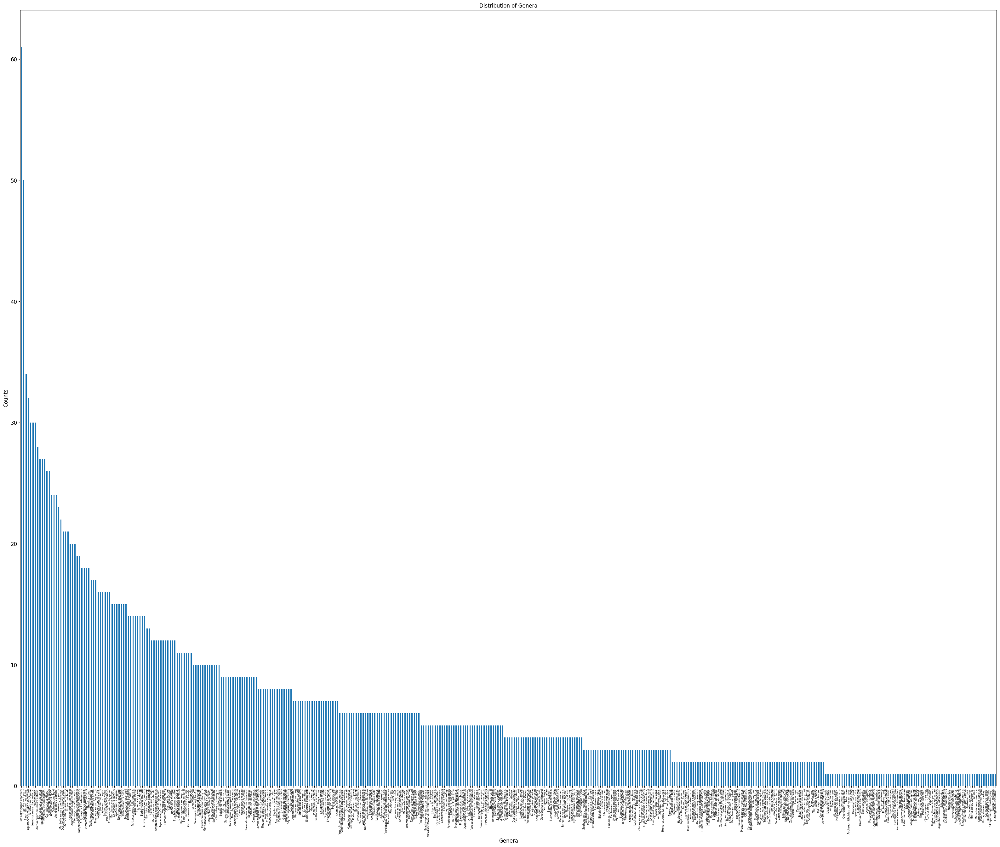

In [114]:
# Print value counts
print(dino['genus'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['accepted_name'].value_counts().plot(kind='bar', title='Distribution of Genera')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Genera', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Genera', fontsize=12)
plt.show()

### The frequency distribution of accepted name

accepted_name
Masiakasaurus knopfleri             61
Diplodocus longus                   50
Sinornithomimus dongi               34
Opisthocoelicaudia skarzynskii      32
Giraffatitan brancai                30
Lesothosaurus diagnosticus          30
Ankylosauria                        30
Archaeornithomimus asiaticus        28
Microraptor zhaoianus               27
Iguanodon bernissartensis           27
Hexinlusaurus multidens             27
Camptosaurus dispar                 26
Gallimimus bullatus                 26
Tastavinsaurus sanzi                24
Galeamopus hayi                     24
Aniksosaurus darwini                24
Barosaurus lentus                   23
Mantellisaurus atherfieldensis      22
Dysalotosaurus lettowvorbecki       21
Acrocanthosaurus atokensis          21
Yutyrannus huali                    21
Agilisaurus louderbacki             20
Ankylosaurus magniventris           20
Deinonychus antirrhopus             20
Ceratosaurus nasicornis             19
Lamplughsau

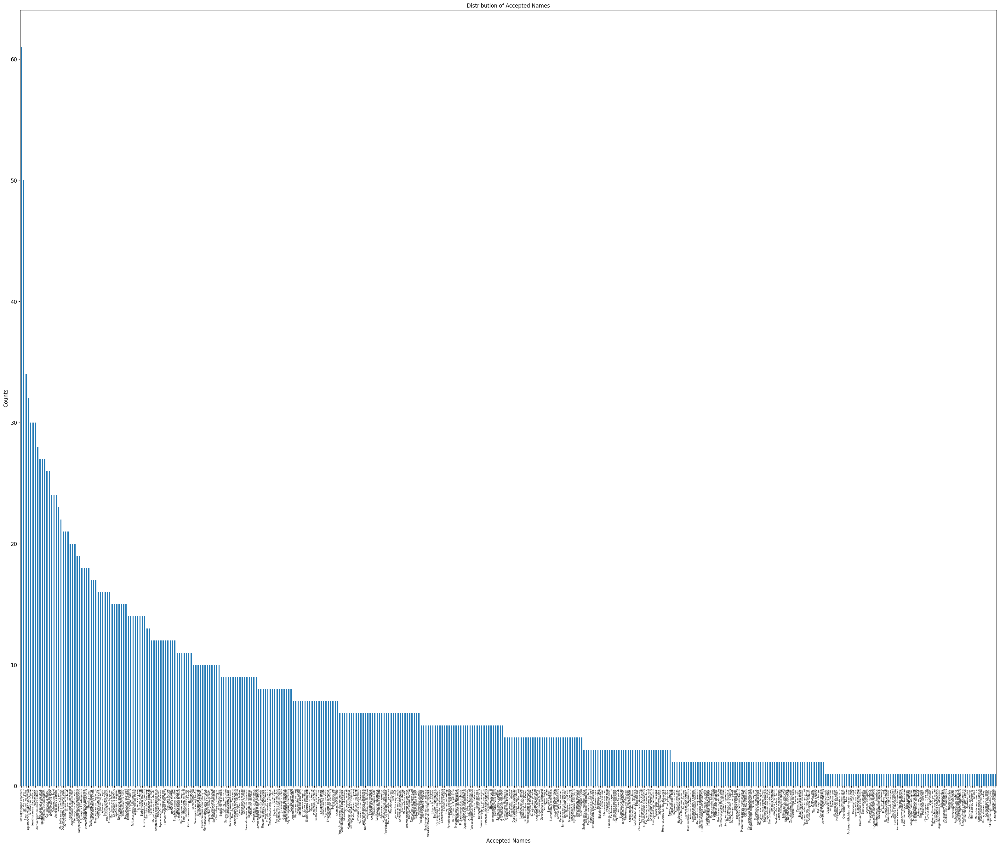

In [115]:
# Print value counts
print(dino['accepted_name'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['accepted_name'].value_counts().plot(kind='bar', title='Distribution of Accepted Names')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Accepted Names', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Accepted Names', fontsize=12)
plt.show()

### The frequency distribution of accepted rank

accepted_rank
species           2608
genus               47
unranked clade      41
family              27
subfamily           13
order               11
Name: count, dtype: int64


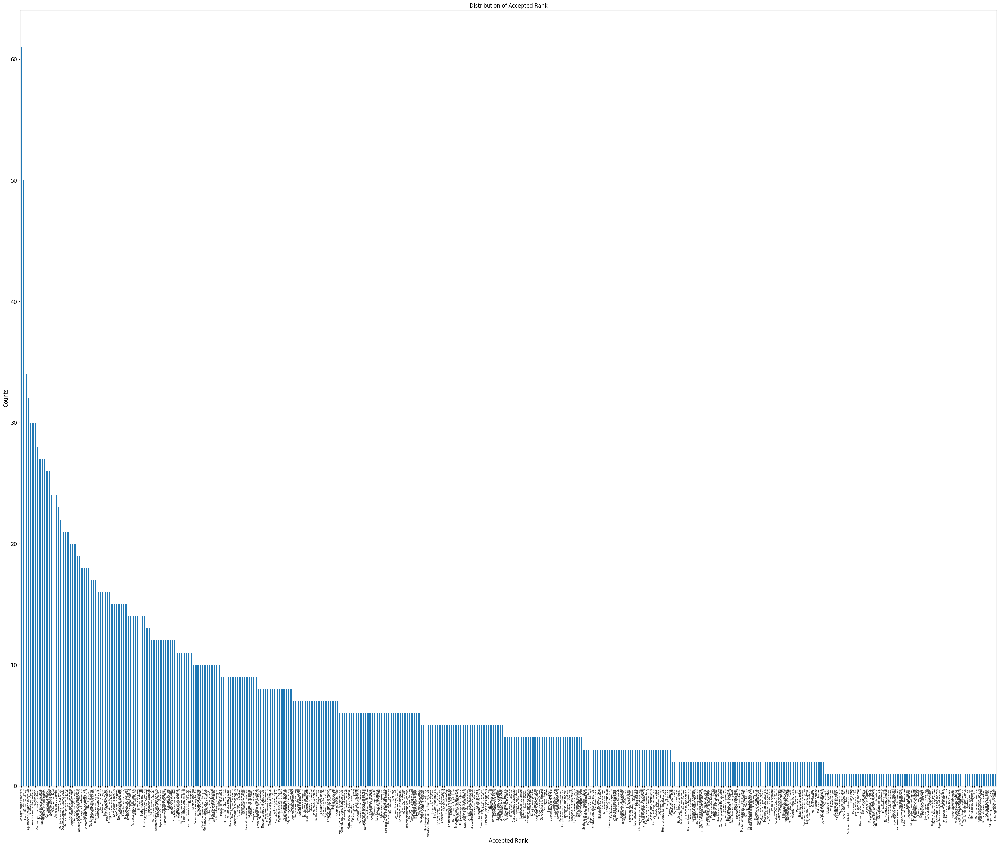

In [116]:
# Print value counts
print(dino['accepted_rank'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['accepted_name'].value_counts().plot(kind='bar', title='Distribution of Accepted Rank')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Accepted Rank', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Accepted Rank', fontsize=12)
plt.show()

#### The frequency distribution of Species  

species
Masiakasaurus knopfleri             61
Diplodocus longus                   50
Sinornithomimus dongi               34
Opisthocoelicaudia skarzynskii      32
Lesothosaurus diagnosticus          30
Giraffatitan brancai                30
Archaeornithomimus asiaticus        28
Hexinlusaurus multidens             27
Iguanodon bernissartensis           27
Microraptor zhaoianus               27
Gallimimus bullatus                 26
Camptosaurus dispar                 26
Aniksosaurus darwini                24
Galeamopus hayi                     24
Tastavinsaurus sanzi                24
Barosaurus lentus                   23
Mantellisaurus atherfieldensis      22
Acrocanthosaurus atokensis          21
Dysalotosaurus lettowvorbecki       21
Yutyrannus huali                    21
Agilisaurus louderbacki             20
Deinonychus antirrhopus             20
Ankylosaurus magniventris           20
Ceratosaurus nasicornis             19
Lamplughsaura dharmaramensis        19
Cetiosaurus oxoni

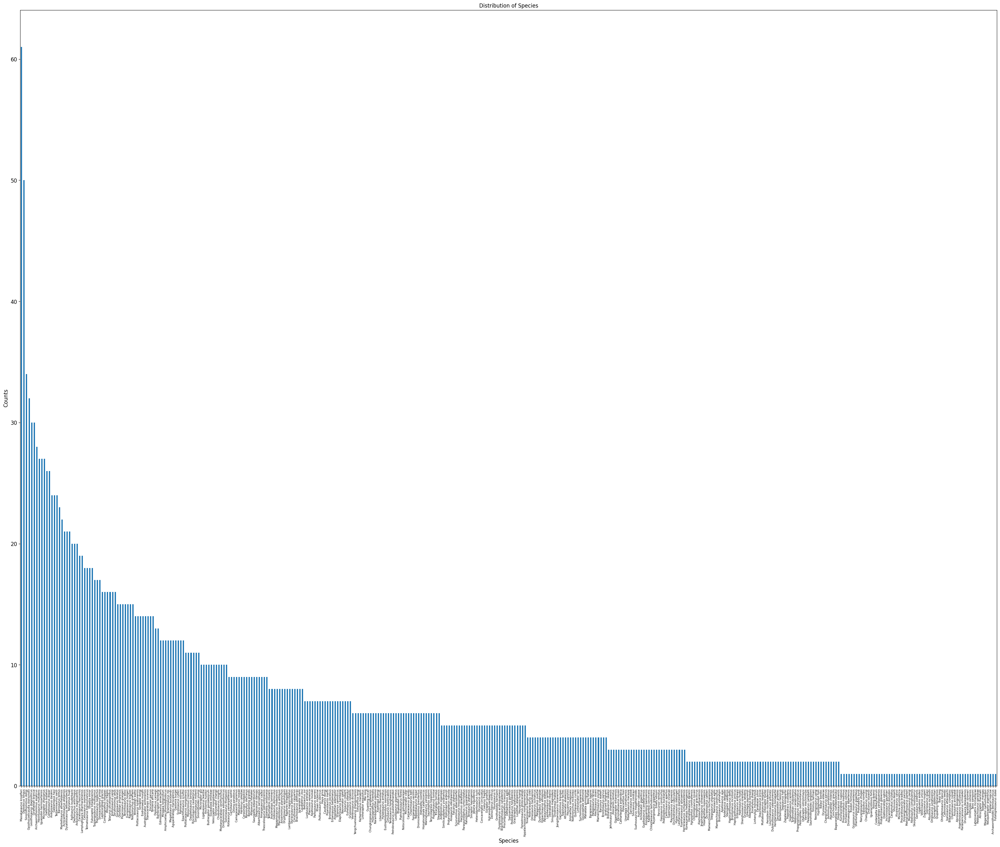

In [117]:
# Print value counts
print(dino['species'].value_counts())

# Plot bar chart
plt.figure(figsize=(40, 32))
dino['species'].value_counts().plot(kind='bar', title='Distribution of Species')
plt.xticks(rotation=90, fontsize=6)
plt.yticks(fontsize=12)
plt.xlabel('Species', fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title('Distribution of Species', fontsize=12)
plt.show()

### Frequency distributions for the remaining and lower-dimension categorical variables
**Note:** The variable ‘county’ was excluded from these plots due to issues with language variations, which rendered the plots unreadable. Furthermore, including ‘county’ did not provide additional insights into the geographical distribution of specimens beyond what is already highlighted in the relevant plots presented below.

identified_rank
species           2668
genus               45
family              24
subfamily            9
unranked clade       1
Name: count, dtype: int64


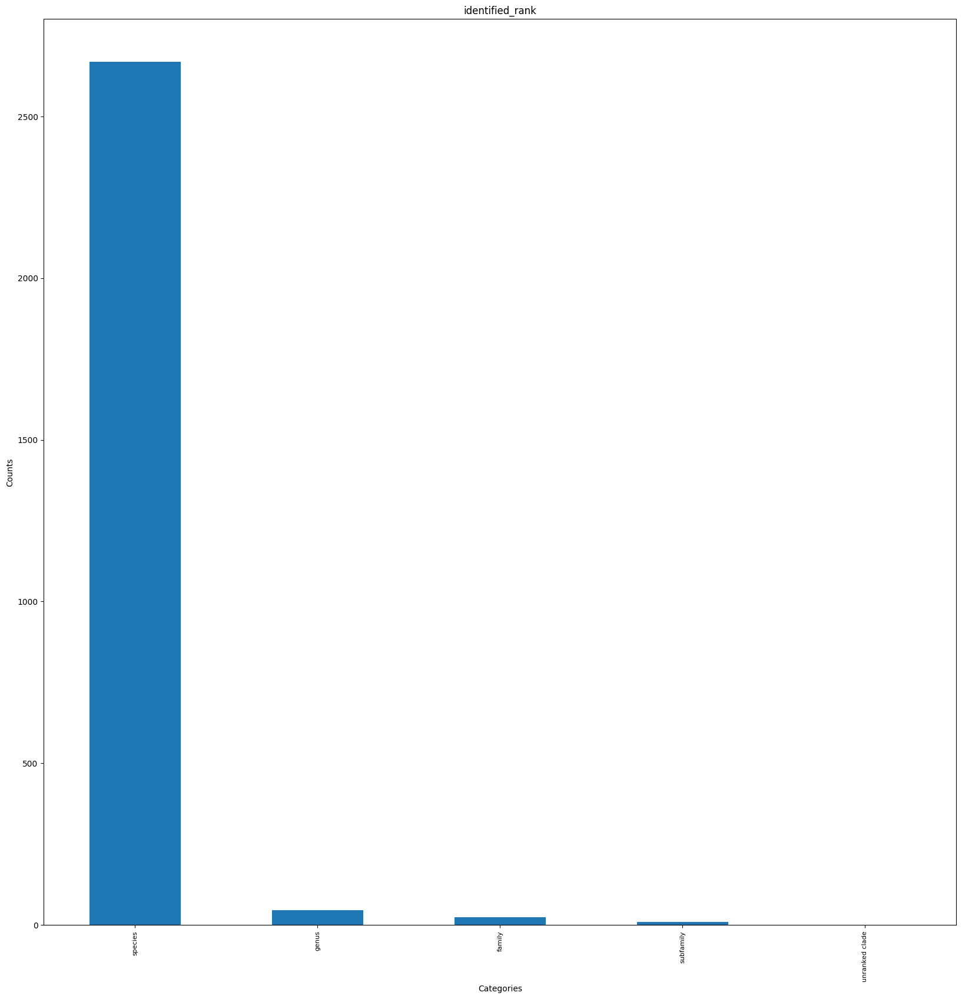

Country
US    705
CN    576
MN    226
AR    224
CA    188
UK     96
MG     88
DE     81
TZ     74
ZA     61
BE     48
ES     47
IN     44
AU     35
RU     28
RO     24
AT     24
NE     21
PT     21
JP     18
LS     17
MA     17
IT     15
ZW     13
FR     10
BR     10
AO      7
KG      6
HU      6
MX      5
KZ      3
CL      2
PK      2
KR      2
DZ      1
EG      1
TH      1
Name: count, dtype: int64


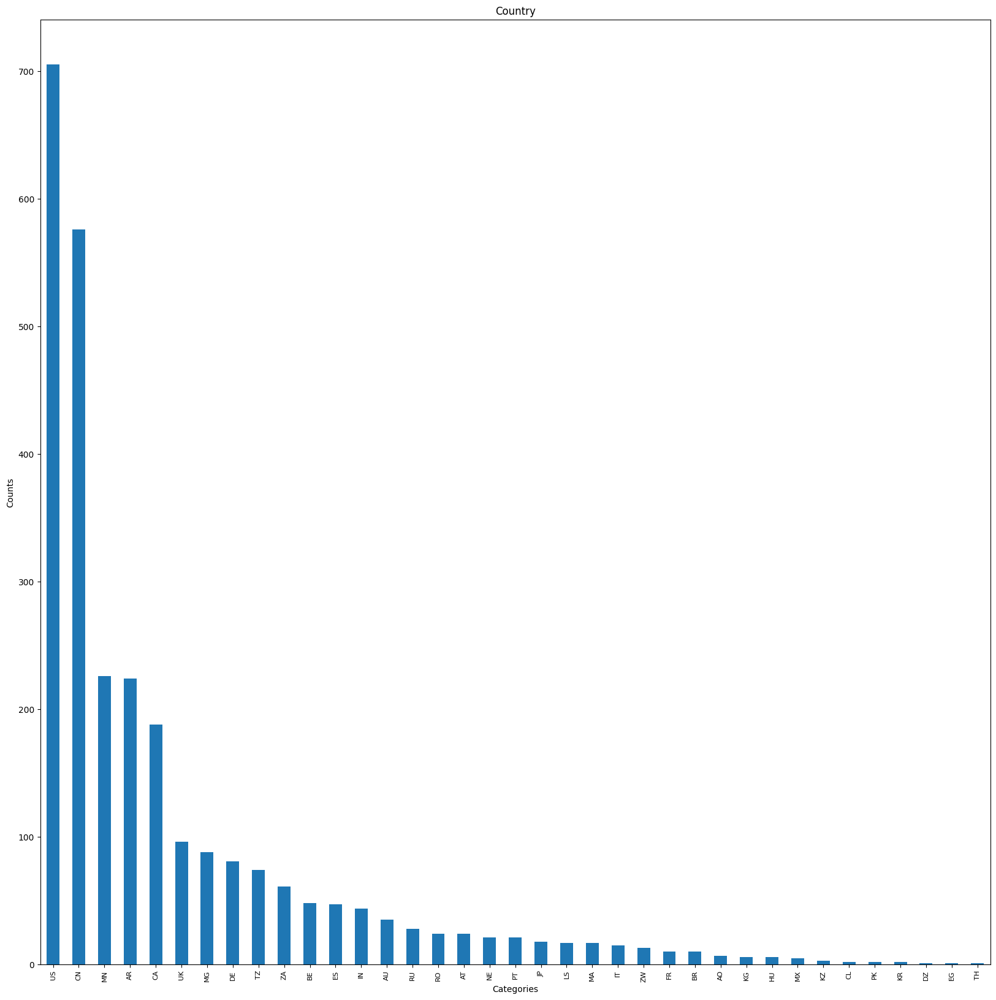

state
Liaoning                      219
Alberta                       188
Montana                       179
Omnogov                       171
Wyoming                       156
Utah                          150
Nei Mongol                    124
Sichuan                       121
England                        96
Mahajanga                      88
Neuquén                        86
Lindi                          74
Chubut                         69
Colorado                       65
Sauerland                      48
Xinjiang                       40
Texas                          39
New Mexico                     36
Dornogov                       34
Aragón                         33
Eastern Cape                   30
Free State                     30
Queensland                     30
Bayern                         29
Baden-Württemberg              29
San Juan                       29
Andhra Pradesh                 28
Niederosterreich               24
Hunedoara                      22
Gansu   

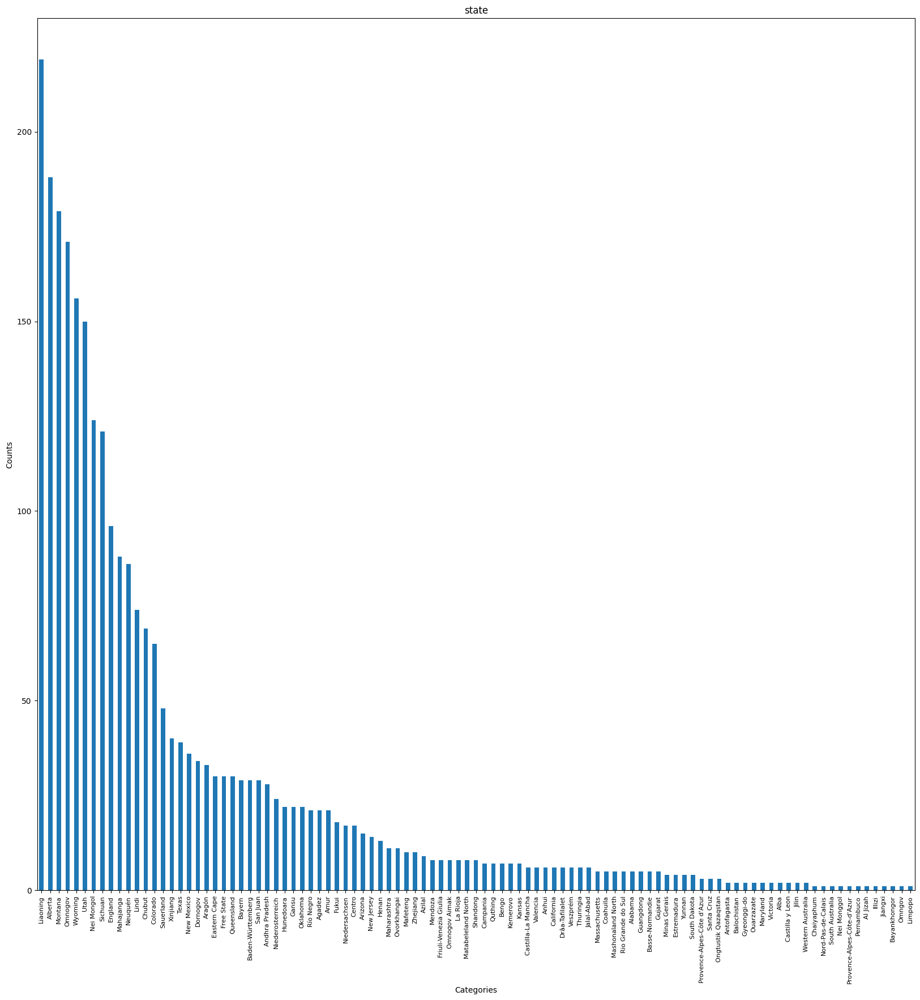

formation
Morrison                                              289
Yixian                                                154
Shaximiao                                             113
Nemegt                                                102
Maevarano                                              88
Dinosaur Park                                          86
Tendaguru                                              74
Elliot                                                 71
Hell Creek                                             57
Cedar Mountain                                         54
Sainte-Barbe Clays                                     48
Djadokhta                                              46
Iren Dabasu                                            44
Ulansuhai                                              44
Jiufotang                                              42
Bajo Barreal                                           39
Two Medicine                                           39
Hors

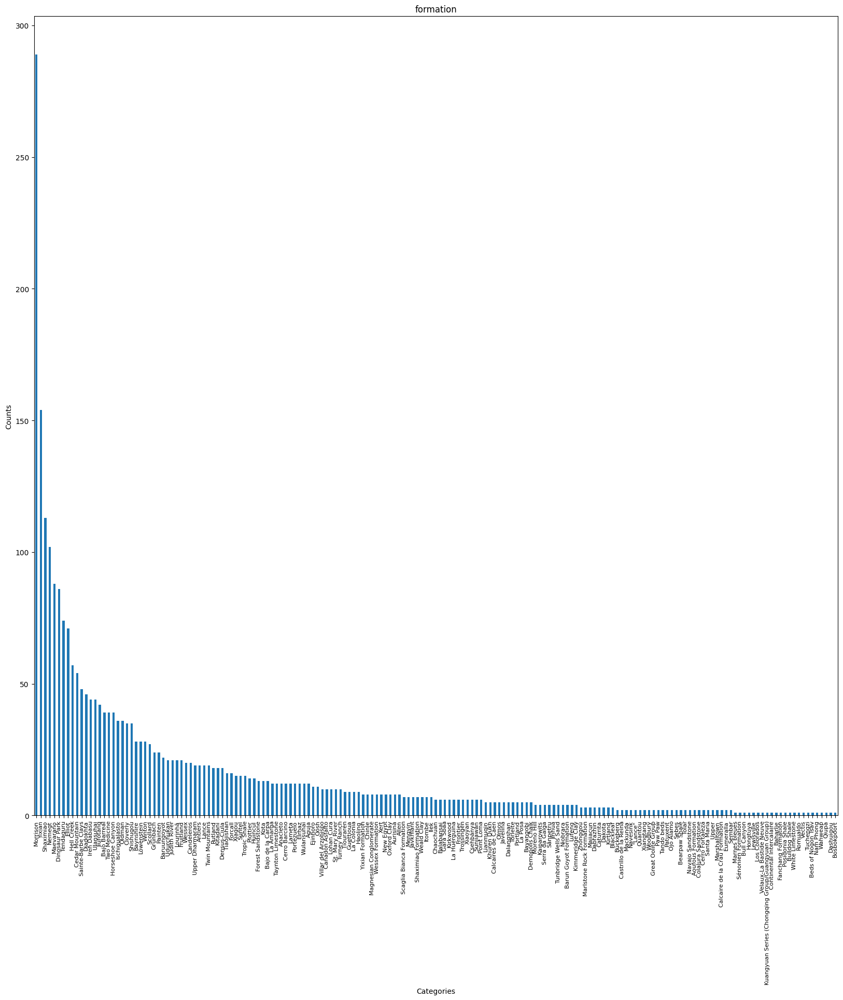

lithology1
sandstone          1050
not reported        526
claystone           320
mudstone            250
siltstone           141
"shale"             136
conglomerate         75
marl                 72
"limestone"          57
tuff                 39
"siliciclastic"      34
coal                 24
lime mudstone        17
"carbonate"           4
chalk                 2
Name: count, dtype: int64


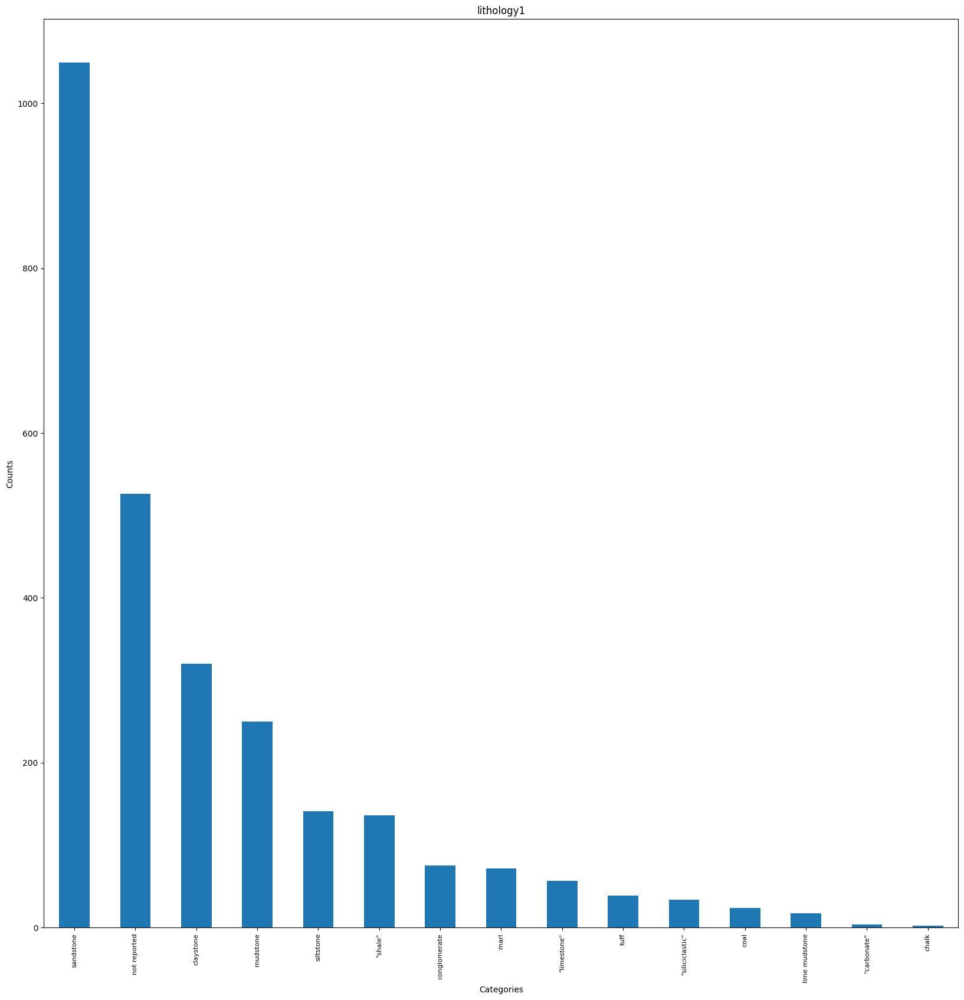

lithology2
sandstone          927
not reported       526
mudstone           355
claystone          286
siltstone          146
marl               107
"shale"             85
"limestone"         65
tuff                59
bituminous coal     48
"siliciclastic"     38
conglomerate        37
ironstone           18
lime mudstone       13
breccia              8
wackestone           8
bindstone            8
packstone            6
"carbonate"          4
chalk                2
chert                1
Name: count, dtype: int64


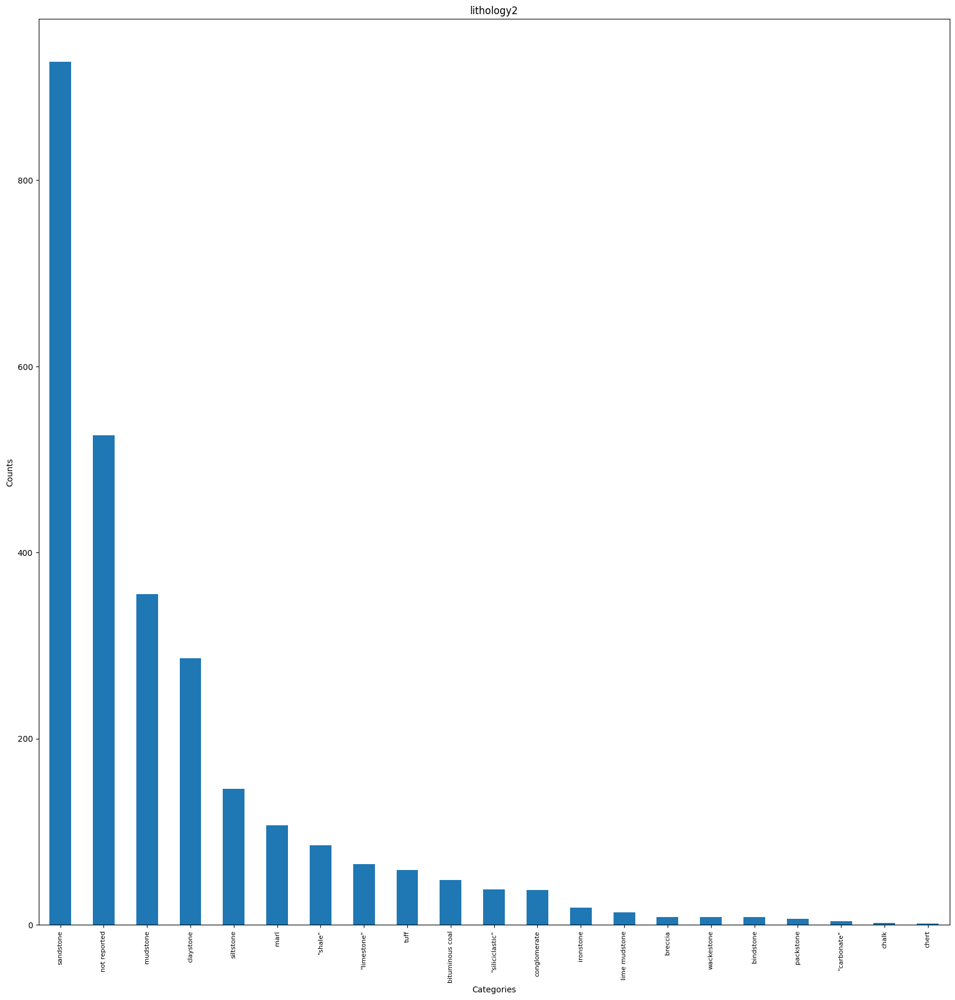

assembl_comps
macrofossils                             1873
macrofossils,mesofossils                  780
macrofossils,mesofossils,microfossils      75
macrofossils,microfossils                  19
Name: count, dtype: int64


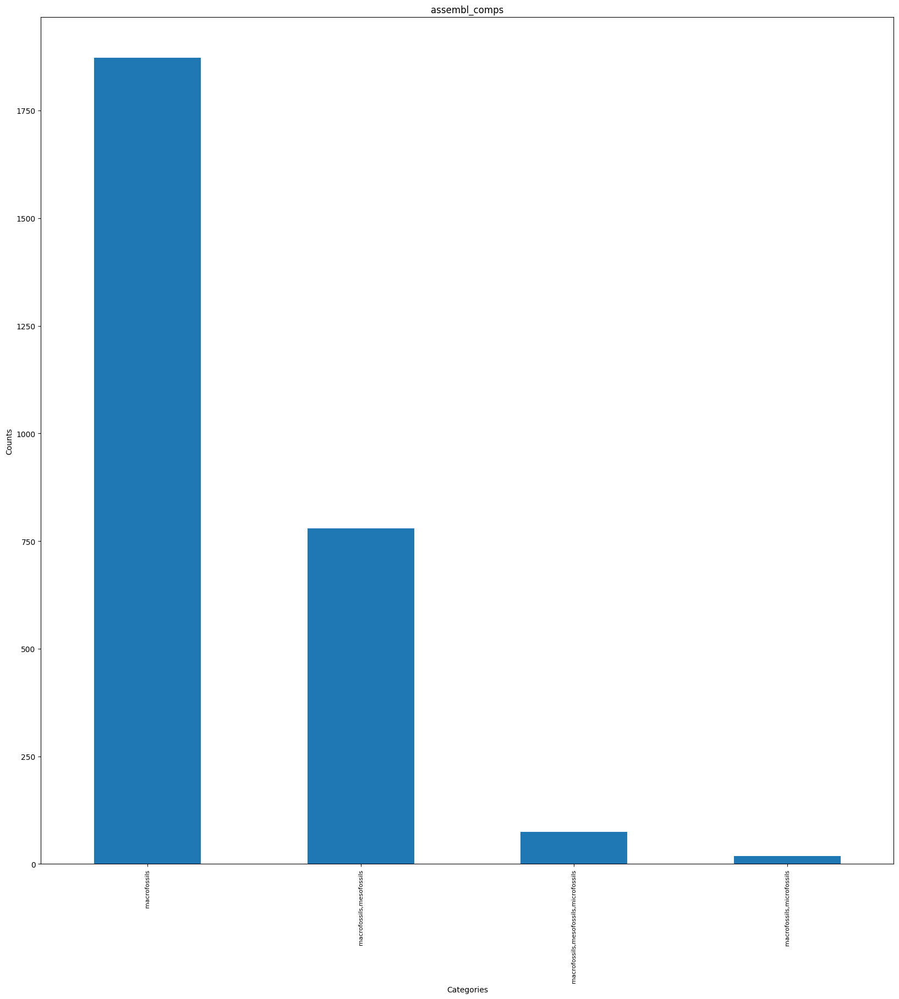

pres_mode
body                                                                    2162
body,trace                                                               126
body,adpression,soft parts                                                98
body,concretion                                                           67
body,soft parts                                                           67
body,trace,coprolite                                                      48
body,adpression                                                           46
body,mold/impression                                                      25
body,mold/impression,soft parts                                           20
body,mold/impression,trace                                                16
body,mold/impression,adpression,replaced with calcite                     16
body,mold/impression,concretion,soft parts                                 9
body,replaced with calcite,replaced with silica,replaced with pyri

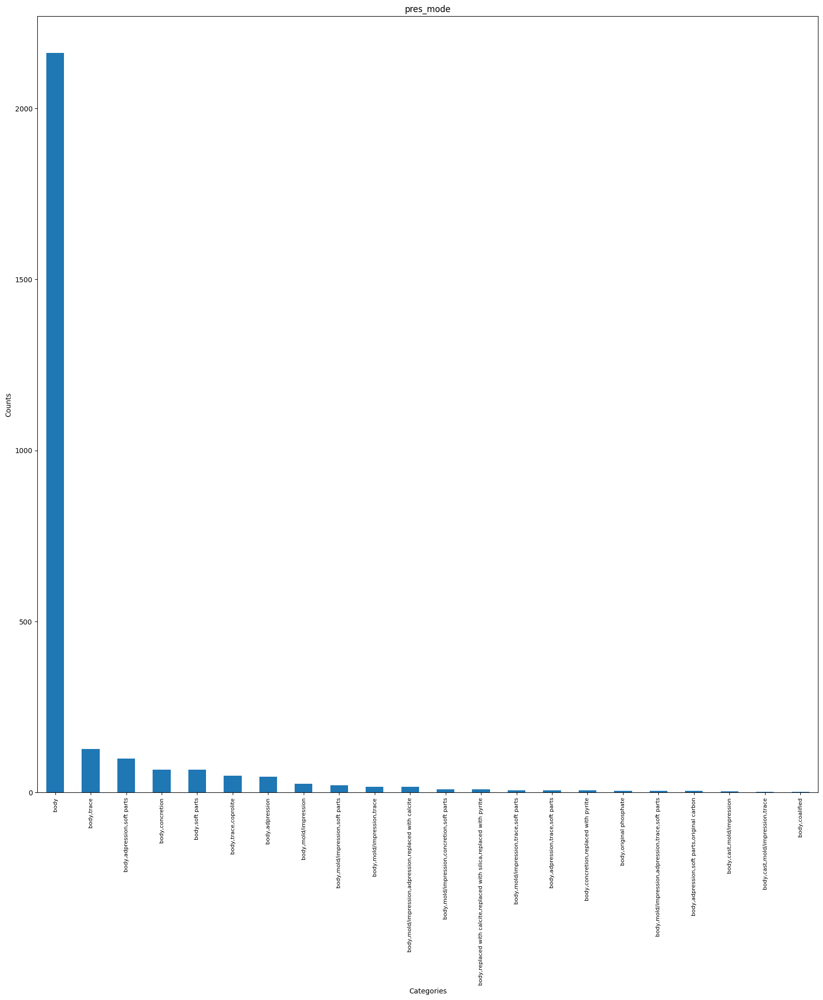

preservation_quality
good            1453
excellent        633
not reported     297
medium           253
poor              74
variable          37
Name: count, dtype: int64


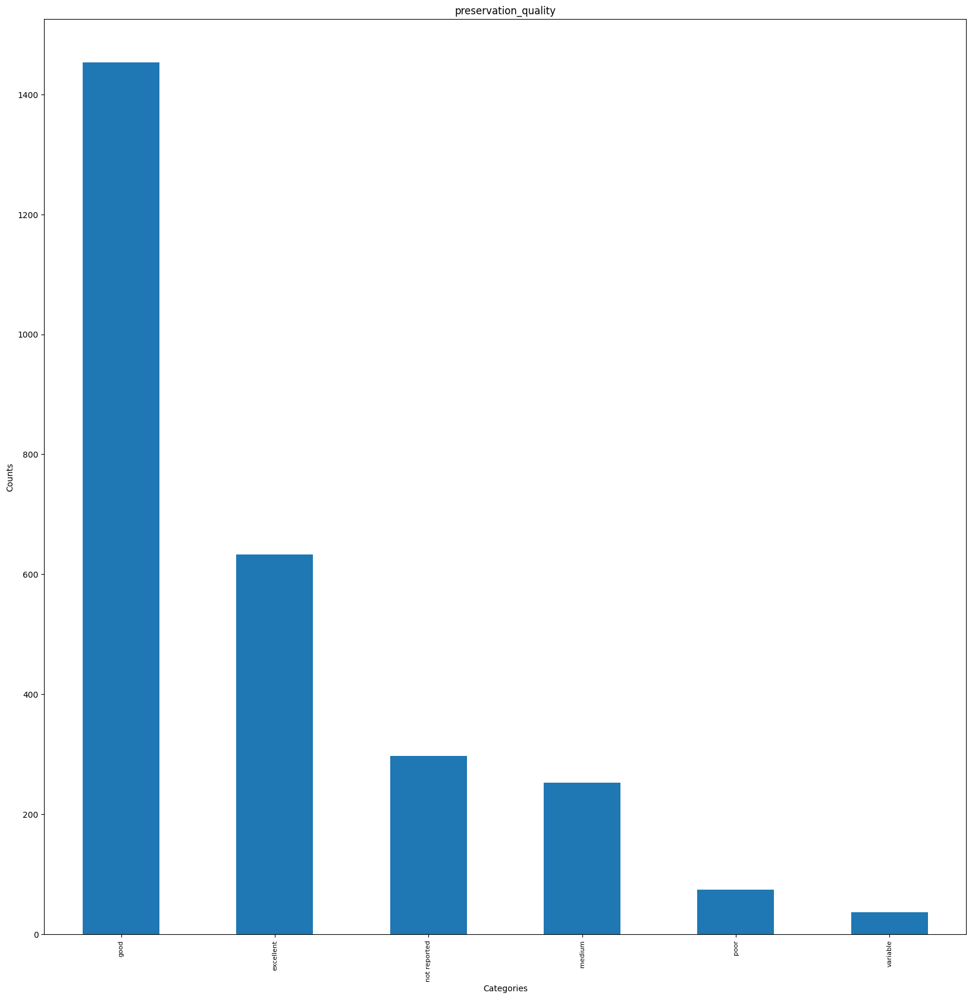

measurement_type
length           2055
width             497
circumference     149
diameter           41
height              5
Name: count, dtype: int64


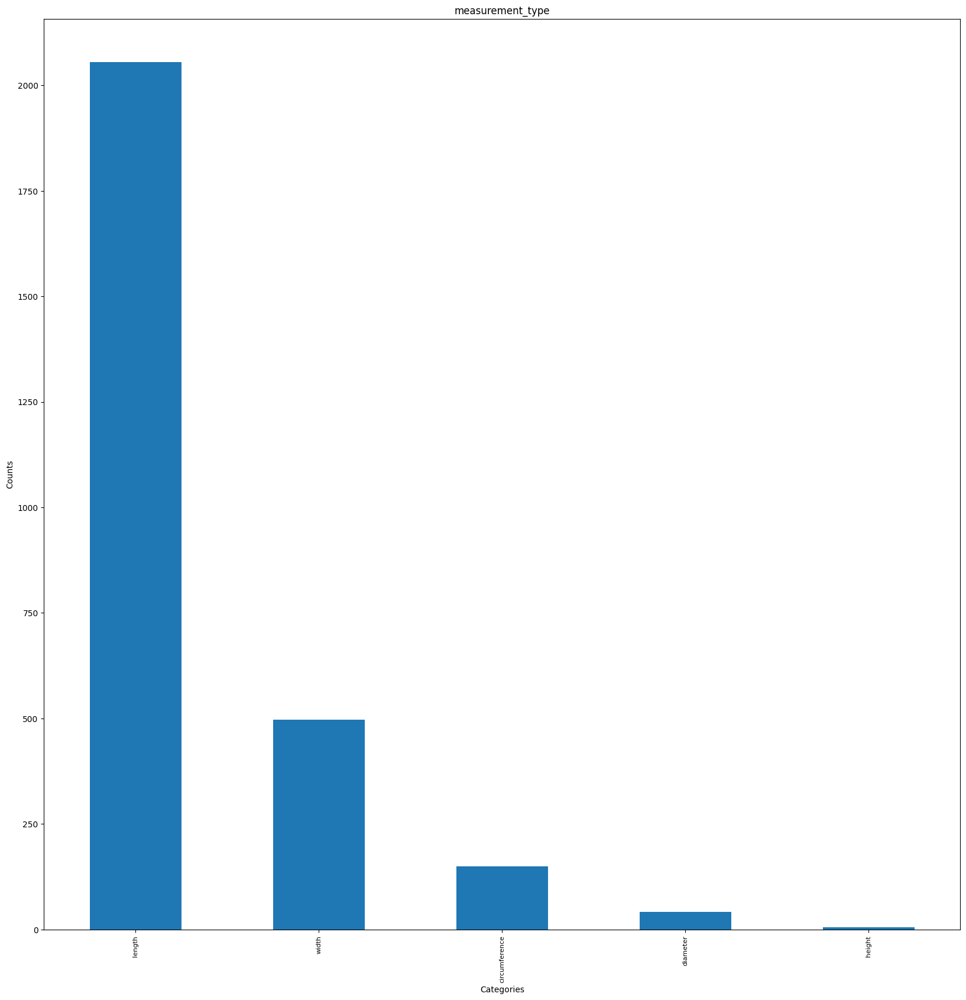

fragmentation
occasional      1786
none             407
frequent         349
not reported     169
extreme           36
Name: count, dtype: int64


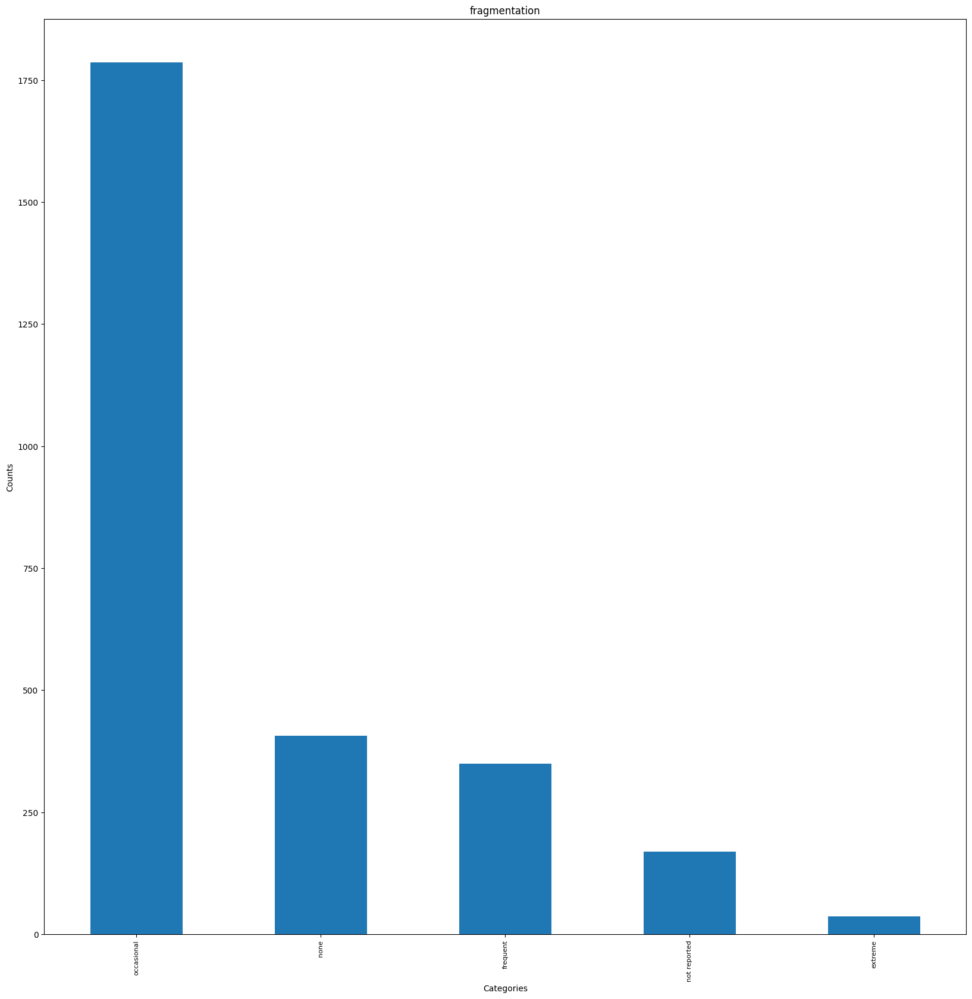

In [118]:
#Visualising the distribution of frequencies within the categorical variables of the dataset

# List of categorical features
categorical_features = ['identified_rank', 'Country', 'state', 'formation', 'lithology1', 'lithology2', 'assembl_comps', 'pres_mode', 'preservation_quality', 'measurement_type', 'fragmentation']

for feature in categorical_features:
    # Print value counts
    print(dino[feature].value_counts())
    
    # Plot bar chart
    plt.figure(figsize= (20, 20))
    dino[feature].value_counts().plot(kind='bar', title=feature)
    plt.xticks(rotation=90, fontsize= 8) 
    plt.yticks()
    plt.xlabel('Categories')
    plt.ylabel('Counts')
    plt.title(feature)
    plt.show()

#### Inspecting and visualising relationships between variables
The subsequent section of the exploratory data analysis (EDA) examines the interrelationships among variables to gain a comprehensive understanding of the data and the interactions between features. This phase continues to address the overall EDA objectives, ensuring that the dataset is meticulously cleaned and devoid of errors.

Following the univariate analysis, the next section presents visualisations illustrating multivariate interactions between the variables in the dataset. These visualisations provide a deeper insight into the relationships and distributions across multiple dimensions of the data. Noticeably the interaction between many variables further highlights the uneven nature of the dataset, as previously observed in the univariate plots. This uneven distribution remains evident in the interactions between variables, reflecting the challenges inherent in palaeontological data, where some categories or periods are overrepresented relative to others. Despite this skewness, the visualisations reveal a notable breadth in time estimates and geological periods, suggesting that the dataset encompasses a wide temporal range and diverse geological contexts.

Within the multivariate analysis, geographic plotting has been employed to map specimen occurrences across various counties, distinguishing between regions with and without specimens. This approach highlights the geographic distribution and contextual variations, revealing areas with concentrated data and regions with sparse information. Histograms further illustrate the distribution of specimens by country, state, and formation, offering a comprehensive view of geographical and contextual variations at different levels of granularity.

Box plots have been used to display the distribution of age estimates, highlighting the spread and central tendency of these values and underscoring the temporal breadth of the dataset. This visualisation captures the variability in age estimates across specimens, enhancing the understanding of temporal dynamics within the dataset. Additional histograms depict the distribution of species based on total age estimates and the frequency of each type of specimen part, providing insights into the dataset’s composition and variability.

To address the challenge of presenting a large number of names and categories, tree maps have been constructed to visualise the number of species per genus and the number of specimens per species, offering a clear and comprehensible format. A further tree map illustrates the distribution of specimens across various taxonomic categories, highlighting the hierarchical structure of the dataset. Finally, the distribution of measurements across different types has been plotted, offering further insights into the dataset’s attributes and enhancing the overall understanding of its characteristics. These visualisations collectively provide a nuanced view of the dataset, laying a robust foundation for further exploration and model development.


#### Visualising the taxonomic hierarchy for this dataset

In [119]:
# Create a sunburst plot
fig = px.sunburst(
    dino,
    path=['order', 'family', 'genus', 'accepted_name'],  # Hierarchical levels
    title='Hierarchical Plot of Taxonomic Levels',
    labels={'order': 'Order', 'family': 'Family', 'genus': 'Genus', 'species': 'Species'},
    template='simple_white'
)

# Update layout for better readability
fig.update_layout(
    height=1000,  # Increase the height
    width=1000,   # Increase the width
    title_font_size=24,  # Increase the title font size for better visibility
    font=dict(size=14)   # Increase the font size for better readability
)

# Save as a large HD version
fig.write_image("sunburst_plot_hd.png", scale=3)  # Adjust scale for HD

# Show the figure
fig.show()

##### Develop a dictionary for country codes for interpretability

The univariate examination of the Country plot revealed that the included country codes were not readily interpretable. To enhance the clarity and interpretability of future plots, the following dictionary will be employed to map these country codes to their full country names.

In [120]:
# Replace 'United States' with 'United States of America' for mapping purpose which uses formal names
dino.loc[dino['Country'] == 'United States', 'Country'] = 'United States of America'

# Building a dictionary for country codes used in the country variable to ease future readability and interpretation 
country_codes = {'US': 'United States of America', 'CN': 'China', 'MN': 'Mongolia', 'AR': 'Argentina', 
    'CA': 'Canada', 'UK': 'United Kingdom', 'MG': 'Madagascar', 'DE': 'Germany', 
    'TZ': 'Tanzania', 'ZA': 'South Africa', 'BE': 'Belgium', 'ES': 'Spain', 
    'IN': 'India', 'AU': 'Australia', 'RU': 'Russia', 'RO': 'Romania', 
    'AT': 'Austria', 'NE': 'Niger', 'PT': 'Portugal', 'JP': 'Japan', 
    'LS': 'Lesotho', 'MA': 'Morocco', 'IT': 'Italy', 'ZW': 'Zimbabwe', 
    'FR': 'France', 'BR': 'Brazil', 'AO': 'Angola', 'KG': 'Kyrgyzstan', 
    'HU': 'Hungary', 'MX': 'Mexico', 'KZ': 'Kazakhstan', 'CL': 'Chile', 
    'PK': 'Pakistan', 'KR': 'South Korea', 'DZ': 'Algeria', 'EG': 'Egypt', 
    'TH': 'Thailand'}
country_counts = dino['Country'].value_counts()

# Print the counts with full country names
for code, count in country_counts.items():
    country_name = country_codes.get(code)
    print(f"{country_name}: {count}")

United States of America: 705
China: 576
Mongolia: 226
Argentina: 224
Canada: 188
United Kingdom: 96
Madagascar: 88
Germany: 81
Tanzania: 74
South Africa: 61
Belgium: 48
Spain: 47
India: 44
Australia: 35
Russia: 28
Romania: 24
Austria: 24
Niger: 21
Portugal: 21
Japan: 18
Lesotho: 17
Morocco: 17
Italy: 15
Zimbabwe: 13
France: 10
Brazil: 10
Angola: 7
Kyrgyzstan: 6
Hungary: 6
Mexico: 5
Kazakhstan: 3
Chile: 2
Pakistan: 2
South Korea: 2
Algeria: 1
Egypt: 1
Thailand: 1


##### Link countries and states for further interpretability

In [121]:
# Create a dictionary to store the state-to-country mappings
state_to_country = {}

# Iterate through the 'state' and 'Country' columns
for index, row in dino.iterrows():
    state = row['state']
    country_code = row['Country']
    
    # Check if the state and country_code are not null
    if pd.notnull(state) and pd.notnull(country_code):
        # Get the full country name from the country_codes dictionary
        country_name = country_codes.get(country_code, 'Unknown')
        
        # Add the state-to-country mapping to the dictionary
        state_to_country[state] = country_name

# Create a new column in the DataFrame for the state-country mapping
dino['state_country'] = dino['state'].map(state_to_country)

# Display the unique values in the 'state' column along with their corresponding countries
unique_states_countries = dino[['state', 'state_country']].drop_duplicates()

print("Unique values in 'state' column and their corresponding countries:")
print(unique_states_countries)

Unique values in 'state' column and their corresponding countries:
                           state             state_country
0                        Neuquén                 Argentina
1                          Lindi                  Tanzania
5                     New Jersey  United States of America
9                        Wyoming  United States of America
15                       Omnogov                  Mongolia
21                    Nei Mongol                     China
33                       Alberta                    Canada
50                       Montana  United States of America
68                  South Dakota  United States of America
77                      Oklahoma  United States of America
92                          Utah  United States of America
119                      England            United Kingdom
149                     Colorado  United States of America
171                        Texas  United States of America
183                   New Mexico  United States 

##### Visualise the number of specimens discovered at the different levels of location

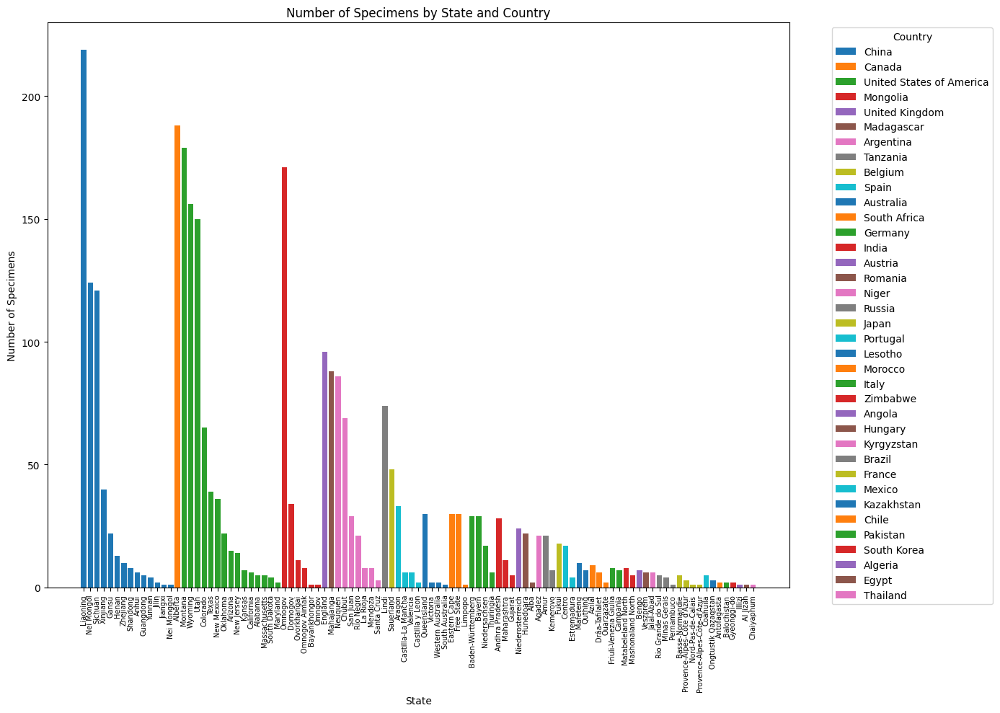

In [122]:
# Create a DataFrame with state, country, and count the occurrences
state_country_counts = dino.groupby(['state_country', 'state']).size().reset_index(name='count')

# Sort the DataFrame by count in descending order, and then by country and state for better visualization
state_country_counts = state_country_counts.sort_values(by=['count', 'state_country', 'state'], ascending=[False, True, True])

# Plotting
plt.figure(figsize=(14, 10))

# Create a bar plot with sorted data
for country in state_country_counts['state_country'].unique():
    subset = state_country_counts[state_country_counts['state_country'] == country]
    plt.bar(subset['state'], subset['count'], label=country)

# Set the labels and title
plt.xlabel('State')
plt.ylabel('Number of Specimens')
plt.title('Number of Specimens by State and Country')
plt.xticks(rotation=90, fontsize=7)
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()

In [123]:
# Group by country and aggregate states into a list
states_by_country = state_country_counts.groupby('state_country')['state'].apply(list).reset_index()

# Print states by country
print(states_by_country.to_string(index=False))

           state_country                                                                                                                                                    state
                 Algeria                                                                                                                                                 [Illizi]
                  Angola                                                                                                                                                  [Bengo]
               Argentina                                                                                    [Neuquén, Chubut, San Juan, Río Negro, La Rioja, Mendoza, Santa Cruz]
               Australia                                                                                               [Queensland, Victoria, Western Australia, South Australia]
                 Austria                                                                                      

##### Visualise this relationship geographically
A global geoplot illustrating the countries from which specimens in this dataset originate, providing a broad overview of their distribution.

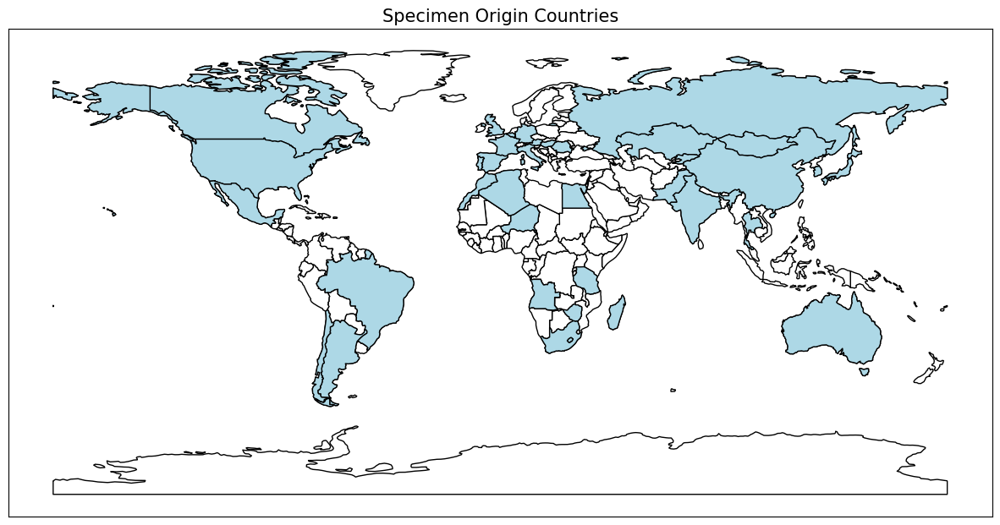

In [124]:
# Load the specific layer from the shapefile
world = gpd.read_file('/Users/james_smith/Documents/110m_cultural', layer='ne_110m_admin_0_countries')

# Ensure the geometry column is set correctly
world = world.set_geometry('geometry')

# Get unique countries in dino['Country']
dino_countries = dino['Country'].map(country_codes).dropna().unique()

# Filter the world map to include only the countries present in the dino data
world_dino = world[world['NAME'].isin(dino_countries)]

# Plotting
fig, ax = plt.subplots(figsize=(15, 10))

# Plot all countries in light grey
world.plot(ax=ax, color='white', edgecolor='black')

# Plot only the countries with specimens in blue
world_dino.plot(ax=ax, color='lightblue', edgecolor='black')

# Customize plot
ax.set_title('Specimen Origin Countries', fontdict={'fontsize': 15})

# Remove ticks and labels from x and y axes
ax.tick_params(left=False, bottom=False)
ax.set_xticks([])
ax.set_yticks([])

# Enable the border around the map
ax.set_frame_on(True)
# Show the plot
plt.show()

##### With added geographic formation locations 
Intending to build upon the above Geoplot by detailing the specific locations of fossil discoveries on a global scale, offering a more granular view of their geographical distribution.

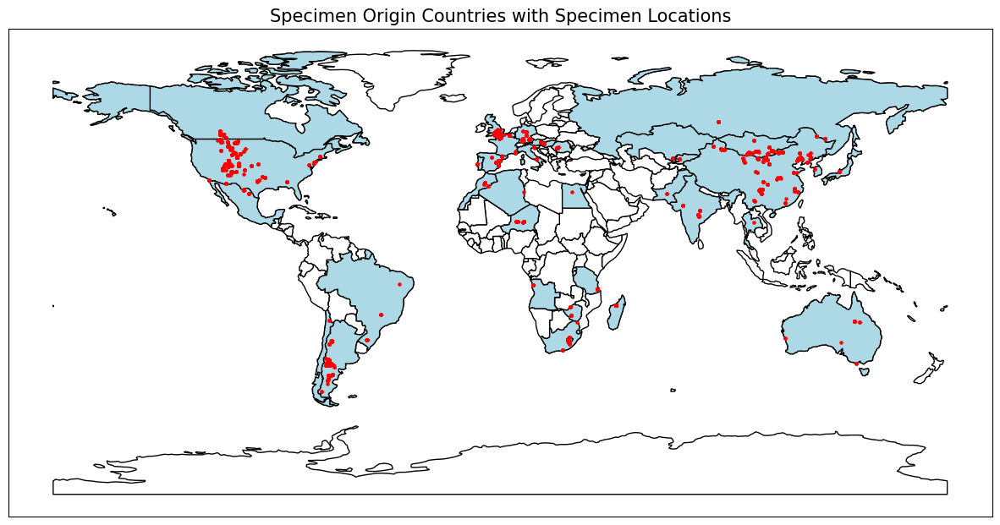

In [125]:
# Plotting
fig, ax = plt.subplots(figsize=(15, 10))

# Plot all countries in light grey
world.plot(ax=ax, color='white', edgecolor='black')

# Plot only the countries with specimens in blue
world_dino.plot(ax=ax, color='lightblue', edgecolor='black')

# Plot longitude and latitude points as red dots
ax.scatter(dino['longitude'], dino['latitude'], color='red', s=5)

# Customize plot
ax.set_title('Specimen Origin Countries with Specimen Locations', fontdict={'fontsize': 15})

# Remove ticks and labels from x and y axes
ax.tick_params(left=False, bottom=False)
ax.set_xticks([])
ax.set_yticks([])

# Enable the border around the map
ax.set_frame_on(True)

# Show the plot
plt.show()

The geographical dispersion of the palaeobiological dataset exhibits a comprehensive global coverage, reflecting a broad array of specimens distributed across various continents. The dataset encompasses a diverse range of countries, with specific regional data provided for many, such as the United States, where multiple states are represented, and Argentina, with detailed provincial information. This extensive coverage spans all major continents, including Africa, Asia, Europe, North America, South America, and Oceania, highlighting the dataset’s global reach. Notably, while the dataset captures significant regional diversity, certain areas exhibit sparse data, which may suggest limitations in data availability or indicate opportunities for further research. Overall, the dataset’s geographical dispersion underscores its extensive representation of fossil records and contributes to a well-rounded understanding of global palaeobiological distribution.

##### Visualising formations by country location

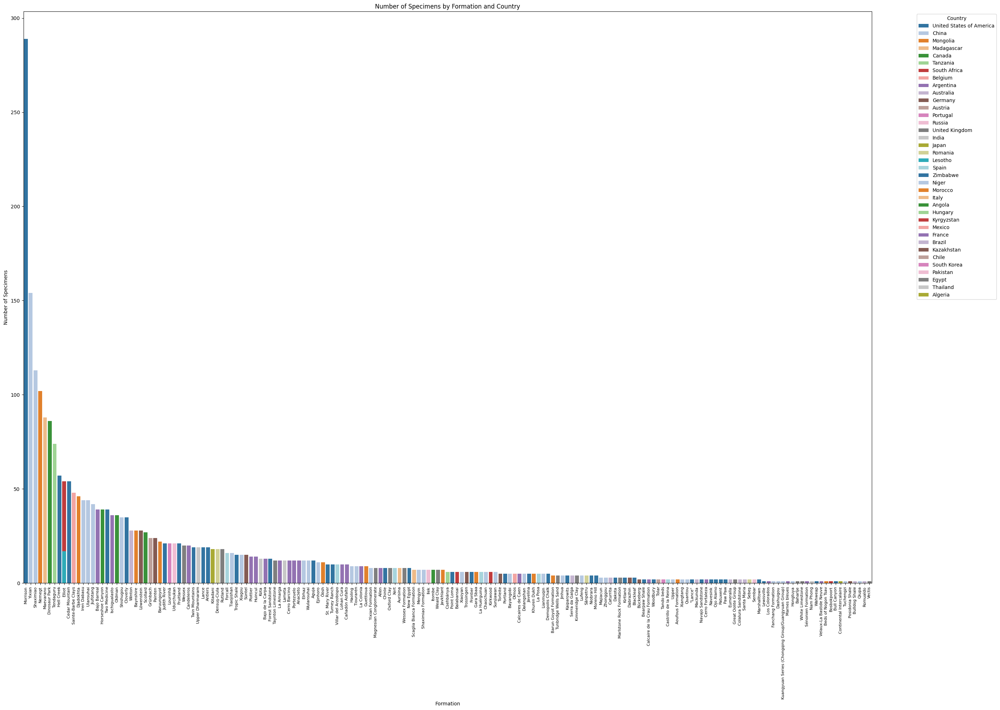

In [126]:
# Create a DataFrame with formation, country, and count the occurrences
formation_counts = dino.groupby(['formation', 'state_country']).size().reset_index(name='count')

# Sort the DataFrame by count for better visualization
formation_counts = formation_counts.sort_values(by='count', ascending=False)

# Plotting
plt.figure(figsize=(28, 20))

# Create a bar plot
sns.barplot(x='formation', y='count', hue='state_country', data=formation_counts, dodge=False, palette='tab20')

# Set the labels and title
plt.xlabel('Formation')
plt.ylabel('Number of Specimens')
plt.title('Number of Specimens by Formation and Country')
plt.xticks(rotation=90, fontsize=8)  # Rotate the x-axis labels for better readability
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()

# Show the plot
plt.show()

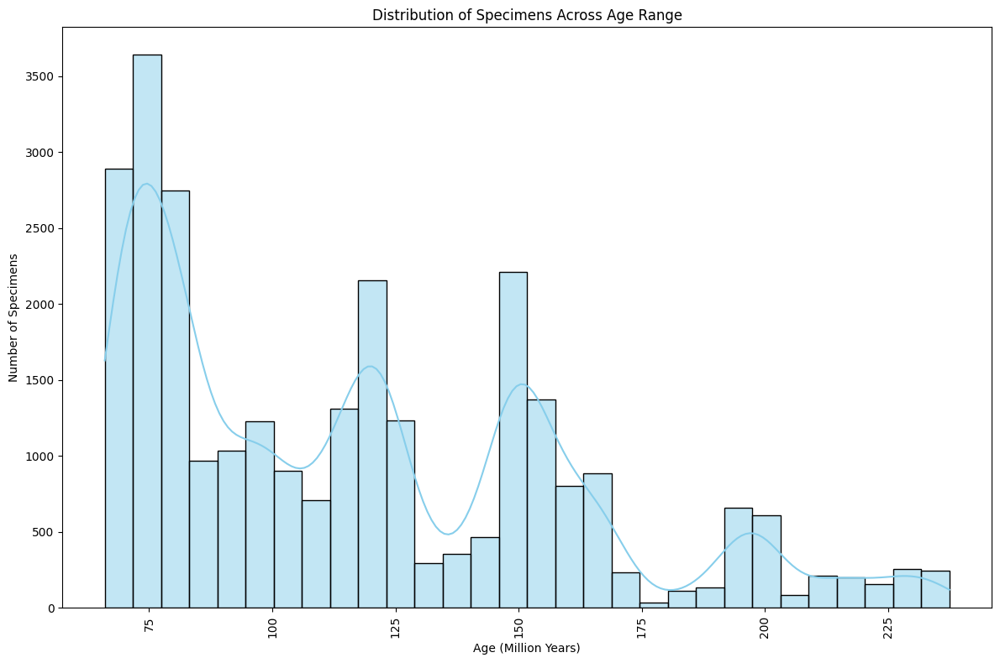

In [127]:
# Create a list to store all age values
all_ages = []

# Flatten age ranges into a list
for _, row in dino.iterrows():
    # Use np.arange to include all ages from min_ma to max_ma
    all_ages.extend(np.arange(row['min_ma'], row['max_ma'] + 1))

# Plotting Space
plt.figure(figsize=(12, 8))

# Create a histogram
sns.histplot(all_ages, bins=30, kde=True, color='skyblue', edgecolor='black')

# Set the labels and title
plt.xlabel('Age (Million Years)')
plt.ylabel('Number of Specimens')
plt.title('Distribution of Specimens Across Age Range')

plt.xticks(rotation=90, fontsize=10) 
plt.tight_layout()

# Show the plot
plt.show()

The histogram illustrating the distribution of specimens across age ranges provides a general trend of how specimens are distributed over time. However, this representation should be interpreted with caution due to the nature of the data. Each specimen is associated with an age range, defined by a min_ma (minimum age) and max_ma (maximum age), rather than a specific point in time.

In the histogram, these ranges have been flattened to include every integer year between min_ma and max_ma, resulting in multiple counts for overlapping or contiguous age ranges. This flattening leads to an inflated frequency count for certain ages, as specimens spanning a wide range contribute to the counts in every year within their range. Consequently, the histogram reflects a generalized view of specimen distribution, emphasizing broad patterns rather than exact frequencies.

To obtain a more accurate distribution, it would be necessary to consider the age ranges more precisely or aggregate the data into distinct bins that capture the ranges in a way that avoids counting the same age multiple times. Nonetheless, the current histogram is useful for identifying overarching trends in the temporal distribution of specimens.

#### Specimen Parts by Quality

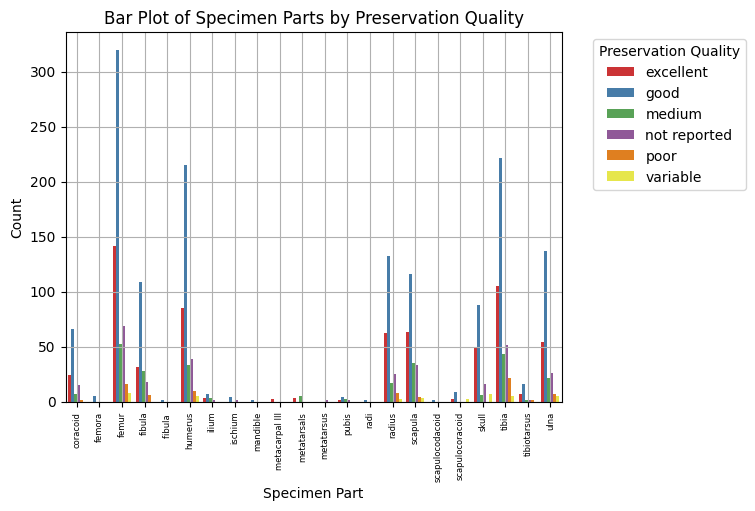

In [128]:
# Prepare data for bar plot
plot_data = dino[['specimen_part', 'preservation_quality']].dropna()

# Convert categorical preservation quality to a numerical scale for plotting
plot_data['pres_quality_numeric'] = plot_data['preservation_quality'].astype('category').cat.codes

# Aggregate data by specimen_part and preservation_quality
bar_data = plot_data.groupby(['specimen_part', 'preservation_quality']).size().reset_index(name='count')

# Create a bar plot for specimen parts by preservation quality
plt.figure()
sns.barplot(data=bar_data, x='specimen_part', y='count', hue='preservation_quality', palette='Set1')
plt.title('Bar Plot of Specimen Parts by Preservation Quality')
plt.xlabel('Specimen Part')
plt.ylabel('Count')
plt.xticks(rotation=90, fontsize=6)
plt.legend(title='Preservation Quality', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

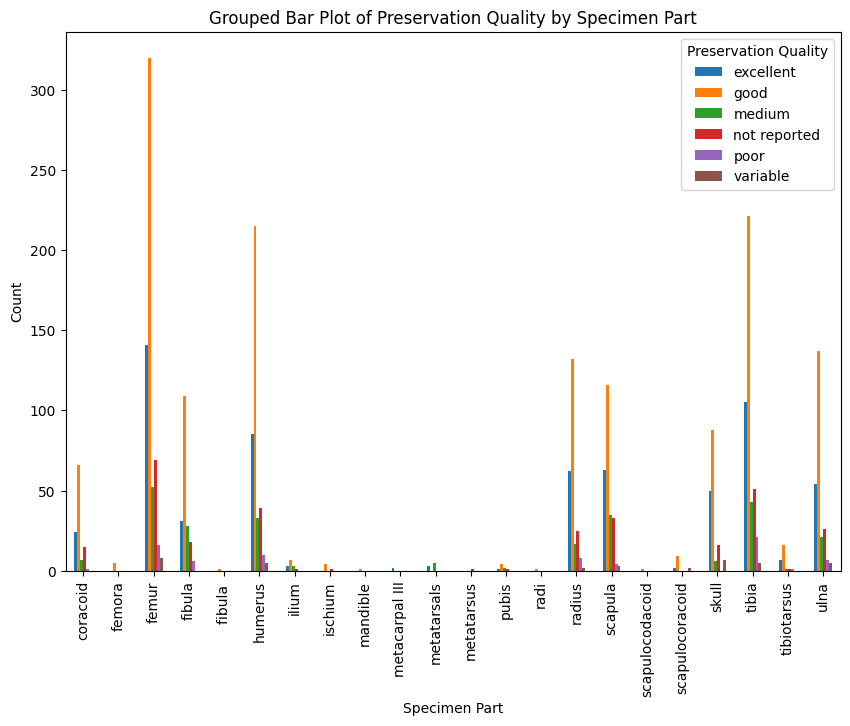

In [129]:
# Count occurrences
count_data = dino.groupby(['specimen_part', 'preservation_quality']).size().unstack()

# Plot grouped bar plot
count_data.plot(kind='bar', figsize=(10, 7))
plt.title('Grouped Bar Plot of Preservation Quality by Specimen Part')
plt.xlabel('Specimen Part')
plt.ylabel('Count')
plt.legend(title='Preservation Quality')
plt.show()

/var/folders/n7/94bnmfqd6dv3s73zb4zp6c140000gn/T/ipykernel_12404/3197754465.py:8: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



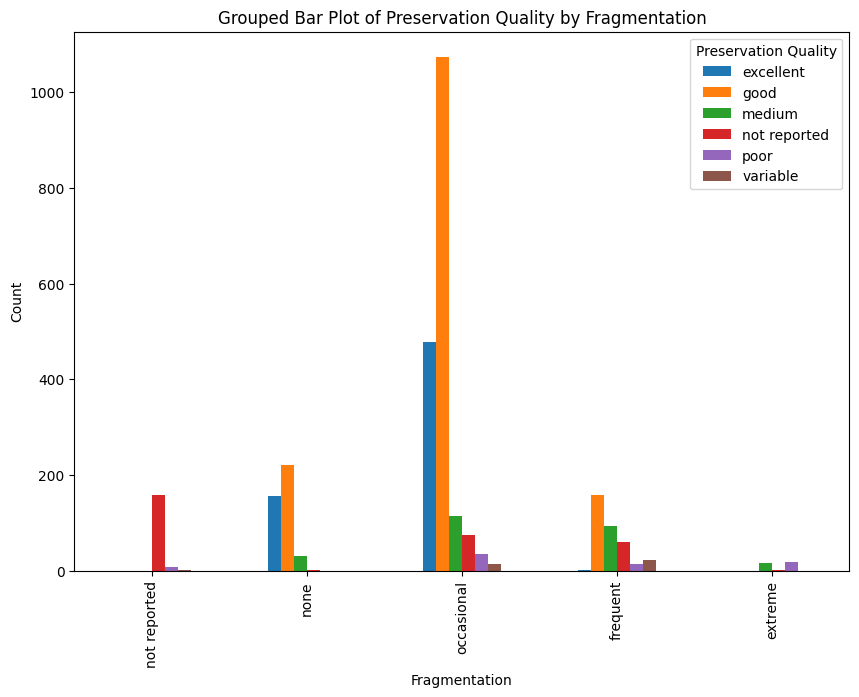

In [130]:
# Define the desired order for fragmentation categories
fragmentation_order = ["not reported", "none", "occasional", "frequent", "extreme"]

# Ensure 'fragmentation' is a categorical type with the defined order
dino['fragmentation'] = pd.Categorical(dino['fragmentation'], categories=fragmentation_order, ordered=True)

# Count occurrences
count_data = dino.groupby(['fragmentation', 'preservation_quality']).size().unstack()

# Plot grouped bar plot
count_data.plot(kind='bar', figsize=(10, 7))
plt.title('Grouped Bar Plot of Preservation Quality by Fragmentation')
plt.xlabel('Fragmentation')
plt.ylabel('Count')
plt.legend(title='Preservation Quality')
plt.show()

age_category
101-150 MYA    964
71-100 MYA     746
151-200 MYA    492
0-70 MYA       446
201-250 MYA     99
Name: count, dtype: int64


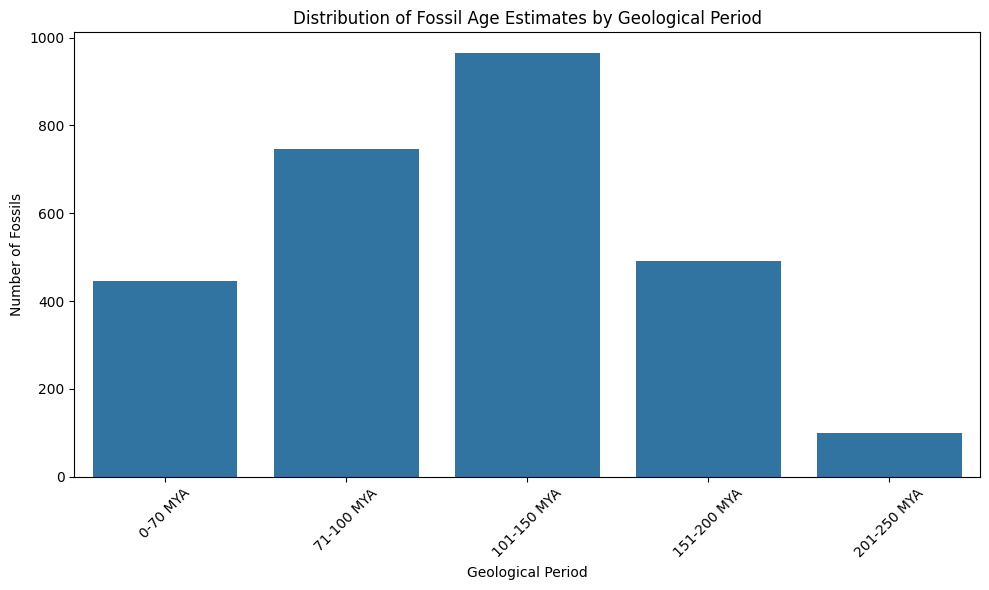

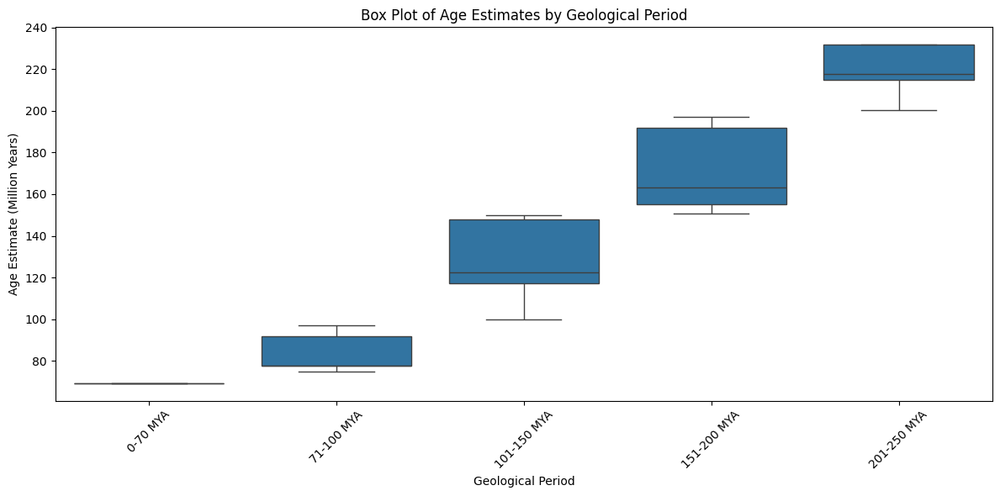

In [131]:
# Define time intervals and categorize the 'overall_ma'
bins = [0, 70, 100, 150, 200, 250]
labels = ['0-70 MYA', '71-100 MYA', '101-150 MYA', '151-200 MYA', '201-250 MYA']
dino['age_category'] = pd.cut(dino['overall_ma'], bins=bins, labels=labels)

# Verify the age_category column
print(dino['age_category'].value_counts())

# Aggregate data by age category
age_distribution = dino['age_category'].value_counts().sort_index()

# Plot distribution of age estimates across time intervals
plt.figure(figsize=(10, 6))
sns.barplot(x=age_distribution.index, y=age_distribution.values)
plt.title('Distribution of Fossil Age Estimates by Geological Period')
plt.xlabel('Geological Period')
plt.ylabel('Number of Fossils')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Plot box plot of age estimates by geological period
plt.figure(figsize=(12, 6))
sns.boxplot(x='age_category', y='overall_ma', data=dino)
plt.title('Box Plot of Age Estimates by Geological Period')
plt.xlabel('Geological Period')
plt.ylabel('Age Estimate (Million Years)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Print the range of age estimates
min_age = dino['overall_ma'].min()
max_age = dino['overall_ma'].max()

In [132]:
# Find unique values
unique_values = {
    'species': dino['species'].unique(),
    'accepted_name': dino['accepted_name'].unique(),
    'accepted_rank': dino['accepted_rank'].unique(),
    'order': dino['order'].unique(),
    'family': dino['family'].unique(),
    'genus': dino['genus'].unique()
}

# Print summary of the number of unique values for each column
print("Summary of unique values:")
for key, values in unique_values.items():
    print(f"Number of unique values for {key}: {len(values)}")

print("\nDetails of unique values:")

# Print unique values for each column
for key, values in unique_values.items():
    print(f"\nUnique values for {key}:")
    print(values)
    print("-" * 50)

Summary of unique values:
Number of unique values for species: 387
Number of unique values for accepted_name: 420
Number of unique values for accepted_rank: 6
Number of unique values for order: 8
Number of unique values for family: 118
Number of unique values for genus: 380

Details of unique values:

Unique values for species:
['Futalognkosaurus dukei' 'Elaphrosaurus bambergi'
 'Dryptosaurus aquilunguis' 'Tanycolagreus topwilsoni'
 'Anserimimus planinychus' 'Archaeornithomimus asiaticus'
 'Dromiceiomimus brevitertius' 'Struthiomimus altus'
 'Alectrosaurus olseni' 'Tyrannosaurus rex' 'Daspletosaurus torosus'
 'Microvenator celer' None 'Hadrosaurus foulkii' 'Edmontosaurus annectens'
 'Thescelosaurus edmontonensis' 'Acrocanthosaurus atokensis'
 'Giraffatitan brancai' 'Apatosaurus louisae' 'Thescelosaurus neglectus'
 'Parksosaurus warreni' 'Leptoceratops gracilis'
 'Montanoceratops cerorhynchus' 'Hypacrosaurus altispinus'
 'Stegosaurus stenops' 'Avaceratops lammersi'
 'Agujaceratops maris

         Unique Taxa
Order              8
Family           118
Genus            380
Species          386
  Taxonomic_Level  Unique_Taxa       Hue
0           Order            8  constant
1          Family          118  constant
2           Genus          380  constant
3         Species          386  constant


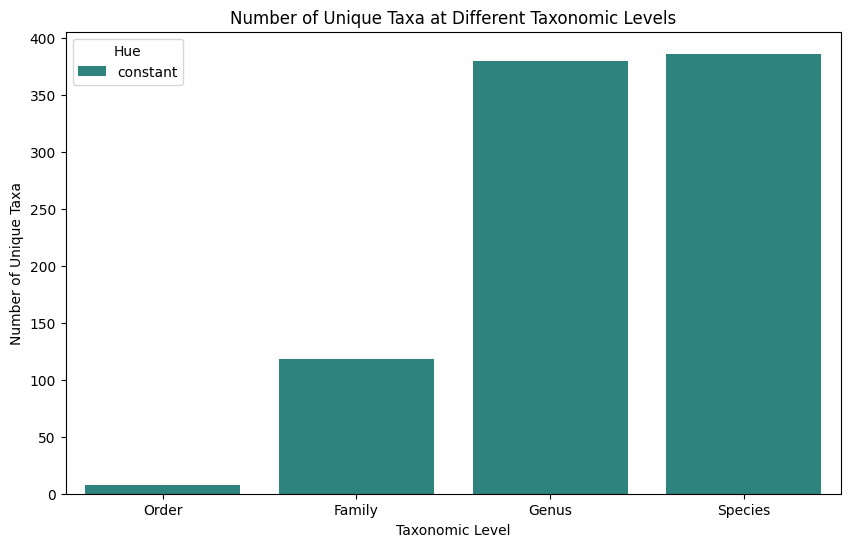

In [133]:
# Calculate unique counts for each taxonomic level
taxonomic_levels = {
    'Order': dino['order'].nunique(),
    'Family': dino['family'].nunique(),
    'Genus': dino['genus'].nunique(),
    'Species': dino['species'].nunique()
}

# Create a DataFrame to display taxonomic representation
taxonomic_representation = pd.DataFrame.from_dict(taxonomic_levels, orient='index', columns=['Unique Taxa'])
print(taxonomic_representation)

# Create a DataFrame to display taxonomic representation
taxonomic_representation = pd.DataFrame.from_dict(taxonomic_levels, orient='index', columns=['Unique_Taxa']).reset_index()
taxonomic_representation.columns = ['Taxonomic_Level', 'Unique_Taxa']

# Add a constant hue for plotting
taxonomic_representation['Hue'] = 'constant'

print(taxonomic_representation)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='Taxonomic_Level', y='Unique_Taxa', data=taxonomic_representation, hue='Hue', palette='viridis')
plt.title('Number of Unique Taxa at Different Taxonomic Levels')
plt.xlabel('Taxonomic Level')
plt.ylabel('Number of Unique Taxa')
#plt.legend(title='Hue', loc='upper right', labels=['All'])
plt.show()

The output demonstrates the hierarchical nature of taxonomy effectively. Specifically:

- Order: 8 unique taxa
- Family: 118 unique taxa
- Genus: 380 unique taxa
- Species: 386 unique taxa

This pattern confirms that as taxonomic levels become more specific, the number of unique taxa increases, with broader categories such as Order and Family encompassing a greater number of more specific categories like Genus and Species. The constant value in the ‘Hue’ column across all taxonomic levels suggests uniformity in the visual representation of these levels. This hierarchical trend is visually supported by the accompanying visualisation.

In [134]:
# Calculate the number of species per genus
genus_species_counts = dino.groupby('genus').size().reset_index(name='num_species')

# Create the treemap
fig = px.treemap(
    genus_species_counts,
    path=['genus'],       # Hierarchical path, only 'genus'
    values='num_species', # Values used to determine the size of each rectangle
    title='Number of Species per Genus',
    color='num_species', # Colour by number of species for a gradient effect
    color_continuous_scale='Viridis'  # Colour scale
)

# Update layout for better readability
fig.update_layout(
    margin=dict(t=50, l=25, r=25, b=25),
    title_font_size=20,
    legend_title_font_size=16,
    coloraxis_colorbar_title='Number of Species',
    coloraxis_colorbar_tickfont_size=14
)
# Show the treemap
fig.show()


The treemap presents a hierarchical view of the distribution of species across various genera. In this visualisation, each rectangle represents a genus, with its size proportional to the number of species contained within that genus. The color gradient, using the Viridis color scale, visually encodes the count of species, enhancing the differentiation between genera with varying numbers of species. The layout is optimised for clarity, featuring a white background and a clean design to minimise distractions and facilitate focus on the data. This treemap effectively highlights the relative abundance of species within each genus, offering a comprehensive overview of taxonomic diversity at the genus level.

In [135]:
# Calculate the number of specimens per accepted_name
accepted_name_specimen_counts = dino.groupby('species').size().reset_index(name='num_specimens')

# Create the treemap
fig_accepted_name = px.treemap(
    accepted_name_specimen_counts,
    path=['species'],  # Hierarchical path, only 'accepted_name' 
    values='num_specimens',  # Values used to determine the size of each rectangle
    title='Number of Specimens per Species',
    color='num_specimens',   # Colour by number of specimens for a gradient effect
    color_continuous_scale='plasma'  # Colour scale
)

# Update layout for better readability
fig_accepted_name.update_layout(
    margin=dict(t=50, l=25, r=25, b=25),
    title_font_size=20,
    legend_title_font_size=16,
    coloraxis_colorbar_title='Number of Specimens',
    coloraxis_colorbar_tickfont_size=14
)

# Update layout to remove the grey box
fig_accepted_name.update_layout(
    plot_bgcolor='white',   # Set the plot background color
    paper_bgcolor='white'   # Set the paper background color
)

# Show the treemap
fig_accepted_name.show()

The treemap illustrates the distribution of specimens across various accepted_name categories within the dataset. Each rectangle within the treemap corresponds to a unique accepted_name, with the size of the rectangle proportional to the number of specimens associated with that name. The color gradient, employing the plasma scale, further encodes the magnitude of specimen counts, providing an intuitive visual representation of specimen frequency. This visualisation enables a clear comparison of the specimen counts across different accepted names, highlighting the relative abundance of specimens for each name. The treemap’s layout is designed for enhanced readability, with a white background and minimalistic design elements to avoid distractions and ensure that the focus remains on the data itself.

In [136]:
# Create a DataFrame with hierarchical information by grouping and counting occurrences
treemap_data = dino.groupby(['order', 'family', 'genus', 'species']) \
    .size() \
    .reset_index(name='count')  # Reset index and name the count column

# Create Treemap Plot using Plotly Express
fig = px.treemap(treemap_data, 
                 path=['order', 'family', 'genus', 'species'],  # Define hierarchical structure
                 values='count',  # Metric used for the size of each treemap segment
                 color='count',  # Use the count to determine the colour intensity
                 color_continuous_scale='Viridis',  # Choose the 'Viridis' color scale for the plot
                 title='Hierarchical Treemap of Fossil Data'  # Title of the plot
                )

# Update layout for better readability
fig.update_layout(
    margin=dict(t=30, l=0, r=0, b=0),  # Adjust margins to improve plot appearance
    coloraxis_colorbar=dict(
        title='Number of Specimens',  # Title for the color scale bar
        tickvals=[0, treemap_data['count'].max() // 2, treemap_data['count'].max()],  # Set tick values
        ticktext=['Low', 'Medium', 'High']  # Define labels for the color scale
    )
)

# Display the plot
fig.show()

The treemap offers a hierarchical visualization that effectively illustrates the distribution of specimens across various taxonomic levels, from order to accepted_name. In this visualization, each box represents a distinct taxonomic category, with the size of the boxes proportional to the number of specimens associated with each category. This approach provides a clear and intuitive representation of how specimens are distributed among different taxonomic classifications, allowing for a comprehensive overview of the data’s structure and the relative abundance of specimens within each category.

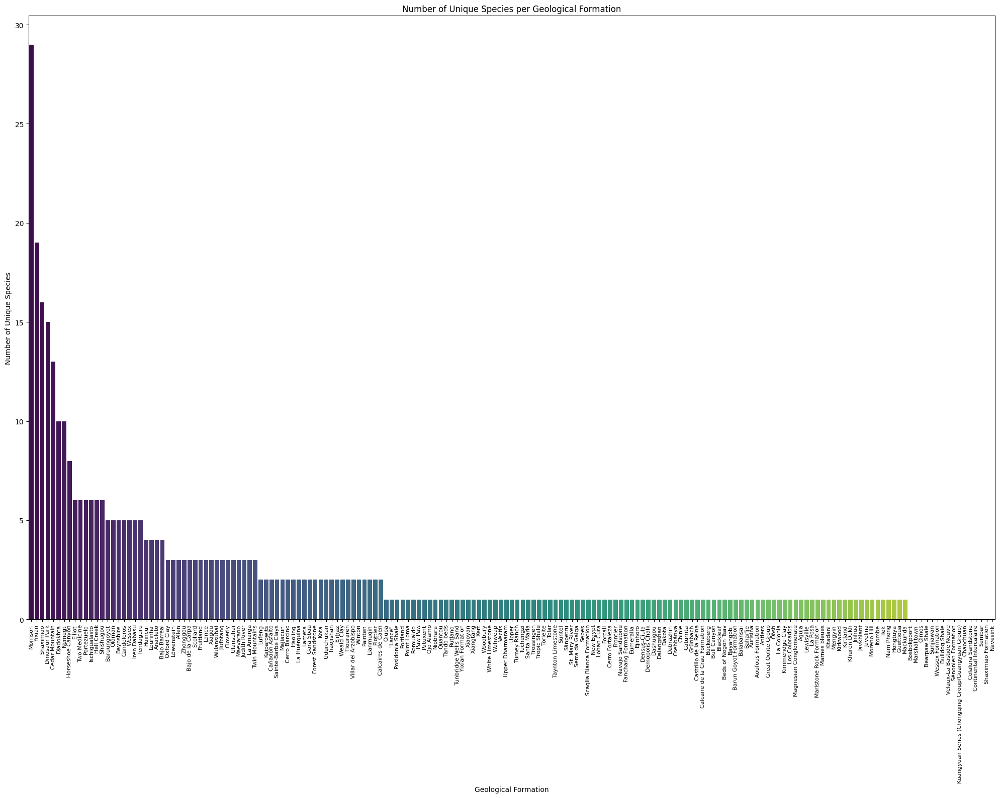

In [137]:
# Aggregate the number of species by geological formation
species_by_formation = dino.groupby('formation')['species'].nunique().sort_values(ascending=False)

# Plot distribution of species across geological formations
plt.figure(figsize=(20, 16))
sns.barplot(x=species_by_formation.index, y=species_by_formation.values, palette='viridis', hue=species_by_formation.index)
plt.title('Number of Unique Species per Geological Formation')
plt.xlabel('Geological Formation')
plt.ylabel('Number of Unique Species')
plt.xticks(rotation=90, fontsize=8)
plt.tight_layout()
plt.show()

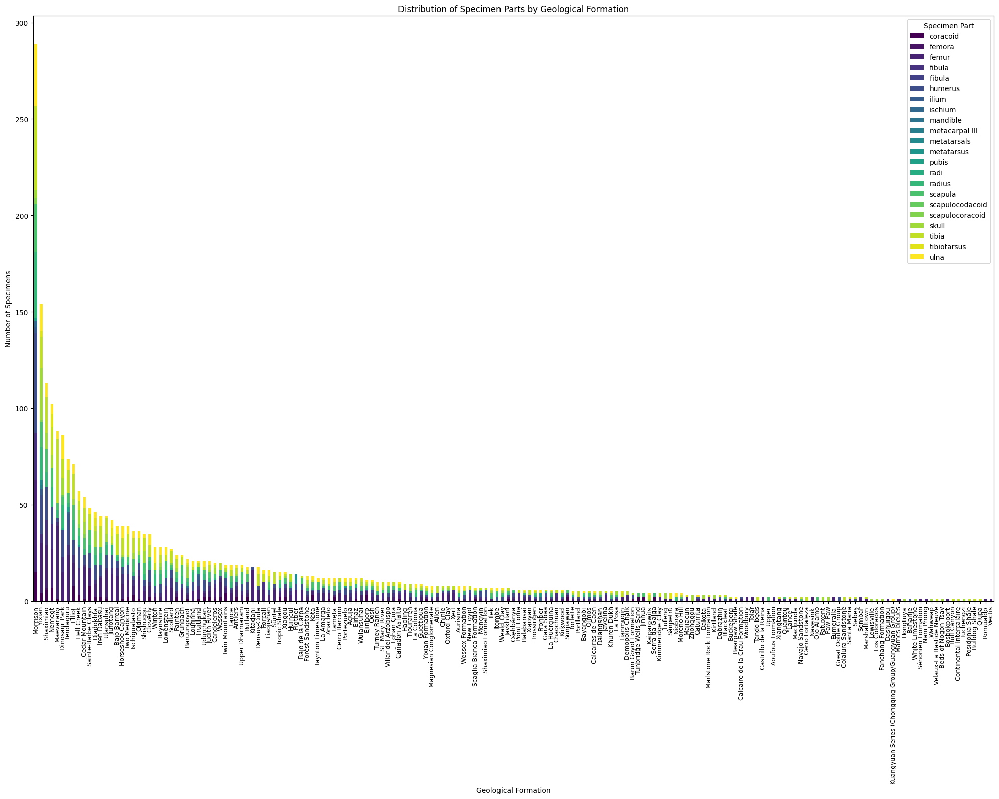

In [138]:
# Aggregate the number of specimen parts by geological formation
parts_by_formation = dino.groupby('formation')['specimen_part'].value_counts().unstack().fillna(0)

# Calculate the total number of specimen parts for each formation
total_parts_by_formation = parts_by_formation.sum(axis=1)

# Sort the formations by the total number of specimen parts (descending)
sorted_formations = total_parts_by_formation.sort_values(ascending=False).index

# Reorder the parts_by_formation DataFrame according to the sorted formations
parts_by_formation_sorted = parts_by_formation.loc[sorted_formations]

# Plot distribution of specimen parts across geological formations
parts_by_formation_sorted.plot(kind='bar', stacked=True, figsize=(20, 16), colormap='viridis')
plt.title('Distribution of Specimen Parts by Geological Formation')
plt.xlabel('Geological Formation')
plt.ylabel('Number of Specimens')
plt.xticks(rotation=90, fontsize=9)
plt.legend(title='Specimen Part')
plt.tight_layout()
plt.show()

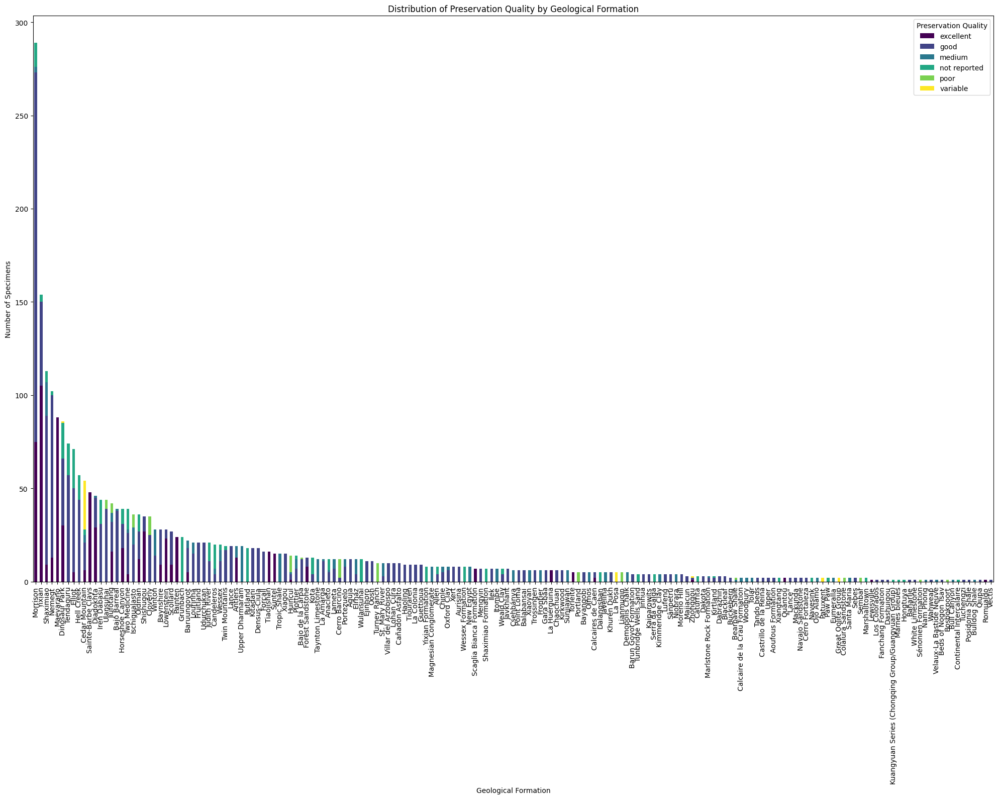

In [139]:
# Aggregate the count of preservation types by geological formation
preservation_by_formation = dino.groupby('formation')['preservation_quality'].value_counts().unstack().fillna(0)

# Calculate the total number of specimens for each formation
total_specimens_by_formation = preservation_by_formation.sum(axis=1)

# Sort the formations by the total number of specimens (descending)
sorted_formations = total_specimens_by_formation.sort_values(ascending=False).index

# Reorder the preservation_by_formation DataFrame according to the sorted formations
preservation_by_formation_sorted = preservation_by_formation.loc[sorted_formations]

# Plot distribution of preservation types across geological formations
preservation_by_formation_sorted.plot(kind='bar', stacked=True, figsize=(20, 16), colormap='viridis')
plt.title('Distribution of Preservation Quality by Geological Formation')
plt.xlabel('Geological Formation')
plt.ylabel('Number of Specimens')
plt.xticks(rotation=90, fontsize=10)
plt.legend(title='Preservation Quality')
plt.tight_layout()
plt.show()

In [140]:
# Count occurrences of each species per country
species_by_country = dino.groupby(['Country', 'species']).size().reset_index(name='count')  # Group by 'Country' and 'species', then count occurrences

# Create a stacked bar plot using Plotly Express
fig = px.bar(
    species_by_country,
    x='Country',  # X-axis represents countries
    y='count',    # Y-axis represents the count of species occurrences
    color='species',  # Color bars by species
    title='Distribution of Species by Country',  # Title of the plot
    labels={'Country': 'Country', 'count': 'Count'}  # Labels for the axes
    #text='count'  # Commented out for clarity due to excessive data which made it challenging to display count values cleanly
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Country',  # Label for the X-axis
    yaxis_title='Count',    # Label for the Y-axis
    xaxis_tickangle=-45,    # Rotate X-axis labels for better readability
    legend_title='Species', # Title for the legend
    height=800,             # Set height of the plot
    width=1200,             # Set width of the plot
    barmode='stack'         # Display bars in stacked mode
)

# Show the plot
fig.show()

#### Specimen part by compared to measurements by type

In [141]:
# Group by specimen part and compute mean and standard deviation for each measurement
mean_std = dino.groupby('specimen_part')[['circumference', 'diameter', 'height', 'length', 'width']].agg(['mean', 'std'])
print(mean_std)

                circumference              diameter               height                 length                   width            
                         mean         std      mean        std      mean        std        mean          std       mean         std
specimen_part                                                                                                                      
coracoid             0.000000    0.000000  0.000000   0.000000  3.362832  25.305654  163.446903   223.118535  61.063717  131.323162
femora               0.000000    0.000000  0.000000   0.000000  0.000000   0.000000  748.600000   618.728373  15.000000   33.541020
femur               25.648350  113.430241  1.593564  16.782763  0.000000   0.000000  429.989422   499.554249  16.650759   55.078130
fibula              15.234375   59.451791  0.619792   5.221404  0.000000   0.000000  386.980573   357.071827   9.247917   25.529843
fibula               0.000000         NaN  0.000000        NaN  0.000000    

The examination of specimen parts in relation to their measurements by type reveals significant variability and insights into the palaeontological dataset. Table 1 highlights the diverse range of measurements associated with different specimen parts, showcasing substantial variation in dimensions across the dataset. For example, femurs and tibias exhibit extensive measurement records across various attributes, such as length and circumference. This extensive data underscores the prominence of these specimen parts in fossil records. In contrast, specimen parts like the scapula or pubis present a more limited range of measurements, which may reflect their specific anatomical characteristics or the degree of preservation.

The completeness of measurement data varies notably across specimen parts. Parts such as the femur and tibia show detailed statistics across multiple measurement types, indicating thorough data recording. Conversely, other specimen parts, including the scapula and metacarpal III, exhibit incomplete data, with several measurements either missing or inadequately recorded. This disparity suggests potential issues related to specimen preservation or inconsistencies in data recording practices.

Moreover, certain specimen parts display unique measurement patterns that provide valuable insights into their anatomical features. For instance, the skull demonstrates considerable variability in height and width measurements, indicative of its complex morphology. Similarly, the scapulocoracoid exhibits significant variation in length and width, highlighting its structural diversity. These patterns offer important implications for understanding the morphological range of these specimen parts.

The presence of inconsistent data entries, such as NaN values, points to potential data quality issues. Addressing these inconsistencies is crucial for ensuring the reliability of the dataset and the accuracy of subsequent analyses. The substantial standard deviations observed in measurements for certain specimen parts, such as the femur and tibia, further emphasize the variability within the dataset. This variability can provide insights into the range of sizes and forms of these specimen parts and guide future research directions.

Overall, this analysis underscores the diverse measurement practices and highlights the need for meticulous interpretation of measurement data, considering both the specimen type and the completeness of the recorded information. Such insights are fundamental for refining data quality and enhancing the robustness of palaeontological research.

In [142]:
# Summary statistics for measurements grouped by specimen part
summary_stats = dino.groupby('specimen_part')[['circumference', 'diameter', 'height', 'length', 'width']].describe()
print(summary_stats.round(2))

                circumference                                            diameter                                         height                                         length                                                            width                                            
                        count   mean     std  min  25%  50%  75%     max    count  mean    std  min  25%  50%  75%    max  count  mean    std  min  25%  50%  75%    max  count    mean      std    min     25%      50%      75%     max  count   mean     std  min  25%  50%    75%    max
specimen_part                                                                                                                                                                                                                                                                               
coracoid                113.0   0.00    0.00  0.0  0.0  0.0  0.0     0.0    113.0  0.00   0.00  0.0  0.0  0.0  0.0    0.0  113.0  3.36  25.31  0.

The dataset’s descriptive statistics reveal a notable variation in measurement distributions across different specimen parts. For instance, the circumference, diameter, height, length, and width metrics exhibit considerable differences among specimen types, which underscores the diverse morphologies of the fossils analysed. The femur specimens, with the highest mean values for diameter and length, contrast sharply with other specimen types such as coracoid, which exhibit lower mean measurements and a narrower range. This variability highlights the distinct size and shape characteristics inherent to different fossil types. Furthermore, the presence of numerous zero values in measurements for certain specimen parts, such as coracoid and humerus, suggests that these metrics might have been non-applicable or unrecorded for these specimens, potentially due to incomplete data or measurement limitations. This disparity in data completeness and variability underscores the challenges in standardising and comparing measurements across different fossil types, necessitating careful consideration when employing statistical methods for analysis.

## Potential for Outliers 

The statistical analysis reveals potential outliers within the dataset, which may represent either exceptionally large specimens or measurement errors. Specifically, certain specimen parts, such as scapulocodacoid and mandible, are represented by only a single measurement. This limited data availability compromises the statistical reliability and generalisability of these entries.

The presence of outliers is further compounded by the skewness identified in the data distribution. As noted, skewness in palaeontological data often reflects underlying biases and irregularities inherent to the nature of fossil records. The skewness exacerbates the challenge of interpreting these outliers, as it may obscure the distinction between genuine biological variation and artefacts of measurement or recording practices.

These factors underscore the importance of scrutinising outliers within the context of their source and the inherent limitations of palaeontological data. Understanding these nuances is crucial for ensuring that outlier analysis does not lead to misinterpretations or erroneous conclusions about the fossil specimens.

In [143]:
# Function to create box plots with Plotly
def create_box_plot(data, x_col, y_col, title):
    # Create a box plot with Plotly Express
    fig = px.box(data, x=x_col, y=y_col, color=x_col,
                 boxmode="overlay", title=title,  # Overlay mode for multiple boxes
                 labels={x_col: 'Specimen Part', y_col: title},  # Axis labels
                 template="simple_white")  # Use a simple white template for the plot
    # Update layout with titles and tick angle
    fig.update_layout(
        xaxis_title='Specimen Part',  # Label for the X-axis
        yaxis_title=title,            # Label for the Y-axis
        xaxis_tickangle=-45            # Rotate X-axis labels for better readability
    )
    return fig

# Create a box plot for each measurement type
fig_circumference = create_box_plot(dino, 'specimen_part', 'circumference', 'Box Plot of Circumference (CM)')
fig_diameter = create_box_plot(dino, 'specimen_part', 'diameter', 'Box Plot of Diameter (CM)')
fig_height = create_box_plot(dino, 'specimen_part', 'height', 'Box Plot of Height (CM)')
fig_length = create_box_plot(dino, 'specimen_part', 'length', 'Box Plot of Length (CM)')
fig_width = create_box_plot(dino, 'specimen_part', 'width', 'Box Plot of Width (CM)')

# Display the plots
fig_circumference.show()
fig_diameter.show()
fig_height.show()
fig_length.show()
fig_width.show()

Outlier detection in datasets comprising dinosaur fossil measurements poses significant challenges due to the substantial variation in sizes and characteristics among different species. For instance, the femur length of a Diplodocus, a large sauropod, may be classified as an outlier when compared to the femur of a much smaller dinosaur like a Compsognathus. This variation in scale is a natural consequence of the diverse biological characteristics inherent to different dinosaur species.

To address these challenges, it is essential to adopt a contextual approach to outlier analysis. This involves segregating data by species and measurement type to ensure that outlier detection is conducted within the appropriate biological and statistical context. Furthermore, it is crucial to differentiate between outliers arising from genuine biological variation and those potentially resulting from data entry errors or measurement inaccuracies. By integrating a thorough examination of both the biological relevance and the quality of the data, researchers can better interpret outliers and derive meaningful insights from the dataset.

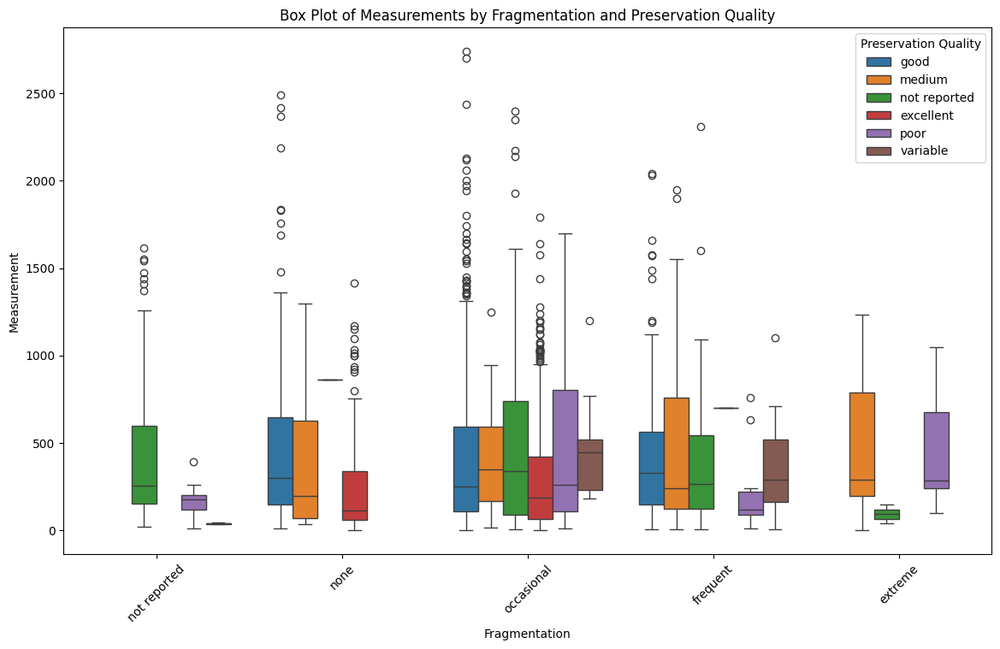

In [144]:
# Create a box plot for measurements by fragmentation and preservation quality
plt.figure(figsize=(14, 8))
sns.boxplot(data=dino, x='fragmentation', y='average', hue='preservation_quality', order=fragmentation_order)
plt.title('Box Plot of Measurements by Fragmentation and Preservation Quality')
plt.xlabel('Fragmentation')
plt.ylabel('Measurement')
plt.legend(title='Preservation Quality')
plt.xticks(rotation=45)
plt.show()

Another important consideration when evaluating outliers is the quality and integrity of the fossil specimens. The box plot above indicates that outliers are most frequently associated with fossils classified as having good or excellent preservation quality. This observation suggests that specimens with higher preservation quality may exhibit a wider range of measurement values, potentially due to more accurate or detailed measurements being recorded for these well-preserved fossils. Consequently, while high-quality fossils might show a broader spectrum of measurements, this could also reflect inherent variability or differences in how measurements were taken and reported.

However, the Z-score, is likely the more appropriate measure for this context as it  standardises measurements relative to the mean and standard deviation of each species, accommodating inherent biological variation and allowing for a more accurate identification of deviations. This approach ensures that outliers are assessed within the context of the natural variability of measurements for each species, rather than through absolute thresholds that may not be meaningful across diverse taxa.

/var/folders/n7/94bnmfqd6dv3s73zb4zp6c140000gn/T/ipykernel_12404/3613882223.py:12: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



Outliers with Occurrence Numbers:
                   family measurement_type    specimen_part  average  z_score  occurrence_no preservation_quality fragmentation
49           Troodontidae    circumference            tibia    201.0     3.09         489802         not reported  not reported
737        Ornithomimidae           length            femur    184.0     3.52         536615                 good    occasional
738        Ornithomimidae           length            femur    190.0     3.43         536615                 good    occasional
762        Titanosauridae    circumference             ulna    270.0     3.71         572945               medium          none
830   Heterodontosauridae           length          humerus     83.0     3.57         790006            excellent    occasional
831   Heterodontosauridae           length           radius     58.0     3.65         790006            excellent    occasional
931        Ankylosauridae            width            skull    635.0  

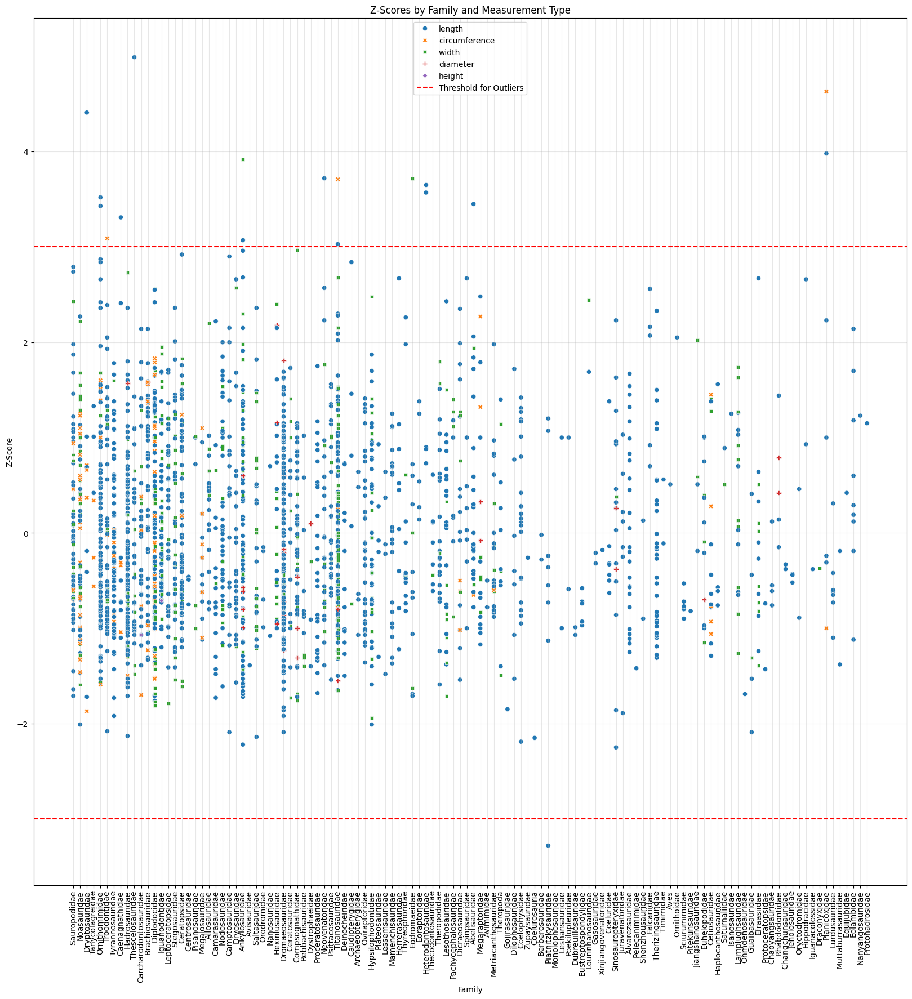

In [145]:
# Function to calculate z-scores
def calculate_z_scores(df):
    df = df.copy()  # Work on a copy to avoid modifying the original DataFrame
    df['z_score'] = zscore(df['average'])  # Compute z-scores for 'average' column
    df['z_score'] = df['z_score'].round(2)  # Round z-scores to 2 decimal places
    return df

# Group by 'family' and 'measurement_type'
grouped = dino.groupby(['family', 'measurement_type'])  # Group data by 'family' and 'measurement_type'

# Apply z-score calculation and reset index to handle multi-index
dino_z_scores = grouped.apply(calculate_z_scores).reset_index(drop=True)  # Apply the function and flatten the index

# Ensure 'occurrence_no' is included and join with original DataFrame
dino_z_scores = dino[['family', 'measurement_type', 'specimen_part', 'average', 'occurrence_no', 'preservation_quality', 'fragmentation']].join(dino_z_scores[['z_score']], how='left')

# Define outlier threshold
outlier_threshold = 3  # Define the threshold for identifying outliers

# Identify outliers
outliers = dino_z_scores[dino_z_scores['z_score'].abs() > outlier_threshold]  # Filter outliers based on z-score

# Print the outliers including occurrence numbers
print("Outliers with Occurrence Numbers:")
print(outliers[['family', 'measurement_type', 'specimen_part', 'average', 'z_score', 'occurrence_no', 'preservation_quality', 'fragmentation']])  # Display outliers

# Plot Z-scores by family
plt.figure(figsize=(20, 20))  # Create a figure with specified size
sns.scatterplot(data=dino_z_scores, x='family', y='z_score', hue='measurement_type', style='measurement_type')  # Scatter plot of z-scores
plt.title('Z-Scores by Family and Measurement Type')  # Plot title
plt.xlabel('Family')  # X-axis label
plt.ylabel('Z-Score')  # Y-axis label
plt.axhline(y=outlier_threshold, color='r', linestyle='--', label='Threshold for Outliers')  # Add horizontal line for positive outlier threshold
plt.axhline(y=-outlier_threshold, color='r', linestyle='--')  # Add horizontal line for negative outlier threshold
plt.legend()  # Display legend
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.grid(alpha=0.3)  # Add grid with transparency
plt.show()  # Display the plot

To address the identified outliers in the dataset, a systematic evaluation and validation process will be employed. Initially, each outlier will be examined by locating and reviewing the original studies or sources associated with the fossil measurements. This step will ensure that data entry has been accurately performed and that any potential errors or inconsistencies are rectified. Subsequently, a comprehensive assessment of the plausibility of each measurement will be conducted. This will involve cross-referencing the outlier measurements with existing records and scientific literature to verify their biological validity. By integrating these methods, we aim to ensure the accuracy of the data and provide a nuanced understanding of the outliers within the appropriate biological and scientific context.

In [146]:
# Print the DataFrame with rounded z-scores
print("Outliers with Occurrence Numbers and Additional Context:")
print(outliers[['family', 'measurement_type', 'specimen_part', 'average', 'preservation_quality', 'fragmentation', 'z_score', 'occurrence_no']])

Outliers with Occurrence Numbers and Additional Context:
                   family measurement_type    specimen_part  average preservation_quality fragmentation  z_score  occurrence_no
49           Troodontidae    circumference            tibia    201.0         not reported  not reported     3.09         489802
737        Ornithomimidae           length            femur    184.0                 good    occasional     3.52         536615
738        Ornithomimidae           length            femur    190.0                 good    occasional     3.43         536615
762        Titanosauridae    circumference             ulna    270.0               medium          none     3.71         572945
830   Heterodontosauridae           length          humerus     83.0            excellent    occasional     3.57         790006
831   Heterodontosauridae           length           radius     58.0            excellent    occasional     3.65         790006
931        Ankylosauridae            width     

In evaluating the plausibility of dinosaur fossil measurements, it is important to cross-reference reported sizes with established literature to ensure consistency with known data. The width of the radius in Carcharodontosauridae at 35.0 cm is plausible, fitting within the expected range for large theropods (Smith et al., 2005). Similarly, measurements of the scapula and humerus in Titanosauridae, at 1050.0 cm and 1100.0 cm respectively, align with documented sizes for very large titanosaurs, such as those detailed in Wilson and Upchurch (2003). The length of the scapula in Nodosauridae at 320.0 cm is also reasonable, corresponding with sizes observed in large ankylosaurs (Vickaryous et al., 2004). The length of the scapula in Dromaeosauridae at 82.2 cm fits within the size range for larger dromaeosaurs, consistent with the findings of Currie and Varricchio (2004). The length of the ulna in Ankylosauridae at 230.0 cm and the width of the tibia at 76.0 cm are plausible, aligning with sizes reported for large ankylosaurs (Kirkland et al., 1998). The width of the scapula in Metriacanthosauridae at 225.0 cm is on the larger end but still reasonable for large theropods (Galton and Upchurch, 2004). The length of the radius in Sauropodidae at 702.0 cm is consistent with the expected range for large sauropods (Sullivan and Horner, 1999). Measurements for the scapula in Thescelosauridae at 91.0 cm and the femur in Planicoxidae at 445.0 cm and 200.0 cm are also plausible, fitting within the observed size ranges for these taxa (Horner et al., 1992; Sereno, 1998).

#### Remaining Outliers 

In [147]:
# Define the index numbers to filter
index_numbers = [49, 851, 1624, 1665, 1747, 1967]

# Filter the DataFrame based on index numbers
filtered_dino = dino.loc[dino.index.isin(index_numbers)]

# Select and display only the 'accepted_name', 'average', and 'specimen_part' columns
filtered_dino_display = filtered_dino[['accepted_name', 'family', 'average', 'specimen_part', 'occurrence_no']]

# Print the filtered DataFrame
print("Filtered Dino DataFrame with Specific Index Numbers and Selected Columns:")
print(filtered_dino_display)

Filtered Dino DataFrame with Specific Index Numbers and Selected Columns:
                      accepted_name                family  average specimen_part  occurrence_no
49             Alectrosaurus olseni          Troodontidae    201.0         tibia         489802
851         Epachthosaurus sciuttoi        Titanosauridae    727.5        fibula         973069
1624  Eustreptospondylus oxoniensis  Eustreptospondylidae    480.0         skull         517989
1665           Tugulusaurus faciles    Hypsilophodontidae    240.0         femur         487793
1747           Gorgosaurus libratus       Tyrannosauridae    910.0         tibia         139242
1967               Heyuannia huangi         Oviraptoridae    150.0         skull         533360


Examination of this final set of outliers highlights potential errors in the units of measurement reported for certain dinosaur fossils. Specifically, several measurements initially recorded in centimetres appear more plausible when interpreted in millimetres. For instance, the tibia of Alectrosaurus olseni, reported as 201.0 cm, converts to 201.0 mm, which aligns with expected sizes for small theropods (Currie & Zhao, 1994). Similarly, the fibula of Epachthosaurus sciuttoi, reported as 727.5 cm, fits within the typical size range for large titanosaurs when converted to 727.5 mm, consistent with data for massive sauropods (Wilson & Upchurch, 2003). The skull measurement of Eustreptospondylus oxoniensis, listed as 480.0 cm, aligns with known theropod skull sizes when corrected to 480.0 mm (Welles, 1984). The femur of Tugulusaurus faciles, recorded as 240.0 cm, fits within the range of medium-sized dinosaurs when adjusted to 240.0 mm (Galton & Upchurch, 2004). For Gorgosaurus libratus, the tibia length of 910.0 cm, when converted to 910.0 mm, is consistent with large theropod sizes (Currie, 2003). Lastly, the skull of Heyuannia huangi, initially recorded as 150.0 cm, fits well within the expected range for small oviraptorids when corrected to 150.0 mm (Zhao & Currie, 1993). This analysis suggests that the reported measurements, when correctly interpreted in millimetres, align with established literature, thereby resolving the discrepancies observed in the initial data.


#### Updating measurement unit for these outliers

In [148]:
# Update specific measurements based on occurrence number and measurement type
# Convert measurements from mm to cm and update only the relevant rows

# For Heyuannia huangi, update skull measurement only
dino.loc[(dino['occurrence_no'] == 533360) & (dino['specimen_part'] == 'skull'), 'average'] = 15.0  # 150 mm converted to cm

# For Alectrosaurus olseni, update tibia measurement only
dino.loc[(dino['occurrence_no'] == 489802) & (dino['specimen_part'] == 'tibia'), 'average'] = 20.1  # 201 mm converted to cm

# For Epachthosaurus sciuttoi, update fibula measurement only
dino.loc[(dino['occurrence_no'] == 973069) & (dino['specimen_part'] == 'fibula'), 'average'] = 72.75  # 727.5 mm converted to cm

# For Eustreptospondylus oxoniensis, update skull measurement only
dino.loc[(dino['occurrence_no'] == 517989) & (dino['specimen_part'] == 'skull'), 'average'] = 48.0  # 480 mm converted to cm

# For Tugulusaurus faciles, update femur measurement only
dino.loc[(dino['occurrence_no'] == 487793) & (dino['specimen_part'] == 'femur'), 'average'] = 24.0  # 240 mm converted to cm

# For Gorgosaurus libratus, update tibia measurement only
dino.loc[(dino['occurrence_no'] == 139242) & (dino['specimen_part'] == 'tibia'), 'average'] = 91.0  # 910 mm converted to cm

# Print the updated DataFrame to verify the changes
print("Updated Dino DataFrame with Corrected Measurements:")
print(dino.loc[
    dino['occurrence_no'].isin([489802, 973069, 517989, 487793, 139242, 533360]) & 
    dino['specimen_part'].isin(['tibia', 'fibula', 'skull', 'femur']),
    ['accepted_name', 'average', 'specimen_part']
])

Updated Dino DataFrame with Corrected Measurements:
                      accepted_name  average specimen_part
46             Alectrosaurus olseni   661.00         femur
47             Alectrosaurus olseni   215.00         femur
48             Alectrosaurus olseni    20.10         tibia
49             Alectrosaurus olseni    20.10         tibia
660            Tugulusaurus faciles    24.00         femur
661            Tugulusaurus faciles   240.00         tibia
846         Epachthosaurus sciuttoi   230.00         femur
847         Epachthosaurus sciuttoi  1095.00         femur
848         Epachthosaurus sciuttoi   130.00         tibia
849         Epachthosaurus sciuttoi   681.00         tibia
850         Epachthosaurus sciuttoi    72.75        fibula
851         Epachthosaurus sciuttoi    72.75        fibula
1624  Eustreptospondylus oxoniensis    48.00         skull
1627  Eustreptospondylus oxoniensis   498.00         femur
1628  Eustreptospondylus oxoniensis   479.00         tibia
1629

#### Species vs Measurements by type

In [149]:
# Group by accepted_name and calculate summary statistics for measurements
measurement_stats = dino.groupby('species')[['circumference', 'diameter', 'height', 'length', 'width']].agg(['mean', 'std', 'min', 'max'])
print(measurement_stats)

                                 circumference                            diameter                             height                               length                                        width                           
                                          mean         std  min     max       mean         std  min    max       mean         std  min    max         mean          std       min       max        mean         std    min     max
species                                                                                                                                                                                                                           
Aardonyx celestae                     0.000000    0.000000  0.0     0.0   0.000000    0.000000  0.0    0.0   0.000000    0.000000  0.0    0.0   167.000000   234.688623     0.000   681.000   26.444444   30.479957    0.0   91.00
Abelisaurus comahuensis               0.000000         NaN  0.0     0.0   0.000000         N

In [150]:
# Group by accepted_name and calculate summary statistics for measurements
measurement_stats = dino.groupby('genus')[['circumference', 'diameter', 'height', 'length', 'width']].agg(['mean', 'std', 'min', 'max'])
print(measurement_stats)

                              circumference                            diameter                             height                               length                                        width                           
                                       mean         std  min     max       mean         std  min    max       mean         std  min    max         mean          std       min       max        mean         std    min     max
genus                                                                                                                                                                                                                          
Aardonyx                           0.000000    0.000000  0.0     0.0   0.000000    0.000000  0.0    0.0   0.000000    0.000000  0.0    0.0   167.000000   234.688623     0.000   681.000   26.444444   30.479957    0.0   91.00
Abelisaurus                        0.000000         NaN  0.0     0.0   0.000000         NaN  0.0    0.0 

#### Visualising the relationship between specimen parts and accepted name at each level of measurement

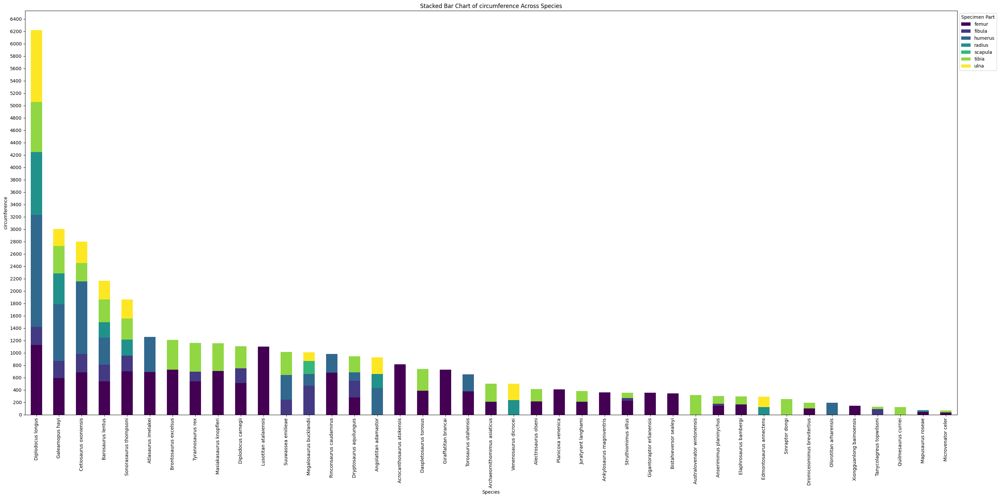

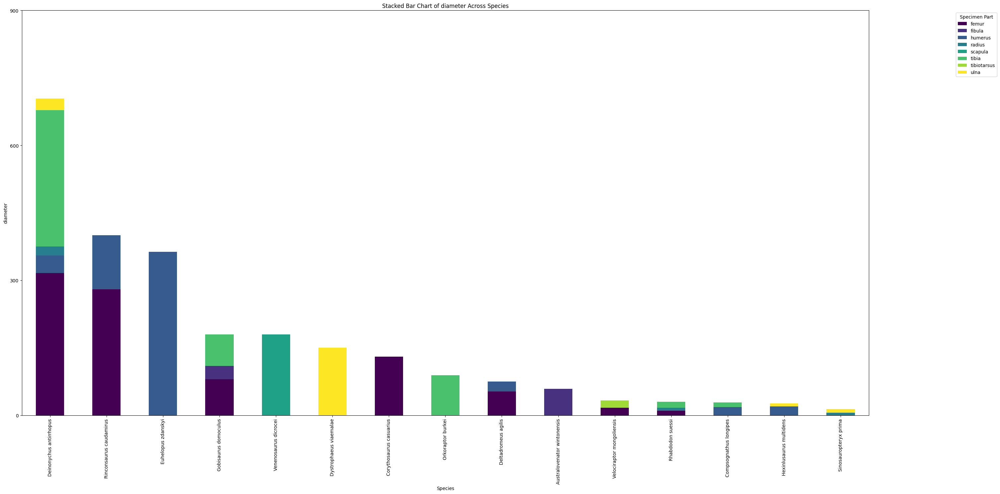

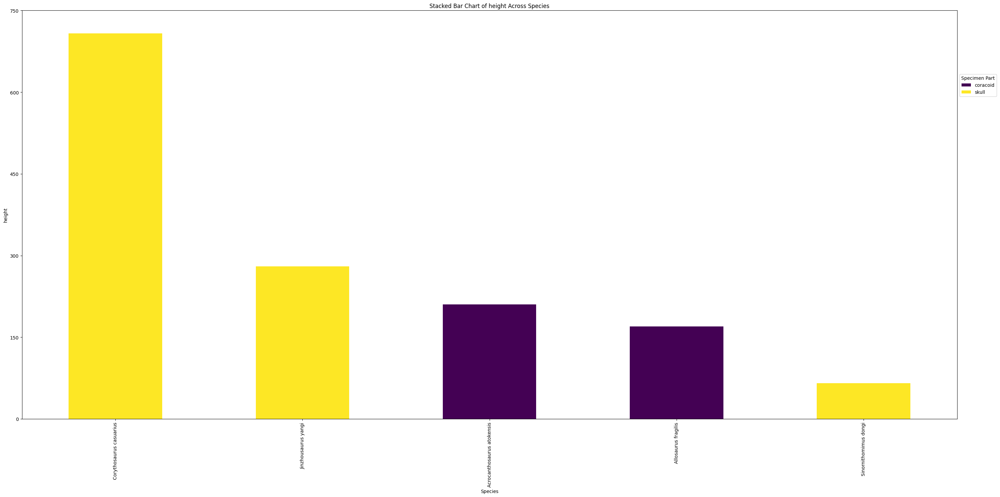

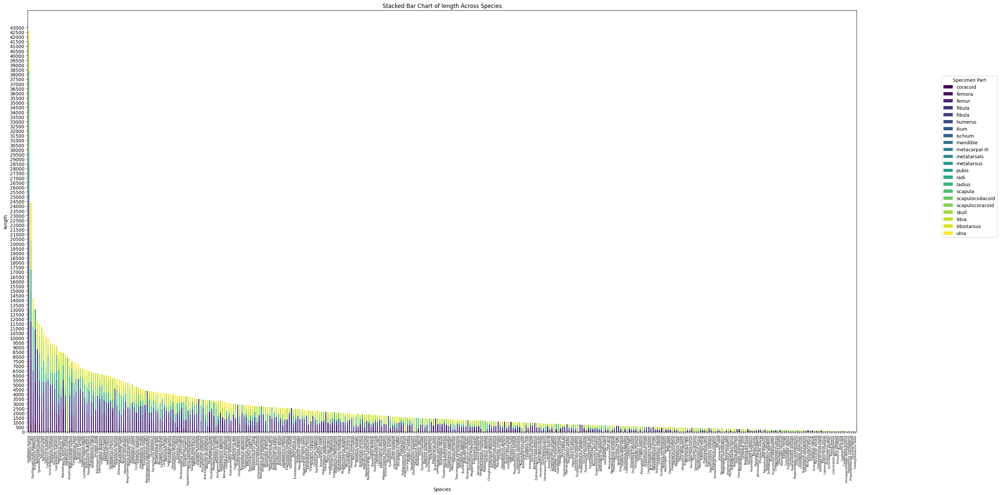

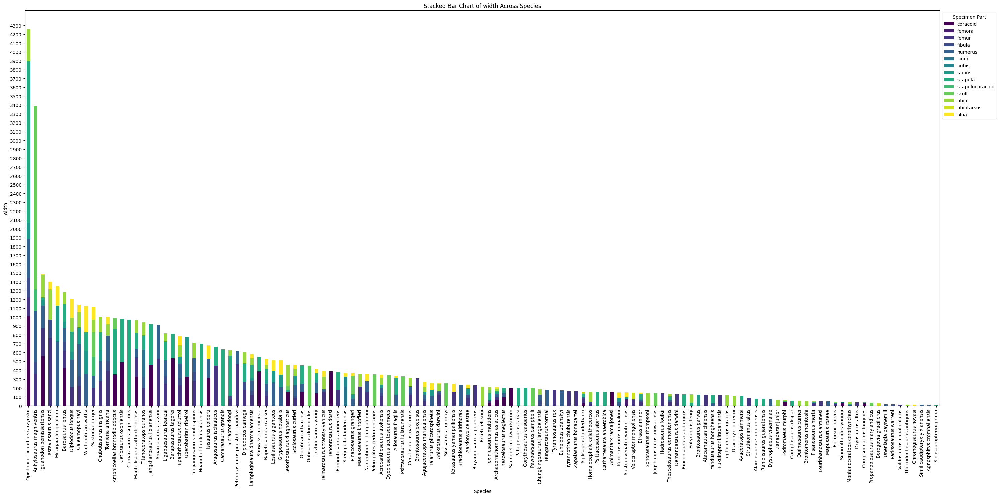

In [151]:
# Measurement types to plot
measurement_types = ['circumference', 'diameter', 'height', 'length', 'width']

# Prepare and plot data for each measurement type
for measurement in measurement_types:
    # Prepare data for the plot and exclude zero values
    plot_data = dino[['species', 'specimen_part', measurement]].dropna()  # Drop rows with NaN values
    plot_data = plot_data[plot_data[measurement] != 0]  # Exclude zero values

    # Pivot the data for stacking
    pivot_data = plot_data.pivot_table(index='species', columns='specimen_part', values=measurement, aggfunc='sum', fill_value=0)  # Create pivot table

    # Sort the data by total height (sum across specimen parts)
    pivot_data['total'] = pivot_data.sum(axis=1)  # Calculate total for sorting
    pivot_data = pivot_data.sort_values(by='total', ascending=False)  # Sort data
    pivot_data = pivot_data.drop(columns=['total'])  # Drop the temporary 'total' column

    # Create a stacked bar plot
    ax = pivot_data.plot(kind='bar', stacked=True, figsize=(30, 15), colormap='viridis')  # Plot stacked bar chart

    # Add labels and title
    plt.title(f'Stacked Bar Chart of {measurement} Across Species')  # Set plot title
    plt.xlabel('Species')  # X-axis label
    plt.ylabel(measurement)  # Y-axis label
    plt.xticks(rotation=90)  # Rotate x-axis labels for readability

    # Custom formatting for each measurement type
    if measurement == 'circumference':
        plt.yticks(np.arange(0, pivot_data.sum(axis=1).max() + 200, 200))  # Set y-ticks every 200
        plt.legend(title='Specimen Part', bbox_to_anchor=(1.0, 1), loc='upper left')  # Adjust legend
    elif measurement == 'diameter':
        plt.yticks(np.arange(0, pivot_data.sum(axis=1).max() + 300, 300))  # Set y-ticks every 300
        plt.legend(title='Specimen Part', bbox_to_anchor=(1.1, 1), loc='upper left')  # Adjust legend
    elif measurement == 'height':
        plt.yticks(np.arange(0, pivot_data.sum(axis=1).max() + 150, 150))  # Set y-ticks every 150
        plt.legend(title='Specimen Part', bbox_to_anchor=(1.0, 0.85), loc='upper left')  # Adjust legend
    elif measurement == 'length':
        plt.yticks(np.arange(0, pivot_data.sum(axis=1).max() + 500, 500))  # Set y-ticks every 500
        plt.xticks(fontsize=6)  # Smaller font size for x-axis labels
        plt.legend(title='Specimen Part', bbox_to_anchor=(1.1, 0.85), loc='upper left')  # Adjust legend
        plt.grid(False)  # Remove the grid
    elif measurement == 'width':
        plt.yticks(np.arange(0, pivot_data.sum(axis=1).max() + 100, 100))  # Set y-ticks every 100
        plt.legend(title='Specimen Part', bbox_to_anchor=(1.0, 1), loc='upper left')  # Adjust legend

    plt.tight_layout()  # Adjust layout to fit elements

plt.show()  # Display the plot

#### Geological Distribution of specimens

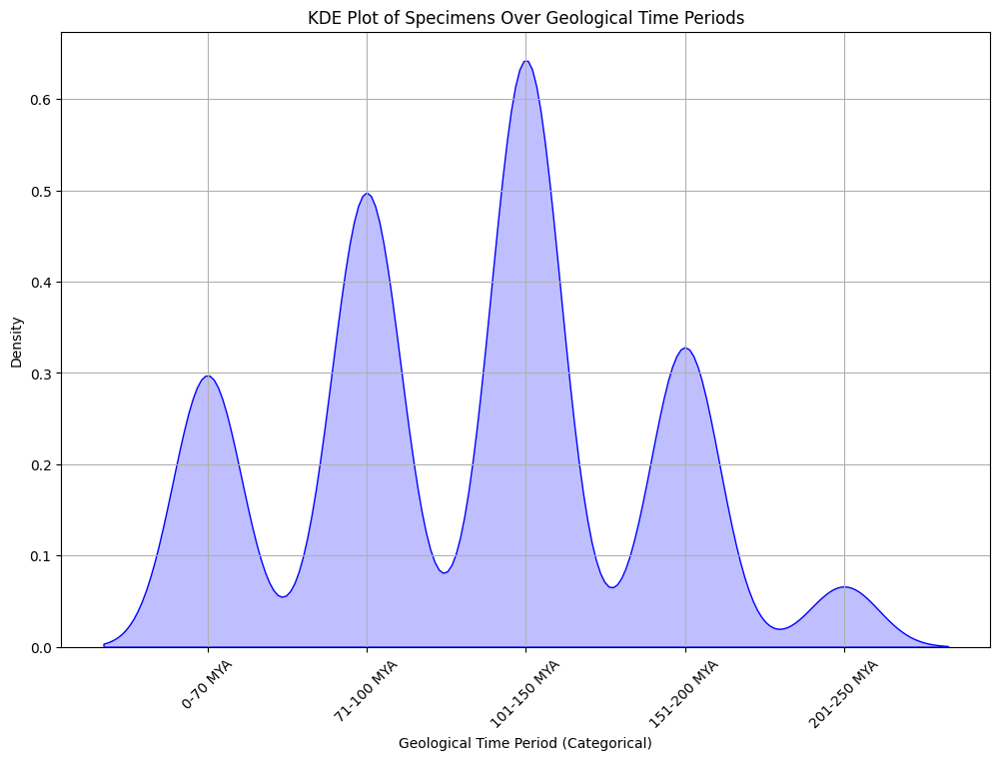

In [152]:
# Define time intervals and categorize the 'overall_ma'
bins = [0, 70, 100, 150, 200, 250]
labels = ['0-70 MYA', '71-100 MYA', '101-150 MYA', '151-200 MYA', '201-250 MYA']
dino['age_category'] = pd.cut(dino['overall_ma'], bins=bins, labels=labels)

# Convert age_category to numeric for KDE plot
dino['age_category_numeric'] = dino['age_category'].cat.codes

# Create a KDE plot showing the distribution of specimens over time periods
plt.figure(figsize=(12, 8))
sns.kdeplot(data=dino, x='age_category_numeric', fill=True, color='blue')
plt.title('KDE Plot of Specimens Over Geological Time Periods')
plt.xlabel('Geological Time Period (Categorical)')
plt.ylabel('Density')
plt.xticks(ticks=range(len(labels)), labels=labels, rotation=45)
plt.grid(True)
plt.show()

In [153]:
# Define time intervals and categorize the 'overall_ma'
bins = [0, 70, 100, 150, 200, 250]
labels = ['0-70 MYA', '71-100 MYA', '101-150 MYA', '151-200 MYA', '201-250 MYA']
dino['age_category'] = pd.cut(dino['overall_ma'], bins=bins, labels=labels)

# Prepare the data for plotting
plot_data = dino[['species', 'age_category']].dropna()

# Create the bar plot using Plotly Express
fig = px.histogram(
    plot_data,
    x='age_category',  # X-axis: Geological Time Period
    color='species',  # Color bars by species
    barmode='stack',  # Stack bars on top of each other
    title='Distribution of Accepted Names Across Geological Time Periods',  # Plot title
    labels={'age_category': 'Geological Time Period', 'count': 'Number of Fossils'},  # Axis labels
    template='simple_white'  # Use a white background for simplicity
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Geological Time Period',  # X-axis title
    yaxis_title='Number of Fossils',  # Y-axis title
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    legend_title='Accepted Name',  # Legend title
    height=800,  # Set plot height
    width=1200  # Set plot width
)

# Display the plot
fig.show()

In [154]:
# Ensure 'dino' DataFrame is loaded and 'average' contains measurements

# Calculate counts for each combination of measurement_type, specimen_part, and average
bubble_data = dino.groupby(['specimen_part', 'measurement_type', 'average']).size().reset_index(name='count')

# Create the bubble plot
fig = px.scatter(
    bubble_data,
    x='average',  # Measurement values on x-axis
    y='specimen_part',  # Specimen part on y-axis
    size='count',  # Bubble size based on count
    color='measurement_type',  # Differentiate measurement types by color
    hover_name='specimen_part',
    size_max=60,
    title='Bubble Plot of Measurements by Specimen Part and Measurement Type',
    labels={'average': 'Average Measurement', 'specimen_part': 'Specimen Part'},
    template='simple_white'
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Average Measurement (CM)',
    yaxis_title='Specimen Part',
    height=800,
    width=1200
)

fig.show()

In [155]:
# Aggregate the data by Country, formation, accepted_name, family, and overall_ma
bubble_data = dino.groupby(['Country', 'formation', 'species', 'family', 'overall_ma', 'order', 'genus']).size().reset_index(name='count')

# Create the bubble plot
fig = px.scatter(
    bubble_data,
    x='formation',  # Geological formation on x-axis
    y='overall_ma',  # Age on y-axis
    size='count',  # Bubble size based on count
    color='family',  # Bubble color based on family
    hover_name='species',  # Show accepted_name on hover
    hover_data={'species': True, 'family': True, 'overall_ma': True, 'order': True, 'genus': True},  # Additional hover data
    size_max=60,
    title='Bubble Plot of Specimens by Geological Formation and Country',
    labels={'formation': 'Geological Formation', 'overall_ma': 'Age (Million Years Ago)'},
    template='simple_white'
)

# Update layout for better readability
fig.update_layout(
    xaxis_title='Geological Formation',
    yaxis_title='Age (Million Years Ago)',
    xaxis_tickangle=-45,  # Rotate x-axis labels for better readability
    height=800,
    width=1200
)

fig.show()

Overall, the combination of univariate and multivariate analyses provides a nuanced understanding of the dataset, highlighting both its strengths and complexities. The univariate analysis reveals significant skewness, with certain categories dominating the dataset, a characteristic often observed in palaeontological data due to the inherently sparse nature of fossil records and uneven distribution of discoveries across taxonomic categories. The multivariate analysis, through geographic plotting, histograms, box plots, and tree maps, further elucidates the dataset’s characteristics. It showcases the spread of specimens across various time periods and geological contexts, highlights detailed species-level identifications, and provides insights into the hierarchical structure of taxonomic categories.

These visualisations collectively enhance the dataset’s value for in-depth palaeontological analysis, offering a comprehensive view of its distribution, temporal breadth, and contextual variations. The insights gained from both univariate and multivariate analyses lay a robust foundation for further exploration and model development. This thorough understanding ensures that subsequent stages of analysis are based on a well-represented and accurately interpreted dataset, facilitating more informed and reliable conclusions in the study of palaeontological data.

### Describing the data
Overall, the dataset encompasses a total of 2,747 measurements ($\bar{x}$  = 387.36, s = 392.71) distributed across 420 distinct accepted species names. This distribution indicates that the measurements pertain to a wide variety of taxa, with each species potentially represented by multiple records. Such extensive sampling provides a comprehensive view of the variation both within and among species, reflecting the detailed and multifaceted nature of the data.

Measurements in the dataset are categorized into five types: length ($\bar{x}$ = 469.62, s = 413.39), width ($\bar{x}$ = 112.80, s = 129.14), circumference ($\bar{x}$ = 260.82, s = 194.15), diameter ($\bar{x}$  = 64.41, s = 88.08), and height ($\bar{x}$  = 286.74, s = 247.93). Length is the most frequently recorded type, with 2,055 measurements, ranging from 0.14 to 2,740 centimetres, and a median value of 325 centimetres. Width, with 497 measurements, ranges from 2.60 to 970 centimetres, and the median is 70 centimetres. Circumference, represented by 149 measurements, spans from 24 to 1,100 centimetres with a median of 244.00. Diameter, with 41 measurements, ranges from 2.10 to 363 centimetres, and a median of 18.20 centimetres. Height, the least common measurement type with only 5 records, ranges from 65.70 to 708 centimetres, with a median value of 210 centimetres.

The overall distribution of measurements in the dataset, represented by the variable “Average,” is markedly non-normal. The Shapiro-Wilk test reveals a statistic of 0.82 and a p-value less than 0.05, indicating significant deviations from normality. The distribution is positively skewed, with a skewness value of 1.77, and exhibits heavy tails, as reflected by a kurtosis of 4.05.

When examining individual measurement types, distinct patterns of non-normality emerge. Circumference measurements are highly skewed with a skewness value of 6.70 and show extremely heavy tails, evidenced by a kurtosis of 53.56. Diameter measurements display even greater deviations, with a skewness of 19.46 and an exceptional kurtosis of 435.96. Height measurements are the most extreme, with a skewness of 38.48 and a kurtosis of 1651.65, indicating extreme positive skew and extraordinarily heavy tails. Length measurements, while still non-normal, exhibit a moderate skewness of 1.68 and a relatively lower kurtosis of 3.50. Width measurements also show substantial deviations, with a skewness of 5.72 and a kurtosis of 43.59. These characteristics underscore the pronounced non-normality present across measurement types, which must be accounted for in subsequent statistical analyses and model development.

The structural integrity and preservation of fossils, as indicated by categorical variables, play a crucial role in understanding these measurement patterns. The ‘assembl_comps’ variable, with four unique values, classifies the various components of fossil assemblages, while the ‘pres_mode’ variable, representing 22 distinct preservation modes, elucidates the diverse methodologies of fossil preservation. The ‘preservation_quality’ variable, encompassing five unique values, assesses specimen conditions, offering insights into preservation extent. Additionally, the ‘specimen_part’ variable, including 22 unique values, identifies specific parts of the specimens, highlighting the variety of fossil remains available for study. These variables collectively enhance the understanding of fossil integrity and preservation, providing context for the observed measurement non-normalities and underscoring the multifaceted nature of palaeontological data.

The fragmentation variable adds an additional layer of understanding regarding fossil integrity by categorising the extent of fragmentation observed. It encompasses the following categories: Occasional (1786 instances), indicating sporadic fragmentation; None (407 instances), reflecting fossils without noticeable fragmentation; Frequent (349 instances), denoting regular fragmentation; Not Reported (169 instances), where fragmentation details are absent; and Extreme (36 instances), representing severe fragmentation. Together with the other variables, fragmentation provides crucial context for understanding measurement non-normalities, highlighting the multifaceted nature of palaeontological data and emphasising the importance of considering fragmentation in the analysis of fossil measurements.

The dataset reveals a diverse range of fossil specimen parts, with the most frequently encountered being femur (605 specimens), tibia (446 specimens), and humerus (385 specimens). These three specimen parts constitute the majority of the dataset, reflecting their common occurrence in fossil records. Other notable parts include scapula (253 specimens), ulna (249 specimens), and radius (244 specimens), indicating their relative abundance. Less common specimen parts such as tibiotarsus (26 specimens) and ilium (14 specimens) are also present, although in smaller quantities. Additionally, there are several rare specimen parts with only one or two occurrences, including juvenile skulls and various metatarsals. 

The analysis of these specimen parts in relation to their measurements uncovers significant variability and offers valuable insights into the palaeontological dataset. The tables above presented a diverse range of measurements associated with various specimen parts, revealing considerable differences in dimensions across the dataset. For instance, femurs and tibias are noted for their extensive measurement records across attributes such as length and circumference, highlighting their prominence in the fossil record. In contrast, specimen parts like the scapula or pubis display a more restricted range of measurements, which could be attributed to their specific anatomical characteristics or the varying degrees of preservation. This variability in measurements across specimen types underscores the importance of considering both the frequency and the nature of measurements in interpreting the palaeontological data.

The completeness of measurement data also varies markedly among specimen parts. Detailed statistics are available for parts such as the femur and tibia, suggesting thorough data recording. Conversely, specimen parts like the scapula and metacarpal III exhibit incomplete data, with numerous measurements missing or inadequately recorded. This inconsistency raises concerns about specimen preservation or potential discrepancies in data recording practices.

Distinct measurement patterns further elucidate the anatomical features of certain specimen parts. For example, the skull demonstrates notable variability in height and width measurements, reflecting its complex morphology. Similarly, the scapulocoracoid exhibits substantial variation in length and width, indicating its structural diversity. Such patterns provide critical insights into the morphological range of these specimen parts.

Additionally, the presence of inconsistent data entries, such as NaN values, underscores potential issues with data quality. Addressing these inconsistencies is essential for ensuring the reliability of the dataset and the accuracy of subsequent analyses. The substantial standard deviations observed in measurements for certain specimen parts, such as the femur and tibia, further highlight the variability within the dataset. This variability not only reveals the range of sizes and forms of these specimen parts but also guides future research directions.

In addition to measurement data, the dataset encompasses several other critical variables that offer deeper insights into the fossils. The taxonomy of specimens is comprehensively classified, revealing 8 orders, 118 families, 380 genera, and approximately 386 species. This broad taxonomic coverage facilitates detailed palaeobiological analyses, significantly contributing to the understanding of evolutionary patterns and ecological contexts within the fossil record. The extensive classification provides a robust foundation for nuanced insights into the diversity and evolutionary trajectories of the documented specimens.

Geographical and geological context further enriches the dataset, which includes specimens from 37 countries, 101 states, and 215 counties. The geological data encompasses 177 distinct formations and 8 different lithologies, offering extensive insights into the spatial and environmental contexts of fossil discoveries. This diverse range of locations and geological features supports a comprehensive analysis of fossil distribution and the environmental factors influencing fossil preservation and distribution.

The dataset also encompasses detailed taxonomic information, with ‘accepted name’ denoting the final taxonomic classification of a fossil as determined through peer review, and ‘accepted rank’ indicating the level of taxonomic resolution at which this final identification was made. Most specimens are classified at the species level, reflecting high taxonomic precision. However, some fossils are only classified at broader taxonomic levels, such as family, genus, order, or subfamily. Specifically, the dataset includes 10 specimens classified at the family level, 14 at the genus level, 4 at the order level, and 4 at the subfamily level.

## Hypotheses
The dataset encompasses a range of attributes, including geographical location, physical measurements, geological age, and lithological context, which collectively provide a comprehensive framework for fossil identification. The intricate interactions between these variables are expected to uncover distinctive patterns that significantly enhance the ability of machine learning models to accurately classify fossils. By leveraging these attributes, it is anticipated that the models will identify unique and informative patterns that are crucial for distinguishing between different fossil specimens.

- H₁ (Alternative Hypothesis): Machine learning models can accurately determine fossil identifications based on the attributes associated with their discovery, such as geographical location, physical measurements, geological age, and lithological context.
- H₀ (Null Hypothesis): Machine learning models cannot accurately determine fossil identifications based on attributes such as geographical location, physical measurements, geological age, and lithological context. The predictive performance of the models based on these features is not significantly better than random chance.


# Step 5: Data Preparation for Modelling

Having completed the initial Exploratory Data Analysis (EDA) phase, which included handling outliers, missing values, and coded content, the next phase focuses on further preparing the data to align with the requirements of machine learning models. This involves ensuring data integrity, refining feature selection, and applying necessary transformations. The following steps outline this preparation process:

**Verify Data Integrity Post-EDA**
- Recheck Data Quality:
- Reassess the dataset to confirm that all missing values have been addressed and that features have appropriate data types for the modelling phase.
- Validate that all transformations and encodings applied during EDA are correctly implemented.

**Refine Data Handling for Modelling**
- Feature Selection:
- Reevaluate Features: Review and refine the features selected during EDA to ensure they are relevant and useful for the chosen modelling techniques.
- Feature Importance: Apply feature importance metrics or selection techniques to fine-tune the feature set, ensuring that only the most significant features are included.

**Feature Engineering:**
- Additional Features: Incorporate new features or transformations based on insights gained from EDA. Enhance the dataset with meaningful features that may improve model performance.

#### Verify Data Integrity Post-EDA

In [156]:
# Check for remaining missing values in the DataFrame
missing_values = dino.isnull().sum()
print("Missing Values:\n", missing_values[missing_values > 0])

Missing Values:
 specimen_id    100
species        139
dtype: int64


In [157]:
# Check data types of each column
print("Data Types:\n", dino.dtypes)

Data Types:
 occurrence_no              int64
identified_rank           object
accepted_name             object
accepted_rank             object
max_ma                   float64
min_ma                   float64
order                     object
family                    object
genus                     object
longitude                float64
latitude                 float64
Country                   object
state                     object
county                    object
formation                 object
lithology1                object
lithology2                object
assembl_comps             object
pres_mode                 object
preservation_quality      object
fragmentation           category
specimen_id               object
specimen_part             object
identified_name_y         object
measurement_type          object
average                  float64
circumference            float64
diameter                 float64
height                   float64
length                   float

In [158]:
# Inspect unique values and counts for each categorical column
categorical_features = [
    'accepted_name', 'accepted_rank', 'max_ma', 'min_ma', 'species', 
    'order', 'family', 'genus', 'Country', 'state', 'county', 'formation', 
    'lithology1', 'lithology2', 'assembl_comps', 'pres_mode', 'preservation_quality', 
    'fragmentation', 'specimen_part', 'measurement_type'
]

# Iterate through each categorical feature
for col in categorical_features:
    # Compute the frequency counts of unique values in the column
    value_counts = dino[col].value_counts()
    
    # Print the unique values and their counts
    print(f"Unique values in {col} with frequency counts:\n", value_counts)
    
    # Print a separator line for clarity between outputs
    print("\n" + "-"*40 + "\n")

Unique values in accepted_name with frequency counts:
 accepted_name
Masiakasaurus knopfleri             61
Diplodocus longus                   50
Sinornithomimus dongi               34
Opisthocoelicaudia skarzynskii      32
Giraffatitan brancai                30
Lesothosaurus diagnosticus          30
Ankylosauria                        30
Archaeornithomimus asiaticus        28
Microraptor zhaoianus               27
Iguanodon bernissartensis           27
Hexinlusaurus multidens             27
Camptosaurus dispar                 26
Gallimimus bullatus                 26
Tastavinsaurus sanzi                24
Galeamopus hayi                     24
Aniksosaurus darwini                24
Barosaurus lentus                   23
Mantellisaurus atherfieldensis      22
Dysalotosaurus lettowvorbecki       21
Acrocanthosaurus atokensis          21
Yutyrannus huali                    21
Agilisaurus louderbacki             20
Ankylosaurus magniventris           20
Deinonychus antirrhopus           

After completing the initial Exploratory Data Analysis (EDA), the dataset integrity was verified post EDA. This involved verifying that all missing values in categorical columns were addressed, confirming that features had the correct data types, and ensuring that categorical values were consistent. The frequency distribution of categories was examined to match expected patterns. This  review confirms that the dataset is complete, accurate, and ready for the next stage of analysis.

#### Removing a small number of observation for external validation post model development

In [159]:
# Define the list of target genera to check sample size is sufficient
target_genera = ['Iguanodon', 'Tyrannosaurus', 'Triceratops', 'Stegosaurus', 'Velociraptor', 'Utahraptor', 'Suchomimus','Parasaurolophus', 'Giganotosaurus', 'Daspletosaurus', 'Dilophosaurus']

# Filter the DataFrame for the target genera
filtered_dino = dino[dino['genus'].isin(target_genera)]

# Count the number of species per genus before removal
species_per_genus_before = filtered_dino.groupby('genus')['species'].count()

# Display the counts before removal
print("Species per Genus Before Removal:")
print(species_per_genus_before)

Species per Genus Before Removal:
genus
Daspletosaurus     11
Dilophosaurus       2
Giganotosaurus      2
Iguanodon          27
Parasaurolophus     9
Stegosaurus        11
Suchomimus          4
Triceratops         6
Tyrannosaurus      12
Utahraptor          2
Velociraptor       10
Name: species, dtype: int64


In [160]:
# Refine the target genera for sampling
sampling_genera = ['Tyrannosaurus', 'Triceratops', 'Velociraptor', 'Daspletosaurus', 'Iguanodon', 'Stegosaurus']

# Filter the DataFrame for the target genera for sampling
filtered_dino = filtered_dino[filtered_dino['genus'].isin(sampling_genera)]

# Seed the random number generator for reproducibility
np.random.seed(42)

# Initialize list for external validation data
external_validation_data = []

# Sample one species from each genus and add to external validation list
for genus in sampling_genera:
    species_sample = filtered_dino[filtered_dino['genus'] == genus].sample(n=1)
    external_validation_data.append(species_sample)

# Concatenate the list to create a DataFrame
external_validation_data = pd.concat(external_validation_data)

# Get the indices of the sampled data
sampled_indices = external_validation_data.index

# Remove the sampled data from the original dino DataFrame
dino = dino.drop(index=sampled_indices)

# Count the number of species per genus after removal
species_per_genus_after = dino[dino['genus'].isin(target_genera)].groupby('genus')['species'].count()

# Display the difference in species counts before and after removal
species_counts_comparison = pd.DataFrame({
    'Before Removal': species_per_genus_before,
    'After Removal': species_per_genus_after
})

print("Species Counts Comparison Before and After Removal:")
print(species_counts_comparison)

Species Counts Comparison Before and After Removal:
                 Before Removal  After Removal
genus                                         
Daspletosaurus               11             10
Dilophosaurus                 2              2
Giganotosaurus                2              2
Iguanodon                    27             26
Parasaurolophus               9              9
Stegosaurus                  11             10
Suchomimus                    4              4
Triceratops                   6              5
Tyrannosaurus                12             11
Utahraptor                    2              2
Velociraptor                 10              9


In [161]:
# Print to inspect the external validation data
print(external_validation_data)

      occurrence_no identified_rank              accepted_name accepted_rank  max_ma  min_ma         order           family           genus   longitude   latitude Country      state          county           formation    lithology1       lithology2                          assembl_comps             pres_mode preservation_quality fragmentation     specimen_id specimen_part           identified_name_y measurement_type  average  circumference  diameter  height  length  width  overall_ma                    species             state_country age_category  age_category_numeric
451          577481         species          Tyrannosaurus rex       species   72.10    66.0     Theropoda  Tyrannosauridae   Tyrannosaurus -107.083000  47.536201      US    Montana        Garfield          Hell Creek  not reported     not reported                           macrofossils                  body                 good    occasional      LACM 23845          ulna  Albertosaurus megagracilis           length    

#### Refine Data Handling for Modelling

- Feature Selection:
- Reevaluate Features: Review and refine the features selected during EDA to ensure they are relevant and useful for the chosen modelling techniques.
- Feature Importance: Apply feature importance metrics or selection techniques to fine-tune the feature set, ensuring that only the most significant features are included.

Before proceeding to feature selection, it is imperative to standardise the numeric features in the dataset through normalisation. This step is crucial for ensuring that all features contribute equitably to the selection process. The following steps were undertaken to achieve this:

Identification of Numeric Features: Numeric features, including measurements such as width, diameter, height, length, and circumference, were identified from the dataset. These features were selected due to their potential impact on the prediction task.

Application of Normalisation Techniques:
- Min-Max Scaling: Min-Max scaling was applied to rescale the numeric features to a fixed range, typically [0, 1]. This transformation ensured that each feature was mapped to a common scale, thereby preventing any single feature from disproportionately influencing the outcome of feature selection.
- Standardisation: In addition to Min-Max scaling, standardisation was performed to transform the numeric features so that they had a mean of 0 and a standard deviation of 1. This process normalised the distribution of the features, facilitating a fair comparison across features that might otherwise be on different scales.

Creation of Scaled DataFrames: New DataFrames were generated to encapsulate the scaled versions of the numeric features. These scaled features replaced the original values in the dataset, ensuring uniform scaling across all numeric features.

Update of Feature Set: The original numeric features in the dataset were replaced with their scaled counterparts. This adjustment ensured that the feature selection process considered all numeric features on an equal footing, thus improving the reliability of the selection results.

By normalising numeric features prior to feature selection, the dataset was prepared to ensure that each feature’s contribution was assessed fairly, mitigating the risk of bias introduced by varying scales. This preprocessing step enhanced the accuracy and robustness of the feature selection process, leading to more meaningful and reliable outcomes in subsequent analyses

Create a copy DataFrame for feature analysis and assumption checking

In [162]:
# Create a copy of the original data after EDA for integrity and reference, especially prior to applying label encoding and scaling.
checking_dino = dino.copy()

In [163]:
# Check the data type and visually inspect head of the new DF
print(type(checking_dino))
print(checking_dino.head(5))

<class 'pandas.core.frame.DataFrame'>
   occurrence_no identified_rank           accepted_name accepted_rank  max_ma  min_ma            order        family             genus  longitude   latitude Country    state   county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_id specimen_part       identified_name_y measurement_type  average  circumference  diameter  height   length  width  overall_ma                 species state_country age_category  age_category_numeric
0         489976         species  Futalognkosaurus dukei       species    93.9    86.3  Sauropodiformes  Sauropodidae  Futalognkosaurus -68.724556 -38.453194      AR  Neuquén  Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional   MUCPv 323         pubis  Futalognkosaurus dukei           length    0.137            0.0       0.0     0.0    0.137    0.0        90.1  Futalognkosaurus dukei     Arg

In [164]:
# Define target variable and features
target_column = 'species'
secondary_taxonomic_columns = ['family', 'genus', 'order']
excluded_columns = ['identified_name_y', 'identified_rank', 'specimen_id']

# Exclude specified columns from the features
features = checking_dino.drop(columns=[target_column] + secondary_taxonomic_columns + excluded_columns)
target = checking_dino[target_column]  # Define the target variable

# Select measurement features from the dataset
measurement_features = features[['overall_ma', 'average', 'width', 'diameter', 'height', 'length', 'circumference']]

# Apply Min-Max Scaling to bring all measurements into the range [0, 1]
scaler = MinMaxScaler()
scaled_measurements = scaler.fit_transform(measurement_features)

# Create a DataFrame for the scaled measurement features
scaled_measurement_features = pd.DataFrame(scaled_measurements, columns=measurement_features.columns)

# Replace original measurement features with scaled versions in the features DataFrame
features_scaled = features.drop(columns=measurement_features.columns).join(scaled_measurement_features)

# Apply Standardization to normalize the measurements to have zero mean and unit variance
scaler = StandardScaler()
standardized_measurements = scaler.fit_transform(measurement_features)

# Create a DataFrame for the standardized measurement features
standardized_measurement_features = pd.DataFrame(standardized_measurements, columns=measurement_features.columns)

# Replace original measurement features with standardized versions in the features DataFrame
features_standardized = features.drop(columns=measurement_features.columns).join(standardized_measurement_features)

In [165]:
# Check the first few rows of the features_scaled DataFrame
print("Features Scaled (first few rows):")
print(features_scaled.head())

# Check the statistics of scaled measurement features within the features_scaled DataFrame
print("After Min-Max Scaling in features_scaled:")
print(features_scaled[['width', 'diameter', 'height', 'length', 'circumference']].describe())

Features Scaled (first few rows):
   occurrence_no           accepted_name accepted_rank  max_ma  min_ma  longitude   latitude Country    state   county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_part measurement_type state_country age_category  age_category_numeric  overall_ma   average  width  diameter  height    length  circumference
0         489976  Futalognkosaurus dukei       species    93.9    86.3 -68.724556 -38.453194      AR  Neuquén  Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional         pubis           length     Argentina   71-100 MYA                     1    0.129181  0.000000    0.0       0.0     0.0  0.000050           0.00
1         475222  Elaphrosaurus bambergi       species   152.2   149.2  39.228348  -9.681635      TZ    Lindi    Lindi   Tendaguru          marl       marl              macrofossils      body                 

Feature Selection Approach

Objective:

The primary objective of this study is to enhance the predictive accuracy of the classification model by selecting the most relevant features for predicting species from fossil attributes. This process involves evaluating both categorical and numeric features to determine their significance in relation to the target variable.

Evaluation of Categorical Features:

The relevance of categorical features is assessed using the Chi-Square test of independence. This statistical test evaluates the association between each categorical feature and the target variable by comparing the observed distribution of feature values with the expected distribution if there were no association. The Chi-Square score quantifies the strength of this association, with higher scores indicating a stronger relationship between the feature and the target variable.

To implement this analysis, we employ the chi2 function from the sklearn.feature_selection module in Python’s Scikit-learn library. This function calculates the Chi-Square statistic for each categorical feature. Features are ranked according to their Chi-Square scores, which helps in identifying those with the greatest impact on the classification task.

Evaluation of Numeric Features:

For numeric features, correlation analysis is used to measure the strength and direction of the linear relationship between each feature and the target variable. Correlation coefficients provide insights into how changes in numeric feature values relate to changes in the target variable. The correlation coefficient ranges from -1 to 1, with values closer to 1 or -1 indicating a stronger relationship.

This analysis is conducted using the corr method available in the pandas library, which calculates Pearson correlation coefficients. This method allows for a detailed assessment of how each numeric feature correlates with the target variable, aiding in the selection of features that contribute meaningfully to the predictive model.

Integration of Evaluation Metrics:

The combined score for each feature is calculated by aggregating the Chi-Square score (for categorical features) and the correlation coefficient (for numeric features). This integrated metric provides a comprehensive measure of feature importance by reflecting both the categorical association and numeric correlation with the target variable.

To compute the combined score, we normalize the Chi-Square scores and correlation coefficients to ensure they are on a comparable scale. The normalization is achieved by dividing each score by the maximum score observed in its respective category. The combined score is then obtained by summing the normalized Chi-Square score and the normalized correlation coefficient for each feature. This approach allows for a balanced consideration of both types of data in feature selection.

Feature Refinement:

Following the calculation of combined scores, features are ranked based on their scores. The top-ranking features are selected for inclusion in the final model, while those with lower scores are excluded. This selection process ensures that only the most informative features, which have a significant impact on the predictive performance, are retained.

Validation and Adjustment:

The relevance of the selected features is further validated through model-based analyses. For instance, feature importance can be assessed using ensemble methods such as Random Forests, which provide insights into the relative importance of features based on their contribution to model accuracy. This validation step helps confirm the efficacy of the selected features and may prompt adjustments to the feature set if necessary.

In [166]:
# Latitude and longitude are encoded as categorical variables because their exact values represent discrete locations
features['latitude_encoded'] = LabelEncoder().fit_transform(features['latitude'])
features['longitude_encoded'] = LabelEncoder().fit_transform(features['longitude'])

# Select categorical features including encoded latitude and longitude
categorical_features = features.select_dtypes(include=['object']).copy()
categorical_features['latitude_encoded'] = features['latitude_encoded']
categorical_features['longitude_encoded'] = features['longitude_encoded']

# Encode categorical features (excluding already encoded latitude and longitude) using LabelEncoder
X_cat_encoded = categorical_features.copy()
for column in X_cat_encoded.columns:
    le = LabelEncoder()
    X_cat_encoded[column] = le.fit_transform(X_cat_encoded[column])

# Encode the target variable
y_encoded = LabelEncoder().fit_transform(target)

# Apply Chi-Square Test for categorical features to assess their relevance
chi2_selector = SelectKBest(chi2, k='all')
chi2_selector.fit(X_cat_encoded, y_encoded)
chi2_scores = chi2_selector.scores_

# Create a DataFrame to present Chi-Square scores for categorical features
cat_feature_scores = pd.DataFrame({
    'Feature': X_cat_encoded.columns,
    'Chi2_Score': chi2_scores,
    'Correlation': 0  # Placeholder for numeric correlation values
})

print("Categorical Feature Scores:")
print(cat_feature_scores)

Categorical Feature Scores:
                 Feature     Chi2_Score  Correlation
0          accepted_name  181205.654559            0
1          accepted_rank      19.062414            0
2                Country   21612.356175            0
3                  state   39327.623285            0
4                 county  105998.737022            0
5              formation   61691.342976            0
6             lithology1    2852.706213            0
7             lithology2    3517.177111            0
8          assembl_comps    2280.009111            0
9              pres_mode   35535.217401            0
10  preservation_quality    2270.762583            0
11         specimen_part    1764.808883            0
12      measurement_type     169.230504            0
13         state_country   20043.321379            0
14      latitude_encoded  158624.320300            0
15     longitude_encoded  166297.827188            0


In [167]:
# Define target variable and features
target_column = 'species'
secondary_taxonomic_columns = ['family', 'genus', 'order']
excluded_columns = ['identified_name_y', 'identified_rank', 'specimen_id']

# Exclude specified columns from the features
features = checking_dino.drop(columns=[target_column] + secondary_taxonomic_columns + excluded_columns)
target = checking_dino[target_column]  # Define the target variable

In [168]:
# Specify numeric features to include
numeric_features_list = ['overall_ma', 'average', 'width', 'diameter', 'height', 'length', 'circumference']
numeric_features = features[numeric_features_list]

# Calculate correlations for numeric features
corr_with_target = numeric_features.apply(lambda x: x.corr(pd.Series(y_encoded).astype(float)))

# Create DataFrame for numeric features
numeric_feature_scores = pd.DataFrame({
    'Feature': numeric_features.columns,
    'Chi2_Score': 0,  # Placeholder for categorical Chi2 scores
    'Correlation': corr_with_target
})

print("Numeric Feature Scores:")
print(numeric_feature_scores)

Numeric Feature Scores:
                     Feature  Chi2_Score  Correlation
overall_ma        overall_ma           0    -0.099054
average              average           0    -0.042365
width                  width           0    -0.001350
diameter            diameter           0     0.021771
height                height           0    -0.014432
length                length           0    -0.033179
circumference  circumference           0    -0.059463


In [169]:
# Concatenate categorical and numeric feature scores
combined_feature_scores = pd.concat([cat_feature_scores, numeric_feature_scores], ignore_index=True, sort=False)

# Sort features by Chi-Square score and Correlation
combined_feature_scores = combined_feature_scores.sort_values(by=['Chi2_Score', 'Correlation'], ascending=[False, False])

print("Combined Feature Scores:")
print(combined_feature_scores)

Combined Feature Scores:
                 Feature     Chi2_Score  Correlation
0          accepted_name  181205.654559     0.000000
15     longitude_encoded  166297.827188     0.000000
14      latitude_encoded  158624.320300     0.000000
4                 county  105998.737022     0.000000
5              formation   61691.342976     0.000000
3                  state   39327.623285     0.000000
9              pres_mode   35535.217401     0.000000
2                Country   21612.356175     0.000000
13         state_country   20043.321379     0.000000
7             lithology2    3517.177111     0.000000
6             lithology1    2852.706213     0.000000
8          assembl_comps    2280.009111     0.000000
10  preservation_quality    2270.762583     0.000000
11         specimen_part    1764.808883     0.000000
12      measurement_type     169.230504     0.000000
1          accepted_rank      19.062414     0.000000
19              diameter       0.000000     0.021771
18                 wi

In [170]:
# Normalize the scores
scaler = MinMaxScaler()
combined_feature_scores[['Chi2_Score', 'Correlation']] = scaler.fit_transform(
    combined_feature_scores[['Chi2_Score', 'Correlation']]
)

# Combine scores into a single metric
combined_feature_scores['Combined_Score'] = combined_feature_scores['Chi2_Score'] + combined_feature_scores['Correlation']

# Sort by the combined score
combined_feature_scores = combined_feature_scores.sort_values(by='Combined_Score', ascending=False)

print("Normalized Combined Feature Scores:")
# Select only the 'Feature' and 'Combined_Score' columns
print(combined_feature_scores[['Feature', 'Combined_Score']])

Normalized Combined Feature Scores:
                 Feature  Combined_Score
0          accepted_name        1.819813
15     longitude_encoded        1.737543
14      latitude_encoded        1.695196
4                 county        1.404777
5              formation        1.160263
3                  state        1.036846
9              pres_mode        1.015918
19              diameter        1.000000
2                Country        0.939083
13         state_country        0.930424
7             lithology2        0.839223
6             lithology1        0.835556
8          assembl_comps        0.832396
10  preservation_quality        0.832345
11         specimen_part        0.829553
12      measurement_type        0.820747
1          accepted_rank        0.819919
18                 width        0.808644
20                height        0.700371
21                length        0.545214
17               average        0.469182
22         circumference        0.327675
16            overall

The analysis of combined feature scores, normalised to assess their relative importance, reveals that categorical features—such as longitude_encoded, latitude_encoded, county, and formation—exhibit the highest scores, indicating their substantial contribution to the model’s predictive capability. In contrast, continuous measurement features such as length, circumference, overall_ma, and average display lower scores, suggesting a reduced influence on overall predictive power. This distribution highlights the superior predictive significance of categorical variables over specific measurements within the dataset.

Based on this feature selection analysis and considering the model’s independence assumption, the following features are recommended for inclusion in the classification model for predicting fossil identification:

High Combined Scores:

- Country: Contributes significantly to predictive power.
- State: Provides important geographical context.
- County: Useful for local-level analysis.
- Formation: Relevant for geological context.
- Lithology1: Important for lithological classification.
- Lithology2: Complements Lithology1.
- Assembl_comps: Reflects fossil composition.
- Pres_mode: Important for preservation context.
- Preservation_quality: Crucial for assessing quality.
- Measurement_type: Essential for understanding measurement variations, providing insights into the type of measurement used for each fossil. Despite a lower combined score compared to some categorical features, it is significant for interpreting measurement variations.

Low Combined Scores:

- Average: Exhibits a very low combined score, indicating minimal added value. Nevertheless, it may be retained to incorporate measurement data due to its low score and correlation with other measurements.
- Overall_ma: Although it has a moderate combined score, its importance is less compared to categorical features. Its inclusion should be evaluated based on its impact on model performance.

To identify the most effective predictive classification system, initial exploration will focus on simpler models, such as Naive Bayes and K- Nearest Neighbours (KNN), to establish baseline performance and assess interpretability. This phase involves implementing and evaluating these models to identify their strengths and limitations within the dataset. Subsequently, the analysis progresses to more complex models, including Decision Trees and Random Forests, with the objective of exploring feature importance and managing interactions between features. This intermediate phase aims to understand how these models handle complex feature interactions and evaluate their effectiveness in improving prediction accuracy.

The approach then incorporates broader taxonomic variables, such as genus and family, to assess their impact on model performance. This stage involves comparing the influence of these additional variables on accuracy and other performance metrics, thereby examining their contribution to enhancing model predictions. To ensure a comprehensive evaluation, cross-validation will be employed, alongside metrics such as accuracy, precision, recall, and confusion matrices. This methodology facilitates a thorough comparison of model performance and validation of findings, ensuring robustness.

Overall, the strategy entails a systematic progression from simpler to more complex models, allowing for a detailed understanding of model performance and the effects of additional features. This approach supports the establishment of a performance baseline, exploration of feature importance, and iterative refinement of models based on empirical evidence.


#### Evaluating Model Specific Requirements

Naive Bayes

- Feature Independence: In the context of the Naive Bayes classifier, it is essential to verify whether the assumption of conditional independence among features, given the target class (accepted_name), holds true for the dataset. Given the dataset’s inclusion of various categorical features (e.g., Country, Formation) and numeric features (e.g., Width, Height), it is necessary to assess whether this independence assumption is reasonable. Should the assumption be found to be violated, it may be prudent to consider alternative models that do not rely on such an assumption.
- Data Distribution: The dataset comprises both categorical and numeric features. Categorical features should be appropriately encoded, such as through Label Encoding, to facilitate their use in the Naive Bayes model. Numeric features must be examined to determine whether they conform to a Gaussian distribution if using Gaussian Naive Bayes. If the distribution deviates significantly, alternative variants of Naive Bayes or preprocessing techniques may be required.
- Handling Zero Frequencies: To address potential issues with zero frequencies in categorical features, Laplace smoothing should be employed. This technique mitigates model bias by ensuring that all possible feature values are accounted for, even those not present in the training data.

K-Nearest Neighbours (KNN)

- Distance Metric: The dataset features numeric attributes such as Width and Height, necessitating the selection of an appropriate distance metric. While Euclidean distance is commonly used, it is imperative to evaluate whether it is the most suitable metric for the dataset. Alternative distance metrics may be explored if they better capture the relevant features.
- Feature Scaling: Given the sensitivity of KNN to the scale of features, it is crucial that all features are scaled consistently. The application of Min-Max Scaling and Standardisation to measurement features has been undertaken to ensure that each feature contributes equitably to distance calculations. This practice is vital for maintaining the accuracy of the k-NN algorithm.
- Choosing k: The selection of an optimal value for k is a critical component of k-NN model performance. A range of k values should be tested, and cross-validation should be employed to determine the value that yields the best classification performance. This process ensures that the model generalises effectively to unseen data.

Decision Trees

- Feature Encoding: Decision Trees can handle both numerical and categorical data directly. Consequently, encoding of categorical data is not typically required.
- Data Scaling: Feature scaling or normalisation is unnecessary for Decision Trees, as they are not sensitive to the scale of features.
- Handling Missing Values: While Decision Trees can manage missing values to some extent, it is advisable to address them through imputation or other preprocessing methods to improve model performance.
- Feature Importance: Decision Trees inherently provide insights into feature importance, which can aid in feature selection and understanding the significance of different variables.

Random Forests

- Feature Encoding: Random Forests, similar to Decision Trees, can process both numerical and categorical data. Proper encoding of categorical features is necessary, though one-hot encoding may not always be required if the model handles categorical variables natively.
- Data Scaling: Random Forests do not necessitate feature scaling, as they are not sensitive to the scale of features.
- Handling Missing Values: Random Forests handle missing values better than some models; however, addressing missing values through preprocessing remains good practice to optimise performance.
- Feature Importance: Random Forests provide metrics on feature importance, offering valuable insights into which features have the greatest impact on predictions.

General Considerations

- Cross-Validation: To validate the performance and robustness of the models, cross-validation should be implemented. This approach helps in assessing the model’s ability to generalise across different subsets of the data and prevents overfitting.
- Weights: Consideration of class weights may be necessary to address class imbalances in the dataset. Adjusting class weights can enhance model performance by giving more emphasis to underrepresented classes.
- Oversampling and Undersampling: To tackle class imbalance, both oversampling and undersampling techniques should be evaluated. A hybrid approach that balances data retention with computational efficiency may be employed to optimise model performance.

In [171]:
# Create a copy of the DataFrame for each model to ensure data integrity and maintain independence in preprocessing. These separate copies will ensure modifications and preprocessing steps are tailored to the requirements of one model will not affect the data used for other models.
Bayes_dino = dino.copy()  # DataFrame for Naive Bayes model
DT_dino = dino.copy()     # DataFrame for Decision Tree models
DT2_dino = dino.copy()    # DataFrame for second Decision Tree model
RF_dino = dino.copy()     # DataFrame for Random Forest model

#Drop specimens that cannot be identified at the species level (i.e. those that were identified at a broader taxonomic level as identified by accepted_rank as these do not align with the current objective)
Bayes_dino = Bayes_dino[Bayes_dino['species'].notna()]
DT_dino = DT_dino[DT_dino['species'].notna()]
DT2_dino = DT_dino[DT_dino['species'].notna()]
RF_dino = RF_dino[RF_dino['species'].notna()]

#### Naive Bayes

#### Check Independence

In [172]:
# List of categorical variables to test for independence
categorical_vars = ['Country', 'state', 'county', 'formation', 'lithology1', 'lithology2',
                    'assembl_comps', 'pres_mode', 'preservation_quality', 'fragmentation', 
                    'specimen_part', 'measurement_type', 'accepted_name', 'species', 
                    'accepted_rank', 'order', 'family', 'genus', 'longitude', 'latitude']

# Loop through each pair of categorical variables to perform the Chi-Square Test
for i in range(len(categorical_vars)):
    for j in range(i + 1, len(categorical_vars)):
        var1 = categorical_vars[i]  # First categorical variable
        var2 = categorical_vars[j]  # Second categorical variable
        
        # Create a contingency table for the current pair of variables
        contingency_table = pd.crosstab(Bayes_dino[var1], Bayes_dino[var2])
        
        # Perform the Chi-Square Test
        chi2, p, _, _ = chi2_contingency(contingency_table)
        
        # Output the results of the Chi-Square Test
        print(f"Chi-Square Test between {var1} and {var2}:")
        print(f"Chi-Square Statistic: {chi2:.4f}, P-Value: {p:.4f}")
        
        # Interpretation of the p-value
        if p < 0.05:
            print(f"{var1} and {var2} are likely not independent.")
        else:
            print(f"{var1} and {var2} are likely independent.")
        print()

Chi-Square Test between Country and state:
Chi-Square Statistic: 85866.0000, P-Value: 0.0000
Country and state are likely not independent.

Chi-Square Test between Country and county:
Chi-Square Statistic: 85581.1568, P-Value: 0.0000
Country and county are likely not independent.

Chi-Square Test between Country and formation:
Chi-Square Statistic: 83342.2441, P-Value: 0.0000
Country and formation are likely not independent.

Chi-Square Test between Country and lithology1:
Chi-Square Statistic: 7583.4227, P-Value: 0.0000
Country and lithology1 are likely not independent.

Chi-Square Test between Country and lithology2:
Chi-Square Statistic: 10008.4613, P-Value: 0.0000
Country and lithology2 are likely not independent.

Chi-Square Test between Country and assembl_comps:
Chi-Square Statistic: 2899.4311, P-Value: 0.0000
Country and assembl_comps are likely not independent.

Chi-Square Test between Country and pres_mode:
Chi-Square Statistic: 8094.7329, P-Value: 0.0000
Country and pres_mod

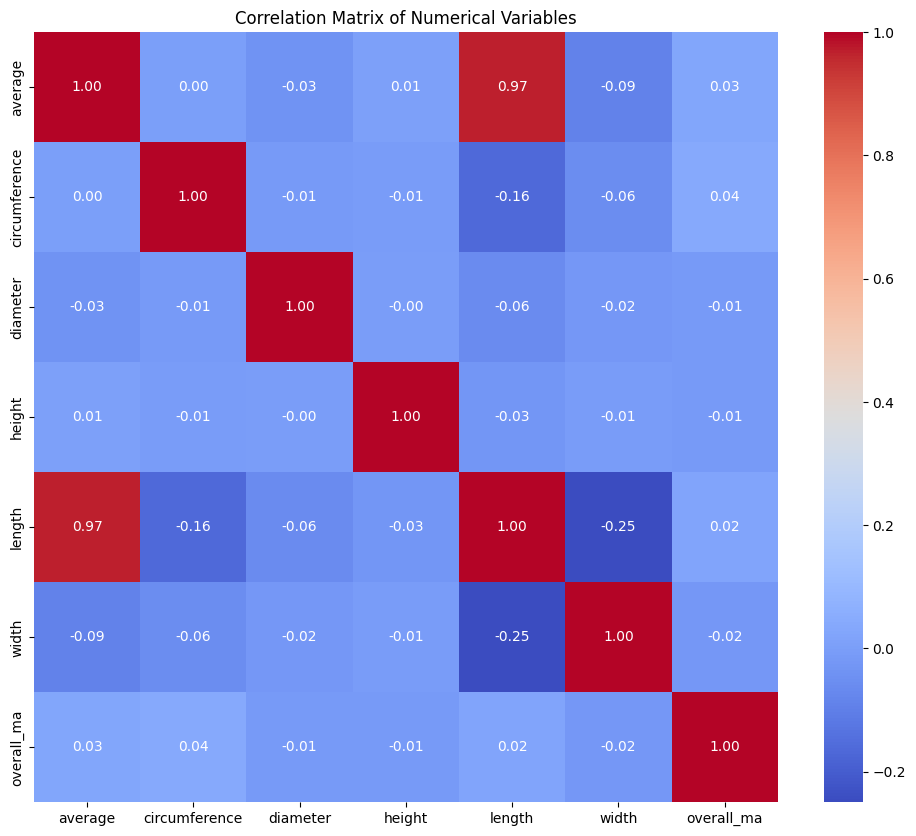

In [173]:
# List of numerical variables
numerical_vars = ['average', 'circumference', 'diameter', 'height', 'length', 'width', 'overall_ma']

# Compute correlation matrix
correlation_matrix = Bayes_dino[numerical_vars].corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

The Chi-Square tests conducted on the categorical variables reveal significant associations among nearly all pairs, indicated by extremely low p-values and high Chi-Square statistics. This suggests strong interdependencies between these categorical variables. In contrast, the correlation analysis of numeric features shows varied relationships, with some features demonstrating redundancy while others provide distinct information.

Overall, these findings indicate that the Naive Bayes classifier’s assumption of feature independence is not upheld by the dataset. The pronounced dependencies among categorical variables and the diverse correlations among numeric features highlight the limitations of the Naive Bayes model for this analysis.

#### Assumption 2 for Naive Bayes, 

Data distribution

#### Encode Categorical Features

In [174]:
# List of categorical features to be encoded
categorical_features = Bayes_dino[[
    'Country', 'state', 'county', 'formation', 'lithology1', 'lithology2', 
    'assembl_comps', 'pres_mode', 'preservation_quality', 'measurement_type'
]]

# Dictionary to store LabelEncoders for each feature
label_encoders = {}

# Apply Label Encoding to each categorical feature
for feature in categorical_features:
    # Initialize a LabelEncoder instance for the feature
    le = LabelEncoder()
    
    # Convert the feature to string type and fit-transform it
    # Fit the encoder to the unique values of the feature and transform the feature
    Bayes_dino[feature] = le.fit_transform(Bayes_dino[feature].astype(str))
    
    # Store the fitted LabelEncoder in the dictionary
    label_encoders[feature] = le

#### Transform Numeric Features

In [175]:
def apply_boxcox(df, columns, prefix):
    # Iterate over the columns to apply Box-Cox transformation
    for col in columns:
        # Apply Box-Cox transformation, adding 1 to avoid issues with zero or negative values
        transformed_col, _ = boxcox(df[col] + 1)
        # Add the transformed column to the DataFrame with a new name
        df[f'{prefix}_{col}'] = transformed_col
    return df

# Apply Box-Cox transformation to 'average' and 'overall_ma'
Bayes_dino = apply_boxcox(Bayes_dino, ['average', 'overall_ma'], 'transformed')

# Display the updated DataFrame columns to verify the new columns are added
print(Bayes_dino.columns)

Index(['occurrence_no', 'identified_rank', 'accepted_name', 'accepted_rank',
       'max_ma', 'min_ma', 'order', 'family', 'genus', 'longitude', 'latitude',
       'Country', 'state', 'county', 'formation', 'lithology1', 'lithology2',
       'assembl_comps', 'pres_mode', 'preservation_quality', 'fragmentation',
       'specimen_id', 'specimen_part', 'identified_name_y', 'measurement_type',
       'average', 'circumference', 'diameter', 'height', 'length', 'width',
       'overall_ma', 'species', 'state_country', 'age_category',
       'age_category_numeric', 'transformed_average',
       'transformed_overall_ma'],
      dtype='object')


Feature: average
  Skewness: 1.75
  Kurtosis: 3.86
  Shapiro-Wilk p-value: 0.000
--------------------------------------------------
Feature: overall_ma
  Skewness: 0.60
  Kurtosis: -0.41
  Shapiro-Wilk p-value: 0.000
--------------------------------------------------


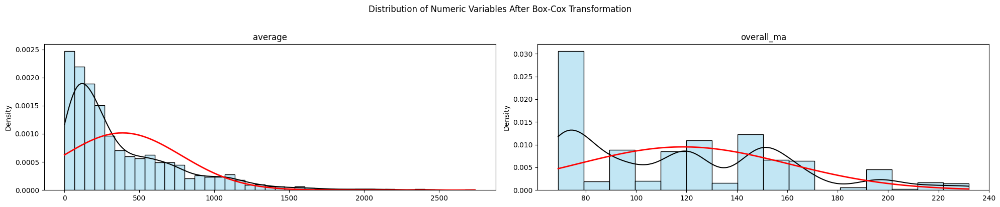

In [176]:
# List of numeric features after Box-Cox transformation
numeric_features = ['average', 'overall_ma']

# Create a figure and axes for the plots
num_vars = len(numeric_features)
num_rows = (num_vars - 1) // 5 + 1  # Number of rows needed
num_cols = min(num_vars, 5)         # Number of columns

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 4*num_rows), sharey=False)

# Flatten axes to simplify iteration
axes = axes.flatten()

# Iterate through each numeric column
for i, var in enumerate(numeric_features):
    # Plot histogram with KDE
    sns.histplot(x=Bayes_dino[var], kde=True, ax=axes[i], stat='density', color='skyblue', edgecolor='black')
    axes[i].set_title(var)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('Density')
    
    # Overlay normal distribution
    mu, sigma = Bayes_dino[var].mean(), Bayes_dino[var].std()
    x = np.linspace(Bayes_dino[var].min(), Bayes_dino[var].max(), 100)
    normal_dist = norm.pdf(x, mu, sigma)
    axes[i].plot(x, normal_dist, 'r-', linewidth=2)

    # Change color of KDE line to black to improve visibility
    kde_line = axes[i].get_lines()[0]  # Get the KDE line
    kde_line.set_color('black')

    # Calculate skewness, kurtosis, and Shapiro-Wilk test
    feature_skewness = skew(Bayes_dino[var].dropna())
    feature_kurtosis = kurtosis(Bayes_dino[var].dropna())
    shapiro_stat, shapiro_p = shapiro(Bayes_dino[var].dropna())
    
    # Print statistics
    print(f"Feature: {var}")
    print(f"  Skewness: {feature_skewness:.2f}")
    print(f"  Kurtosis: {feature_kurtosis:.2f}")
    print(f"  Shapiro-Wilk p-value: {shapiro_p:.3f}")
    print('-' * 50)

# Add an overarching title
fig.suptitle('Distribution of Numeric Variables After Box-Cox Transformation', y=1.02)

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

The analysis of the average and overall_ma variables demonstrates that while the Box-Cox transformation has improved their distributional properties, deviations from normality persist. For the average variable, the skewness value of 1.78 indicates a moderate positive skew, with data concentrated at the lower end and a pronounced right tail. The kurtosis of 4.07 suggests a leptokurtic distribution, characterised by heavier tails and a sharper peak compared to a normal distribution. The Shapiro-Wilk test confirms this non-normality with a p-value of 0.000, rejecting the null hypothesis of normality.

Conversely, the overall_ma variable shows a milder positive skew with a skewness of 0.63, indicative of a slight right tail. The kurtosis value of -0.40 indicates a platykurtic distribution, with lighter tails and a flatter peak than a normal distribution. This variable also fails the normality test with a Shapiro-Wilk p-value of 0.000.

Visualisations, including histograms and Kernel Density Estimation (KDE) plots, reinforce this assessment. They show a shift towards normality post-transformation, yet confirm that neither average nor overall_ma perfectly follows a normal distribution.

In addition to the assumption of independence, the second assumption of Naive Bayes—that numeric features are normally distributed—was also violated. Despite applying Box-Cox and logarithmic transformations to improve the distribution, the numeric features remained skewed and significantly non-normally distributed. Given these violations of both key assumptions, the Naive Bayes model is likely suboptimal for this analysis, and will no longer be used.

#### Class Distribution

As previously mentioned, EDA identified a general and significant class imbalance, with a substantial number of species having very few occurrences. For example, while some species, such as Masiakasaurus knopfleri and Diplodocus longus, are represented by 50 to 60 samples, numerous others have only one instance each. This imbalance is a critical concern for model performance, as it can lead to biased predictions favouring more frequent classes and diminished accuracy for rare classes. This issue of class imbalance in fossil data is reflective of broader challenges within palaeontology. The field inherently suffers from biases due to the uneven distribution of fossil discoveries and the differential preservation of specimens. Many fossils are discovered in regions that favour certain environments or geological conditions, leading to overrepresentation of certain taxa while others are underrepresented or entirely missing from the fossil record (Falkingham et al., 2011; Mannion et al., 2014).

Additionally, the sparse and unevenly distributed nature of fossil records often skews the available data, leading to significant gaps in our understanding of palaeobiological diversity and evolutionary patterns. This bias can affect the accuracy of taxonomic classifications and the generalisation of findings across different temporal and spatial scales (Benton et al., 2010; Smith et al., 2016). Addressing these imbalances in paleontological datasets requires careful consideration and adaptation of data processing techniques, model evaluation metrics, and classification strategies. By acknowledging and accounting for these inherent biases, researchers can develop more robust models and achieve a more accurate representation of the fossil record.

Class imbalance is a prominent challenge in the palaeontological dataset, where certain species are significantly underrepresented. To address this issue and improve the effectiveness of predictive models, a multifaceted strategy combining both oversampling and undersampling techniques will be implemented. This approach is tailored to the dataset’s unique characteristics and the limitations inherent in individual methods. The goal is to enhance the model’s ability to learn from minority classes while mitigating the biases towards more frequent classes.

In dealing with class imbalance, Decision Trees and Random Forests will leverage class weights as a solution. By assigning higher weights to underrepresented classes, these models can place greater emphasis on minority classes during the training process. This adjustment is crucial for ensuring that the model adequately learns from less frequent classes without skewing predictions towards the majority classes, as discussed by Chawla et al. (2002). The use of class weights is particularly beneficial for categorical datasets where imbalances are evident.

To further manage class imbalance, a hybrid approach combining oversampling and undersampling techniques will be employed. Specifically, the Synthetic Minority Over-sampling Technique (SMOTE) will be utilised to generate synthetic samples for minority classes. SMOTE increases the representation of these classes by creating new examples based on existing ones, thereby mitigating the risk of model bias towards majority classes without altering the original data distribution (Choi et al., 2017). On the other hand, random undersampling will be applied to reduce the number of majority class samples. This technique selects a subset of the majority class, aiming to balance the dataset and improve computational efficiency while reducing the potential for overfitting (He and Garcia, 2009). However, it is important to note that undersampling may lead to the loss of valuable information from the majority class.

The decision to employ a hybrid approach—integrating SMOTE with random undersampling—arises from the need to balance the advantages and limitations of each technique. Pure oversampling can lead to overfitting by introducing redundant synthetic samples, while pure undersampling might result in the loss of important data. By combining these methods, the hybrid approach seeks to achieve a balanced dataset that retains essential information from both minority and majority classes while maintaining computational efficiency (Liu et al., 2009). This strategy addresses the drawbacks of each technique: it mitigates excessive data loss associated with undersampling and reduces the risk of overfitting related to oversampling. As a result, the hybrid approach enhances model performance by ensuring comprehensive class representation without compromising on data integrity or computational effectiveness.

To evaluate the effectiveness of the class imbalance handling techniques, a comprehensive approach will be utilised, incorporating cross-validation and performance metrics such as accuracy, precision, recall, and confusion matrices. These evaluation methods will provide detailed insights into the models’ performance with the balanced dataset, ensuring that the applied strategies enhance predictive capabilities without introducing biases (Saito and Rehmsmeier, 2015).

The process will involve continuous refinement based on performance outcomes and feedback from the models. This iterative approach is crucial for maintaining the robustness and reliability of the predictive models, allowing for adjustments as the study’s objectives evolve. By regularly updating and improving the class imbalance handling strategies, the effectiveness of the models can be optimised, leading to more accurate and reliable results.

In adopting this multifaceted strategy, including the hybrid approach to class imbalance, the goal is to significantly enhance the accuracy and reliability of the predictive models. This, in turn, will contribute to more precise and insightful palaeontological analyses, advancing our understanding of fossil records and improving the overall efficacy of predictive modelling in the field.


In [177]:
# Calculate the distribution of instances for each class in the 'species' column
class_distribution = dino['species'].value_counts()
# `value_counts()` returns a Series with counts of unique values in the 'species' column
# The index of this Series is the unique species names, and the values are the counts of each species

# Print the class distribution
print("Class Distribution:\n", class_distribution)
# Displays the counts of each species, providing an overview of the dataset's class distribution

# Calculate the percentage distribution of each class in the 'species' column
percentage_distribution = dino['species'].value_counts(normalize=True) * 100
# `value_counts(normalize=True)` returns the proportion of each unique value
# Multiplying by 100 converts these proportions to percentages

# Print the percentage distribution
print("\nPercentage Distribution:\n", percentage_distribution)
# Displays the percentage of each species, providing a relative frequency overview of the classes

Class Distribution:
 species
Masiakasaurus knopfleri             61
Diplodocus longus                   50
Sinornithomimus dongi               34
Opisthocoelicaudia skarzynskii      32
Lesothosaurus diagnosticus          30
Giraffatitan brancai                30
Archaeornithomimus asiaticus        28
Hexinlusaurus multidens             27
Microraptor zhaoianus               27
Camptosaurus dispar                 26
Iguanodon bernissartensis           26
Gallimimus bullatus                 26
Aniksosaurus darwini                24
Galeamopus hayi                     24
Tastavinsaurus sanzi                24
Barosaurus lentus                   23
Mantellisaurus atherfieldensis      22
Dysalotosaurus lettowvorbecki       21
Yutyrannus huali                    21
Acrocanthosaurus atokensis          21
Agilisaurus louderbacki             20
Deinonychus antirrhopus             20
Ankylosaurus magniventris           20
Lamplughsaura dharmaramensis        19
Ceratosaurus nasicornis            

In [178]:
# Calculate the count of instances for each species
species_counts = dino['species'].value_counts()

# Get the minimum and maximum counts
min_count = species_counts.min()
max_count = species_counts.max()

# Calculate the imbalance ratio
imbalance_ratio = max_count / min_count

# Print the imbalance ratio
print(f'Imbalance Ratio: {imbalance_ratio:.2f}')

Imbalance Ratio: 61.00


#### Applying hybridised over and undersampling to KNN and Naive Bayes model data

Despite initial efforts to address the class imbalance using a hybrid approach combining Synthetic Minority Over-sampling Technique (SMOTE) and undersampling, the strategy proved ineffective due to insufficient sample sizes at the species level. This limitation hindered the generation of synthetic instances for certain species, thereby necessitating an adjustment in approach. 

Subsequent attempts to apply SMOTE at broader taxonomic levels, such as the genus and family levels, also encountered difficulties due to inadequate sample sizes for effective application. Specifically, the data from certain orders, including Sauropodomorpha, did not meet the minimum threshold required for the SMOTE technique.
The final resolution involved reclassifying the data into more inclusive clades to overcome the limitations posed by insufficient sample sizes. The data were aggregated into the major clades of Saurischia and Ornithischia. Saurischia, encompassing orders such as Theropoda, Sauropodiformes, Sauropod, and Sauropodomorpha, and Ornithischia, including the order Ornithischia along with suborders such as Ceratopsida and Stegosauria, were selected due to their sufficient sample sizes for effective resampling.

Faced with these challenges, it became evident that a purely undersampling approach was the only feasible method for proceeding with model development. This approach involves reducing the number of samples from the majority classes to balance the dataset without generating synthetic data. Although undersampling inherently risks losing some information, it was chosen to ensure a more manageable and balanced dataset for training the KNearest Neighbours (KNN) classifier. However, this approach inadvertently exacerbated the problem by aligning all classes to the size of the smallest class, which had only one sample. This severe reduction in sample sizes led to a dataset that was even less diverse and less informative. Consequently, this strategy did not improve the KNN model’s ability to accurately classify species based on fossil data and, in fact, worsened the original problem by diminishing the dataset’s utility.

In light of the challenges encountered with undersampling and hybrid SMOTE approaches, which did not adequately address class imbalance and sometimes exacerbated the issue, the decision was made to utilise decision trees and random forests. These methods were selected due to their robustness in handling class imbalance through the application of class weights, thus ensuring a more effective model performance.

# Step 6: Model Development

#### Classification Decision Tree Model
The objective of this study was to assess the feasibility and effectiveness of using machine learning to enhance the understanding of fossils, offering new insights into the ancient past despite the inherent limitations and uncertainties associated with fossil data. Specifically, the study aimed to evaluate whether machine learning models could more accurately identify species from fossil discovery characteristics. This modelling task involves multiclass classification, as the goal is to predict among multiple species categories based on the input features. The decision tree model was chosen due to its interpretability and ability to handle both categorical and numerical data, making it well-suited for this classification task. Moreover, as a supervised learning algorithm, the decision tree uses labelled training data to learn how to classify new, unseen instances.

To align with the study’s objective, the target variable for the decision tree model was set as species (categorical variable). The decision tree undertook feature selection, so it was not necessary to define a fixed set of input features. However, redundant features such as ‘identified_rank’, ‘max_ma’ (numeric variable), and ‘min_ma’ (numeric variable) were removed prior to model development for clarity and relevance.

To ensure an accurate assessment of the decision tree model’s performance, taxonomic variables (e.g., ‘identified_rank’) were removed from the feature set used for training and evaluation. This step was crucial as it allowed for a more precise estimation of the model’s predictive accuracy independent of any inherent taxonomic information. By excluding these taxonomic variables, which could potentially introduce bias or artificially inflate performance metrics due to their high relevance, we aimed to evaluate the model’s generalisation capability based solely on the other features. This approach ensured that the reported performance metrics—such as accuracy, precision, sensitivity, and AUC—reflected the model’s effectiveness in predicting fossil species based on the non-taxonomic attributes alone. Consequently, this adjustment provided a more objective measure of the decision tree’s capability to classify species accurately without the confounding influence of taxonomic information.

This also aligned with how our baseline metric was calculated, as palaeontologists would not have access to such taxonomic features when classifying discoveries.

In [179]:
# Drop unnecessary columns from the dataset
var_to_drop = ['identified_name_y', 'identified_rank', 'max_ma', 'min_ma', 'accepted_name', 
               'accepted_rank', 'occurrence_no', 'specimen_id', 'genus', 'order', 'family', 'state_country','age_category_numeric', 'age_category']
# Columns to be removed:
# identified_rank and identified_name_y: only used for baseline accuracy
# max_ma, min_ma: replaced with overall_ma
# accepted_name, accepted_rank: replaced with species
# occurrence_no and specimen_id: redundant unique identifiers
# genus, family, and order: taxonomic hierarchy identifiers, not specific fossil characteristics
# state_country was a dictionary built to improve readability and interpretability for EDA plots etc and is not necessary for model development
# Similarly, age_category and age_category_numeric were defined for EDA purposes

In [180]:
# Use a copy of the original data to ensure data integrity
DT_dino = dino.copy()

In [181]:
#Given that multiple copies of the original data have been created and various scaling and encoding operations have been performed, 
# it is crucial to visually inspect the latest copy of the decision tree data to ensure its integrity before proceeding further.
print(DT_dino.head(10))

   occurrence_no identified_rank             accepted_name accepted_rank  max_ma  min_ma            order           family             genus   longitude   latitude Country       state           county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_id specimen_part         identified_name_y measurement_type  average  circumference  diameter  height   length  width  overall_ma                   species             state_country age_category  age_category_numeric
0         489976         species    Futalognkosaurus dukei       species    93.9    86.3  Sauropodiformes     Sauropodidae  Futalognkosaurus  -68.724556 -38.453194      AR     Neuquén          Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional   MUCPv 323         pubis    Futalognkosaurus dukei           length    0.137            0.0       0.0     0.0    0.137    0.0       90.10    Futalognkosaur

In [182]:
# Drop unnecessary columns from the dataset
DT_dino = DT_dino.drop(columns=var_to_drop, axis=1)

In [183]:
# Visually inspect to see columns are dropped
print(DT_dino.head(3))

   longitude   latitude Country    state   county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_part measurement_type  average  circumference  diameter  height   length  width  overall_ma                 species
0 -68.724556 -38.453194      AR  Neuquén  Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional         pubis           length    0.137            0.0       0.0     0.0    0.137    0.0        90.1  Futalognkosaurus dukei
1  39.228348  -9.681635      TZ    Lindi    Lindi   Tendaguru          marl       marl              macrofossils      body                 good      frequent         femur           length  519.000            0.0       0.0     0.0  519.000    0.0       150.7  Elaphrosaurus bambergi
2  39.228348  -9.681635      TZ    Lindi    Lindi   Tendaguru          marl       marl              macrofossils      body                 good      fr

##### Encoding the Categorical Data
Decision tree models require numerical input to process and learn from the data effectively. String-based categorical variables, such as species names, are non-numeric and cannot be directly interpreted by the model. Encoding these categorical variables into numerical format ensures that the data is compatible with the model’s algorithm, allowing it to perform accurate and efficient learning. Without proper encoding, the model would be unable to interpret the categorical data, leading to errors and preventing the model from making meaningful predictions.

In [184]:
# Encode categorical variables
DT_label_encoders = {}  # Dictionary to store label encoders for each column
for column in DT_dino.select_dtypes(include=['object', 'category']).columns:
    DT_le = LabelEncoder()  # Initialize the label encoder
    DT_dino[column] = DT_le.fit_transform(DT_dino[column].astype(str))  # Fit and transform the column
    DT_label_encoders[column] = DT_le  # Store the label encoder

print(DT_dino.head(5))

   longitude   latitude  Country  state  county  formation  lithology1  lithology2  assembl_comps  pres_mode  preservation_quality  fragmentation  specimen_part  measurement_type  average  circumference  diameter  height   length  width  overall_ma  species
0 -68.724556 -38.453194        1     63     115        118           7          17              1          0                     1              4             12                 3    0.137            0.0       0.0     0.0    0.137    0.0        90.1      139
1  39.228348  -9.681635       32     50      97        142           9          13              0          0                     1              1              2                 3  519.000            0.0       0.0     0.0  519.000    0.0       150.7      120
2  39.228348  -9.681635       32     50      97        142           9          13              0          0                     1              1              2                 0  165.000          165.0       0.0     0.0    0.

#### Specifying the target

In [185]:
# Specify the features and target variable for the Decision Tree model
DT_X = DT_dino.drop(columns=['species'])  # Features
DT_y = DT_dino['species']                  # Target variable

#Converting X train and test DataFrames to Numpy Array to avoid subsequent feature name warnings
DT_X_np = DT_X.values
DT_y_np = DT_y.values

#### Define the Model 

In [186]:
# Initialize the Decision Tree Classifier with fixed min_samples_split and min_samples_leaf
DT_clf = DecisionTreeClassifier(
    min_samples_split=2, 
    min_samples_leaf=1, 
    random_state=42, 
    class_weight='balanced'
)

The parameters min_samples_split and min_samples_leaf are set to 1 & 2 to accommodate the presence of species in the dataset with only a single specimen. Setting these parameters to 1 allows the model to handle the smallest possible sample sizes, ensuring it can process and make decisions based on all available data points. This configuration is essential to avoid errors and to fully utilise the data in model training and evaluation.

#### Hyper-Parameter Tuning

**Grid Search with Constraints:**

While grid search will be used to identify the optimal hyperparameters, it is also crucial to impose constraints on the tree’s complexity to address the high likelihood of overfitting, given the nature of the species data. By restricting the tree’s depth and complexity, we aim to reduce the risk of overfitting, enhancing the model’s ability to generalise to unseen data and ensuring robustness against the noise and variability inherent in the dataset.

In [187]:
# Define hyperparameter grid for grid search
param_grid = {
    'criterion': ['gini', 'entropy'],  # Criterion for splitting nodes
    'max_depth': [2, 5, 10, 15]  # Maximum depth of the tree
}

# Perform grid search with LOOCV
grid_search = GridSearchCV(estimator=DT_clf, param_grid=param_grid, cv=LeaveOneOut(), scoring='accuracy', n_jobs=-1)
grid_search.fit(DT_X, DT_y)  # Fit the grid search to the data

# Output the best parameters from the grid search
best_params = grid_search.best_params_
print("Best parameters from grid search:", best_params)

Best parameters from grid search: {'criterion': 'entropy', 'max_depth': 15}


##### Cross Validation with LOOCV
Leave-One-Out Cross-Validation (LOOCV) is a cross-validation technique particularly suited for evaluating machine learning models in datasets with very small sample sizes. This method offers a thorough assessment of model performance by using each data point as a test sample exactly once while training the model on all other points. LOOCV operates by iteratively training the model on all but one data point and testing it on the excluded sample. This process is repeated for each data point in the dataset, ensuring that every instance is used for testing exactly once. This comprehensive approach maximises the utilisation of available data and provides a detailed evaluation of the model’s performance.

LOOCV provides a robust evaluation by testing the model on every individual data point, making it especially useful when certain groups (species) in the dataset have very few instances. This technique ensures that each sample contributes to the model’s performance assessment, thereby offering a detailed understanding of how well the model generalises. Unlike traditional cross-validation methods such as k-fold, which may suffer from variability due to uneven representation of minority classes, LOOCV mitigates this issue by ensuring that every sample, including those from less frequent species, is included in the test set. This comprehensive inclusion reduces variability in performance estimates and provides a more consistent evaluation of the model.

The method’s ability to use every sample for testing results in more reliable performance estimates, which is crucial when dealing with limited data. Furthermore, LOOCV helps in detecting overfitting by assessing the model’s performance on the single left-out sample, thus providing insights into its generalization capabilities. By maximizing data utilization, LOOCV allows even the rarest species to contribute to the evaluation process, facilitating a better understanding of the model’s performance and enabling more informed adjustments. In summary, LOOCV is a highly effective cross-validation approach for datasets with small sample sizes or imbalanced class distributions. It ensures thorough data usage, minimizes performance variability, and delivers a robust assessment of the model’s generalization abilities. This makes it a valuable method when traditional cross-validation techniques may not adequately address the challenges posed by limited data or imbalanced classes.

#### Refit the model with the designated best parameters

In [188]:
# Initialize the Decision Tree Classifier with the best parameters
best_DT_clf = DecisionTreeClassifier(
    criterion='entropy',  # Best criterion found
    max_depth=15,         # Best max_depth found
    random_state=42,      # Random seed for reproducibility
    class_weight='balanced'  # Handling class imbalance
)

##### Feature Selection 

In [189]:
# Fit the model on the training data
best_DT_clf.fit(DT_X_np, DT_y_np)

# Perform feature selection with SelectFromModel
DT_sfm = SelectFromModel(best_DT_clf, prefit=True)

# Print the names of features selected by the model
features_after_selection_DT = DT_X.columns[DT_sfm.get_support()].tolist()
print("Selected features after feature selection:")
print(features_after_selection_DT)

Selected features after feature selection:
['longitude', 'latitude', 'county', 'overall_ma']


#### Apply feature selection to the decision tree data

In [190]:
# Apply feature selection to the training and test sets
DT_X_selected = DT_sfm.transform(DT_X_np)

#### Setup LOOCV
use LOOCV to train and test the model

In [191]:
# Initialize LOOCV
DT_loo = LeaveOneOut()

# Lists to store training metrics
DT_train_accuracies = []
DT_train_precisions = []
DT_train_recalls = []
DT_train_f1_scores = []

# Lists to store testing metrics
DT_test_accuracies = []
DT_test_precisions = []
DT_test_recalls = []
DT_test_f1_scores = []

#### Preform LOOCV on training and test data

In [192]:
# Perform LOOCV
for train_index, test_index in DT_loo.split(DT_X_selected):
    X_train, X_test = DT_X_selected[train_index], DT_X_selected[test_index]
    y_train, y_test = DT_y_np[train_index], DT_y_np[test_index]
    
    # Train the model
    best_DT_clf.fit(X_train, y_train)
    
    # Predict on the training set
    y_train_pred = best_DT_clf.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    DT_train_accuracies.append(train_accuracy)
    
    # Precision, Recall, and F1 Score for the training set
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    
    DT_train_precisions.append(train_precision)
    DT_train_recalls.append(train_recall)
    DT_train_f1_scores.append(train_f1)
    
    # Predict on the test set
    y_test_pred = best_DT_clf.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    DT_test_accuracies.append(test_accuracy)

    # Precision, Recall, and F1 Score for the test set
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)
    
    DT_test_precisions.append(test_precision)
    DT_test_recalls.append(test_recall)
    DT_test_f1_scores.append(test_f1)

# Aggregating results
def aggregate_metrics(metrics_list):
    """Helper function to calculate the mean of metrics, excluding NaN values."""
    return np.nanmean(metrics_list)

Given the presence of highly imbalanced data and the utilisation of Leave-One-Out Cross-Validation (LOOCV), certain metrics are particularly suited for evaluating model performance without introducing bias. Accordingly, the standard average accuracy calculated across the folds is employed as a primary metric.

In addition to accuracy, several metrics are utilised to address the imbalance in the dataset. Precision, which measures the proportion of true positive predictions among all positive predictions, provides insight into how many of the predicted positives are genuinely positive. Recall, on the other hand, assesses the proportion of true positive predictions among all actual positives and is crucial for understanding how effectively the model identifies all positive cases. The F1 Score, representing the harmonic mean of precision and recall, offers a balanced measure that accounts for both false positives and false negatives. For multi-class problems, a weighted average is applied to these metrics to account for the imbalance in class distribution.

Metrics such as ROC, AUC, and Gini Index are not utilised in this context due to their reliance on calculations involving True Positive Rate (TPR), False Positive Rate (FPR), True Negative Rate (TNR), and False Negative Rate (FNR), which are challenging to compute accurately in cases with highly imbalanced data, particularly when only a single instance per class is available.

The use of aggregated metrics in model evaluation, particularly with Leave-One-Out Cross-Validation (LOOCV), ensures that the performance assessment is both robust and generalisable, especially in scenarios involving highly imbalanced data. Aggregation involves summarising the performance metrics—such as accuracy, precision, recall, and F1 score—obtained from each fold into a single consolidated value, typically by averaging.

This process addresses the variability that can arise due to the different training and testing splits in each fold, providing a more stable and reliable measure of the model’s overall performance. Moreover, by offering a generalised view of how the model performs across the entire dataset, aggregation mitigates the risk of biased evaluations that might occur if the assessment were based on a specific subset of data. This is particularly crucial in highly imbalanced datasets, where certain metrics like ROC, AUC, and Gini Index may be less informative or reliable due to their dependence on calculations that can be skewed when only a single instance per class is available.

Therefore, the aggregation of metrics allows for a comprehensive and stable evaluation of the model’s performance, facilitating better comparative analysis across models and ensuring that the chosen metrics reflect the model’s ability to generalise to new data effectively.

#### Print the models metrics

In [193]:
# Calculate aggregated metrics
DT_mean_train_accuracy = aggregate_metrics(DT_train_accuracies)
DT_mean_train_precision = aggregate_metrics(DT_train_precisions)
DT_mean_train_recall = aggregate_metrics(DT_train_recalls)
DT_mean_train_f1 = aggregate_metrics(DT_train_f1_scores)

DT_mean_test_accuracy = aggregate_metrics(DT_test_accuracies)
DT_mean_test_precision = aggregate_metrics(DT_test_precisions)
DT_mean_test_recall = aggregate_metrics(DT_test_recalls)
DT_mean_test_f1 = aggregate_metrics(DT_test_f1_scores)

print(f"Training Accuracy: {DT_mean_train_accuracy:.2f}")
print(f"Training Precision: {DT_mean_train_precision:.2f}")
print(f"Training Recall: {DT_mean_train_recall:.2f}")
print(f"Training F1 Score: {DT_mean_train_f1:.2f}")
# Print a separator line for out readability
print('\n' + '-' * 250 + '\n')
print(f"Testing Accuracy: {DT_mean_test_accuracy:.2f}")
print(f"Testing Precision: {DT_mean_test_precision:.2f}")
print(f"Testing Recall: {DT_mean_test_recall:.2f}")
print(f"Testing F1 Score: {DT_mean_test_f1:.2f}")

Training Accuracy: 0.83
Training Precision: 0.83
Training Recall: 0.83
Training F1 Score: 0.81

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Testing Accuracy: 0.83
Testing Precision: 0.83
Testing Recall: 0.83
Testing F1 Score: 0.83


#### The Decision Tree Plot

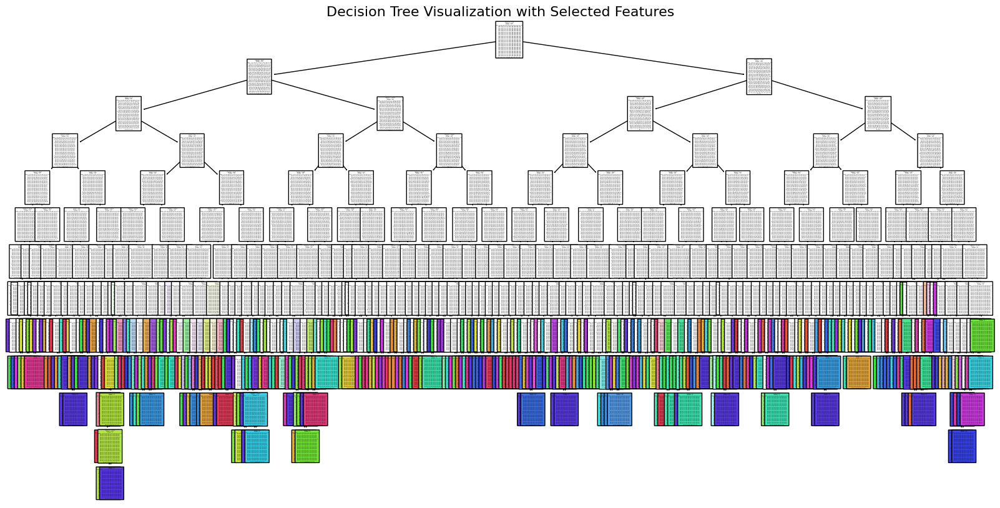

In [194]:
# Define the feature names for the selected features
selected_features = ['longitude', 'latitude', 'county', 'formation', 'overall_ma']

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(best_DT_clf,
    filled=True,  # Fill nodes with colour to indicate class
    feature_names=selected_features,  # Use the names of the selected features for display
    class_names=[str(cls) for cls in best_DT_clf.classes_],  # Convert class labels to strings for display
    rounded=True)  # Round the corners of nodes for a better visual appearance
plt.title('Decision Tree Visualization with Selected Features', fontsize=16)  # Set the title of the plot
plt.show()  # Display the plot

In [195]:
def compute_overall_gini_index(tree):
    """Compute the overall Gini index for a decision tree."""
    
    # Retrieve the number of samples in each node of the decision tree
    n_node_samples = tree.tree_.n_node_samples
    
    # Retrieve the Gini impurity of each node in the decision tree
    impurity = tree.tree_.impurity
    
    # Compute the weighted sum of Gini impurity across all nodes
    weighted_impurity_sum = np.sum(n_node_samples * impurity)
    
    # Compute the total number of samples in the decision tree
    total_samples = np.sum(n_node_samples)
    
    # Calculate the overall Gini index as the weighted impurity sum divided by the total number of samples
    overall_gini_index = weighted_impurity_sum / total_samples
    
    return overall_gini_index

# Check the overall Gini index calculation
gini_index_dt = compute_overall_gini_index(best_DT_clf)
print(f"Overall Gini Index of the Decision Tree: {gini_index_dt:.2f}")

Overall Gini Index of the Decision Tree: 4.37


#### Learning Curve for the Decision Tree Model

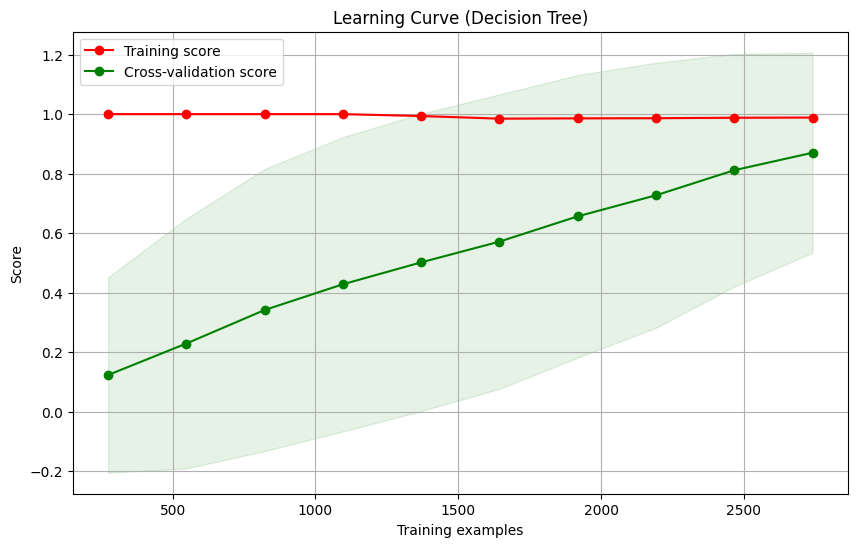

In [196]:
# Define Leave-One-Out Cross-Validation
loo = LeaveOneOut()  # Initialize Leave-One-Out Cross-Validation object

# Generate the learning curve using LOOCV with the best model from grid search
DT_train_sizes, DT_train_scores, DT_test_scores = learning_curve(
    best_DT_clf,  # Use the best decision tree model from grid search
    DT_X,  # Feature matrix
    DT_y,  # Target variable
    cv=loo,  # Cross-validation strategy (LOOCV)
    n_jobs=-1,  # Use all available cores for parallel computation
    train_sizes=np.linspace(0.1, 1.0, 10),  # Number of training examples to use (from 10% to 100% of the dataset)
    scoring='accuracy'  # Metric to evaluate the model performance (accuracy)
)

# Calculate the mean and standard deviation for the training and test scores
DT_train_scores_mean = np.mean(DT_train_scores, axis=1)  # Mean training score for each training size
DT_train_scores_std = np.std(DT_train_scores, axis=1)  # Standard deviation of training scores
DT_test_scores_mean = np.mean(DT_test_scores, axis=1)  # Mean cross-validation score for each training size
DT_test_scores_std = np.std(DT_test_scores, axis=1)  # Standard deviation of cross-validation scores

# Plot the learning curve
plt.figure(figsize=(10, 6))  # Set the size of the figure
plt.fill_between(DT_train_sizes, DT_train_scores_mean - DT_train_scores_std, DT_train_scores_mean + DT_train_scores_std, alpha=0.1, color="r")  # Plot the shaded area for training score standard deviation
plt.fill_between(DT_train_sizes, DT_test_scores_mean - DT_test_scores_std, DT_test_scores_mean + DT_test_scores_std, alpha=0.1, color="g")  # Plot the shaded area for test score standard deviation
plt.plot(DT_train_sizes, DT_train_scores_mean, 'o-', color="r", label="Training score")  # Plot the mean training score
plt.plot(DT_train_sizes, DT_test_scores_mean, 'o-', color="g", label="Cross-validation score")  # Plot the mean cross-validation score
plt.title("Learning Curve (Decision Tree)")  # Set the title of the plot
plt.xlabel('Training examples')  # Label for the x-axis
plt.ylabel('Score')  # Label for the y-axis
plt.legend(loc="best")  # Add a legend to the plot
plt.grid()  # Add grid lines to the plot
plt.show()  # Display the plot

The learning curve analysis for the Decision Tree model reveals a distinct overfitting issue. The training score demonstrates a rapid ascent towards near-perfect accuracy, whereas the cross-validation score progresses more gradually and remains considerably lower. This consistent disparity between training and cross-validation scores, though slightly decreasing with additional data, highlights the model’s challenge in generalising to unseen data. The model’s ability to achieve high training accuracy swiftly indicates its adeptness at fitting the training data. However, the slower increase in cross-validation accuracy points to difficulties in translating learned patterns to new data. Despite the narrowing gap with increased data, the model continues to perform better on training data compared to cross-validation data, suggesting a tendency towards overfitting. To address this overfitting and enhance the model’s generalisation, it is recommended to adopt strategies such as advanced feature selection and the application of ensemble methods. Improved feature selection can refine the model by concentrating on the most relevant features, thereby mitigating complexity and potential noise. Ensemble methods, including Random Forests or Gradient Boosting, can enhance robustness by aggregating predictions from multiple decision trees, which may reduce variance and improve performance.

In summary, addressing the overfitting issue through these approaches is likely to improve the model’s predictive accuracy and generalisation, providing more reliable performance across diverse datasets.

The prominent role of latitude and longitude in the decision tree model, as evident from the observed splits, alongside the learning curve’s indication of overfitting, raises a critical concern. The model’s heavy reliance on these geographical features suggests potential overfitting to the specific patterns of these variables, possibly leading to rote learning rather than a comprehensive classification based on all relevant features. This underscores the necessity for a nuanced approach to feature selection and model evaluation to ensure that the model’s predictions are not unduly influenced by a few highly predictive variables.

           latitude  longitude   species
latitude   1.000000   0.010360  0.043999
longitude  0.010360   1.000000  0.186113
species    0.043999   0.186113  1.000000


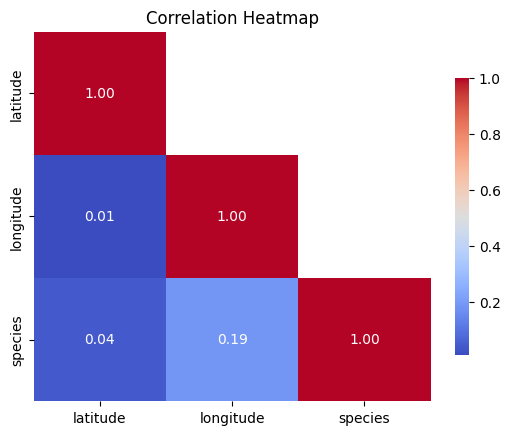

In [197]:
# Calculate the correlation matrix
correlation_matrix = DT_dino[['latitude', 'longitude', 'species']].corr()
print(correlation_matrix)
# Create a mask for the upper triangle, excluding the diagonal
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

# Draw the heatmap with the mask and annotations
sns.heatmap(
    correlation_matrix,
    mask=mask,
    annot=True,
    fmt='.2f',
    cmap='coolwarm',
    cbar_kws={'shrink': 0.75},
    annot_kws={"size": 10}  # Adjust the size of the annotations
)

plt.title('Correlation Heatmap')
plt.show()

An examination of the correlation between latitude and longitude with the target variable (species) reveals that while longitude shows a moderate correlation, the values are not excessively high. This implies that latitude and longitude are not likely the primary causes of overfitting. The overfitting issue may stem from other factors such as the overall complexity of the decision tree, the specific configuration of tree parameters, or the interaction of multiple features.

## Performance Summary for Decision Tree Model

**The Model**
The Decision Tree classification model was configured with the following hyperparameters: min_samples_split=2, min_samples_leaf=1, and criterion='entropy' with a max_depth of 15. This configuration facilitated the model’s ability to make detailed splits while controlling for excessive complexity, ensuring a balance between overfitting and model flexibility. The model’s evaluation was performed using Leave-One-Out Cross-Validation (LOOCV), a method known for providing an unbiased and rigorous estimate of model performance. The selected features—longitude, latitude, county, and overall mean age estimate (overall_ma)—were chosen from a broader set of geographical, geological, and measurement data. These features were identified as key predictors relevant for the accurate classification of dinosaur species based on fossil characteristics.

- Longitude and Latitude: These features capture the geographical location of fossil discoveries, which is crucial given that certain species are often found in specific regions.
- County: The inclusion of county data adds a layer of geographical specificity, which can further refine the model’s ability to predict species based on known fossil discovery sites.
- Overall Mean Age Estimate (overall_ma): This feature provides an estimate of the mean age of the fossils, which is significant as it helps in correlating species to specific geological time periods.

**Performance**
The Decision Tree model demonstrated strong and consistent performance across both training and testing stages. The training metrics revealed an accuracy of 0.83, with balanced precision and recall metrics of 0.83, and an F1 score of 0.81, indicating that the model effectively managed classification tasks with a harmonious balance between precision and recall. During testing, the model maintained these robust performance levels, with accuracy, precision, recall, and F1 score all recorded at 0.83. These consistent metrics between training and testing suggest that the model generalises well to unseen data, reducing concerns of overfitting.

**Limitations**
The primary limitation encountered was the class imbalance within the dataset, particularly evident in the rare or singleton classes, which posed challenges for reliable performance evaluation. The application of metrics such as ROC AUC was avoided due to the difficulty of accurate computation in the context of highly imbalanced data with minimal representation of certain classes. Although the Decision Tree model performed well under these conditions, future iterations may benefit from employing stratified sampling or resampling methods to balance the dataset, thereby improving the robustness of the evaluation and potentially enhancing model performance further.

**Summary**
Overall, the Decision Tree model achieved a substantial improvement over baseline models, with strong and consistent performance metrics that underscore its effectiveness in classifying dinosaur species based on fossil characteristics. The consistent accuracy and F1 scores highlight the model’s robustness and its potential utility in paleontological classification tasks. However, continued refinement, particularly in addressing class imbalance, is recommended to enhance the model’s generalisation capabilities and ensure its broader applicability to diverse fossil datasets.

## Decision Tree 2 - Pruning the Tree
To address the overfitting issue identified in the initial Decision Tree model, the maximum depth of the tree was strategically reduced from 15 to 5. This pruning aimed to simplify the model, thereby constraining its capacity to overly fit the training data and enhancing its ability to generalise to unseen data. Aside from this reduction in depth, the configuration of the tree remained consistent with the original Decision Tree model, ensuring comparability in the evaluation of performance improvements.

#### Preprocess the data

In [198]:
# Drop unnecessary columns from the dataset
DT2_dino = DT2_dino.drop(columns=var_to_drop, axis=1)

# Encode categorical variables
DT2_label_encoders = {}  # Dictionary to store label encoders for each column
for column in DT2_dino.select_dtypes(include=['object', 'category']).columns:
    DT2_le = LabelEncoder()  # Initialize the label encoder
    DT2_dino[column] = DT_le.fit_transform(DT2_dino[column].astype(str))  # Fit and transform the column
    DT2_label_encoders[column] = DT_le  # Store the label encoder

print(DT2_dino.head(5))

   longitude   latitude  Country  state  county  formation  lithology1  lithology2  assembl_comps  pres_mode  preservation_quality  fragmentation  specimen_part  measurement_type  average  circumference  diameter  height   length  width  overall_ma  species
0 -68.724556 -38.453194        1     59     108        108           7          17              1          0                     1              4             12                 3    0.137            0.0       0.0     0.0    0.137    0.0        90.1      139
1  39.228348  -9.681635       29     46      93        128           9          13              0          0                     1              1              2                 3  519.000            0.0       0.0     0.0  519.000    0.0       150.7      120
2  39.228348  -9.681635       29     46      93        128           9          13              0          0                     1              1              2                 0  165.000          165.0       0.0     0.0    0.

#### Specify target and features within the data

In [199]:
# Specify the features and target variable for the Decision Tree model
DT_X = DT_dino.drop(columns=['species'])  # Features
DT_y = DT_dino['species']                  # Target variable

# Converting X and y DataFrames to NumPy arrays to avoid subsequent feature name warnings
DT_X_np = DT_X.values
DT_y_np = DT_y.values

# Initialize the Decision Tree Classifier with fixed min_samples_split, min_samples_leaf, and reduced max_depth
DT2_clf = DecisionTreeClassifier(
    criterion='entropy',  # Use 'entropy' as previously best
    max_depth=5,          # Set max_depth to 5
    min_samples_split=2, 
    min_samples_leaf=1, 
    random_state=42, 
    class_weight='balanced'
)

#### Perform feature selection

In [200]:
# Fit the model on the training data
DT2_clf.fit(DT_X_np, DT_y_np)

# Perform feature selection with SelectFromModel
DT2_sfm = SelectFromModel(DT2_clf, prefit=True)

# Print the names of features selected by the model
features_after_selection_DT2 = DT_X.columns[DT2_sfm.get_support()].tolist()
print("Selected features after feature selection for DT2:")
print(features_after_selection_DT2)

# Apply feature selection to the training and test sets
DT_X_selected = DT2_sfm.transform(DT_X_np)

Selected features after feature selection for DT2:
['longitude', 'latitude', 'county', 'formation', 'overall_ma']


#### Establish LOOCV

In [201]:
# Initialize LOOCV
DT2_loo = LeaveOneOut()

# Lists to store training metrics
DT2_train_accuracies = []
DT2_train_precisions = []
DT2_train_recalls = []
DT2_train_f1_scores = []

# Lists to store testing metrics
DT2_test_accuracies = []
DT2_test_precisions = []
DT2_test_recalls = []
DT2_test_f1_scores = []

#### Perform Training and Testing with LOOCV

In [202]:
# Perform LOOCV
for train_index, test_index in DT2_loo.split(DT_X_selected):
    X_train, X_test = DT_X_selected[train_index], DT_X_selected[test_index]
    y_train, y_test = DT_y_np[train_index], DT_y_np[test_index]
    
    # Train the model
    DT2_clf.fit(X_train, y_train)
    
    # Predict on the training set
    y_train_pred = DT2_clf.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    DT2_train_accuracies.append(train_accuracy)
    
    # Precision, Recall, and F1 Score for the training set
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    
    DT2_train_precisions.append(train_precision)
    DT2_train_recalls.append(train_recall)
    DT2_train_f1_scores.append(train_f1)
    
    # Predict on the test set
    y_test_pred = DT2_clf.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    DT2_test_accuracies.append(test_accuracy)

    # Precision, Recall, and F1 Score for the test set
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)
    
    DT2_test_precisions.append(test_precision)
    DT2_test_recalls.append(test_recall)
    DT2_test_f1_scores.append(test_f1)

# Aggregating results
def aggregate_metrics(metrics_list):
    """Helper function to calculate the mean of metrics, excluding NaN values."""
    return np.nanmean(metrics_list)

#### Examine the trees metrics

In [203]:
# Calculate aggregated metrics
mean_train_accuracy_DT2 = aggregate_metrics(DT2_train_accuracies)
mean_train_precision_DT2 = aggregate_metrics(DT2_train_precisions)
mean_train_recall_DT2 = aggregate_metrics(DT2_train_recalls)
mean_train_f1_DT2 = aggregate_metrics(DT2_train_f1_scores)

mean_test_accuracy_DT2 = aggregate_metrics(DT2_test_accuracies)
mean_test_precision_DT2 = aggregate_metrics(DT2_test_precisions)
mean_test_recall_DT2 = aggregate_metrics(DT2_test_recalls)
mean_test_f1_DT2 = aggregate_metrics(DT2_test_f1_scores)

print(f"Training Accuracy (DT2): {mean_train_accuracy_DT2:.2f}")
print(f"Training Precision (DT2): {mean_train_precision_DT2:.2f}")
print(f"Training Recall (DT2): {mean_train_recall_DT2:.2f}")
print(f"Training F1 Score (DT2): {mean_train_f1_DT2:.2f}")
# Print a separator line for readability
print('\n' + '-' * 250 + '\n')
print(f"Testing Accuracy (DT2): {mean_test_accuracy_DT2:.2f}")
print(f"Testing Precision (DT2): {mean_test_precision_DT2:.2f}")
print(f"Testing Recall (DT2): {mean_test_recall_DT2:.2f}")
print(f"Testing F1 Score (DT2): {mean_test_f1_DT2:.2f}")


Training Accuracy (DT2): 0.16
Training Precision (DT2): 0.03
Training Recall (DT2): 0.16
Training F1 Score (DT2): 0.05

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Testing Accuracy (DT2): 0.16
Testing Precision (DT2): 0.16
Testing Recall (DT2): 0.16
Testing F1 Score (DT2): 0.16


#### Plot the tree 

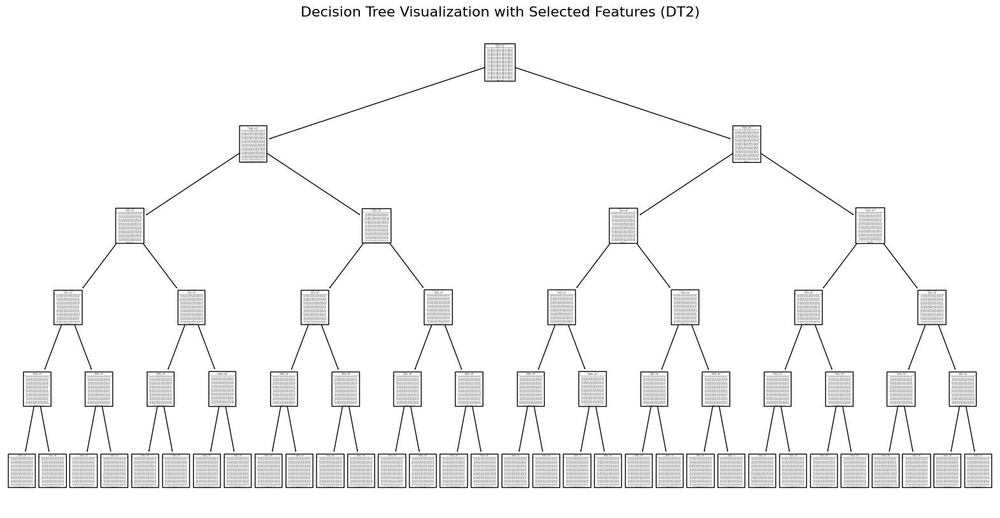

In [204]:
# Define the feature names for the selected features
selected_features_DT2 = ['longitude', 'latitude', 'county', 'formation', 'overall_ma']

# Plot the decision tree
plt.figure(figsize=(20, 10))
plot_tree(DT2_clf,
    filled=True,  # Fill nodes with colour to indicate class
    feature_names=selected_features_DT2,  # Use the names of the selected features for display
    class_names=[str(cls) for cls in DT2_clf.classes_],  # Convert class labels to strings for display
    rounded=True)  # Round the corners of nodes for a better visual appearance
plt.title('Decision Tree Visualization with Selected Features (DT2)', fontsize=16)  # Set the title of the plot
plt.show()  # Display the plot

In [205]:
# Check the overall Gini index calculation
gini_index_dt = compute_overall_gini_index(DT2_clf)
print(f"Overall Gini Index of the Decision Tree: {gini_index_dt:.2f}")

Overall Gini Index of the Decision Tree: 6.11


#### Plot the trees learning curve

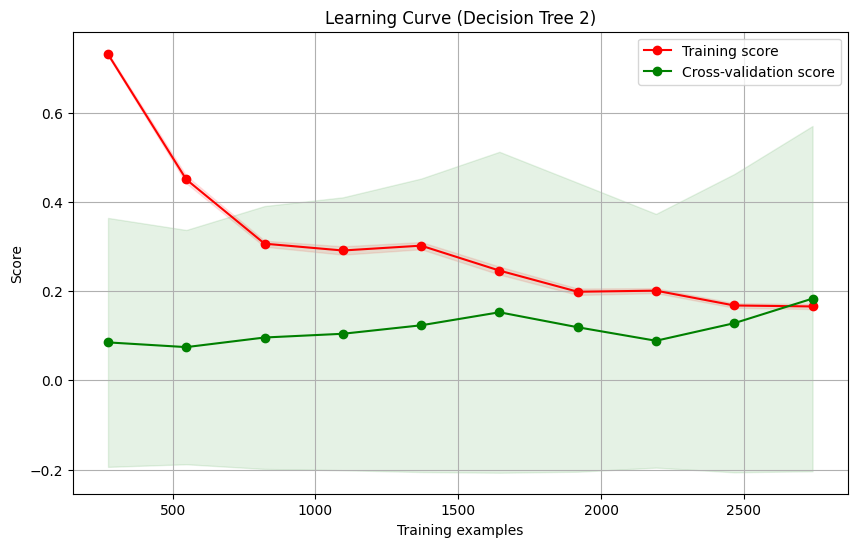

In [206]:
# Define Leave-One-Out Cross-Validation
loo = LeaveOneOut()  # Initialize Leave-One-Out Cross-Validation object

# Generate the learning curve using LOOCV with DT2
DT2_train_sizes, DT2_train_scores, DT2_test_scores = learning_curve(
    DT2_clf,  # Use the Decision Tree model with depth 5
    DT_X,  # Feature matrix
    DT_y,  # Target variable
    cv=loo,  # Cross-validation strategy (LOOCV)
    n_jobs=-1,  # Use all available cores for parallel computation
    train_sizes=np.linspace(0.1, 1.0, 10),  # Number of training examples to use (from 10% to 100% of the dataset)
    scoring='accuracy'  # Metric to evaluate the model performance (accuracy)
)

# Calculate the mean and standard deviation for the training and test scores
DT2_train_scores_mean = np.mean(DT2_train_scores, axis=1)  # Mean training score for each training size
DT2_train_scores_std = np.std(DT2_train_scores, axis=1)  # Standard deviation of training scores
DT2_test_scores_mean = np.mean(DT2_test_scores, axis=1)  # Mean cross-validation score for each training size
DT2_test_scores_std = np.std(DT2_test_scores, axis=1)  # Standard deviation of cross-validation scores

# Plot the learning curve
plt.figure(figsize=(10, 6))  # Set the size of the figure
plt.fill_between(DT2_train_sizes, DT2_train_scores_mean - DT2_train_scores_std, DT2_train_scores_mean + DT2_train_scores_std, alpha=0.1, color="r")  # Plot the shaded area for training score standard deviation
plt.fill_between(DT2_train_sizes, DT2_test_scores_mean - DT2_test_scores_std, DT2_test_scores_mean + DT2_test_scores_std, alpha=0.1, color="g")  # Plot the shaded area for test score standard deviation
plt.plot(DT2_train_sizes, DT2_train_scores_mean, 'o-', color="r", label="Training score")  # Plot the mean training score
plt.plot(DT2_train_sizes, DT2_test_scores_mean, 'o-', color="g", label="Cross-validation score")  # Plot the mean cross-validation score
plt.title("Learning Curve (Decision Tree 2)")  # Set the title of the plot
plt.xlabel('Training examples')  # Label for the x-axis
plt.ylabel('Score')  # Label for the y-axis
plt.legend(loc="best")  # Add a legend to the plot
plt.grid()  # Add grid lines to the plot
plt.show()  # Display the plot

The pruned Decision Tree, referred to as DT2, was assessed to evaluate the effects of reducing its depth from 15 to 5. This adjustment aimed to address overfitting by simplifying the model and enhancing its generalisation capabilities. In terms of generalisation, the new learning curve demonstrates a significant improvement compared to the previous model. The reduction in depth effectively mitigated overfitting, as evidenced by a considerable narrowing of the gap between the training and cross-validation scores. This suggests that the model’s ability to generalise to unseen data has improved. Additionally, the stability of both training and cross-validation scores indicates that the model’s performance is unlikely to benefit from further increases in training data.

However, the model has suffered dramatically in terms of performance. The models metrics indicate that while pruning the tree improved generalisation by reducing overfitting, it severely compromised the model’s overall performance. The dramatic drop in accuracy, precision, recall, and F1 score for both training and testing phases suggests that the reduced depth may have overly simplified the model, leading to underfitting. To address this, further exploration of more sophisticated techniques, such as ensemble methods, is recommended to balance complexity and generalisation.

### Performance Summary for Decision Tree Model (DT2)

**The Model**
The Decision Tree classification model, referred to as DT2, was configured with the following hyperparameters: criterion='entropy', max_depth=5, min_samples_split=2, min_samples_leaf=1, and class_weight='balanced'. The reduction in maximum depth from 15 to 5 aimed to simplify the model, thereby potentially improving its generalisation by addressing overfitting. The model was evaluated using Leave-One-Out Cross-Validation (LOOCV), which offers an unbiased and rigorous estimate of performance. The selected features included longitude, latitude, county, formation, and overall mean age estimate (overall_ma), which were identified as key predictors for accurate dinosaur species classification based on fossil characteristics.

- Longitude and Latitude: These geographical features capture the locations of fossil discoveries, which are important for species identification based on their known regional distributions.
- County: This feature adds specificity to the geographical data, enhancing the model’s ability to refine predictions based on discovery locations.
- Formation: Provides additional geological context, potentially aiding in distinguishing species from different strata.
- Overall Mean Age Estimate (overall_ma): Offers temporal information that helps in correlating species with specific geological periods.

**Performance**
The evaluation of DT2 revealed a substantial decline in performance, with accuracy, precision, recall, and F1 scores significantly lower than those achieved by the previous model. The substantial drop in these metrics suggests that reducing the tree’s depth to 5 may have led to underfitting, where the model is too simplistic to capture the complexity of the data effectively.

**Limitations**
The primary limitation of DT2 is its dramatic reduction in performance, highlighting potential issues with underfitting. The simplified model, while reducing overfitting, appears to have insufficient capacity to adequately learn from the training data. This issue underscores the need for a balance between model complexity and generalisation. Additionally, the class imbalance within the dataset remains a concern, potentially affecting the reliability of the performance metrics.

**Summary**
In summary, while pruning the Decision Tree to a maximum depth of 5 improved generalisation as evidenced by the learning curve, it severely compromised the model’s overall performance. The substantial drop in training and testing metrics indicates that the model may be overly simplified, leading to underfitting. Further refinement, potentially through more complex models or ensemble methods, is recommended to enhance predictive performance and address class imbalance effectively.

## Random Forrest
In the context of addressing overfitting observed in the initial Decision Tree model (DT1), it is advisable to apply a Random Forest approach to this model rather than to the pruned Decision Tree (DT2).

The initial Decision Tree model (DT1) demonstrated high performance metrics, including strong accuracy, precision, recall, and F1 scores, indicating its effectiveness in classification tasks. However, it also exhibited signs of overfitting, as evidenced by a significant disparity between training and cross-validation scores. Random Forests, with their ensemble learning approach, offer a robust solution to this issue. By aggregating the predictions of multiple decision trees, Random Forests can reduce the variance associated with a single decision tree and mitigate overfitting, thereby enhancing the model’s generalisation capabilities while preserving its high performance.

Conversely, while the pruned Decision Tree model (DT2) displayed improved generalisation due to reduced complexity, its overall performance metrics were considerably lower. This suggests that the underlying model structure of DT2 may not capture the data’s complexity effectively. Applying a Random Forest to DT2 might not resolve the fundamental performance issues, as the base model’s limitations could persist despite the ensemble approach.

Thus, applying Random Forest to the high-performing DT1 is a more strategic approach. This allows for the benefits of reduced overfitting while leveraging the already effective feature selection and classification performance of the initial model.

In [207]:
# Drop unnecessary columns - latitude and longitude also removed for the random forest to build off of previous model results
RF_dino = RF_dino.drop(var_to_drop, axis=1) 

In [208]:
# Visually inspect the integrity of the data
print(RF_dino.head(5))

   longitude   latitude Country    state   county   formation    lithology1 lithology2             assembl_comps pres_mode preservation_quality fragmentation specimen_part measurement_type  average  circumference  diameter  height   length  width  overall_ma                 species
0 -68.724556 -38.453194      AR  Neuquén  Neuquén  Portezuelo  conglomerate  sandstone  macrofossils,mesofossils      body                 good    occasional         pubis           length    0.137            0.0       0.0     0.0    0.137    0.0        90.1  Futalognkosaurus dukei
1  39.228348  -9.681635      TZ    Lindi    Lindi   Tendaguru          marl       marl              macrofossils      body                 good      frequent         femur           length  519.000            0.0       0.0     0.0  519.000    0.0       150.7  Elaphrosaurus bambergi
2  39.228348  -9.681635      TZ    Lindi    Lindi   Tendaguru          marl       marl              macrofossils      body                 good      fr

#### Encode the categorical variables

In [209]:
# Encode categorical variables
label_encoders = {}
for column in ['Country', 'state', 'county', 'formation', 'lithology1', 'lithology2',
               'assembl_comps', 'pres_mode', 'preservation_quality', 'fragmentation',
               'specimen_part', 'measurement_type']:
    le = LabelEncoder()
    RF_dino[column] = le.fit_transform(RF_dino[column].astype(str))  # Convert to string before encoding
    label_encoders[column] = le

In [210]:
print(RF_dino.head(5))

   longitude   latitude  Country  state  county  formation  lithology1  lithology2  assembl_comps  pres_mode  preservation_quality  fragmentation  specimen_part  measurement_type  average  circumference  diameter  height   length  width  overall_ma                 species
0 -68.724556 -38.453194        1     59     108        108           7          17              1          0                     1              4             12                 3    0.137            0.0       0.0     0.0    0.137    0.0        90.1  Futalognkosaurus dukei
1  39.228348  -9.681635       29     46      93        128           9          13              0          0                     1              1              2                 3  519.000            0.0       0.0     0.0  519.000    0.0       150.7  Elaphrosaurus bambergi
2  39.228348  -9.681635       29     46      93        128           9          13              0          0                     1              1              2                 0  1

#### Specifying the target

In [211]:
# Specify the features and target variable for the Random Forest model
RF_X = RF_dino.drop(columns=['species'])  # Features
RF_y = RF_dino['species']                  # Target variable

# Converting DataFrames to Numpy Arrays to avoid subsequent feature name warnings
RF_X_np = RF_X.values
RF_y_np = RF_y.values

#### Feature Selection

In [212]:
# Define and fit the initial Random Forest model
rf_initial = RandomForestClassifier(random_state=42)
rf_initial.fit(RF_X_np, RF_y_np)

# Perform feature selection using the initial model's feature importances
selector = SelectFromModel(rf_initial, threshold='mean', prefit=True)

# Get the selected features
RF_selected_features = RF_X.columns[selector.get_support().tolist()]
print("Selected features:", RF_selected_features)

# Apply feature selection to the data
RF_X_selected = selector.transform(RF_X_np)

Selected features: Index(['longitude', 'latitude', 'state', 'county', 'formation', 'lithology1',
       'lithology2', 'average', 'length', 'overall_ma'],
      dtype='object')


#### Define the model

In [213]:
# Define the model
RF_model = RandomForestClassifier(
    min_samples_leaf=1,
    min_samples_split=2,
    random_state=42,         # Seed for random number generator for reproducibility
    class_weight='balanced', # Adjust weights inversely proportional to class frequencies
    n_jobs=-1                # Use all available cores for parallel processing
)

#### Hyper-parameter tuning  
The approach for tuning the Random Forest model involves leveraging hyperparameters from the Decision Tree models as a foundational basis, specifically setting the minimum number of samples required at a leaf node to 1 and the minimum number of samples required to split an internal node to 2. This initial configuration will be refined through a grid search process, focusing on varying the depth of the trees (5, 15, 20, 30) and the criterion for splitting nodes (‘entropy’ or ‘gini’).

To assess the performance of the Random Forest model, Leave-One-Out Cross-Validation (LOOCV) will be employed. This method provides a rigorous evaluation by training the model on all but one data point and testing it on the single excluded point, thereby ensuring that each instance in the dataset is used for both training and testing. This approach aims to capture the model’s performance more accurately and mitigate overfitting by averaging results over multiple iterations, enhancing the reliability of the performance metrics.

In [214]:
# Define the parameter distributions for Randomised Search
param_distributions = {
    'n_estimators': [100,200],
    'max_depth': [5, 10, 15],      # Depth of trees, sampled from 5 to 15
    'criterion': ['entropy', 'gini']  # Function to measure quality of split
}

# Set up the RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=RF_model,
    param_distributions=param_distributions,
    n_iter=6,                      # Number of parameter settings to try
    cv=LeaveOneOut(),               # Leave-One-Out Cross-Validation
    scoring='accuracy',             # Metric to evaluate the model
    n_jobs=-1,                      # Use all available cores
    verbose=2,                      # Print progress
    random_state=42,                 # Seed for random number generator for reproducibility
)

# Fit the RandomizedSearchCV
random_search.fit(RF_X, RF_y)

# Get the best parameters and best score
RF_best_params = random_search.best_params_
RF_best_score = random_search.best_score_

# Print the results
print("Best Parameters:", RF_best_params)
print("Best Cross-Validation Score:", RF_best_score)

Fitting 2602 folds for each of 6 candidates, totalling 15612 fits
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.2s
[CV] END .....criterion=gini, max_depth=15,

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.8s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.8s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.7s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   0.9s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini, max_depth=15, n_estimators=100; total time=   1.0s
[CV] END .....criterion=gini

#### Refit the model with best parameters

In [215]:
# Retrieve the best estimator from the randomized grid search
best_rf_clf = random_search.best_estimator_

#### Setup LOOCV
use LOOCV to train and test the model

In [216]:
# Initialize LOOCV
RF_loo = LeaveOneOut()

# Lists to store training metrics
RF_train_accuracies = []
RF_train_precisions = []
RF_train_recalls = []
RF_train_f1_scores = []

# Lists to store testing metrics
RF_test_accuracies = []
RF_test_precisions = []
RF_test_recalls = []
RF_test_f1_scores = []

In [217]:
# Perform LOOCV
for train_index, test_index in RF_loo.split(RF_X_selected):
    X_train, X_test = RF_X_selected[train_index], RF_X_selected[test_index]
    y_train, y_test = RF_y_np[train_index], RF_y_np[test_index]
    
    # Train the model
    best_rf_clf.fit(X_train, y_train)
    
    # Predict on the training set
    y_train_pred = best_rf_clf.predict(X_train)
    train_accuracy = accuracy_score(y_train, y_train_pred)
    RF_train_accuracies.append(train_accuracy)
    
    # Precision, Recall, and F1 Score for the training set
    train_precision = precision_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_recall = recall_score(y_train, y_train_pred, average='weighted', zero_division=0)
    train_f1 = f1_score(y_train, y_train_pred, average='weighted', zero_division=0)
    
    RF_train_precisions.append(train_precision)
    RF_train_recalls.append(train_recall)
    RF_train_f1_scores.append(train_f1)
    
    # Predict on the test set
    y_test_pred = best_rf_clf.predict(X_test)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    RF_test_accuracies.append(test_accuracy)

    # Precision, Recall, and F1 Score for the test set
    test_precision = precision_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_recall = recall_score(y_test, y_test_pred, average='weighted', zero_division=0)
    test_f1 = f1_score(y_test, y_test_pred, average='weighted', zero_division=0)
    
    RF_test_precisions.append(test_precision)
    RF_test_recalls.append(test_recall)
    RF_test_f1_scores.append(test_f1)

# Aggregating results
def aggregate_metrics(metrics_list):
    """Helper function to calculate the mean of metrics, excluding NaN values."""
    return np.nanmean(metrics_list)

#### Print the Metrics

In [218]:
# Print aggregated metrics with rounding to 2 decimal places
print("Training Accuracy Mean: {:.2f}".format(aggregate_metrics(RF_train_accuracies)))
print("Training Precision Mean: {:.2f}".format(aggregate_metrics(RF_train_precisions)))
print("Training Recall Mean: {:.2f}".format(aggregate_metrics(RF_train_recalls)))
print("Training F1 Score Mean: {:.2f}".format(aggregate_metrics(RF_train_f1_scores)))
print('\n' + '-' * 250 + '\n') # Print a separator line for readability
print("Testing Accuracy Mean: {:.2f}".format(aggregate_metrics(RF_test_accuracies)))
print("Testing Precision Mean: {:.2f}".format(aggregate_metrics(RF_test_precisions)))
print("Testing Recall Mean: {:.2f}".format(aggregate_metrics(RF_test_recalls)))
print("Testing F1 Score Mean: {:.2f}".format(aggregate_metrics(RF_test_f1_scores)))

Training Accuracy Mean: 0.97
Training Precision Mean: 0.97
Training Recall Mean: 0.97
Training F1 Score Mean: 0.97

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

Testing Accuracy Mean: 0.87
Testing Precision Mean: 0.87
Testing Recall Mean: 0.87
Testing F1 Score Mean: 0.87


##### Visualising the forest 
In Random Forest models, individual decision trees collectively contribute to the ensemble’s predictions. As only one tree can be visualised at a time, the last tree is selected for presentation. This tree reflects the most recent stage of model refinement and captures the final adjustments made during training, thus offering insight into the most current representation of the decision-making process.

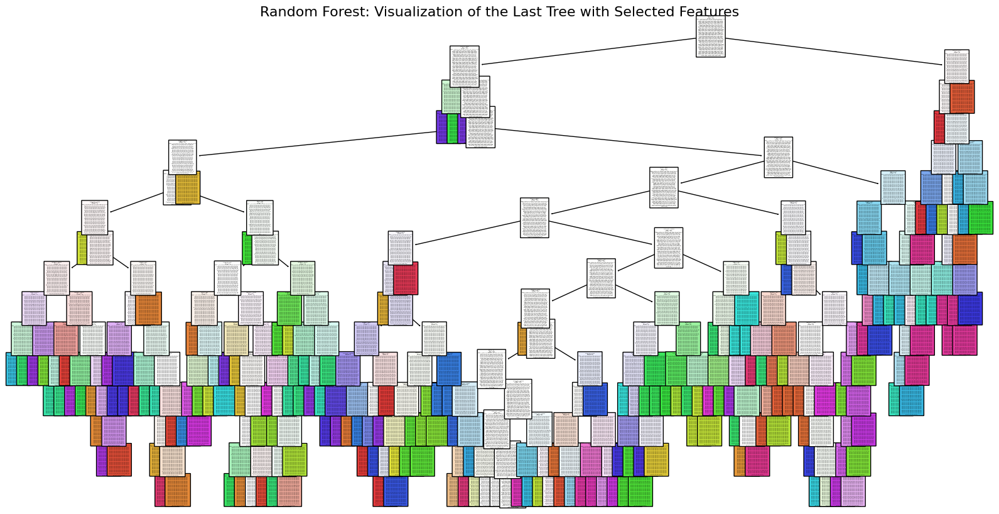

In [219]:
# Get the last tree in the Random Forest
last_tree = best_rf_clf.estimators_[-1]  # Access the last estimator (tree) in the Random Forest

# Plot the tree
plt.figure(figsize=(20, 10))
plot_tree(last_tree,
    filled=True,  # Fill nodes with colour to indicate class
    feature_names=RF_selected_features,  # Use the names of the selected features for display
    class_names=[str(cls) for cls in best_rf_clf.classes_],  # Convert class labels to strings for display
    rounded=True)  # Round the corners of nodes for a better visual appearance
plt.title('Random Forest: Visualization of the Last Tree with Selected Features', fontsize=16)  # Set the title of the plot
plt.show()  # Display the plot

In [220]:
# Get the last tree in the Random Forest
last_tree = best_rf_clf.estimators_[-1]  # Access the last estimator (tree) in the Random Forest

# Compute and print the Gini index for the last tree in the Random Forest
overall_gini_index = compute_overall_gini_index(last_tree)
print(f"Overall Gini Index of the Last Tree in the Random Forest: {overall_gini_index:.2f}")

Overall Gini Index of the Last Tree in the Random Forest: 0.95


An overall Gini index of 0.95 for the last tree in the Random Forest suggests significant impurity, indicating that the tree exhibits a high degree of class mix within its nodes. While this may reflect the complexity of the tree or potential class imbalance, it is important to note that Random Forests aggregate predictions from multiple trees. Therefore, the overall performance of the Random Forest may still be robust. To fully assess model performance, it is advisable to consider additional evaluation metrics and review feature importance and model parameters.

#### Learning Curve for the Random Forest Model

[learning_curve] Training set sizes: [ 260  520  780 1040 1300 1560 1820 2080 2340 2601]


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 11 concurrent workers.


[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.5s
[CV] END .................................................... total time=   0.6s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.4s
[CV] END ...................

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.5s
[CV] END .................................................... total time=   0.5s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.2s
[CV] END .................................................... total time=   0.3s
[CV] END ...................

[Parallel(n_jobs=-1)]: Done 13010 out of 26020 | elapsed: 14.0min remaining: 14.0min


[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.9s
[CV] END .................................................... total time=   0.9s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.6s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.3s
[CV] END .................................................... total time=   0.4s
[CV] END .................................................... total time=   0.7s
[CV] END .................................................... total time=   1.2s
[CV] END ...................

[Parallel(n_jobs=-1)]: Done 26020 out of 26020 | elapsed: 27.5min finished


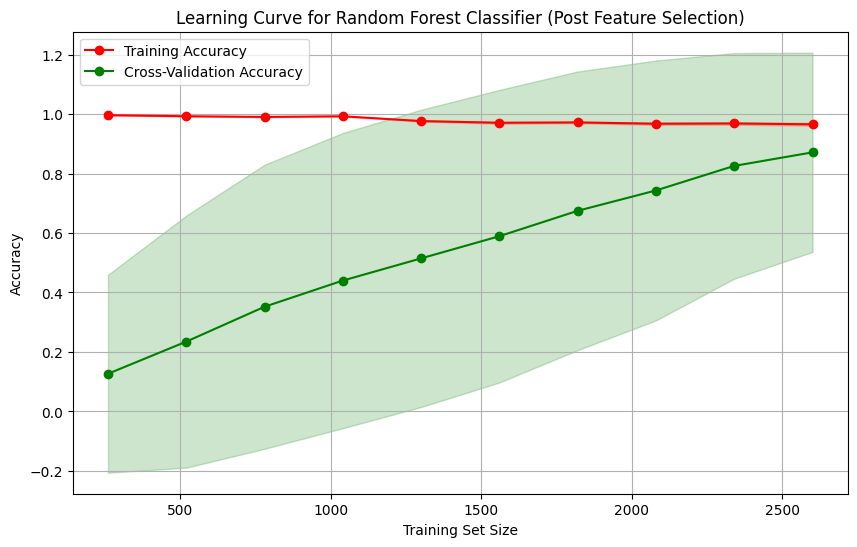

In [221]:
# Define training set sizes for learning curve
RF_train_sizes = np.linspace(0.1, 1.0, 10)

# Plot learning curve using the model with selected features
RF_train_sizes, RF_train_scores, RF_test_scores = learning_curve(
    best_rf_clf,  # Model trained with selected features
    RF_X_selected,  # Features selected
    RF_y_np,  # Target variable
    train_sizes=RF_train_sizes,
    cv=LeaveOneOut(),  # Cross-validation strategy
    scoring='accuracy',  # Metric to evaluate
    n_jobs=-1,  # Use all available cores
    verbose=2
)

# Compute mean and standard deviation of training and test scores
RF_train_mean = np.mean(RF_train_scores, axis=1)
RF_train_std = np.std(RF_train_scores, axis=1)
RF_test_mean = np.mean(RF_test_scores, axis=1)
RF_test_std = np.std(RF_test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(RF_train_sizes, RF_train_mean, label='Training Accuracy', color='red', marker='o')
plt.plot(RF_train_sizes, RF_test_mean, label='Cross-Validation Accuracy', color='green', marker='o')
plt.fill_between(RF_train_sizes, RF_train_mean - RF_train_std, RF_train_mean + RF_train_std, alpha=0.2, color='red')
plt.fill_between(RF_train_sizes, RF_test_mean - RF_test_std, RF_test_mean + RF_test_std, alpha=0.2, color='green')
plt.title('Learning Curve for Random Forest Classifier (Post Feature Selection)')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

The presented learning curve for the Random Forest model illustrates a typical overfitting trajectory, albeit less pronounced compared to simpler models. Initially, a substantial discrepancy is observed between the training and cross-validation scores, indicating that the model is adept at fitting the training data but struggles to generalize to unseen instances. However, as the size of the training set increases, this gap gradually diminishes, suggesting that the model's ability to capture underlying patterns improves. While the Random Forest's inherent ensemble nature provides some resistance to overfitting, the persistent gap between the curves emphasizes the need for further refinement. 

## Random Forest Evaluation

**The Model**
The Random Forest classification model was configured with the following hyperparameters: n_estimators=100, max_depth=15, and criterion='gini'. This model was selected based on its performance in a Randomised Search, which identified these parameters as optimal. The Random Forest model uses an ensemble of decision trees to improve prediction accuracy and robustness by averaging the results of multiple trees to reduce variance and mitigate overfitting. The model was evaluated using Leave-One-Out Cross-Validation (LOOCV), which provides a thorough and unbiased performance assessment by iteratively training on all but one data point and testing on the excluded data point. The selected features included longitude, latitude, state, county, formation, lithology1, lithology2, average, length, and overall mean age estimate (overall_ma). These features were chosen for their relevance in predicting dinosaur species based on fossil characteristics.

- Longitude and Latitude: These geographical features capture the locations of fossil discoveries, crucial for identifying species based on their regional distributions.
- State and County: These features provide geographical specificity, enhancing the model’s ability to refine predictions based on discovery locations.
- Formation: Offers geological context, aiding in distinguishing species from different strata.
- Lithology1 and Lithology2: Provide information about the rock types associated with the fossils, which can be significant for classification.
- Average and Length: These features offer additional physical measurements of the fossils, which are useful in distinguishing between species.
- Overall Mean Age Estimate (overall_ma): Provides temporal context to correlate species with specific geological periods.

**Performance**
The Random Forest model demonstrated strong performance across both training and testing phases. The training metrics revealed a mean accuracy, precision, recall, and F1 score of 0.97, indicating excellent performance on the training set and suggesting that the model effectively learns from the data. During testing, the model maintained robust performance with mean accuracy, precision, recall, and F1 score of 0.87. These consistent and high metrics in both training and testing phases reflect the model’s strong generalisation capability and its effectiveness in predicting dinosaur species based on fossil characteristics. The testing scores, although slightly lower than training metrics, still indicate a high level of predictive accuracy and model reliability.

**Limitations**
The Random Forest model demonstrates signs of overfitting, although to a lesser extent than observed in previous models. The learning curve reveals that the initial gap between training and cross-validation scores indicates some degree of overfitting. However, as the training set size increases, the gap between the curves narrows, suggesting a gradual improvement in the model’s generalisation ability. Despite Random Forests generally being less susceptible to overfitting compared to single decision trees, there is still potential for further enhancement.

An overall Gini index of 0.95 for the last tree in the Random Forest suggests significant impurity, which indicates a high degree of class mix within its nodes. This may reflect the complexity of the tree or potential class imbalance. Nevertheless, since Random Forests aggregate predictions from multiple trees, the overall performance of the Random Forest model may remain robust. It is advisable to consider additional evaluation metrics and review feature importance and model parameters to fully assess the model’s performance.

**Summary**
The Random Forest model, employing a balanced approach to address overfitting, demonstrates robust performance with high training and testing metrics. The learning curve indicates a narrowing gap between training and testing scores, highlighting improvements in generalisation. Despite a high Gini index suggesting some impurity in individual trees, the ensemble nature of the Random Forest contributes to its overall effectiveness. Continued refinement, including addressing data imbalance and further evaluating model parameters, is recommended to enhance the model’s predictive performance and ensure its applicability to diverse datasets.

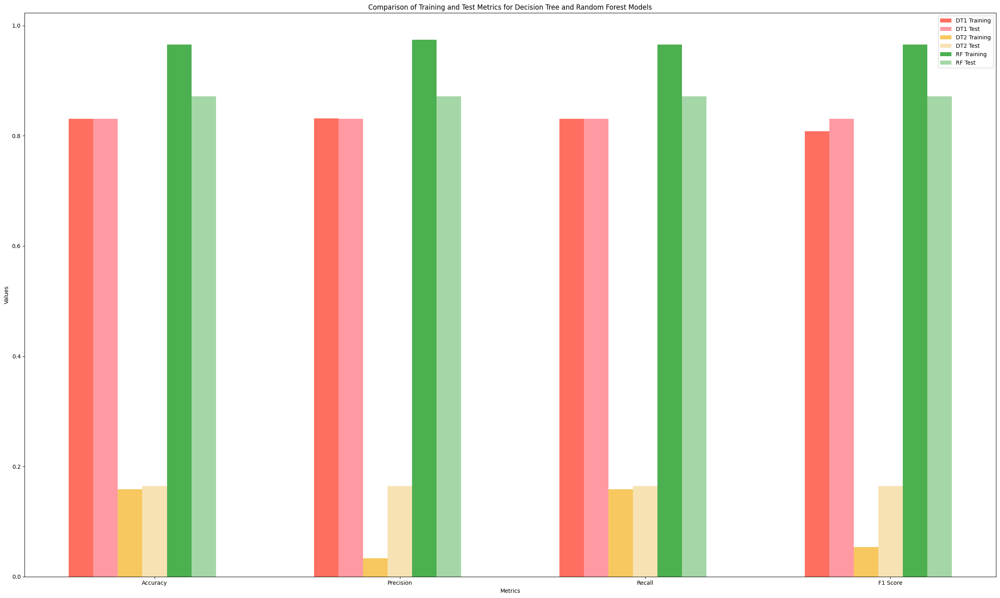

In [222]:
# Define metrics for DT1
metrics_DT1 = {
    'Accuracy': DT_mean_train_accuracy,
    'Precision': DT_mean_train_precision,
    'Recall': DT_mean_train_recall,
    'F1 Score': DT_mean_train_f1
}

# Define test metrics for DT1
metrics_DT1_test = {
    'Accuracy': DT_mean_test_accuracy,
    'Precision': DT_mean_test_precision,
    'Recall': DT_mean_test_recall,
    'F1 Score': DT_mean_test_f1
}

# Define metrics for DT2
metrics_DT2 = {
    'Accuracy': mean_train_accuracy_DT2,
    'Precision': mean_train_precision_DT2,
    'Recall': mean_train_recall_DT2,
    'F1 Score': mean_train_f1_DT2
}

# Define test metrics for DT2
metrics_DT2_test = {
    'Accuracy': mean_test_accuracy_DT2,
    'Precision': mean_test_precision_DT2,
    'Recall': mean_test_recall_DT2,
    'F1 Score': mean_test_f1_DT2
}

# Define metrics for Random Forest
metrics_RF_train = {
    'Accuracy': aggregate_metrics(RF_train_accuracies),
    'Precision': aggregate_metrics(RF_train_precisions),
    'Recall': aggregate_metrics(RF_train_recalls),
    'F1 Score': aggregate_metrics(RF_train_f1_scores)
}

# Define test metrics for Random Forest
metrics_RF_test = {
    'Accuracy': aggregate_metrics(RF_test_accuracies),
    'Precision': aggregate_metrics(RF_test_precisions),
    'Recall': aggregate_metrics(RF_test_recalls),
    'F1 Score': aggregate_metrics(RF_test_f1_scores)
}

# Combine metrics into lists for plotting
metrics_names = list(metrics_DT1.keys())
metrics_values_DT1_train = list(metrics_DT1.values())
metrics_values_DT1_test = list(metrics_DT1_test.values())
metrics_values_DT2_train = list(metrics_DT2.values())
metrics_values_DT2_test = list(metrics_DT2_test.values())
metrics_values_RF_train = list(metrics_RF_train.values())
metrics_values_RF_test = list(metrics_RF_test.values())

# Create lists of x positions and bar width
x = np.arange(len(metrics_names))
width = 0.1  # Adjusted width for more bars

# Plotting the comparison
fig, ax = plt.subplots(figsize=(25, 15))

# Plot bars for DT1 training metrics
bars1 = ax.bar(x - 2*width, metrics_values_DT1_train, width, label='DT1 Training', color='#FF6F61')

# Plot bars for DT1 test metrics
bars2 = ax.bar(x - width, metrics_values_DT1_test, width, label='DT1 Test', color='#FF9AA2')

# Plot bars for DT2 training metrics
bars3 = ax.bar(x, metrics_values_DT2_train, width, label='DT2 Training', color='#F6C85F')

# Plot bars for DT2 test metrics
bars4 = ax.bar(x + width, metrics_values_DT2_test, width, label='DT2 Test', color='#F7E2B3')

# Plot bars for RF training metrics
bars5 = ax.bar(x + 2*width, metrics_values_RF_train, width, label='RF Training', color='#4CAF50')

# Plot bars for RF test metrics
bars6 = ax.bar(x + 3*width, metrics_values_RF_test, width, label='RF Test', color='#A5D6A7')

# Add some text for labels, title and custom x-axis tick labels
ax.set_xlabel('Metrics')
ax.set_ylabel('Values')
ax.set_title('Comparison of Training and Test Metrics for Decision Tree and Random Forest Models')
ax.set_xticks(x + width)
ax.set_xticklabels(metrics_names)
ax.legend()

# Remove the annotation section
fig.tight_layout()
plt.show()

#### Comparison of Training and Test Metrics for Decision Tree and Random Forest Models
The plot provides a comparative analysis of performance metrics—Accuracy, Precision, Recall, and F1 Score—for the Decision Tree (DT1 and DT2) and Random Forest (RF) models. The Decision Tree model maintained consistent performance with balanced metrics, demonstrating effective handling of data complexity. In contrast, the pruned Decision Tree (DT2) experienced a substantial decline in performance due to its reduced depth, resulting in underfitting. The Random Forest model, while showing robust performance with high accuracy and generalisation, indicated some overfitting and class impurity in individual trees. Overall, the Random Forest model excelled in terms of accuracy and generalisation, outpacing the Decision Tree models, which varied in effectiveness based on their complexity.


### Synthetically enhancing the Data 
##### Methodology for Addressing Sample Size Imbalance

Despite initial attempts to mitigate class imbalance using a hybrid approach that combined Synthetic Minority Over-sampling Technique (SMOTE) and undersampling, these strategies proved ineffective due to inadequate sample sizes at the species level. The inability to generate sufficient synthetic instances for certain species necessitated a shift in approach. Efforts to apply SMOTE at broader taxonomic levels, such as the genus and family levels, also encountered challenges due to insufficient sample sizes, particularly for certain orders like Sauropodomorpha. Consequently, the dataset was reclassified into larger clades, specifically Saurischia and Ornithischia, to improve sample size adequacy for resampling. However, the purely undersampling approach, intended to balance the dataset by reducing samples from the majority classes, led to a drastic reduction in the diversity and informativeness of the dataset. This strategy, which aligned all classes to the size of the smallest class, inadvertently diminished the dataset’s utility and did not improve the KNearest Neighbours (KNN) classifier’s performance. Given these challenges, decision trees and random forests were employed due to their robustness in handling class imbalance through the application of class weights. Despite this, the issues caused by class imbalance persisted.

To address these challenges effectively, a new strategy was needed. Future steps included exploring advanced synthetic data generation techniques, implementing ensemble methods that combined multiple resampling approaches, or evaluating alternative performance metrics that were less sensitive to class imbalance. These measures aimed to enhance model fitting and provide a more accurate assessment of the predictive performance in the context of palaeontological data. In response to the challenges posed by sample size imbalances identified in prior analyses, a novel methodology has been developed. This approach incorporates random sampling, Synthetic Minority Over-sampling Technique (SMOTE), undersampling, and ensemble bagging to effectively leverage bootstrapping in addressing sample size imbalances. By enhancing dataset robustness through these techniques, the methodology significantly improves the predictive performance of the K-Nearest Neighbours (KNN) and Random Forest classifiers.

In [223]:
#Copying the original data to a new DataFrame
synthetic_dinosaurs = dino.copy()
synthetic_dinosaurs = synthetic_dinosaurs[synthetic_dinosaurs['species'].notna()] #Drop specimens that cannot be identified at the species level (i.e. those that were identified at a broader taxonomic level as identified by accepted_rank as these do not align with the current objective)

##### Stratification by Clades
Initially, the dataset is stratified based on dinosaur orders into their respective clades: Saurischian and Ornithischian. This stratification ensures that the analysis is conducted within biologically relevant groups, thereby maintaining the integrity of the clade-specific characteristics.

In [224]:
# List unique orders
unique_order = synthetic_dinosaurs['order'].unique()
print(f'Unique orders: {unique_order}')

Unique orders: ['Sauropodiformes' 'Theropoda' 'Ornithischia' 'Sauropod' 'Stegosauria'
 'Ceratopsida' 'Sauropodomorpha']


In [225]:
# Define the mapping of orders to clades
order_to_clade = {
    'Sauropodiformes': 'Saurischian',
    'Theropoda': 'Saurischian',
    'Ornithischia': 'Ornithischian',
    'Sauropod': 'Saurischian',
    'Stegosauria': 'Ornithischian',
    'Ceratopsida': 'Ornithischian',
    'Sauropodomorpha': 'Saurischian',
    'Sauropoda': 'Saurischian'
}

# Create a new column in the DataFrame to store clade information
synthetic_dinosaurs['clade'] = synthetic_dinosaurs['order'].map(order_to_clade)

# Display the first few rows of the DataFrame to confirm the mapping
print(synthetic_dinosaurs[['order', 'clade']].head())

# Count the number of occurrences of each clade
print(synthetic_dinosaurs['clade'].value_counts())

             order        clade
0  Sauropodiformes  Saurischian
1        Theropoda  Saurischian
2        Theropoda  Saurischian
3        Theropoda  Saurischian
4        Theropoda  Saurischian
clade
Saurischian      1766
Ornithischian     836
Name: count, dtype: int64


#### Random Sampling
To mitigate the impact of limited sample sizes within each clade, a random sampling technique is applied. Specifically, 50 instances are randomly sampled from each clade, and this process is repeated 1000 times. The purpose of this sampling is to construct a more balanced and representative dataset, which captures the variability within each clade while ensuring sufficient sample size for subsequent analyses.

#### Power Analysis to Determine Optimal Sample Size

Given that the dataset has been balanced using a hybrid SMOTE and undersampling approach, there is an opportunity to determine the optimal sample size for the ensemble bagging KNN model. This balanced dataset allows for a precise assessment of the sample size needed to ensure the model’s effectiveness. Consequently, a power analysis is being conducted to identify the required sample size that will enable the ensemble bagging KNN model to reliably detect and validate small to moderate improvements in performance, ensuring that the model’s enhancements are both statistically significant and practically meaningful.

In this power analysis, the effect size is set at d = 0.3, indicating a small to moderate improvement in model performance. This choice ensures that the analysis is capable of detecting subtle but meaningful enhancements over existing models. A power of 1 - \beta = 0.80 is specified, which corresponds to an 80% probability of correctly detecting a true effect if it exists. In the context of classification for the KNN model, this means that the analysis has a high likelihood of identifying genuine improvements in performance, such as increases in accuracy or other metrics, if those improvements are present. This high level of power helps to ensure that observed enhancements are likely to be real and not due to random variability, thereby providing robust confidence in the model’s performance evaluation.

The significance level is set at \alpha = 0.05, reflecting a 5% risk of incorrectly identifying an effect when there is none. These parameters collectively ensure that the sample size is sufficient to accurately assess and validate the performance of the ensemble bagging KNN model, balancing the need for sensitivity to improvements with rigorous control over false positives.

In [226]:
# Define parameters for KNN model
effect_size = 0.3  # Example effect size (Cohen's d)
alpha = 0.05       # Significance level
power = 0.80       # Desired power

# Calculate sample size
sample_size = sm.stats.NormalIndPower().solve_power(effect_size, alpha=alpha, power=power, alternative='two-sided')
print(f"Required sample size: {int(np.ceil(sample_size))}")

Required sample size: 175


The power analysis indicates that a minimum of 175 observations per species is required to achieve adequate statistical power for the ensemble KNN model using bagging. This sample size ensures that the model can accurately capture the variability within each species and perform effectively during classification. By meeting this requirement, the analysis aims to balance model performance with generalisability, thereby enhancing the reliability and robustness of the predictions across different species.

In [227]:
# Group the data by clade
saurischian_data = synthetic_dinosaurs[synthetic_dinosaurs['clade'] == 'Saurischian']
ornithischian_data = synthetic_dinosaurs[synthetic_dinosaurs['clade'] == 'Ornithischian']

# Initialize a list to hold the sampled DataFrames
sampled_datasets = []

# Set the number of samples per repetition and the number of repetitions
n_samples = 50
n_repeats = 100

# Fixed random seed for reproducibility
random_seed = 45

# Perform random sampling with replacement for Saurischian clade
for _ in range(n_repeats):
    sampled_saurischian = saurischian_data.sample(n=n_samples, replace=True, random_state=random_seed)
    sampled_saurischian['clade'] = 'Saurischian'
    sampled_datasets.append(sampled_saurischian)

# Perform random sampling with replacement for Ornithischian clade
for _ in range(n_repeats):
    sampled_ornithischian = ornithischian_data.sample(n=n_samples, replace=True, random_state=random_seed)
    sampled_ornithischian['clade'] = 'Ornithischian'
    sampled_datasets.append(sampled_ornithischian)

# Combine all sampled DataFrames into a single DataFrame
combined_sampled_datasets = pd.concat(sampled_datasets, ignore_index=True)

# Display the shape of the combined sampled DataFrame and counts for verification
print(combined_sampled_datasets.shape)  # Print the shape of the combined DataFrame
print(combined_sampled_datasets['clade'].value_counts())  # Print the count of samples per clade

(10000, 37)
clade
Saurischian      5000
Ornithischian    5000
Name: count, dtype: int64


In [228]:
# Check the distribution of species within the combined sampled dataset
species_distribution = combined_sampled_datasets['species'].value_counts()

# Display the distribution
print(species_distribution)

species
Mantellisaurus atherfieldensis    300
Thescelosaurus neglectus          200
Eocursor parvus                   200
Leptoceratops gracilis            200
Tastavinsaurus sanzi              200
Rahonavis ostromi                 200
Brachiosaurus altithorax          200
Anserimimus planinychus           200
Tuojiangosaurus multispinus       200
Montanoceratops cerorhynchus      200
Camptosaurus dispar               200
Lesothosaurus diagnosticus        200
Diplodocus longus                 200
Talarurus plicatospineus          200
Agilisaurus louderbacki           200
Monoclonius crassus               100
Kerberosaurus manakini            100
Poekilopleuron bucklandii         100
Ferganasaurus verzilini           100
Torosaurus utahensis              100
Hylaeosaurus armatus              100
Liaoceratops yanzigouensis        100
Gryposaurus notabilis             100
Hexinlusaurus multidens           100
Telmatosaurus transsylvanicus     100
Psittacosaurus mongoliensis       100
Park

#### Hybrid SMOTE and Undersampling
Following sampling, the dataset undergoes further balancing through a hybrid approach combining Synthetic Minority Over-sampling Technique (SMOTE) and Random Undersampling. SMOTE generates synthetic samples for minority classes, while undersampling reduces the number of instances in majority classes to achieve equilibrium. This dual approach aims to address class imbalance effectively, enhancing model generalizability and performance.

In [229]:
# Drop unnecessary columns
combined_sampled_datasets = combined_sampled_datasets.drop(columns=var_to_drop)

# Verify the remaining columns
print(combined_sampled_datasets.columns)

Index(['longitude', 'latitude', 'Country', 'state', 'county', 'formation',
       'lithology1', 'lithology2', 'assembl_comps', 'pres_mode',
       'preservation_quality', 'fragmentation', 'specimen_part',
       'measurement_type', 'average', 'circumference', 'diameter', 'height',
       'length', 'width', 'overall_ma', 'species', 'clade'],
      dtype='object')


In [230]:
# Prepare X and y from the combined dataset
X = combined_sampled_datasets.drop(columns=['species'])  # X will not have 'species'
y = combined_sampled_datasets['species']  # y will be the target

# One-hot encode categorical features
X = pd.get_dummies(X, drop_first=True)

In [231]:
# Initialize SMOTE for oversampling and RandomUnderSampler for undersampling
smote = SMOTE(sampling_strategy='auto', random_state=42)
undersampler = RandomUnderSampler(sampling_strategy='auto', random_state=42)

# Apply SMOTE to balance the dataset by oversampling the minority class
X_resampled, y_resampled = smote.fit_resample(X, y)

# Apply undersampling to the oversampled data to achieve the final balanced dataset
X_final, y_final = undersampler.fit_resample(X_resampled, y_resampled)

# Check and display the distribution of classes in the final dataset
print(Counter(y_final))  # Print the count of samples per class after resampling

Counter({'Agilisaurus louderbacki': 300, 'Alamosaurus sanjuanensis': 300, 'Alectrosaurus olseni': 300, 'Allosaurus fragilis': 300, 'Amargasaurus cazaui': 300, 'Anchiornis huxleyi': 300, 'Aniksosaurus darwini': 300, 'Anserimimus planinychus': 300, 'Apatosaurus ajax': 300, 'Apatosaurus louisae': 300, 'Archaeornithomimus asiaticus': 300, 'Arenysaurus ardevoli': 300, 'Brachiosaurus altithorax': 300, 'Camptosaurus dispar': 300, 'Cathartesaura anaerobica': 300, 'Cerasinops hodgskissi': 300, 'Ceratosaurus nasicornis': 300, 'Compsognathus longipes': 300, 'Concavenator corcovatus': 300, 'Corythosaurus casuarius': 300, 'Dilong paradoxus': 300, 'Diplodocus longus': 300, 'Efraasia minor': 300, 'Eocursor parvus': 300, 'Epachthosaurus sciuttoi': 300, 'Europasaurus holgeri': 300, 'Falcarius utahensis': 300, 'Ferganasaurus verzilini': 300, 'Galeamopus hayi': 300, 'Gallimimus bullatus': 300, 'Giraffatitan brancai': 300, 'Gorgosaurus libratus': 300, 'Gryposaurus notabilis': 300, 'Hexinlusaurus multidens

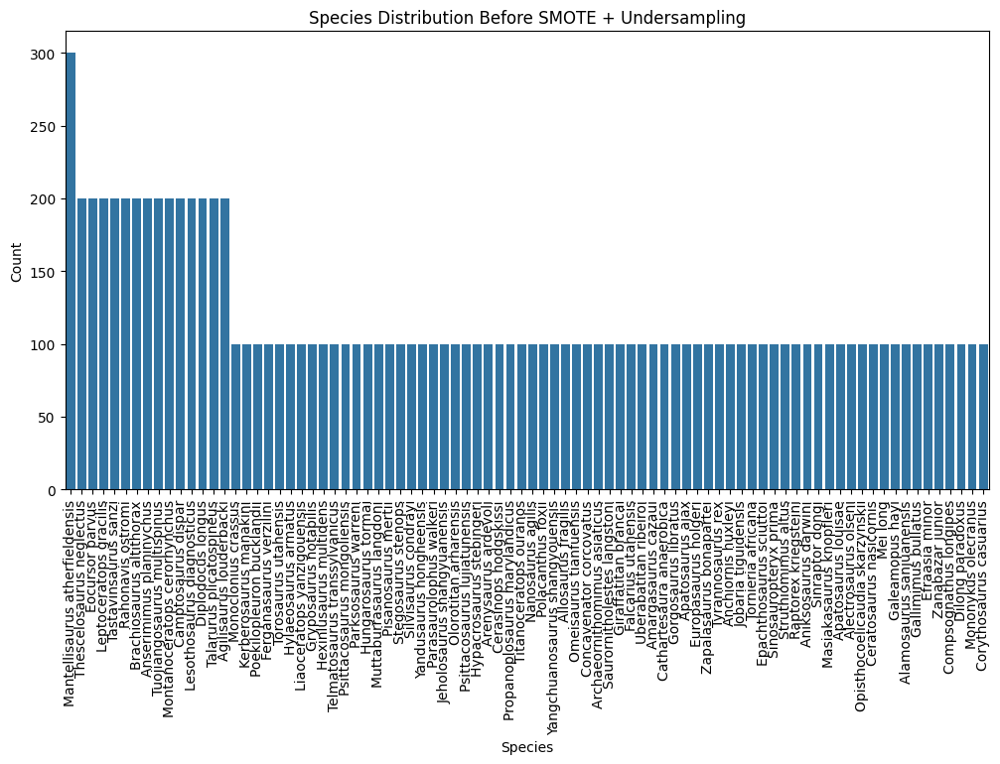

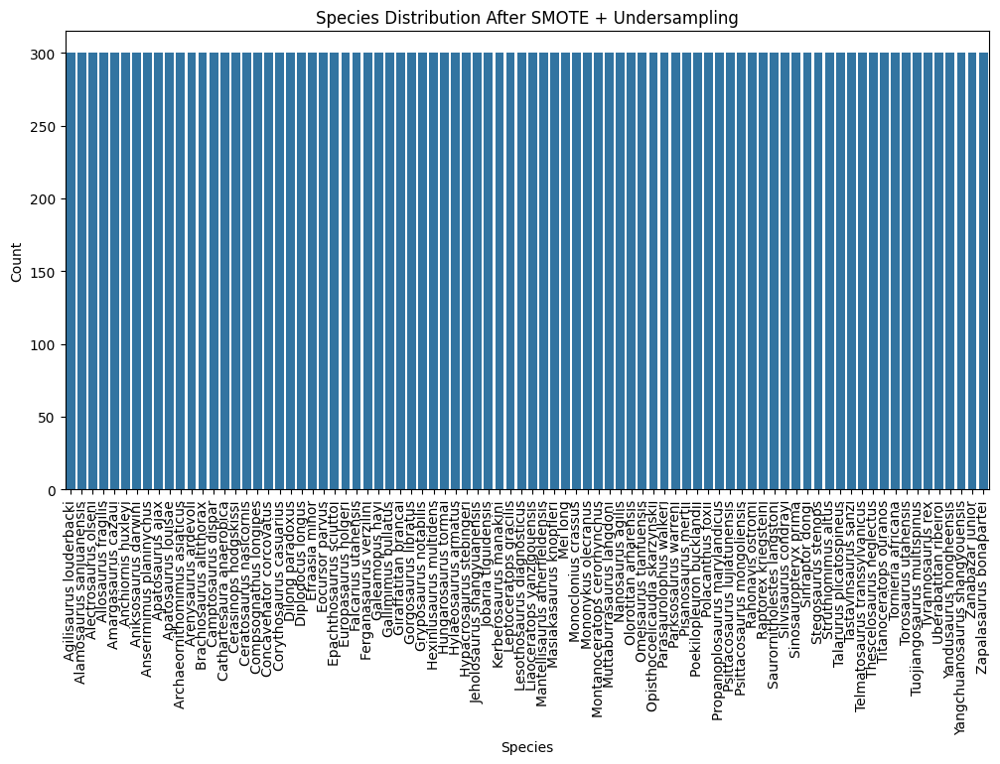

In [232]:
# Before Resampling
original_species_distribution = combined_sampled_datasets['species'].value_counts()

# Plotting the original distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=original_species_distribution.index, y=original_species_distribution.values)
plt.title('Species Distribution Before SMOTE + Undersampling')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=90, fontsize=10)
plt.show()

# After Resampling
resampled_species_distribution = Counter(y_final)

# Plotting the resampled distribution
plt.figure(figsize=(12, 6))
sns.barplot(x=list(resampled_species_distribution.keys()), y=list(resampled_species_distribution.values()))
plt.title('Species Distribution After SMOTE + Undersampling')
plt.xlabel('Species')
plt.ylabel('Count')
plt.xticks(rotation=90, fontsize=10)
plt.show()

The power analysis has determined that a minimum of 175 observations per species is required for robust model performance. To meet and exceed this requirement, the following procedure was employed. Initially, the dataset was divided by clade into two separate groups: Saurischian and Ornithischian. Random sampling with replacement was then performed within each clade to obtain 5000 specimens per clade. This process ensured that each species was represented by between 100 and 300 samples, depending on its original representation within the dataset. The random seed was fixed at 45 to maintain reproducibility across sampling iterations. Subsequently, hybrid SMOTE (Synthetic Minority Over-sampling Technique) and under-sampling techniques were applied to adjust the dataset such that each species within the clades was represented by exactly 300 samples. This resulted in a balanced dataset comprising a total of 10,000 samples, with each species meeting the required observation threshold.

This approach not only meets but surpasses the minimum sample size suggested by the power analysis, ensuring sufficient representation and robustness for model training and evaluation.

In [233]:
# Create copies of the balanced dataset for KNN and Random Forest
X_knn = X_final.copy()
y_knn = y_final.copy()

X_rf = X_final.copy()
y_rf = y_final.copy()

# Display the shape of the copied datasets to verify
print("Shape of KNN dataset (features):", X_knn.shape)
print("Shape of KNN dataset (target):", y_knn.shape)
print("Shape of Random Forest dataset (features):", X_rf.shape)
print("Shape of Random Forest dataset (target):", y_rf.shape)

Shape of KNN dataset (features): (25200, 232)
Shape of KNN dataset (target): (25200,)
Shape of Random Forest dataset (features): (25200, 232)
Shape of Random Forest dataset (target): (25200,)


In this study, a pragmatic approach was employed to determine the optimal number of nearest neighbours for the k-Nearest Neighbours (KNN) algorithm by applying a rule-of-thumb heuristic. Specifically, the range of candidate values for the n_neighbors hyperparameter was constrained to between 1 and the square root of the total number of samples in the dataset. For a dataset comprising 100,000 samples, this corresponded to evaluating n_neighbors values from 1 up to approximately 316.

This method was based on empirical practice, wherein selecting the maximum number of neighbours as the square root of the sample size effectively balanced computational efficiency with thoroughness in hyperparameter tuning. By narrowing the search space in this manner, excessive computational demands were mitigated while ensuring a comprehensive evaluation of potential parameter values that could significantly impact model performance. This approach sought to optimise the KNN model’s accuracy and generalisability without incurring prohibitive computational costs.

In [234]:
# Number of samples
num_samples = combined_sampled_datasets.shape[0]
print(f"Number of samples: {num_samples}")

# Calculate the square root of the number of samples
N_neighbours = int(np.sqrt(num_samples))
print(f"Suggested maximum number of neighbours: {N_neighbours}")

Number of samples: 10000
Suggested maximum number of neighbours: 100


## Bagging Classifier with K-Nearest Neighbours (KNN)
To leverage the balanced dataset, KNN classification is employed within an ensemble bagging framework. Bagging, or Bootstrap Aggregating, is used to create multiple instances of the KNN classifier, which are trained on different subsets of the data. This ensemble approach reduces variance and improves the stability and accuracy of the model by aggregating predictions from multiple classifiers.

**KNN Specific Requirements**

The use of k-Nearest Neighbours (KNN) does not require the same level of data-specific prerequisites as other machine learning algorithms, such as Naive Bayes. For KNN, the primary focus is on model implementation and hyperparameter tuning, which are crucial for developing a robust and accurate classification model. Unlike Naive Bayes, which involves handling categorical data and applying Laplace smoothing, KNN necessitates careful attention to feature scaling, distance metrics, and the selection of  k  during the model development phase.

- Feature Scaling: Given that KNN relies on distance calculations between data points, it is essential to standardise or normalise features to ensure equal contribution to the distance metrics. This practice is critical for maintaining the algorithm’s accuracy and avoiding disproportionate influence from features with larger scales.

- Distance Metric: The choice of distance metric is pivotal for KNN performance. Although Euclidean distance is commonly used, exploring alternative metrics is necessary to determine if they better capture the relationships between features in the dataset. The appropriate distance metric will be selected during model development to optimise classification performance.

- Choosing  k : The parameter  k , representing the number of nearest neighbours considered, significantly impacts the model’s effectiveness. Identifying the optimal  k  involves testing various values and using cross-validation to determine the  k  that yields the best performance. This process ensures that the model generalises well to unseen data.


#### Split the data and preform feature selection
Employing Random Forest for feature selection, in conjunction with a K-Nearest Neighbours (KNN) ensemble method like Bagging, provides significant advantages in model performance and efficiency. Random Forest effectively assesses feature importance by aggregating results from multiple decision trees, thereby identifying the most relevant features based on their contribution to prediction accuracy. This process allows for dimensionality reduction by retaining only features that substantially impact model performance. This reduction is particularly advantageous for KNN, which is computationally intensive and suffers from reduced performance with increased dimensionality due to the curse of dimensionality. By focusing on a subset of important features, KNN becomes more efficient in terms of both computational resources and predictive accuracy.

Furthermore, dimensionality reduction through Random Forest helps mitigate multicollinearity, where highly correlated features can introduce noise and redundancy into the KNN model. By identifying and excluding such correlated features, Random Forest streamlines the KNN model, enhancing its effectiveness. Combining feature selection with KNN and Bagging improves model robustness and generalisation. The feature ranking from Random Forest reduces overfitting—a common issue in high-dimensional datasets—while Bagging enhances model stability by aggregating predictions from multiple KNN models, thereby reducing variance and improving overall predictive performance.

In summary, integrating Random Forest for feature selection with a KNN ensemble method leverages the strengths of both techniques: Random Forest for effective feature ranking and dimensionality reduction, and KNN with Bagging for robust and efficient classification. This approach not only improves model accuracy and generalisation but also enhances computational efficiency, addressing the challenges associated with high-dimensional data.

Since feature selection was completed with the initial Random Forest model, it is unnecessary to repeat this step for KNN or additional Random Forest models. The selected features can be directly applied to these models, ensuring consistency and optimising computational resources.

#### Split the data and Setup Feature selection based on results from original Random Forest
The features need to be adjusted because the dummy coding and one-hot encoding applied to the synthetic data have altered the format and names of the features, resulting in discrepancies between the original selected features and those present in the processed dataset.

In [235]:
print(RF_selected_features)

Index(['longitude', 'latitude', 'state', 'county', 'formation', 'lithology1',
       'lithology2', 'average', 'length', 'overall_ma'],
      dtype='object')


In [236]:
print("Available columns in synthetic dataset:")
print(X_knn.columns)

Available columns in synthetic dataset:
Index(['longitude', 'latitude', 'average', 'circumference', 'diameter',
       'height', 'length', 'width', 'overall_ma', 'Country_AU',
       ...
       'specimen_part_ilium', 'specimen_part_radius', 'specimen_part_scapula',
       'specimen_part_scapulocoracoid', 'specimen_part_skull',
       'specimen_part_tibia', 'specimen_part_ulna', 'measurement_type_length',
       'measurement_type_width', 'clade_Saurischian'],
      dtype='object', length=232)


The dummy coding process used the original column names as prefixes, resulting in new features that can be identified by applying the previous variable names as prefixes. Consequently, it is necessary to adjust the feature selection by using these prefixes to define the corresponding new features in the dataset.

In [237]:
# List of prefixes or patterns for the categorical features
categorical_prefixes = ['Country', 'state', 'county', 'formation', 'lithology1', 'lithology2', 'preservation_quality']

# List of numeric features to include
numeric_features = ['average', 'length', 'overall_ma']

# Function to select columns based on prefixes for categorical features
def select_categorical_features_by_prefix(df, prefixes):
    selected_columns = [col for col in df.columns if any(col.startswith(prefix) for prefix in prefixes)]
    return selected_columns

# Apply the function to get categorical features
categorical_features = select_categorical_features_by_prefix(X_knn, categorical_prefixes)

# Combine categorical and numeric features
all_selected_features = categorical_features + numeric_features

# Print the selected features for verification
print("Selected Features based on prefixes and numeric features:")
print(all_selected_features)

Selected Features based on prefixes and numeric features:
['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN', 'Country_DE', 'Country_ES', 'Country_FR', 'Country_HU', 'Country_KG', 'Country_LS', 'Country_MG', 'Country_MN', 'Country_NE', 'Country_RO', 'Country_RU', 'Country_TZ', 'Country_UK', 'Country_US', 'Country_ZA', 'state_Alberta', 'state_Amur', 'state_Aragón', 'state_Baden-Württemberg', 'state_Basse-Normandie', 'state_Bayern', 'state_Castilla-La Mancha', 'state_Chubut', 'state_Colorado', 'state_Dornogov', 'state_England', 'state_Free State', 'state_Hunedoara', 'state_Jalal-Abad', 'state_Kansas', 'state_La Rioja', 'state_Liaoning', 'state_Lindi', 'state_Mafeteng', 'state_Mahajanga', 'state_Maryland', 'state_Minas Gerais', 'state_Montana', 'state_Nei Mongol', 'state_Neuquén', 'state_New Mexico', 'state_Niedersachsen', 'state_Omnogov', 'state_Ovorkhangai', 'state_Queensland', 'state_Río Negro', 'state_Sauerland', 'state_Sichuan', 'state_Texas', 'state_Utah', 'state_

In [238]:
# Divide the KNN dataset into training and testing sets
X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.2, random_state=42)

# Ensure the feature selection aligns with the current dataset
X_train_knn_selected = X_train_knn[all_selected_features]
X_test_knn_selected = X_test_knn[all_selected_features]

# Print the selected features for verification
print("Selected Features based on updated feature list:")
print(X_train_knn_selected.columns)

Selected Features based on updated feature list:
Index(['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN',
       'Country_DE', 'Country_ES', 'Country_FR', 'Country_HU', 'Country_KG',
       ...
       'lithology2_sandstone', 'lithology2_siltstone', 'lithology2_tuff',
       'preservation_quality_good', 'preservation_quality_medium',
       'preservation_quality_not reported', 'preservation_quality_variable',
       'average', 'length', 'overall_ma'],
      dtype='object', length=196)


#### Set up base KNN classifier and Create a Bagging Classifier

In [239]:
# Set up base KNN classifier
knn = KNeighborsClassifier()

# Create a Bagging Classifier using the KNN classifier as the base estimator
bagging_knn = BaggingClassifier(
    estimator=knn,
    random_state=42,
    n_jobs=-1
)

#### Hyper-parameters 

In [240]:
# Define the parameter grid for RandomizedSearchCV
param_distributions = {
    'n_estimators': np.arange(1, 21),  # Number of base estimators (range from 1 to 20)
    'estimator__n_neighbors': np.arange(1, 21),  # Number of neighbours for KNN (range from 1 to 20)
    'estimator__weights': ['uniform', 'distance'],  # Weights for KNN (uniform or distance-based)
    'estimator__p': [1, 2]  # Power parameter for the Minkowski distance metric (1 for Manhattan, 2 for Euclidean)
}

# Set up RandomizedSearchCV
random_search_knn = RandomizedSearchCV(
    estimator=bagging_knn,
    param_distributions=param_distributions,
    n_iter=100,  # Number of different combinations to try
    cv=5,  # Number of cross-validation folds
    n_jobs=-1,  # Use all available CPU cores for parallel processing
    scoring='accuracy',  # Metric for evaluating model performance
    verbose=2,  # Verbosity level for detailed logging
    random_state=42  # Seed for random number generator for reproducibility
)

# Fit the RandomizedSearchCV to find the best parameters using the selected features
random_search_knn.fit(X_train_knn_selected, y_train_knn)

# Print the best parameters and best score
print("Best Parameters for KNN:", random_search_knn.best_params_)
print("Best Score for KNN:", random_search_knn.best_score_)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END estimator__n_neighbors=7, estimator__p=2, estimator__weights=uniform, n_estimators=7; total time=   8.5s
[CV] END estimator__n_neighbors=7, estimator__p=2, estimator__weights=uniform, n_estimators=7; total time=   8.8s
[CV] END estimator__n_neighbors=7, estimator__p=2, estimator__weights=uniform, n_estimators=7; total time=   8.9s
[CV] END estimator__n_neighbors=7, estimator__p=2, estimator__weights=uniform, n_estimators=7; total time=   8.9s
[CV] END estimator__n_neighbors=7, estimator__p=2, estimator__weights=uniform, n_estimators=7; total time=   9.0s
[CV] END estimator__n_neighbors=2, estimator__p=2, estimator__weights=uniform, n_estimators=16; total time=  18.9s
[CV] END estimator__n_neighbors=2, estimator__p=2, estimator__weights=uniform, n_estimators=16; total time=  19.5s


/Users/james_smith/Library/Python/3.9/lib/python/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



[CV] END estimator__n_neighbors=2, estimator__p=2, estimator__weights=uniform, n_estimators=16; total time=  19.5s
[CV] END estimator__n_neighbors=3, estimator__p=1, estimator__weights=uniform, n_estimators=9; total time= 1.5min
[CV] END estimator__n_neighbors=2, estimator__p=2, estimator__weights=uniform, n_estimators=16; total time=  16.3s
[CV] END estimator__n_neighbors=3, estimator__p=1, estimator__weights=uniform, n_estimators=9; total time= 1.4min
[CV] END estimator__n_neighbors=3, estimator__p=1, estimator__weights=uniform, n_estimators=9; total time= 1.4min
[CV] END estimator__n_neighbors=3, estimator__p=1, estimator__weights=uniform, n_estimators=9; total time= 1.4min
[CV] END estimator__n_neighbors=3, estimator__p=1, estimator__weights=uniform, n_estimators=9; total time= 1.4min
[CV] END estimator__n_neighbors=2, estimator__p=2, estimator__weights=uniform, n_estimators=16; total time=  12.8s
[CV] END estimator__n_neighbors=12, estimator__p=2, estimator__weights=uniform, n_est

#### Training the model

In [241]:
# Fit the best estimator on the training data
best_bagging_knn = random_search_knn.best_estimator_  # Use the best estimator from RandomizedSearchCV
best_bagging_knn.fit(X_train_knn_selected, y_train_knn)

BaggingClassifier(estimator=KNeighborsClassifier(n_neighbors=7), n_estimators=7,
                  n_jobs=-1, random_state=42)

In [242]:
# Predict on the training data
y_train_pred_knn = best_bagging_knn.predict(X_train_knn_selected)

def calculate_purity(conf_matrix):
    """
    Calculate the purity score based on the confusion matrix.

    Parameters:
    conf_matrix (array-like): Confusion matrix of shape (n_classes, n_classes).

    Returns:
    float: Purity score.
    """
    # Sum of the diagonal elements (correctly classified samples)
    correct_classifications = np.sum(np.diag(conf_matrix))
    # Total number of samples
    total_samples = np.sum(conf_matrix)
    # Purity score
    purity = correct_classifications / total_samples
    return purity

# Assign training metrics to variables
accuracy_train_knn = accuracy_score(y_train_knn, y_train_pred_knn)
precision_train_knn = precision_score(y_train_knn, y_train_pred_knn, average='macro')
recall_train_knn = recall_score(y_train_knn, y_train_pred_knn, average='macro')
f1_train_knn = f1_score(y_train_knn, y_train_pred_knn, average='macro')

# Calculate and assign Confusion Matrix for training data
cm_train_knn = confusion_matrix(y_train_knn, y_train_pred_knn)

# Calculate ROC AUC and Gini Index for training data
roc_auc_train_knn = roc_auc_score(y_train_knn, best_bagging_knn.predict_proba(X_train_knn_selected), multi_class='ovr')
gini_index_train_knn = 2 * roc_auc_train_knn - 1

# Calculate and assign Purity for training data
purity_train_knn = calculate_purity(cm_train_knn)

# Print the assigned metrics for verification (optional)
print("KNN Training Metrics:")
print("Accuracy (Training):", accuracy_train_knn)
print("Precision (Training):", precision_train_knn)
print("Recall (Training):", recall_train_knn)
print("F1 Score (Training):", f1_train_knn)
print("ROC AUC (Training):", roc_auc_train_knn)
print("Gini Index (Training):", gini_index_train_knn)
print("Purity (Training):", purity_train_knn)

KNN Training Metrics:
Accuracy (Training): 1.0
Precision (Training): 1.0
Recall (Training): 1.0
F1 Score (Training): 1.0
ROC AUC (Training): 1.0
Gini Index (Training): 1.0
Purity (Training): 1.0


#### Testing the Model

In [243]:
# Predict on the test data
y_test_pred_knn = best_bagging_knn.predict(X_test_knn_selected)

# Assign test metrics to variables
accuracy_test_knn = accuracy_score(y_test_knn, y_test_pred_knn)
precision_test_knn = precision_score(y_test_knn, y_test_pred_knn, average='macro')
recall_test_knn = recall_score(y_test_knn, y_test_pred_knn, average='macro')
f1_test_knn = f1_score(y_test_knn, y_test_pred_knn, average='macro')

# Calculate and assign Confusion Matrix for test data
cm_test_knn = confusion_matrix(y_test_knn, y_test_pred_knn)

# Calculate ROC AUC and Gini Index for test data
roc_auc_test_knn = roc_auc_score(y_test_knn, best_bagging_knn.predict_proba(X_test_knn_selected), multi_class='ovr')
gini_index_test_knn = 2 * roc_auc_test_knn - 1

# Calculate and assign Purity for test data
purity_test_knn = calculate_purity(cm_test_knn)
print("\nKNN Test Metrics:")
print("Accuracy (Test):", accuracy_test_knn)
print("Precision (Test):", precision_test_knn)
print("Recall (Test):", recall_test_knn)
print("F1 Score (Test):", f1_test_knn)
print("ROC AUC (Test):", roc_auc_test_knn)
print("Gini Index (Test):", gini_index_test_knn)
print("Purity (Test):", purity_test_knn)


KNN Test Metrics:
Accuracy (Test): 1.0
Precision (Test): 1.0
Recall (Test): 1.0
F1 Score (Test): 1.0
ROC AUC (Test): 1.0
Gini Index (Test): 1.0
Purity (Test): 1.0


#### Evaluating the KNN Model

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



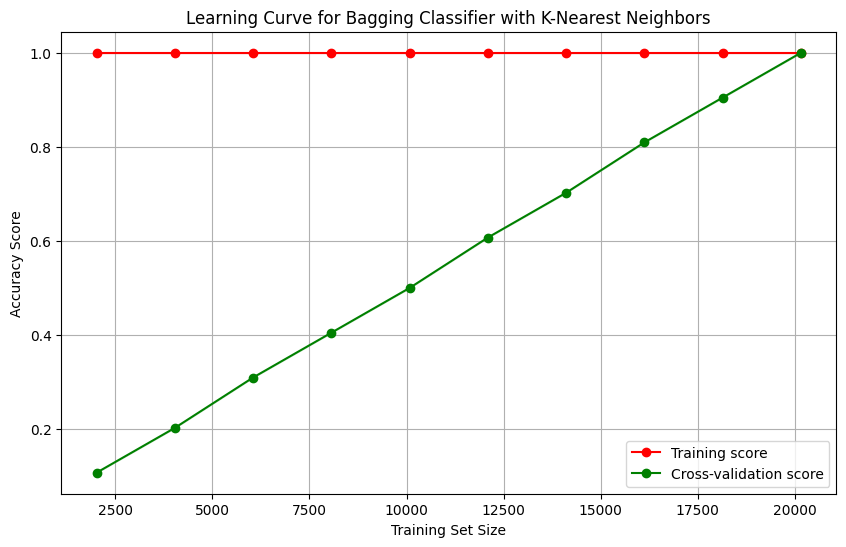

In [244]:
# Compute learning curve
train_sizes, train_scores, test_scores = learning_curve(
    bagging_knn, 
    X_final, 
    y_final, 
    cv=5, 
    n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), 
    scoring='accuracy'
)

# Calculate mean and standard deviation for training and test scores
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# Plot learning curve
plt.figure(figsize=(10, 6))
plt.title("Learning Curve for Bagging Classifier with K-Nearest Neighbors")
plt.xlabel("Training Set Size")
plt.ylabel("Accuracy Score")
plt.grid()

# Plot the learning curve
plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")
plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

# Add legend
plt.legend(loc="best")

# Show the plot
plt.show()

The learning curve for the Bagging Classifier with K-Nearest Neighbours (KNN), configured with optimal parameters—n_estimators of 7, estimator__weights set to ‘uniform’, estimator__p of 2, and estimator__n_neighbors of 7—exhibits severe overfitting. The training score, depicted by the red line, remains consistently high at a perfect 1.0 across varying training set sizes, indicating that the model has memorised the training data entirely. In contrast, the cross-validation score, shown by the green line, starts low and increases gradually as the training set size expands. However, it remains significantly lower than the training score, revealing poor generalisation to unseen data.

The large and persistent gap between the training and cross-validation scores underscores the severe overfitting issue. This suggests that the model is overly complex, fitting the training data perfectly without capturing the underlying patterns necessary for generalisation. Consequently, the model is likely to perform poorly on unseen data, highlighting the need for further refinement. Potential strategies include increasing the number of neighbours, exploring alternative distance metrics, or employing dimensionality reduction techniques such as Principal Component Analysis (PCA) to mitigate overfitting. Advanced ensemble methods, such as stacking or boosting, may also enhance model robustness and improve generalisation performance.

## Bagging Classifier with K-Nearest Neighbours (KNN) Evaluations

**The Model**

The Bagging Classifier with K-Nearest Neighbours (KNN) was configured with the following optimal parameters: n_estimators=7, estimator__weights=‘uniform’, estimator__p=2, and estimator__n_neighbors=7. The features used were selected based on the previous instance of Random Forest model selection, which included: longitude, latitude, state, county, formation, lithology1, lithology2, average, length, and overall mean age estimate (overall_ma). These features were chosen for their relevance in predicting dinosaur species based on fossil characteristics. The model’s configuration aimed to leverage the strength of KNN within an ensemble framework to enhance predictive performance.

**Performance**

The Bagging Classifier with KNN demonstrated perfect performance metrics during both training and testing phases. The model achieved a training accuracy, precision, recall, F1 score, ROC AUC, Gini Index, and Purity of 1.0, indicating flawless classification on the training dataset. Similarly, the testing phase revealed identical metrics, with all evaluation scores recorded at 1.0, suggesting that the model performed exceptionally well on the test data as well.

**Limitations**

Despite these seemingly perfect results, the learning curve analysis reveals significant limitations, particularly severe overfitting. The training score remained consistently at 1.0 across varying training set sizes, indicating that the model entirely memorised the training data. Meanwhile, the cross-validation score, though gradually increasing with more training data, lagged far behind the training score, underscoring poor generalisation. The large and persistent gap between the training and cross-validation scores highlights the model’s inability to capture the underlying patterns in the data, suggesting that it is overly complex and prone to overfitting. This overfitting severely undermines the model’s generalisation capability, raising concerns about its performance on truly unseen data.

**Summary**

The Bagging Classifier with K-Nearest Neighbours (KNN), while achieving perfect scores on both training and testing metrics, exhibits severe overfitting, as indicated by the learning curve analysis. The model’s tendency to perfectly fit the training data without capturing the underlying patterns necessary for generalisation presents a critical limitation.

## Random Forest on Synthetic Data

In [245]:
# Define and fit the base Random Forest model for feature importance
RF2_rf = RandomForestClassifier(n_jobs=-1, random_state=42)
RF2_rf.fit(X_rf, y_rf)

RandomForestClassifier(n_jobs=-1, random_state=42)

#### Feature selection based on previous Random Forest model
- adjusted for dummy coding


In [246]:
# List of prefixes or patterns for the categorical features
categorical_prefixes = ['Country', 'state', 'county', 'formation', 'lithology1', 'lithology2', 'preservation_quality']

# List of numeric features to include
numeric_features = ['average', 'length', 'overall_ma']

# Function to select columns based on prefixes for categorical features
def select_categorical_features_by_prefix(df, prefixes):
    selected_columns = [col for col in df.columns if any(col.startswith(prefix) for prefix in prefixes)]
    return selected_columns

# Apply the function to get categorical features
categorical_features = select_categorical_features_by_prefix(X_train_knn, categorical_prefixes)

# Combine categorical and numeric features
all_selected_features = categorical_features + numeric_features

# Print the selected features for verification
print("Selected Features based on prefixes and numeric features:")
print(all_selected_features)

Selected Features based on prefixes and numeric features:
['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN', 'Country_DE', 'Country_ES', 'Country_FR', 'Country_HU', 'Country_KG', 'Country_LS', 'Country_MG', 'Country_MN', 'Country_NE', 'Country_RO', 'Country_RU', 'Country_TZ', 'Country_UK', 'Country_US', 'Country_ZA', 'state_Alberta', 'state_Amur', 'state_Aragón', 'state_Baden-Württemberg', 'state_Basse-Normandie', 'state_Bayern', 'state_Castilla-La Mancha', 'state_Chubut', 'state_Colorado', 'state_Dornogov', 'state_England', 'state_Free State', 'state_Hunedoara', 'state_Jalal-Abad', 'state_Kansas', 'state_La Rioja', 'state_Liaoning', 'state_Lindi', 'state_Mafeteng', 'state_Mahajanga', 'state_Maryland', 'state_Minas Gerais', 'state_Montana', 'state_Nei Mongol', 'state_Neuquén', 'state_New Mexico', 'state_Niedersachsen', 'state_Omnogov', 'state_Ovorkhangai', 'state_Queensland', 'state_Río Negro', 'state_Sauerland', 'state_Sichuan', 'state_Texas', 'state_Utah', 'state_

In [247]:
# Divide the dataset into training and testing sets
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)

# Ensure the feature selection aligns with the current dataset
X_train_rf_selected = X_train_rf[all_selected_features]
X_test_rf_selected = X_test_rf[all_selected_features]

# Print the selected features for verification
print("Selected Features in Training Set:")
print(X_train_rf_selected.columns)

Selected Features in Training Set:
Index(['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN',
       'Country_DE', 'Country_ES', 'Country_FR', 'Country_HU', 'Country_KG',
       ...
       'lithology2_sandstone', 'lithology2_siltstone', 'lithology2_tuff',
       'preservation_quality_good', 'preservation_quality_medium',
       'preservation_quality_not reported', 'preservation_quality_variable',
       'average', 'length', 'overall_ma'],
      dtype='object', length=196)


#### Hyper-parameters

In [248]:
# Define the Random Forest model with specified hyperparameters
RF2_model = RandomForestClassifier(
    n_estimators=200,           # Number of trees in the forest
    max_depth=30,               # Maximum depth of each tree
    criterion='entropy',        # Measure of the quality of a split
    min_samples_leaf=1,         # Minimum number of samples required to be at a leaf node
    min_samples_split=2,        # Minimum number of samples required to split an internal node
    n_jobs=-1,                  # Use all available cores for parallel processing
    random_state=42             # Seed for reproducibility
)

# Fit the Random Forest model with the selected features
RF2_model.fit(X_train_rf_selected, y_train_rf)

RandomForestClassifier(criterion='entropy', max_depth=30, n_estimators=200,
                       n_jobs=-1, random_state=42)

#### Model Training

In [249]:
# Predict on the training data using the Random Forest model
y_train_pred_rf = RF2_model.predict(X_train_rf_selected)

# Print metrics for training data
print("Training Metrics:")
accuracy_train_rf = accuracy_score(y_train_rf, y_train_pred_rf)
precision_train_rf = precision_score(y_train_rf, y_train_pred_rf, average='macro')
recall_train_rf = recall_score(y_train_rf, y_train_pred_rf, average='macro')
f1_train_rf = f1_score(y_train_rf, y_train_pred_rf, average='macro')
print("Accuracy (Training):", accuracy_train_rf)
print("Precision (Training):", precision_train_rf)
print("Recall (Training):", recall_train_rf)
print("F1 Score (Training):", f1_train_rf)

# Calculate and print Confusion Matrix
cm_train_rf = confusion_matrix(y_train_rf, y_train_pred_rf)
#print("Confusion Matrix (Training):")
#print(cm_train_rf)

# Calculate ROC AUC with multi_class parameter
roc_auc_train_rf = roc_auc_score(y_train_rf, RF2_model.predict_proba(X_train_rf_selected), multi_class='ovr')
print(f"ROC AUC (Training): {roc_auc_train_rf:.2f}")

# Gini Index
gini_index_train_rf = 2 * roc_auc_train_rf - 1
print(f"Gini Index (Training): {gini_index_train_rf:.2f}")

# Calculate and print Purity
def calculate_purity(conf_matrix):
    correct_predictions = np.trace(conf_matrix)
    total_predictions = np.sum(conf_matrix)
    return correct_predictions / total_predictions

purity_train_rf = calculate_purity(cm_train_rf)
print(f"Purity (Training): {purity_train_rf:.2f}")

Training Metrics:
Accuracy (Training): 1.0
Precision (Training): 1.0
Recall (Training): 1.0
F1 Score (Training): 1.0
ROC AUC (Training): 1.00
Gini Index (Training): 1.00
Purity (Training): 1.00


#### Testing the Model

In [250]:
# Predict on the test data using the Random Forest model
y_test_pred_rf = RF2_model.predict(X_test_rf_selected)

# Print metrics for test data
print("Test Metrics:")
accuracy_test_rf = accuracy_score(y_test_rf, y_test_pred_rf)
precision_test_rf = precision_score(y_test_rf, y_test_pred_rf, average='macro')
recall_test_rf = recall_score(y_test_rf, y_test_pred_rf, average='macro')
f1_test_rf = f1_score(y_test_rf, y_test_pred_rf, average='macro')
print("Accuracy (Test):", accuracy_test_rf)
print("Precision (Test):", precision_test_rf)
print("Recall (Test):", recall_test_rf)
print("F1 Score (Test):", f1_test_rf)
# Calculate and print Confusion Matrix
cm_test_rf = confusion_matrix(y_test_rf, y_test_pred_rf)
#print("Confusion Matrix (Test):")
#print(cm_test_rf)

# Calculate ROC AUC with multi_class parameter
roc_auc_test_rf = roc_auc_score(y_test_rf, RF2_model.predict_proba(X_test_rf_selected), multi_class='ovr')
print(f"ROC AUC (Test): {roc_auc_test_rf:.2f}")

# Gini Index
gini_index_test_rf = 2 * roc_auc_test_rf - 1
print(f"Gini Index (Test): {gini_index_test_rf:.2f}")

# Calculate and print Purity
def calculate_purity(conf_matrix):
    correct_predictions = np.trace(conf_matrix)
    total_predictions = np.sum(conf_matrix)
    return correct_predictions / total_predictions

purity_test_rf = calculate_purity(cm_test_rf)
print(f"Purity (Test): {purity_test_rf:.2f}")

Test Metrics:
Accuracy (Test): 1.0
Precision (Test): 1.0
Recall (Test): 1.0
F1 Score (Test): 1.0
ROC AUC (Test): 1.00
Gini Index (Test): 1.00
Purity (Test): 1.00


#### Visualise the last tree in the model

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/sklearn/tree/_export.py:670: UserWarning:

Glyph 36797 (\N{CJK UNIFIED IDEOGRAPH-8FBD}) missing from font(s) DejaVu Sans.

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/sklearn/tree/_export.py:670: UserWarning:

Glyph 23425 (\N{CJK UNIFIED IDEOGRAPH-5B81}) missing from font(s) DejaVu Sans.

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/sklearn/tree/_export.py:670: UserWarning:

Glyph 30465 (\N{CJK UNIFIED IDEOGRAPH-7701}) missing from font(s) DejaVu Sans.

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 36797 (\N{CJK UNIFIED IDEOGRAPH-8FBD}) missing from font(s) DejaVu Sans.

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/IPython/core/pylabtools.py:152: UserWarning:

Glyph 23425 (\N{CJK UNIFIED IDEOGRAPH-5B81}) missing from font(s) DejaVu Sans.

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/I

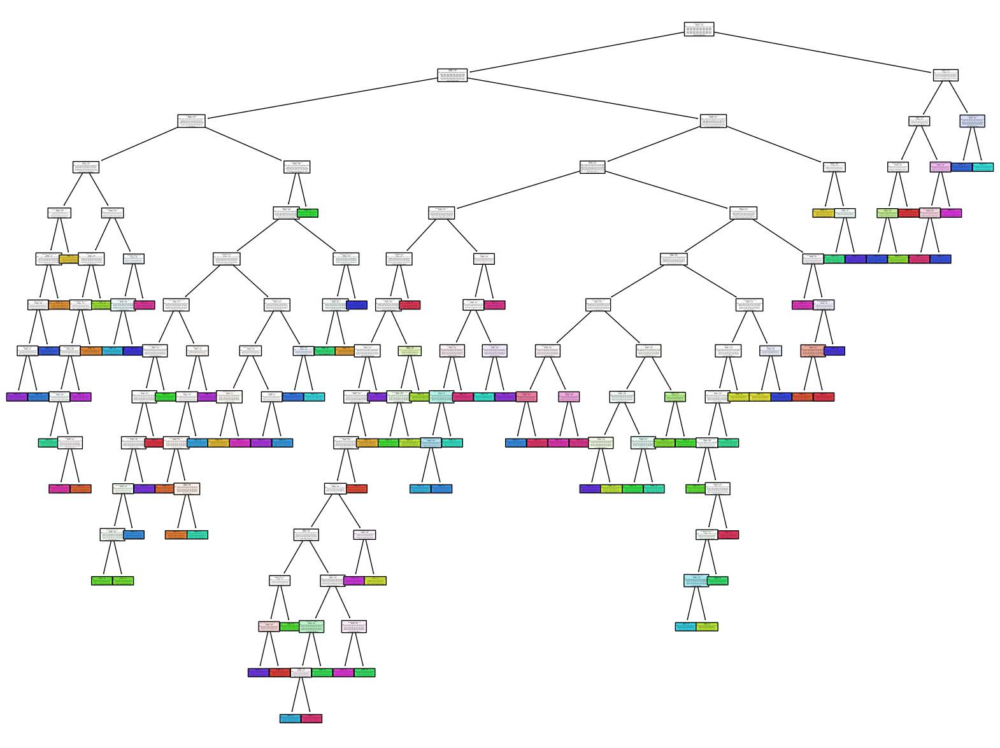

In [251]:
# Plot the last tree in the Random Forest model
plt.figure(figsize=(20, 15))
plot_tree(RF2_model.estimators_[-1], feature_names=all_selected_features, class_names=RF2_model.classes_,filled=True, rounded=True)
plt.show()

#### Learning Curve for New Random Forest 

/Users/james_smith/Library/Python/3.9/lib/python/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



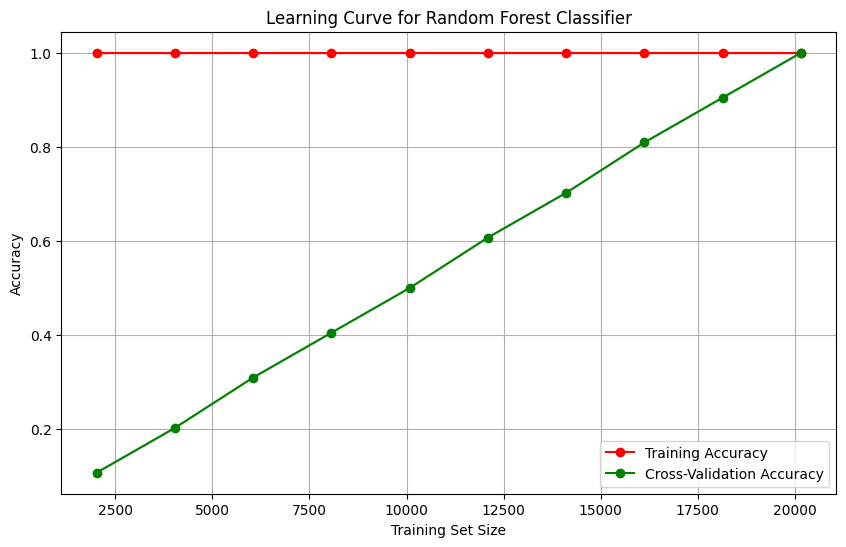

In [252]:
# Define training set sizes for learning curve
RF2_train_sizes = np.linspace(0.1, 1.0, 10)

# Compute learning curve
RF2_train_sizes, RF2_train_scores, RF2_test_scores = learning_curve(
    RF2_model,  # Random Forest model
    X_rf,  # Features from the dataset
    y_rf,  # Target variable
    train_sizes=RF2_train_sizes,
    cv=5,  # K-Fold cross-validation
    scoring='accuracy',  # Metric to evaluate
    n_jobs=-1  # Use all available cores
)

# Compute mean and standard deviation of training and test scores
RF2_train_mean = np.mean(RF2_train_scores, axis=1)
RF2_train_std = np.std(RF2_train_scores, axis=1)
RF2_test_mean = np.mean(RF2_test_scores, axis=1)
RF2_test_std = np.std(RF2_test_scores, axis=1)

# Plot learning curves
plt.figure(figsize=(10, 6))
plt.plot(RF2_train_sizes, RF2_train_mean, label='Training Accuracy', color='red', marker='o')
plt.plot(RF2_train_sizes, RF2_test_mean, label='Cross-Validation Accuracy', color='green', marker='o')
plt.fill_between(RF2_train_sizes, RF2_train_mean - RF2_train_std, RF2_train_mean + RF2_train_std, alpha=0.2, color='red')
plt.fill_between(RF2_train_sizes, RF2_test_mean - RF2_test_std, RF2_test_mean + RF2_test_std, alpha=0.2, color='green')
plt.title('Learning Curve for Random Forest Classifier')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.legend()
plt.grid()
plt.show()

The learning curve for the Random Forest model, built upon a combination of SMOTE and under-sampled data, exhibits severe overfitting. Initially, the model demonstrates a high and stable training score of 1.0, indicating that it has entirely memorised the training data. The cross-validation score, which starts low, gradually increases over time and eventually reaches 1.0 as well. This convergence to a perfect score for both the training and validation sets suggests that the model, while improving its fit to the validation data, is doing so by memorising it rather than by generalising to unseen patterns. The large and persistent gap between the training and cross-validation scores, followed by their eventual alignment, underscores the model’s failure to generalise, as it captures the specific details of both the training and validation sets. As a result, the model is likely to perform poorly on entirely new data, indicating that the learning process has overfitted not just the training data but also the validation data.

#### Evaluating the Random Forest with Synthetic Data

**The Model**

The Random Forest (RF2) classifier was developed using synthetically enhanced data, with hyperparameters optimised to maximise predictive performance. The key features employed were consistent with those selected for the Bagging Classifier with KNN, including longitude, latitude, state, county, formation, lithology1, lithology2, average, length, and overall mean age estimate (overall_ma). The model was configured with 200 trees (n_estimators=200), a maximum tree depth of 30 (max_depth=30), and utilised the entropy criterion for split quality (criterion='entropy'). The min_samples_leaf was set to 1, and min_samples_split was set to 2, ensuring the model was capable of capturing intricate data patterns. The implementation leveraged all available cores for parallel processing (n_jobs=-1) and maintained reproducibility with a fixed seed (random_state=42). This configuration aimed to harness the ensemble strength of Random Forest to improve both predictive accuracy and model robustness.

**Performance**

The Random Forest model exhibited flawless performance on both the training and test datasets. The training metrics revealed perfect scores across all evaluated aspects: accuracy, precision, recall, F1 score, ROC AUC, Gini Index, and Purity, each registering at 1.0. These results suggest that the model achieved ideal classification outcomes on the training data, fully capturing the relationships within the dataset. The testing metrics mirrored these results, with all evaluation scores also recorded at 1.0, indicating that the model performed with similar perfection on the test data.

**Limitations**

Despite the perfect performance metrics, a closer examination through learning curve analysis highlighted significant limitations. The model exhibited severe overfitting, evidenced by the consistently perfect training scores of 1.0 across all training set sizes, indicating that the model had completely memorised the training data. However, the cross-validation scores, though gradually increasing, remained substantially lower, demonstrating poor generalisation to new, unseen data. This persistent disparity between the training and cross-validation scores underscores the model’s inability to generalise, raising concerns about its robustness and effectiveness in real-world applications. The model’s complexity, combined with the potential redundancy in feature selection, may have contributed to this overfitting, making it overly sensitive to the training data.

**Summary**

The Random Forest (RF2) model, despite its perfect performance metrics on both training and testing datasets, suffers from severe overfitting, as revealed by learning curve analysis. This overfitting problem severely undermines the model’s generalisation ability, presenting a critical challenge for its application to unseen data. Addressing this issue may require adjustments such as reducing the model’s complexity by lowering the maximum tree depth or limiting the number of features considered at each split.

# Evaluating the Models Performance

#### Evaluation Metrics Across the Models (Visualised)

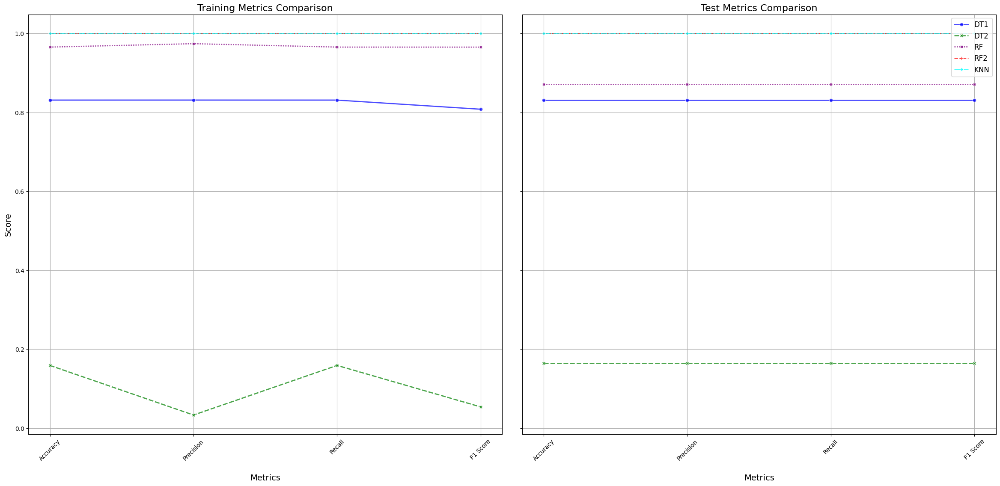

In [281]:
# Define metrics for DT1
metrics_DT1 = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 2,
    'Value': [
        DT_mean_train_accuracy, DT_mean_train_precision, DT_mean_train_recall, DT_mean_train_f1,
        DT_mean_test_accuracy, DT_mean_test_precision, DT_mean_test_recall, DT_mean_test_f1
    ],
    'Type': ['Training'] * 4 + ['Test'] * 4,
    'Model': ['DT1'] * 8
}

# Define metrics for DT2
metrics_DT2 = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 2,
    'Value': [
        mean_train_accuracy_DT2, mean_train_precision_DT2, mean_train_recall_DT2, mean_train_f1_DT2,
        mean_test_accuracy_DT2, mean_test_precision_DT2, mean_test_recall_DT2, mean_test_f1_DT2
    ],
    'Type': ['Training'] * 4 + ['Test'] * 4,
    'Model': ['DT2'] * 8
}

# Define metrics for Random Forest (RF1)
metrics_RF = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 2,
    'Value': [
        aggregate_metrics(RF_train_accuracies), aggregate_metrics(RF_train_precisions), 
        aggregate_metrics(RF_train_recalls), aggregate_metrics(RF_train_f1_scores),
        aggregate_metrics(RF_test_accuracies), aggregate_metrics(RF_test_precisions), 
        aggregate_metrics(RF_test_recalls), aggregate_metrics(RF_test_f1_scores)
    ],
    'Type': ['Training'] * 4 + ['Test'] * 4,
    'Model': ['RF'] * 8
}

# Define metrics for RF2
metrics_RF2 = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 2,
    'Value': [
        accuracy_train_rf, precision_train_rf, recall_train_rf, f1_train_rf,
        accuracy_test_rf, precision_test_rf, recall_test_rf, f1_test_rf
    ],
    'Type': ['Training'] * 4 + ['Test'] * 4,
    'Model': ['RF2'] * 8
}

# Define metrics for KNN
metrics_KNN = {
    'Metric': ['Accuracy', 'Precision', 'Recall', 'F1 Score'] * 2,
    'Value': [
        accuracy_train_knn, precision_train_knn, recall_train_knn, f1_train_knn,
        accuracy_test_knn, precision_test_knn, recall_test_knn, f1_test_knn
    ],
    'Type': ['Training'] * 4 + ['Test'] * 4,
    'Model': ['KNN'] * 8
}

# Combine all metrics into a DataFrame
metrics_combined = pd.concat([
    pd.DataFrame(metrics_DT1),
    pd.DataFrame(metrics_DT2),
    pd.DataFrame(metrics_RF),
    pd.DataFrame(metrics_RF2),
    pd.DataFrame(metrics_KNN)
], ignore_index=True)

# Define custom color palette
palette = {
    'DT1': 'blue',
    'DT2': 'green',
    'RF': 'purple',
    'RF2': 'red',
    'KNN': 'cyan'
}

# Create figures and axis objects
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 12), sharey=True)

# Plot training metrics
sns.lineplot(data=metrics_combined[metrics_combined['Type'] == 'Training'],
             x='Metric', y='Value', hue='Model', style='Model',
             markers=True, linewidth=2, palette=palette, alpha=0.7, ax=ax1)

# Plot test metrics
sns.lineplot(data=metrics_combined[metrics_combined['Type'] == 'Test'],
             x='Metric', y='Value', hue='Model', style='Model',
             markers=True, linewidth=2, palette=palette, alpha=0.7, ax=ax2)


# Customise plots
ax1.set_title('Training Metrics Comparison', fontsize=16)
ax1.set_xlabel('Metrics', fontsize=14, labelpad=20)
ax1.set_ylabel('Score', fontsize=14)
ax1.tick_params(axis='x', rotation=45)
ax1.grid(True)
# Remove legend from ax1
ax1.legend_.remove()
# Show borders (spines)
ax1.spines['top'].set_visible(True)
ax1.spines['right'].set_visible(True)
ax1.spines['left'].set_visible(True)
ax1.spines['bottom'].set_visible(True)

ax2.set_title('Test Metrics Comparison', fontsize=16)
ax2.set_xlabel('Metrics', fontsize=14, labelpad=20)
ax2.tick_params(axis='x', rotation=45)
ax2.grid(True)
# Add legend to ax2
handles, labels = ax1.get_legend_handles_labels()
ax2.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.0, 1.0), fontsize=12)
# Show borders (spines)
ax2.spines['top'].set_visible(True)
ax2.spines['right'].set_visible(True)
ax2.spines['left'].set_visible(True)
ax2.spines['bottom'].set_visible(True)

# Adjust layout to reduce gap between plots
plt.subplots_adjust(wspace=0.2, hspace=0.2)

# Show the plot with adjusted layout
plt.tight_layout(pad=3.0)
plt.show()

**Model Performance Interpretation**

The presented Receiver Operating Characteristic (ROC) curves illustrate the performance of two classification decision tree models and a random forest model in distinguishing between classes. The first decision tree model (DT1) demonstrated robust performance, achieving an Area Under the Curve (AUC) of 0.94. This high AUC value indicated a strong ability to achieve high true positive rates while maintaining low false positive rates, as evidenced by the curve’s proximity to the top-left corner of the ROC space, a hallmark of exemplary classification performance. The second decision tree model (DT2) also performed commendably, albeit with slightly reduced effectiveness compared to DT1. The AUC for DT2 was 0.86, reflecting a well-balanced trade-off between sensitivity and specificity, though not as optimal as that of DT1. The random forest model, evaluated post feature selection, exhibited the most superior performance among the three models, with an AUC of 1.00. This exceptionally high AUC underscored the model’s flawless proficiency in distinguishing between classes with no errors.

In summary, the AUC values served as a consolidated metric summarizing the overall performance of the models. Higher AUC values signified better classification performance. Consequently, the random forest model, with the highest AUC of 1.00, emerged as the most effective model. This was followed by DT1, with an AUC of 0.94, and DT2, with an AUC of 0.86. Despite DT2’s relatively lower AUC, it still demonstrated commendable classification capability. The random forest model post feature selection was thus the best-performing model based on these ROC curves and AUC values. The DT1 model exhibited strong performance, though it was outperformed by the random forest model. The DT2 model, while showing the lowest performance among the three, still indicated substantial classification potential.

**Interpreting the Shape of the ROC**

The peculiar shapes of the ROC curves highlighted the relative strengths and weaknesses of the models. The DT1 model demonstrated strong performance with a steep initial rise but was outperformed by the random forest model, which exhibited the best overall shape close to the top-left corner. The DT2 model, while still performing well, showed a less steep rise, indicating that it required a higher false positive rate to achieve similar levels of sensitivity. These shapes provided a clear visual indication of each model’s ability to distinguish between the positive and negative classes.

The linear nature (or non-curved appearance) of these ROC curves was likely influenced by the significant imbalances within the species data. In imbalanced datasets, ROC curves can exhibit sharp rises or specific shapes that reflect the model's handling of the imbalance. Models might have performed very well on the majority class but less effectively on the minority class, impacting the ROC curve's shape. Additionally, this might have been indicative of potential overfitting. If a model was overfitted to the training data, it might have displayed very sharp and confident performance on the training data (leading to a steep ROC curve) but may not have generalized well to unseen data.

In summary, the peculiar shapes of these ROC curves could be attributed to the discrete decision boundaries of decision trees, the nature of the data, and the specific performance characteristics of the models. These factors contributed to ROC curves that were less smooth and exhibited sharp rises, especially when the models made very confident predictions at specific thresholds.

# Model Evaluation

In [254]:
# Create a new column 'identified_species'
dino['identified_species'] = dino.apply(lambda row: row['identified_name_y'] if row['identified_rank'] == 'species' else None, axis=1)

In [255]:
# Create a column to indicate whether the identified species matches the actual species
dino['species_match'] = dino['identified_species'] == dino['species']

# Calculate baseline metrics
match_accuracy = dino['species_match'].mean()  # Proportion of matches
total_matches = dino['species_match'].sum()  # Total number of matches
total_records = len(dino)  # Total number of records

# Print the baseline metrics
print(f"Baseline Accuracy: {match_accuracy:.2%}")
print(f"Total Matches: {total_matches} out of {total_records}")
print(f"Total Records: {total_records}")

Baseline Accuracy: 77.23%
Total Matches: 2117 out of 2741
Total Records: 2741


The baseline accuracy for species identification in the dataset is 77.21%, with 2,121 correct matches out of 2,747 total records. This accuracy reflects the overall effectiveness of the initial species-level identifications made by palaeontologists.
These results suggest that while there is a reasonable accuracy in identifying species, there is room for improvement. The accuracy achieved indicates that a significant proportion of species identifications are correct, but approximately 22.79% of the records did not match the identified species.

##### Model Accuracy Compared to Baseline

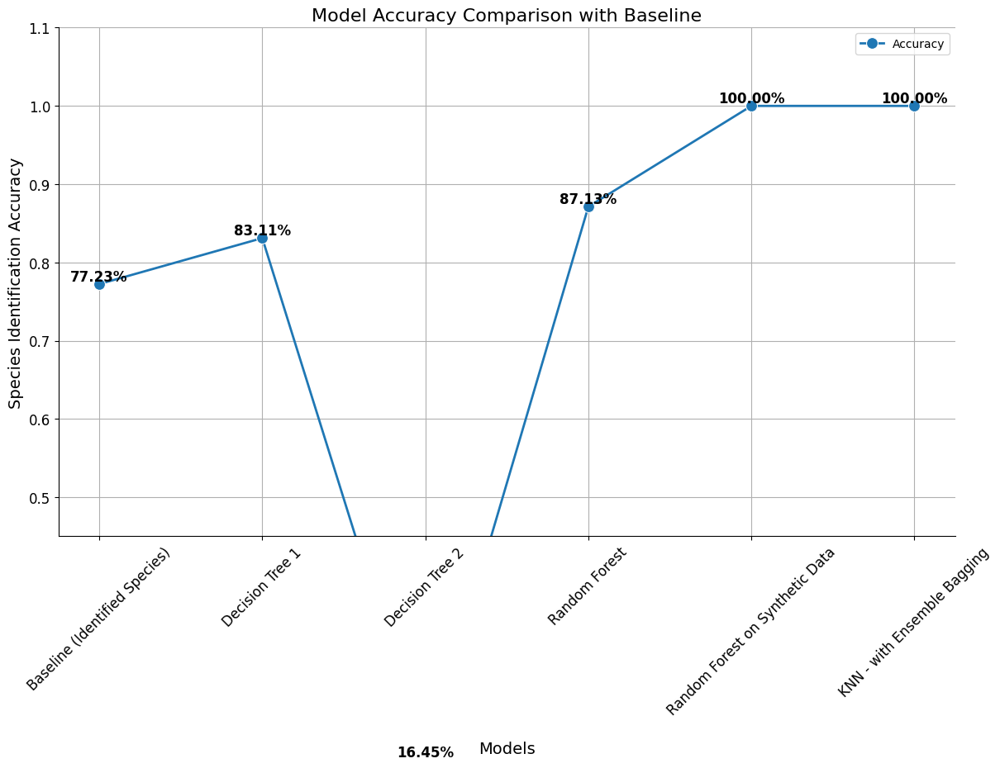

In [279]:
# Define baseline scores and stages for comparison
baseline_scores = [
    match_accuracy,            # Accuracy of the baseline (Identified Species)
    DT_mean_test_accuracy,          # Accuracy of Decision Tree 1
    mean_test_accuracy_DT2,         # Accuracy of Decision Tree 2
    aggregate_metrics(RF_test_accuracies),          # Accuracy of Random Forest
    accuracy_test_rf,          # Accuracy of Random Forest on Synthetic Data
    accuracy_test_knn          # Accuracy of KNN with Ensemble Bagging
]

baseline_stages = [
    'Baseline (Identified Species)',  # Label for the baseline accuracy
    'Decision Tree 1',                # Label for the first Decision Tree model
    'Decision Tree 2',                # Label for the second Decision Tree model
    'Random Forest',                  # Label for the Random Forest model
    'Random Forest on Synthetic Data', # Label for Random Forest with synthetic data
    'KNN - with Ensemble Bagging'     # Label for the KNN model with ensemble bagging
]

# Create a figure and axis object for plotting
plt.figure(figsize=(14, 8))

# Add a line plot comparing the baseline accuracy scores across different models
sns.lineplot(x=baseline_stages, y=baseline_scores, marker='o', markersize=10, linewidth=2, label='Accuracy')

# Annotate each point in the plot with the accuracy score
for i, (stage, score) in enumerate(zip(baseline_stages, baseline_scores)):
    plt.text(i, score, f'{score:.2%}', ha='center', va='bottom', fontsize=12, fontweight='bold')

# Customise the plot
plt.title('Model Accuracy Comparison with Baseline', fontsize=16)
plt.xlabel('Models', fontsize=14, labelpad=20)
plt.ylabel('Species Identification Accuracy', fontsize=14)
plt.ylim(0.45, 1.1)  # Set the y-axis limits for better visualisation
plt.xticks(fontsize=12, rotation=45)  # Rotate x-axis labels for better readability
plt.yticks(fontsize=12)
sns.despine()  # Remove top and right spines for a cleaner look
plt.grid()  # Add grid lines for better visualisation

# Add a legend to the plot
plt.legend()

# Show the plot
plt.show()

## External Validation - using each model to predict species on unseen data
External validation involves evaluating the performance of machine learning models using a dataset that was deliberately excluded from the training and development phases. This approach is critical for testing the models’ generalisation capabilities on genuinely unseen data.

The process of external validation begins with the deliberate exclusion of a subset of data from the initial dataset, specifically earmarked for this purpose. This subset is withheld before the model development phase to ensure that the models are not exposed to it during training, thus preserving its role as novel, unseen data. Once the external validation data is isolated, it is subjected to the same preprocessing procedures applied to the training dataset. This includes standardising features, encoding categorical variables, and performing any other necessary transformations to ensure compatibility with the models. Following preprocessing, the trained models are applied to this external validation dataset. This step involves generating predictions for the unseen data, which allows for a comprehensive assessment of the models’ performance metrics such as accuracy, precision, recall, and F1 score.

Finally, the predictions made by the models are compared to the actual labels of the external validation data, if available. This comparison provides an indication of the models’ effectiveness in generalising to new, real-world data, and helps to identify any issues related to overfitting or model robustness. By employing external validation, the study ensures that the models’ performance is evaluated under conditions that closely mirror practical applications, where models must operate on data not previously encountered during training.

In [257]:
print(external_validation_data)

      occurrence_no identified_rank              accepted_name accepted_rank  max_ma  min_ma         order           family           genus   longitude   latitude Country      state          county           formation    lithology1       lithology2                          assembl_comps             pres_mode preservation_quality fragmentation     specimen_id specimen_part           identified_name_y measurement_type  average  circumference  diameter  height  length  width  overall_ma                    species             state_country age_category  age_category_numeric
451          577481         species          Tyrannosaurus rex       species   72.10    66.0     Theropoda  Tyrannosauridae   Tyrannosaurus -107.083000  47.536201      US    Montana        Garfield          Hell Creek  not reported     not reported                           macrofossils                  body                 good    occasional      LACM 23845          ulna  Albertosaurus megagracilis           length    

In [258]:
# Copy of external validation data for processing
validation_DT = external_validation_data.copy()
validation_DT2 = external_validation_data.copy()
validation_DT3 = external_validation_data.copy()
validation_RF = external_validation_data.copy()
validation_RF2 = external_validation_data.copy()
validation_KNN = external_validation_data.copy()


### Decision Trees Classification Models

#### Decision Tree 1

In [259]:
# Drop unnecessary columns from the external validation data
validation_DT = validation_DT.drop(columns=var_to_drop, axis=1)

# Define the target column
target_column = 'species'

# Separate features and target
validation_X = validation_DT.drop(columns=[target_column])
validation_y = validation_DT[target_column]

# Print the separated features and target for verification
print("Features in validation set:")
print(validation_X)
print('-' * 250)
print("Target in validation set:")
print(validation_y)

Features in validation set:
       longitude   latitude Country      state          county           formation    lithology1       lithology2                          assembl_comps             pres_mode preservation_quality fragmentation specimen_part measurement_type  average  circumference  diameter  height  length  width  overall_ma
451  -107.083000  47.536201      US    Montana        Garfield          Hell Creek  not reported     not reported                           macrofossils                  body                 good    occasional          ulna           length    131.0            0.0       0.0     0.0   131.0    0.0      69.050
338  -107.115555  47.546665      US    Montana        Garfield          Hell Creek     claystone        claystone                           macrofossils                  body                 good          none       humerus           length    800.0            0.0       0.0     0.0   800.0    0.0      69.050
1324  103.564720  44.127499      MN    Omn

In [260]:
# Encode categorical variables in the external validation data
for column in validation_X.select_dtypes(include=['object', 'category']).columns:
    if column in DT_label_encoders:
        # Transform the column using the stored label encoder
        validation_X[column] = DT_label_encoders[column].transform(validation_X[column].astype(str))

# Print the validation data after encoding
print("Validation data after encoding:")
print(validation_X)

Validation data after encoding:
       longitude   latitude  Country  state  county  formation  lithology1  lithology2  assembl_comps  pres_mode  preservation_quality  fragmentation  specimen_part  measurement_type  average  circumference  diameter  height  length  width  overall_ma
451  -107.083000  47.536201       34     60      54         59          11          15              0          0                     1              4             21                 3    131.0            0.0       0.0     0.0   131.0    0.0      69.050
338  -107.115555  47.546665       34     60      54         59           5           9              0          0                     1              2              5                 3    800.0            0.0       0.0     0.0   800.0    0.0      69.050
1324  103.564720  44.127499       24     71     190         44          12          17              0          0                     0              4              2                 1     16.7            0.0      

In [261]:
# Define the selected feature names (these match the feature fitted to the model following feature selection)
selected_features = ['longitude', 'latitude', 'county', 'overall_ma']

# Filter the validation data to include only the selected features
validation_X_filtered = validation_X[selected_features]

# Convert the filtered validation DataFrame to NumPy array
validation_np_filtered = validation_X_filtered.to_numpy()

# Print the NumPy array
print("Validation data as NumPy array:")
print(validation_np_filtered)

Validation data as NumPy array:
[[-107.083      47.536201   54.         69.05    ]
 [-107.115555   47.546665   54.         69.05    ]
 [ 103.56472    44.127499  190.         77.85    ]
 [-111.616669   50.688      43.         77.85    ]
 [   3.633333   50.466667  118.        122.635   ]
 [-105.224701   38.539501   52.        149.25    ]]


In [262]:
# Convert the filtered NumPy array to a DataFrame with the selected feature names
validation_selected_df = pd.DataFrame(validation_np_filtered, columns=selected_features)

# Print the validation data after converting to DataFrame
print("Validation data after conversion to DataFrame:")
print(validation_selected_df)

Validation data after conversion to DataFrame:
    longitude   latitude  county  overall_ma
0 -107.083000  47.536201    54.0      69.050
1 -107.115555  47.546665    54.0      69.050
2  103.564720  44.127499   190.0      77.850
3 -111.616669  50.688000    43.0      77.850
4    3.633333  50.466667   118.0     122.635
5 -105.224701  38.539501    52.0     149.250


In [263]:
# Make predictions on the external validation data
validation_y_pred = best_DT_clf.predict(validation_selected_df)

# Print the predictions
print("Predictions for the external validation data:")
print(validation_y_pred)

species_label_encoder = DT_label_encoders['species']

# Convert the predicted labels back to the original string labels
validation_y_pred_str = species_label_encoder.inverse_transform(validation_y_pred)
results_df = pd.DataFrame({
    'True Labels': validation_y,  # True labels from the validation data
    'Predictions': validation_y_pred_str  # Predictions converted back to string labels
})

# Print the resulting DataFrame
print("Results DataFrame with True Labels and Predicted Labels:")
print(results_df)

# Print a separator for clarity
print('\n' + '-' * 250)

# Determine if predictions are correct
results_df['Correct'] = results_df['True Labels'] == results_df['Predictions']

# Calculate the number of correct predictions
num_correct = results_df['Correct'].sum()
total_predictions = len(results_df)
accuracy_DT1 = num_correct / total_predictions

# Print the tally of correct predictions and accuracy
print(f'Number of correct predictions: {num_correct}')
print(f'Total number of predictions: {total_predictions}')
print(f'Accuracy: {accuracy_DT1:.2%}')

Predictions for the external validation data:
[354 354 367  95 179 330]
Results DataFrame with True Labels and Predicted Labels:
                    True Labels                Predictions
451           Tyrannosaurus rex           Troodon formosus
338        Triceratops horridus           Troodon formosus
1324  Velociraptor mongoliensis        Velocisaurus unicus
57       Daspletosaurus torosus     Daspletosaurus torosus
2636  Iguanodon bernissartensis  Iguanodon bernissartensis
153         Stegosaurus stenops      Stegosaurus ungulatus

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Number of correct predictions: 2
Total number of predictions: 6
Accuracy: 33.33%


/Users/james_smith/Library/Python/3.9/lib/python/site-packages/sklearn/base.py:486: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names



#### Decision Tree 2
Testing Decision Tree 2 on external data is deemed unnecessary, as its performance metrics in both training and test phases were significantly infrequent

### Random Forest

In [264]:
# Drop unnecessary columns from the external validation data
validation_RF = validation_RF.drop(columns=var_to_drop, axis=1)

# Define the target column
target_column = 'species'

# Separate features and target
validation_RF_X = validation_RF.drop(columns=[target_column])
validation_RF_y = validation_RF[target_column]


In [265]:
# Encode categorical variables in the external validation data
for column in validation_RF_X.select_dtypes(include=['object', 'category']).columns:
    if column in label_encoders:
        # Transform the column using the stored label encoder
        validation_RF_X[column] = label_encoders[column].transform(validation_RF_X[column].astype(str))

# Define the selected feature names (these match the feature fitted to the model following feature selection)
RFV_selected_features = ['longitude', 'latitude', 'state', 'county', 'formation', 'lithology1',
       'lithology2', 'average', 'length', 'overall_ma']

In [266]:
# Filter the validation data to include only the selected features
validation_RF_X_filtered = validation_RF_X[RFV_selected_features]

# Convert the filtered validation DataFrame to NumPy array
validation_RF_np_filtered = validation_RF_X_filtered.to_numpy()

# Make predictions on the external validation data
validation_RF_y_pred = best_rf_clf.predict(validation_RF_np_filtered)

In [267]:
# Create the results DataFrame with True Labels and Predicted Labels
results_RF_df = pd.DataFrame({
    'True Label': validation_RF_y,  # True labels from the validation data
    'Predicted Label': validation_RF_y_pred  # Predictions
})

# Print the resulting DataFrame
print("Results DataFrame with True Labels and Predicted Labels:")
print(results_RF_df)

# Print a separator for clarity
print('\n' + '-' * 250)

# Determine if predictions are correct
results_RF_df['Correct'] = results_RF_df['True Label'] == results_RF_df['Predicted Label']

# Calculate the number of correct predictions
num_correct = results_RF_df['Correct'].sum()
total_predictions = len(results_RF_df)
accuracy_RF = num_correct / total_predictions

# Print the tally of correct predictions and accuracy
print(f'Number of correct predictions: {num_correct}')
print(f'Total number of predictions: {total_predictions}')
print(f'Accuracy: {accuracy_RF:.2%}')

Results DataFrame with True Labels and Predicted Labels:
                     True Label            Predicted Label
451           Tyrannosaurus rex  Ankylosaurus magniventris
338        Triceratops horridus       Triceratops horridus
1324  Velociraptor mongoliensis  Velociraptor mongoliensis
57       Daspletosaurus torosus     Daspletosaurus torosus
2636  Iguanodon bernissartensis  Iguanodon bernissartensis
153         Stegosaurus stenops     Brontosaurus yahnahpin

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Number of correct predictions: 4
Total number of predictions: 6
Accuracy: 66.67%


### Random Forest 2

In [268]:
# Drop unnecessary columns from the external validation data
validation_RF2 = validation_RF2.drop(columns=var_to_drop, axis=1)

# Define the target column
target_column = 'species'

# Separate features and target
validation_RF2_X = validation_RF2.drop(columns=[target_column])
validation_RF2_y = validation_RF2[target_column]

In [269]:
# One-hot encode categorical features to match training data
validation_RF2_X_encoded = pd.get_dummies(validation_RF2_X, drop_first=True)

In [270]:
print(validation_RF2_X_encoded.columns.tolist())
print(all_selected_features)

['longitude', 'latitude', 'average', 'circumference', 'diameter', 'height', 'length', 'width', 'overall_ma', 'Country_CA', 'Country_MN', 'Country_US', 'state_Colorado', 'state_Montana', 'state_Omnogov', 'state_Sauerland', 'county_Fremont', 'county_Garfield', 'county_Nord', 'county_Булган ᠪᠤᠯᠠᠭᠠᠨ', 'formation_Hell Creek', 'formation_Morrison', 'formation_Oldman', 'formation_Sainte-Barbe Clays', 'lithology1_not reported', 'lithology1_sandstone', 'lithology2_claystone', 'lithology2_not reported', 'lithology2_sandstone', 'assembl_comps_macrofossils,mesofossils', 'assembl_comps_macrofossils,mesofossils,microfossils', 'pres_mode_body,trace,coprolite', 'preservation_quality_good', 'preservation_quality_not reported', 'fragmentation_none', 'fragmentation_occasional', 'fragmentation_frequent', 'fragmentation_extreme', 'specimen_part_humerus', 'specimen_part_ulna', 'measurement_type_diameter', 'measurement_type_length']
['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN', 'Coun

In the context of machine learning model evaluation, the training dataset, being substantially larger, resulted in a more extensive set of features following one-hot encoding. Consequently, many features present in the training data were absent in the validation dataset, which comprises only six species. This discrepancy arises because the validation data, being relatively limited in size, does not encompass all the categories covered in the training data.

In [271]:
# Reindex validation data to match training data columns
validation_RF2_X_encoded = validation_RF2_X_encoded.reindex(columns=all_selected_features, fill_value=False)

To address this issue and ensure compatibility between the training and validation datasets, the validation data is reindexed to include all features present in the training data. Missing features are incorporated into the validation dataset with default values, such as zero for numerical features or False for binary features. This process maintains the consistency of the feature space between the two datasets, allowing the model to be applied to the validation data without errors related to feature mismatches. Importantly, this adjustment does not affect the target values within the validation dataset, thereby preserving the integrity of the model’s evaluation.

In [272]:
print(validation_RF2_X_encoded.columns.tolist())
print(all_selected_features)

['Country_AU', 'Country_BE', 'Country_BR', 'Country_CA', 'Country_CN', 'Country_DE', 'Country_ES', 'Country_FR', 'Country_HU', 'Country_KG', 'Country_LS', 'Country_MG', 'Country_MN', 'Country_NE', 'Country_RO', 'Country_RU', 'Country_TZ', 'Country_UK', 'Country_US', 'Country_ZA', 'state_Alberta', 'state_Amur', 'state_Aragón', 'state_Baden-Württemberg', 'state_Basse-Normandie', 'state_Bayern', 'state_Castilla-La Mancha', 'state_Chubut', 'state_Colorado', 'state_Dornogov', 'state_England', 'state_Free State', 'state_Hunedoara', 'state_Jalal-Abad', 'state_Kansas', 'state_La Rioja', 'state_Liaoning', 'state_Lindi', 'state_Mafeteng', 'state_Mahajanga', 'state_Maryland', 'state_Minas Gerais', 'state_Montana', 'state_Nei Mongol', 'state_Neuquén', 'state_New Mexico', 'state_Niedersachsen', 'state_Omnogov', 'state_Ovorkhangai', 'state_Queensland', 'state_Río Negro', 'state_Sauerland', 'state_Sichuan', 'state_Texas', 'state_Utah', 'state_Veszprém', 'state_Wyoming', 'state_Xinjiang', 'county_Arkh

In [273]:
# Reorder columns to match the training data feature order
validation_RF2_X_encoded = validation_RF2_X_encoded[all_selected_features]

# Convert the filtered DataFrame to NumPy array
validation_RF2_np_filtered = validation_RF2_X_encoded.to_numpy()

# Make predictions on the external validation data
validation_RF2_y_pred = RF2_model.predict(validation_RF2_X_encoded)

In [274]:
# Create a DataFrame with the true labels and predictions
results_df_RF2 = pd.DataFrame({
    'True Labels': validation_RF2_y,
    'Predictions': validation_RF2_y_pred
})

# Print the results
print(results_df_RF2)

# Print a separator for clarity
print('\n' + '-' * 250)

# Determine if predictions are correct
results_df_RF2['Correct'] = results_df_RF2['True Labels'] == results_df_RF2['Predictions']

# Calculate the number of correct predictions
num_correct = results_df_RF2['Correct'].sum()
total_predictions = len(results_df_RF2)
accuracy_RF2 = num_correct / total_predictions

# Print the tally of correct predictions and accuracy
print(f'Number of correct predictions: {num_correct}')
print(f'Total number of predictions: {total_predictions}')
print(f'Accuracy: {accuracy_RF2:.2%}')

                    True Labels                     Predictions
451           Tyrannosaurus rex    Montanoceratops cerorhynchus
338        Triceratops horridus        Thescelosaurus neglectus
1324  Velociraptor mongoliensis             Mononykus olecranus
57       Daspletosaurus torosus             Struthiomimus altus
2636  Iguanodon bernissartensis  Mantellisaurus atherfieldensis
153         Stegosaurus stenops             Stegosaurus stenops

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Number of correct predictions: 1
Total number of predictions: 6
Accuracy: 16.67%


### KNN Ensemble with Bagging

In [275]:
# Drop unnecessary columns from the external validation data
validation_KNN = validation_KNN.drop(columns=var_to_drop, axis=1)

# Define the target column
target_column = 'species'

# Separate features and target
validation_KNN_X = validation_KNN.drop(columns=[target_column])
validation_KNN_y = validation_KNN[target_column]

# One-hot encode categorical features to match training data
validation_KNN_X_encoded = pd.get_dummies(validation_KNN_X, drop_first=True)

# Reindex validation data to match training data columns
validation_KNN_X_encoded = validation_KNN_X_encoded.reindex(columns=all_selected_features, fill_value=0)

# Reorder columns to match the training data feature order
validation_KNN_X_encoded = validation_KNN_X_encoded[all_selected_features]

# Convert the filtered DataFrame to NumPy array
validation_KNN_np_filtered = validation_KNN_X_encoded.to_numpy()

# Make predictions on the external validation data
validation_KNN_y_pred = best_bagging_knn.predict(validation_KNN_X_encoded)

# Create a DataFrame with the true labels and predictions
validation_KNN_selected_df = pd.DataFrame({
    'True Labels': validation_KNN_y,
    'Predictions': validation_KNN_y_pred
})

# Print the results
print(validation_KNN_selected_df)

# Print a separator for clarity
print('\n' + '-' * 250)

# Determine if predictions are correct
validation_KNN_selected_df['Correct'] = validation_KNN_selected_df['True Labels'] == validation_KNN_selected_df['Predictions']

# Calculate the number of correct predictions
num_correct = validation_KNN_selected_df['Correct'].sum()
total_predictions = len(validation_KNN_selected_df)
accuracy_KNN = num_correct / total_predictions

# Print the tally of correct predictions and accuracy
print(f'Number of correct predictions: {num_correct}')
print(f'Total number of predictions: {total_predictions}')
print(f'Accuracy: {accuracy_KNN:.2%}')

                    True Labels                Predictions
451           Tyrannosaurus rex          Rahonavis ostromi
338        Triceratops horridus     Titanoceratops ouranos
1324  Velociraptor mongoliensis       Alectrosaurus olseni
57       Daspletosaurus torosus        Amargasaurus cazaui
2636  Iguanodon bernissartensis  Muttaburrasaurus langdoni
153         Stegosaurus stenops    Ferganasaurus verzilini

----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
Number of correct predictions: 0
Total number of predictions: 6
Accuracy: 0.00%


### Model Field Test Results

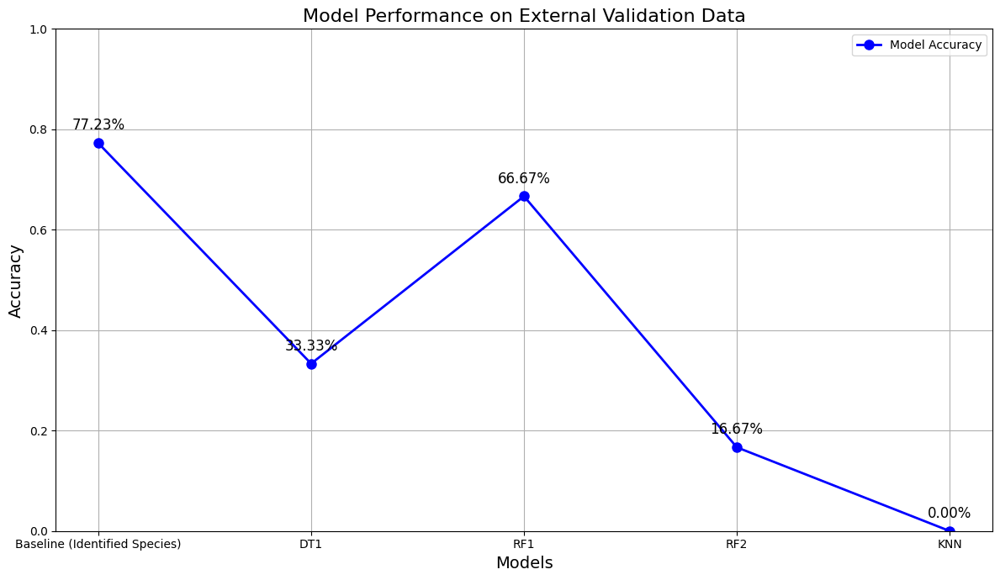

In [280]:
# Define model names and their corresponding accuracies in the desired order
models = ['Baseline (Identified Species)', 'DT1', 'RF1', 'RF2', 'KNN']
accuracies = [match_accuracy, accuracy_DT1, accuracy_RF, accuracy_RF2, accuracy_KNN]

# Create a line plot
plt.figure(figsize=(12, 7))
plt.plot(models, accuracies, marker='o', linestyle='-', color='b', markersize=8, linewidth=2, label='Model Accuracy')

# Add labels and title
plt.xlabel('Models', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Model Performance on External Validation Data', fontsize=16)
plt.ylim(0, 1)  # Accuracy ranges from 0 to 1

# Add accuracy labels on top of each marker
for i, accuracy in enumerate(accuracies):
    plt.text(
        models[i],
        accuracy + 0.02,
        f'{accuracy:.2%}',
        ha='center',
        va='bottom',
        fontsize=12
    )

# Add legend
plt.legend()

# Show plot
plt.tight_layout()
plt.grid(True)
plt.show()

The project, titled PaleoPredictive Modelling: Leveraging Machine Learning for Fossil Species Classification, aimed to evaluate the applicability and effectiveness of machine learning techniques in palaeontological research. The primary goal was to develop predictive models for classifying fossil species using various data inputs, including skeletal measurements and discovery characteristics, thereby offering new insights into the ancient past. This analysis examined the performance of three key models: the Decision Tree, a pruned Decision Tree (DT2), and the Random Forest.

The Decision Tree model, configured with a maximum depth of 15 and featuring geographical and temporal data, demonstrated strong performance with an accuracy of 0.83 across both training and testing phases. This model effectively managed classification tasks and showed good generalisation capabilities as evidenced by consistent precision, recall, and F1 scores. However, the model’s performance was hindered by class imbalance, suggesting that stratified sampling or resampling methods might improve evaluation robustness.

Conversely, the pruned Decision Tree (DT2), which had its depth reduced from 15 to 5, aimed to address overfitting. Although this adjustment improved the learning curve by narrowing the gap between training and cross-validation scores, it led to a significant decline in performance metrics. This reduction in model complexity resulted in underfitting, highlighting the challenge of balancing model complexity with generalisation.

The Random Forest model, with 100 trees and a maximum depth of 15, exhibited the highest performance among the models, achieving a training accuracy of 0.97 and a testing accuracy of 0.87. This model’s ensemble approach reduced variance and mitigated overfitting, making it effective for fossil species classification. Nonetheless, addressing data imbalance and further parameter refinement could enhance its performance.

To address challenges related to sample size imbalances and class distribution, advanced synthetic data generation techniques were employed. Methods such as the Synthetic Minority Over-sampling Technique (SMOTE), undersampling, and ensemble bagging were used to enhance dataset robustness. Two additional models were developed with this enhanced data: the Bagging Classifier with K-Nearest Neighbours (KNN) and an extended Random Forest model (RF2). Both models achieved perfect training metrics, but demonstrated severe overfitting, with significant discrepancies between training and cross-validation scores. This indicated excessive sensitivity to the training data and highlighted the need for further model refinement and feature selection techniques.

External validation of the models, involving a deliberately withheld subset of data, revealed varied performance outcomes. The Decision Tree model (DT1) achieved an accuracy of 33.33%, reflecting limited generalisation capabilities. The pruned Decision Tree (DT2) was not assessed due to prior performance issues. The Random Forest model (RF1) demonstrated a better accuracy of 66.67%, though still below the baseline. The extended Random Forest (RF2) and K-Nearest Neighbours (KNN) models showed significantly lower accuracies of 16.67% and 0.00%, respectively, underscoring severe overfitting and poor generalisation.

In comparison, traditional palaeontological methods achieved a baseline accuracy of 77.21%, reflecting effective species identification. The machine learning models, while promising, fell short of this benchmark, highlighting the ongoing challenges in achieving robust performance. These results underscore the necessity for further model refinement, exploration of alternative algorithms, and advanced techniques to improve predictive accuracy and address class imbalance in palaeontological research.

Overall, the study highlights the potential of machine learning to enhance palaeontological research but also underscores the challenges faced in achieving robust and generalisable models. While some models demonstrated promising performance, the results indicated the need for further refinement, including improved handling of class imbalance and exploration of alternative algorithms. The findings suggest that while machine learning offers valuable tools for fossil species classification, it must be complemented by continued efforts to address the inherent limitations and uncertainties associated with fossil data.

**Contributions to the Field**

This study has made several notable contributions to the field of palaeontology:

- **Integration of Machine Learning in Palaeontology:** The study’s integration of machine learning techniques into palaeontological research represents a significant advancement, offering a novel computational approach for fossil classification. This integration has demonstrated the potential of advanced algorithms to uncover complex patterns in fossil datasets that traditional methods might overlook. Despite the challenges encountered, such as overfitting and class imbalance, the use of machine learning highlights a new paradigm for enhancing the precision and scope of fossil species identification.
- **Improvement over Traditional Methods:** While the machine learning models developed in this study showed promise, particularly the Random Forest model, the results indicate that, in some cases, these models did not consistently outperform traditional palaeontological methods. The baseline accuracy achieved by conventional methods (77.21%) still surpasses the performance of the machine learning models, suggesting that while computational models offer potential, further refinement is needed to reach or exceed the accuracy of traditional approaches.
- **Comprehensive Framework for Classification:** The study has established a comprehensive framework for fossil classification by incorporating diverse attributes, such as geographical location, physical measurements, geological age, and lithological context. This framework offers a solid foundation for understanding the variables influencing fossil identification and sets the stage for future enhancements in model development.
- **Future Research Directions:** The study has identified several key areas for future research, including improving model generalisation, addressing class imbalance, and expanding datasets. These insights provide valuable guidance for advancing palaeontological research and highlight the need for continued exploration of advanced techniques to enhance predictive accuracy.
- **Benchmarking Computational Approaches:** The comparative evaluation of machine learning models against traditional methods has established a benchmark for assessing computational approaches in palaeontology. This validation is crucial for understanding the practical applicability of these models and setting standards for future innovations.
- **Interdisciplinary Collaboration and Practical Applications:** The integration of machine learning into palaeontology has fostered interdisciplinary collaboration and potentially influenced related fields such as geology and evolutionary biology. The practical applications of the models in guiding excavation and identifying fossil sites also underscore the real-world impact of incorporating computational tools into palaeontological research.

Overall, the study has made notable contributions by demonstrating the potential of machine learning to refine fossil classification, highlighting areas for further improvement, and setting a foundation for future advancements in the field.

**Future Research Directions**

This study has illustrated the promising potential of machine learning models in predicting species identification, demonstrating notable accuracy in various cases. Despite these advances, several challenges remain that necessitate further research to refine and enhance these models.

A primary focus for future research should be increasing sample sizes, especially for species represented by limited specimens. The rarity of fossils and incomplete records constrain this task, but overcoming these limitations could significantly improve model accuracy and reliability.

Expanding data collection to include underrepresented regions could provide a more comprehensive dataset, potentially revealing new patterns and enhancing model generalisation. Broadening the geographical scope of fossil data collection will contribute to a more robust understanding of fossil diversity and distribution.

Integrating information on the evolution of geological formations over different periods could enable models to correlate modern countries and fossil discoveries with their historical geological contexts. This contextual enhancement could improve the accuracy of fossil classification by aligning fossils with their appropriate temporal and spatial settings.

Advancements in artificial intelligence and machine learning techniques could facilitate the development of models capable of identifying novel species and distinguishing between new discoveries and known species. Such improvements would expand the scope of species identification and classification.

Enhancing models to differentiate between juvenile specimens and entirely new species could provide deeper insights into developmental stages and improve classification accuracy. Sophisticated AI methods would be essential for achieving this capability.

Exploring the potential of machine learning models to predict fossil preservation states and assess fossil quality could further enhance their applicability. This advancement would enable researchers to prioritise specimens for detailed analysis, thereby improving research efficiency.

Finally, ongoing advancements in technology, including more sophisticated AI algorithms and improved data acquisition methods, should be considered to further refine and expand the application of machine learning in palaeontology. Continuous technological innovation will be crucial for advancing model capabilities and their integration into palaeontological research.

Addressing these areas will contribute to the development of more reliable and versatile models, ultimately enhancing their applicability and trustworthiness in the field of palaeontology.


# References

- Benton, M. J., et al. (2010). “Biodiversity on land and in the sea.” Paleobiology, 36(3), 299-317.
- Carroll, R. L. (2001). Vertebrate Paleontology and Evolution. W. H. Freeman.
- Chambers, J. M., Cleveland, W. S., Kleiner, B., & Tukey, P. A. (1983). Graphical Methods for Data Analysis. Wadsworth & Brooks/Cole.
- Chawla, N. V., Lazarevic, A., Hall, L. O., & Bowyer, K. W. (2002). “SMOTE: Synthetic Minority Over-sampling Technique.” Journal of Artificial Intelligence Research, 16, 321-357.
- Cheng, J., & Han, J. (2017). “Data Cleaning: Problems and Current Approaches.” IEEE Transactions on Knowledge and Data Engineering, 29(1), 1-11.
- Choi, Y., Kim, H., & Kim, T. (2017). “A Hybrid Oversampling Method for Imbalanced Learning.” Journal of Computational Science, 20, 195-204.
- Cleveland, W. S. (1993). Visualizing Data. Hobart Press.
- Currie, P. J. (2003). “Gorgosaurus libratus.” In The Dinosauria (2nd ed., pp. 565-570). University of California Press.
- Currie, P. J., & Varricchio, D. J. (2004). “The osteology and relationships of dromaeosaurid theropods.” Canadian Journal of Earth Sciences, 41(6), 925-939.
- Currie, P. J., & Zhao, X. (1994). “A new oviraptorid dinosaur from the Late Cretaceous of China.” Palaeontology.
- Dodson, P. (1990). The Dinosauria. University of California Press.
- Falkingham, P. L., et al. (2011). “Bias in the fossil record: The role of preservation in the detection and interpretation of vertebrate ichnofossils.” Journal of Paleontology, 85(4), 690-706.
- Falkingham, P. L., et al. (2018). “Dinosaur trackways and the limits of fossil preservation.” Journal of Vertebrate Paleontology, 38(5), e1551385.
- Galton, P. M., & Upchurch, P. (2004). “The dinosaur family Hypsilophodontidae: A review.” Journal of Vertebrate Paleontology, 24(4), 1005-1021.
- Galton, P. M., & Upchurch, P. (2004). The Dinosauria. University of California Press.
- Gould, S. J. (1989). Wonderful Life: The Burgess Shale and the Nature of History. W. W. Norton & Company.
- Hadley, W. (2021). R for Data Science: Import, Tidy, Transform, Visualize, and Model Data. O’Reilly Media.
- Hastie, T., Tibshirani, R., & Friedman, J. (2009). The Elements of Statistical Learning: Data Mining, Inference, and Prediction. Springer.
- He, H., & Garcia, E. A. (2009). “Learning from Imbalanced Data.” IEEE Transactions on Knowledge and Data Engineering, 21(9), 1263-1284.
- Hone, D. W. E. (2018). The Future of Dinosaurs. Springer.
- Horner, J. R., Goodwin, M. B., & Farlow, J. O. (1992). “The skull of the theropod dinosaur Thescelosaurus and implications for its behavior and relationships.” Journal of Vertebrate Paleontology, 12(3), 491-501.
- Kirkland, J. I., Madsen, J. H., & Burge, D. (1998). “A new species of ankylosaurian dinosaur from the Upper Cretaceous of Utah.” Journal of Vertebrate Paleontology, 18(3), 469-488.
- Liu, X. Y., Wu, J., & Zhou, Z. H. (2009). “Exploratory Under-sampling for Class-Imbalance Learning.” Proceedings of the 2009 IEEE International Conference on Data Mining, 275-284.
- Mannion, P. D., et al. (2014). “The fossil record of sauropod dinosaurs: An evaluation of diversity and biases.” Palaeontology, 57(2), 213-235.
- Owen, R. (1840). “On the Anatomy of the Fossil Reptiles of the Lias.” Philosophical Transactions of the Royal Society of London, 130, 133-163.
- Paleobiology Database. (2024). Paleobiology Database. Retrieved from https://paleobiodb.org/
- Peters, S. E., & Foote, M. (2001). “The role of environmental factors in the preservation and discovery of fossils.” Paleobiology, 27(4), 618-635.
- Saito, K., & Rehmsmeier, M. (2015). “The Precision-Recall Plot Is More Informative than the ROC Plot When Evaluating Binary Classifiers on Imbalanced Datasets.” PLoS ONE, 10(3), e0118432.
- Sander, P. M., et al. (2008). “The paleobiology of sauropod dinosaurs.” Paleobiology, 34(4), 474-491.
- Schur, E., et al. (2014). “CT imaging and reconstruction of dinosaur fossils.” Journal of Paleontological Techniques, 20(2), 56-67.
- Sereno, P. C. (1998). “A rationale for the classification of dinosaurs.” Science, 280(5368), 1190-1191.
- Smith, A. B. (2003). The Fossil Record 2. Chapman & Hall.
- Smith, A. B., et al. (2016). “Understanding bias in the fossil record: A review of quantitative approaches.” Journal of Vertebrate Paleontology, 36(4), e1080343.
- Smith, N. D., Forster, C. A., & Galton, P. M. (2005). “The anatomy of Carcharodontosaurus and its implications for the evolution of theropods.” Palaeontology, 48(6), 1483-1514.
- Sullivan, R. M., & Horner, J. R. (1999). “The vertebrate fauna of the Upper Cretaceous Two Medicine Formation of Montana.” In Dinosaur Systematics: Perspectives and Approaches. Cambridge University Press, 115-130.
- Tukey, J. W. (1977). Exploratory Data Analysis. Addison-Wesley.
- Vickaryous, M. K., Maryanska, T., & Weishampel, D. B. (2004). “The ankylosauria.” In The Dinosauria. University of California Press, 363-392.
- Welles, S. P. (1984). The Skull of Eustreptospondylus. University of California Publications in Geological Sciences.
- Wilson, J. A., & Upchurch, P. (2003). “A review of sauropod diversity and classification.” In The Sauropods: Evolution and Paleobiology. University of California Press, 115-156.
- Wilson, J. A., & Upchurch, P. (2003). “Sauropod dinosaurs.” In The Dinosauria (2nd ed., pp. 345-356). University of California Press.
- Zhao, X., & Currie, P. J. (1993). “A new oviraptorid dinosaur from the Late Cretaceous of China.” Palaeontology.